In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
sys.path.append("C:/Users/zhipe/OneDrive/Desktop/Master thesis/demostration")

from causal_ensemble_model import *
from utilities_ensemble import *
from utilities_plotting import *
import numpy as np
import pandas as pd
import seaborn as sns 
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import accuracy_score
from scipy import stats
import matplotlib.pyplot as plt

$${B(t+1)} = 0.15{B(t)}{\ln}({D(t-3)}) + 1.03{D(t-2)}{B(t-1)} - 0.89{D(t)}^{3}{D(t-3)} + {\epsilon}_{1}$$
$${C(t+1)} = 0.72{C(t-1)} + 0.57{A(t)}^2 - 0.79{A(t-4)}{C(t-2)}^{2} + {\epsilon}_{2}$$
$${E(t+1)} = -0.85{I(t-5)}{I(t)} + 0.46{\sin}({I(t)}^{2}){E(t-3)} + {\epsilon}_{3}$$
$${F(t+1)} = 0.59{H(t-1)} - 0.68{I(t)} + 0.47{H(t-3)}{I(t-4)} + {\epsilon}_{4}$$
$${H(t+1)} = 0.88{A(t)}{\cos}({D(t-4)}) - 0.84{D(t)}{\sin}({A(t-3)}) + {\epsilon}_{5}$$
$${J(t+1)} = 0.54{K(t-2)}{B(t-4)} - 0.58{K(t-1)}{J(t-4)} + {\epsilon}_{6}$$

A->C D->B A,D->H I->E  
H,I->F  B,K->J

In [2]:
result = np.array([
    [0.,0.,1.,0.,0.,0.,0.,1.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,1.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,1.,0.,0.,0.,0.,0.,1.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,1.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,1.,1.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,0.,0.],
    [0.,0.,0.,0.,0.,0.,0.,0.,0.,1.,0.]
 ])

In [3]:
np.random.seed(36)
A = np.random.rand(30006) 
np.random.seed(124)
B = np.random.rand(30006) 
np.random.seed(12)
C = np.random.rand(30006) 
np.random.seed(95)
D = np.random.rand(30006) 
np.random.seed(54)
E = np.random.rand(30006) 
np.random.seed(6)
F = np.random.rand(30006) 
np.random.seed(654)
G = np.random.rand(30006) 
np.random.seed(36)
H = np.random.rand(30006) 
np.random.seed(21)
I = np.random.rand(30006) 
np.random.seed(56)
J = np.random.rand(30006) 
np.random.seed(244)
K = np.random.rand(30006) 

np.random.seed(43)
e_1 = np.random.normal(size=(30006,)) / 100
np.random.seed(200)
e_2 = np.random.normal(size=(30006,)) / 100
np.random.seed(83)
e_3 = np.random.normal(size=(30006,)) / 100
np.random.seed(66)
e_4 = np.random.normal(size=(30006,)) / 100
np.random.seed(120)
e_5 = np.random.normal(size=(30006,)) / 100
np.random.seed(8)
e_6 = np.random.normal(size=(30006,)) / 100



list_0 = np.linspace(5,30004,30000).astype(int)
for i in list_0:
    B[i+1] = 0.15 * B[i] * np.log(D[i-3]) + 1.03 * D[i-2] * B[i-1] - 0.82 * D[i] ** 3 * D[i-3] + e_1[i]
    C[i+1] = 0.72 * C[i-1] + 0.57 * A[i] ** 2 - 0.79 * A[i-4] * C[i-2] ** 2 + e_2[i]
    E[i+1] = -0.85 * I[i-5] * I[i] + 0.46 * np.sin(I[i] ** 2) * E[i-3] + e_3[i]
    H[i+1] = 0.88 * A[i] * np.cos(D[i-4]) - 0.84 * D[i] * np.sin(A[i-3]) + e_5[i]
for i in list_0:
    F[i+1] = 0.59 * H[i-1] - 0.68 * I[i] + 0.47 * H[i-3] * I[i-4] + e_4[i]
    J[i+1] = 0.54 * K[i-2] * B[i-4] - 0.58 * K[i-1] * J[i-4] + e_6[i]

A_0 = A[6:] * 100
B_0 = B[6:] * 100
C_0 = C[6:] * 100
D_0 = D[6:] * 100
E_0 = E[6:] * 100
F_0 = F[6:] * 100
G_0 = G[6:] * 100
H_0 = H[6:] * 100
I_0 = I[6:] * 100
J_0 = J[6:] * 100
K_0 = K[6:] * 100

df = pd.DataFrame({'A': A_0, 'B': B_0, 'C': C_0, 'D': D_0, 'E': E_0, 'F': F_0, 'G': G_0, 
                   'H': H_0, 'I': I_0, 'J': J_0, 'K': K_0})

In [4]:
df

,A,B,C,D,E,F,G,H,I,J,K
0,18.655681,-20.193824,-5.003370,72.423768,0.873412,58.676476,66.172517,-28.172036,30.227189,16.965011,99.048429
1,25.915124,-5.855454,67.896255,48.208699,-3.822906,2.770316,65.779945,0.379198,66.391029,-4.539241,63.103804
2,62.976234,-20.418306,-8.844405,75.607720,-41.182340,-59.588073,74.349148,-11.690017,30.811439,-3.692074,64.735407
3,3.256092,-33.491736,70.639930,97.473999,2.674350,-16.564380,84.470134,24.982614,58.359128,8.398452,51.136908
4,94.723207,-63.956899,-18.743163,50.836710,-11.120305,-46.967570,56.636473,-13.439313,6.957095,-20.226179,72.124955
...,...,...,...,...,...,...,...,...,...,...,...
29995,35.238615,-2.032411,-inf,4.337239,-49.310701,-40.392231,88.585388,23.006880,92.088998,0.618325,37.748109
29996,36.824934,-2.006745,-inf,17.853589,-57.162950,-41.509645,34.700956,27.274819,46.698678,-4.697494,22.351851
29997,56.254869,0.441663,-inf,42.809757,-41.043374,-14.928292,55.951200,30.820898,94.036400,-0.616858,64.580041
29998,60.483128,-0.678652,-inf,91.116624,-36.711824,-51.170224,69.405506,28.904405,36.674181,0.412704,82.193834


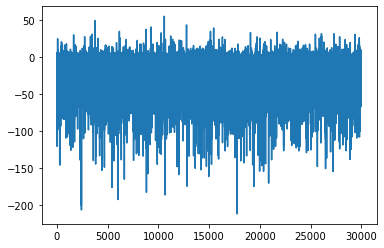

In [5]:
X = np.linspace(0,29999,30000)
y = B_0
plt.plot(X,y)

In [6]:
data_use = df
feature_names = data_use.columns.tolist()

In [7]:
df_process = df.copy()

for i in feature_names:
    q3, q1 = np.percentile(df_process[i], [90 ,10])
    iqr = q3 - q1
    upper = q3 + 2 * iqr
    lower = q1 - 2 * iqr
    df_process[i][df_process[i]>upper] = (upper + 0.01)
    df_process[i][df_process[i]<lower] = (lower - 0.01)

    n = len(df_process)
    j = 1
    while j < (n-1):
        if df_process[i][j] > upper or df_process[i][j] < lower:
            n_start = j-1
            n_end = j+1
            for k in range(n):
                if df_process[i][n_end] > upper or df_process[i][n_end] < lower:
                    n_end += 1
                    if n_end == n-1:
                        break
                else: 
                    break
            num = n_end - n_start - 1
            for l in range(num):
                df_process[i][j+l] = ((df_process[i][n_end] 
                                       - df_process[i][n_start]) 
                                      / (num+1) 
                                      * (l+1) 
                                      + df_process[i][n_start])
            j += num
        j += 1
                              
df_process          


,A,B,C,D,E,F,G,H,I,J,K
0,18.655681,-20.193824,-5.003370,72.423768,0.873412,58.676476,66.172517,-28.172036,30.227189,16.965011,99.048429
1,25.915124,-5.855454,67.896255,48.208699,-3.822906,2.770316,65.779945,0.379198,66.391029,-4.539241,63.103804
2,62.976234,-20.418306,-8.844405,75.607720,-41.182340,-59.588073,74.349148,-11.690017,30.811439,-3.692074,64.735407
3,3.256092,-33.491736,70.639930,97.473999,2.674350,-16.564380,84.470134,24.982614,58.359128,8.398452,51.136908
4,94.723207,-63.956899,-18.743163,50.836710,-11.120305,-46.967570,56.636473,-13.439313,6.957095,-20.226179,72.124955
...,...,...,...,...,...,...,...,...,...,...,...
29995,35.238615,-2.032411,-448.204163,4.337239,-49.310701,-40.392231,88.585388,23.006880,92.088998,0.618325,37.748109
29996,36.824934,-2.006745,-448.268288,17.853589,-57.162950,-41.509645,34.700956,27.274819,46.698678,-4.697494,22.351851
29997,56.254869,0.441663,-448.332413,42.809757,-41.043374,-14.928292,55.951200,30.820898,94.036400,-0.616858,64.580041
29998,60.483128,-0.678652,-448.396539,91.116624,-36.711824,-51.170224,69.405506,28.904405,36.674181,0.412704,82.193834


In [8]:
ce = causal_ensemble(df_process, feature_names, num_parts=12, threshold=0.3)

# 1. CCM 

In [30]:
causal_ccm_parts = ce.ccm(lag=1, 
                          embed=6, 
                          split_percent=0.75, 
                          num_iter=25, 
                          convergence_threshold=0.03)

In [31]:
causal_ccm_parts

array([[[0.    , 0.    , 0.6443, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.3078, 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ]],

       [[0.    , 0.    , 0.6561, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.3376, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ]],

       [[0.    , 0.    , 0.6541, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.3529, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 2. TE

In [11]:
causal_nte_parts = ce.nte(k=6, max_lag=6)

In [12]:
causal_nte_parts

array([[[0.    , 0.    , 0.7674, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ]],

       [[0.    , 0.    , 0.7623, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.3985],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ]],

       [[0.    , 0.    , 0.75  , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.3461, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 3. PCMCI

In [13]:
pc_alpha = [0.01, 0.02, 0.03, 0.04, 0.05]
causal_pcmciplus_parts = ce.pcmciplus(max_lag=6, 
                                      pc_alpha=pc_alpha, 
                                      cond_ind_test='parCorr')


##
## Optimizing pc_alpha over pc_alpha_list = [0.01, 0.02, 0.03, 0.04, 0.05]
##

## pc_alpha = 0.01 (1/5):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.01]
max_conds_dim = None
max_combinations = 1



## Variable A

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/66):

##
## Optimizing pc_alpha over pc_alpha_list = [0.01, 0.02, 0.03, 0.04, 0.05]
##

## pc_alpha = 0.01 (1/5):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.01]
max_conds_dim = None
max_combinations = 1



## Variable A

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/66):

##
## Optimizing pc_alpha over pc_alpha_list = [0.01, 0.02, 0.03, 0.04, 0.05]
##

## pc_alpha = 0.01 (1/5):

##
## 

    Link (B -6) --> A (12/66):    Subset 0: () gives pval = 0.17240 / val = -0.022    Non-significance detected.

    Link (B -3) --> A (9/66):
    Subset 0: () gives pval = 0.46966 / val = -0.012



    Link (C -1) --> A (13/66):

    Subset 0: () gives pval = 0.94506 / val =  0.001    Non-significance detected.

    Link (C -1) --> A (13/66):

    Subset 0: () gives pval = 0.70258 / val =  0.006
    Non-significance detected.

    Link (B -5) --> A (11/66):
    Non-significance detected.

    Link (B -3) --> A (9/66):
    Non-significance detected.

    Link (B -6) --> A (12/66):
    Subset 0: () gives pval = 0.87506 / val = -0.003    Subset 0: () gives pval = 0.50212 / val =  0.011
    Non-significance detected.

    Link (B -5) --> A (11/66):

    Non-significance detected.    Subset 0: () gives pval = 0.40011 / val =  0.014
    Non-significance detected.

    Link (B -4) --> A (10/66):


    Link (B -5) --> A (11/66):    Subset 0: () gives pval = 0.31326 / val = -0.016    Subset 0

    Subset 0: () gives pval = 0.13918 / val = -0.024
    Non-significance detected.

    Link (E -3) --> A (27/66):

    Non-significance detected.

    Link (E -2) --> A (26/66):
    Subset 0: () gives pval = 0.75052 / val =  0.005
    Subset 0: () gives pval = 0.08215 / val = -0.028    Subset 0: () gives pval = 0.62048 / val = -0.008    Subset 0: () gives pval = 0.83137 / val = -0.003    Non-significance detected.

    Link (D -3) --> A (21/66):
    Subset 0: () gives pval = 0.20363 / val =  0.021
    Non-significance detected.

    Link (E -3) --> A (27/66):

    Non-significance detected.

    Link (E -5) --> A (29/66):


    Subset 0: () gives pval = 0.85044 / val = -0.003    Subset 0: () gives pval = 0.59762 / val =  0.009    Non-significance detected.

    Link (E -1) --> A (25/66):

    Non-significance detected.

    Link (E -1) --> A (25/66):

    Non-significance detected.

    Link (E -2) --> A (26/66):
    Subset 0: () gives pval = 0.08513 / val = -0.028    Non-significanc

    Subset 0: () gives pval = 0.71448 / val = -0.006    Non-significance detected.
    Non-significance detected.

    Link (G -2) --> A (38/66):
    Subset 0: () gives pval = 0.70255 / val = -0.006    Subset 0: () gives pval = 0.51272 / val = -0.011    Non-significance detected.

    Link (G -4) --> A (40/66):

    Non-significance detected.

    Link (G -2) --> A (38/66):

    Non-significance detected.

    Link (G -6) --> A (42/66):

    Subset 0: () gives pval = 0.82138 / val =  0.004
    Non-significance detected.

    Link (F -6) --> A (36/66):
    Subset 0: () gives pval = 0.42724 / val =  0.013
    Link (F -6) --> A (36/66):

    Non-significance detected.

    Link (G -4) --> A (40/66):
    Subset 0: () gives pval = 0.92906 / val = -0.001
    Non-significance detected.

    Link (G -5) --> A (41/66):
    Subset 0: () gives pval = 0.38941 / val =  0.014    Subset 0: () gives pval = 0.81457 / val =  0.004
    Non-significance detected.

    Link (G -5) --> A (41/66):
    Subset


    Non-significance detected.

    Link (I -2) --> A (50/66):
    Subset 0: () gives pval = 0.91724 / val =  0.002    Subset 0: () gives pval = 0.61665 / val =  0.008    Non-significance detected.
    Non-significance detected.

    Link (J -1) --> A (55/66):
    Subset 0: () gives pval = 0.23363 / val =  0.019
    Non-significance detected.

    Link (J -2) --> A (56/66):


    Link (H -6) --> A (48/66):

    Non-significance detected.

    Link (I -6) --> A (54/66):
    Subset 0: () gives pval = 0.42378 / val = -0.013    Subset 0: () gives pval = 0.64491 / val =  0.008    Subset 0: () gives pval = 0.13136 / val = -0.025
    Non-significance detected.

    Link (J -1) --> A (55/66):

    Non-significance detected.

    Link (I -2) --> A (50/66):

    Non-significance detected.

    Link (I -6) --> A (54/66):
    Subset 0: () gives pval = 0.20926 / val = -0.021    Subset 0: () gives pval = 0.31294 / val =  0.017
    Non-significance detected.

    Link (J -3) --> A (57/66):

    Non-

    Subset 0: (I -4)  gives pval = 0.00038 / val =  0.058    Subset 0: () gives pval = 0.97135 / val = -0.001
    Non-significance detected.
    No conditions of dimension 1 left.

    Link (I -4) --> A (2/3):

    Subset 0: () gives pval = 0.39714 / val = -0.014
    Non-significance detected.

    Link (A -2) --> B (2/66):
    Subset 0: () gives pval = 0.03099 / val = -0.035
    Link (K -1) --> A (61/66):    Subset 0: () gives pval = 0.15706 / val = -0.023
    Non-significance detected.

    Link (K -1) --> A (61/66):
    Subset 0: () gives pval = 0.64237 / val = -0.008
    Non-significance detected.

    Link (A -4) --> B (4/66):


    Non-significance detected.

    Link (A -2) --> B (2/66):
    Subset 0: () gives pval = 0.86614 / val = -0.003
    Non-significance detected.

    Link (A -6) --> B (6/66):
    Subset 0: () gives pval = 0.05678 / val = -0.031
    Non-significance detected.

    Link (K -6) --> A (66/66):
    Subset 0: () gives pval = 0.27448 / val =  0.018    Subset 0:

    Subset 0: () gives pval = 0.89740 / val = -0.002    Subset 0: () gives pval = 0.00000 / val =  0.326
    No conditions of dimension 0 left.

    Link (B -5) --> B (11/66):

    Subset 0: () gives pval = 0.56169 / val =  0.009    Subset 0: () gives pval = 0.00000 / val =  0.161
    Non-significance detected.
    No conditions of dimension 0 left.

    Link (B -4) --> B (10/66):


    Link (A -5) --> B (5/66):
    Non-significance detected.

    Link (A -5) --> B (5/66):
    Subset 0: () gives pval = 0.00000 / val =  0.177
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/66):
    Subset 0: (E -4)  gives pval = 0.00994 / val =  0.042    Subset 0: () gives pval = 0.00000 / val =  0.693    Subset 0: () gives pval = 0.00000 / val =  0.163    Subset 0: () gives pval = 0.64974 / val =  0.007
    No conditions of dimension 0 left.

    Link (B -3) --> B (9/66):
    Subset 0: () gives pval = 0.90126 / val = -0.002
    Subset 0: () gives pval = 0.00492 / val = -0.046
    Non-

    Subset 0: () gives pval = 0.00000 / val = -0.405    Subset 0: () gives pval = 0.00000 / val =  0.155    Subset 0: () gives pval = 0.00000 / val = -0.557
    No conditions of dimension 0 left.

    Link (D -4) --> B (22/66):

    Subset 0: () gives pval = 0.00000 / val =  0.152

    No conditions of dimension 0 left.

    Link (B -6) --> B (12/66):
    No conditions of dimension 0 left.

    Link (D -2) --> B (20/66):
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/66):
    Subset 0: () gives pval = 0.00000 / val =  0.087
    No conditions of dimension 0 left.

    Link (B -6) --> B (12/66):
    Subset 0: () gives pval = 0.31332 / val = -0.016    Subset 0: () gives pval = 0.00000 / val = -0.253
    No conditions of dimension 0 left.

    Non-significance detected.

    Link (C -6) --> B (18/66):

    Link (D -5) --> B (23/66):
    Subset 0: () gives pval = 0.01480 / val =  0.040    Subset 0: () gives pval = 0.02423 / val =  0.037    Subset 0: () gives pval = 0.0000


    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):
    Subset 0: () gives pval = 0.79875 / val = -0.004
    Non-significance detected.

    Link (F -1) --> B (31/66):
    Subset 0: () gives pval = 0.00531 / val =  0.046
    No conditions of dimension 0 left.

    Link (F -6) --> B (36/66):
    Subset 0: () gives pval = 0.00000 / val =  0.115
    No conditions of dimension 0 left.

    Link (F -2) --> B (32/66):
    Subset 0: () gives pval = 0.00001 / val =  0.073
    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):
    Subset 0: () gives pval = 0.00001 / val =  0.075    Subset 0: () gives pval = 0.25127 / val =  0.019    Subset 0: () gives pval = 0.00000 / val =  0.080
    Non-significance detected.

    Link (G -1) --> B (37/66):

    Subset 0: () gives pval = 0.00127 / val =  0.053
    No conditions of dimension 0 left.

    Link (F -2) --> B (32/66):
    Subset 0: () gives pval = 0.00000 / val =  0.089
    No conditions of dimension 0 left.

  

    Non-significance detected.    Subset 0: () gives pval = 0.41688 / val = -0.013
    Subset 0: () gives pval = 0.81812 / val =  0.004
    Non-significance detected.

    Link (I -3) --> B (51/66):
    Subset 0: () gives pval = 0.00038 / val =  0.058
    Non-significance detected.

    Link (G -2) --> B (38/66):


    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):

    Link (H -5) --> B (47/66):
    No conditions of dimension 0 left.

    Link (H -3) --> B (45/66):

    Link (G -1) --> B (37/66):

    Subset 0: () gives pval = 0.39456 / val =  0.014    Subset 0: () gives pval = 0.00088 / val =  0.054    Subset 0: () gives pval = 0.15016 / val =  0.024

    No conditions of dimension 0 left.

    Link (I -1) --> B (49/66):
    Non-significance detected.    Subset 0: () gives pval = 0.23032 / val = -0.020

    Link (I -4) --> B (52/66):

    Non-significance detected.

    Link (G -5) --> B (41/66):

    Subset 0: () gives pval = 0.18358 / val = -0.022    Non-signifi

    Non-significance detected.


    Link (K -6) --> B (66/66):    Subset 0: () gives pval = 0.62175 / val =  0.008
    Link (J -6) --> B (60/66):

    Non-significance detected.

    Link (I -4) --> B (52/66):

    Subset 0: () gives pval = 0.00002 / val =  0.070    Subset 0: () gives pval = 0.08881 / val = -0.028    Subset 0: () gives pval = 0.64237 / val = -0.008
    Non-significance detected.

    Link (I -4) --> B (52/66):

    No conditions of dimension 0 left.

    Link (J -6) --> B (60/66):
    Non-significance detected.    Subset 0: () gives pval = 0.86253 / val =  0.003    Subset 0: () gives pval = 0.81587 / val = -0.004
    Non-significance detected.

    Link (J -5) --> B (59/66):


    Subset 0: () gives pval = 0.00008 / val =  0.065
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 23 link(s):

Testing condition sets of dimension 1:

    Link (B -2) 

    Subset 0: () gives pval = 0.00028 / val =  0.059
    No conditions of dimension 0 left.

    Link (J -4) --> B (58/66):
    Subset 0: () gives pval = 0.22859 / val = -0.020
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: () gives pval = 0.45985 / val = -0.012
    Non-significance detected.

    Link (K -6) --> B (66/66):

    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.371
Updating parents:

    Variable B has 25 link(s):

Testing condition sets of dimension 1:

    Link (B -2) --> B (1/25):

    No conditions of dimension 1 left.

    Link (D -1) --> B (3/24):
    Subset 0: () gives pval = 0.23172 / val =  0.020
    Non-significance detected.

    Link (K -6) --> B (66/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.540
    No conditions of dimension 1 left.

    Link (B -4) --> B (4/24):
    Subset 0: () gives pval = 0.02140 / val =  0.038
    Non-significance dete

    Subset 0: () gives pval = 0.94624 / val = -0.001
    Non-significance detected.

    Link (J -5) --> B (59/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.243
    No conditions of dimension 1 left.

    Link (D -5) --> B (5/26):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.094
    No conditions of dimension 1 left.

    Link (B -6) --> B (10/30):
    Subset 0: () gives pval = 0.20244 / val =  0.021
    Non-significance detected.

    Link (K -4) --> B (64/66):
    Subset 0: (B -2)  gives pval = 0.58892 / val = -0.009
    Non-significance detected.

    Link (B -6) --> B (10/23):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.376
    No conditions of dimension 1 left.

    Link (D -5) --> B (6/26):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.126    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.284
    No conditions of dimension 1 left.

    Link (D -4) --> B (6/25):

    No conditions of dimension 1 left.

    Link (D -4) --> B (5/20):
    Su

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.136
    No conditions of dimension 1 left.

    Link (H -4) --> B (14/26):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.092
    No conditions of dimension 1 left.

    Link (H -5) --> B (17/24):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.150
    No conditions of dimension 1 left.

    Link (H -2) --> B (8/23):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.194
    No conditions of dimension 1 left.

    Link (D -4) --> B (7/23):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.221
    No conditions of dimension 1 left.

    Link (D -4) --> B (7/21):
    Subset 0: (B -2)  gives pval = 0.26629 / val = -0.018
    Non-significance detected.

    Link (H -3) --> B (14/25):
    Subset 0: (B -2)  gives pval = 0.10170 / val =  0.027
    Non-significance detected.

    Link (J -3) --> B (19/30):
    Subset 0: (B -2)  gives pval = 0.00050 / val = -0.057
    No conditions of dimension 1 left.

    Link (H -4) --

    Subset 0: (D -1) (D -3)  gives pval = 0.00000 / val =  0.666
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> B (2/17):
    Subset 0: (B -2)  gives pval = 0.10697 / val = -0.026
    Non-significance detected.

    Link (C -4) --> B (27/30):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.140
    No conditions of dimension 1 left.

    Link (F -2) --> B (16/23):
    Subset 0: (B -2)  gives pval = 0.01100 / val = -0.042
    Non-significance detected.

    Link (H -3) --> B (12/23):
    Subset 0: (B -2)  gives pval = 0.21461 / val = -0.020
    Non-significance detected.

    Link (C -6) --> B (23/26):
    Subset 0: (B -2)  gives pval = 0.00182 / val = -0.051    Subset 0: (B -2)  gives pval = 0.39176 / val = -0.014
    No conditions of dimension 1 left.

    Link (F -1) --> B (16/21):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset

        (D -5): max_pval = 0.00000, min_val =  0.201
        (B -3): max_pval = 0.00000, min_val =  0.144
        (H -2): max_pval = 0.00000, min_val =  0.140
        (H -3): max_pval = 0.00000, min_val =  0.120
        (H -4): max_pval = 0.00000, min_val =  0.106
        (B -6): max_pval = 0.00000, min_val =  0.103
        (F -1): max_pval = 0.00000, min_val =  0.101
        (B -1): max_pval = 0.00000, min_val =  0.094
        (J -1): max_pval = 0.00009, min_val =  0.064
        (F -2): max_pval = 0.00014, min_val =  0.062

Testing condition sets of dimension 2:

    Link (B -2) --> B (1/15):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.077
    No conditions of dimension 1 left.

    Link (J -3) --> B (20/21):
    Subset 0: (B -2)  gives pval = 0.94393 / val = -0.001
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 17 link(s):
        (B -2): max_pval =


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> B (10/17):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.146
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> B (9/16):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.317    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.296    Subset 0: (B -2)  gives pval = 0.47677 / val = -0.012
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> B (5/17):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> B (5/15):
    Subset 0: (B -2) (D -3)  gives pval = 0.00000 / val = -0.624
    Non-significance detected.

    Link (F -2) --> B (20/23):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> B (3/17):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.302
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> B (5

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.123
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> B (12/17):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.089
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 17 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.563
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.406
        (B -4): max_pval = 0.00000, min_val =  0.265
        (D -4): max_pval = 0.00000, min_val =  0.254
        (D -5): max_pval = 0.00000, min_val =  0.201
        (H -2): max_pval = 0.00000, min_val =  0.137
        (H -3): max_pval = 0.00000, min_val =  0.127
        (B -3): max_pval = 0.00000, min_val =  0.102
        (H -4): max_pval = 0.00000, min_val =  0.085
        (F -1): max_pval = 0.

    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.00000 / val = -0.385    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.089

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 15 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.631
        (D -1): max_pval = 0.00000, min_val =  0.422
        (D -3): max_pval = 0.00000, min_val =  0.402
        (B -4): max_pval = 0.00000, min_val =  0.265
        (D -4): max_pval = 0.00000, min_val =  0.235
        (D -5): max_pval = 0.00000, min_val =  0.201
        (B -3): max_pval = 0.00000, min_val =  0.144
        (H -2): max_pval = 0.00000, min_val =  0.140
        (H -3): max_pval = 0.00000, min_val =  0.120
        (H -4): max_pval = 0.00000, min_val =  0.106
        (B -6): max_pval = 0.00000, min_val =  0.103
        (F -1): max_pval = 0.00000, min_val =  0.101
        (B

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> B (11/15):
    Subset 0: (B -2) (D -1)  gives pval = 0.00006 / val = -0.065
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 15 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.603
        (D -1): max_pval = 0.00000, min_val =  0.416
        (D -3): max_pval = 0.00000, min_val =  0.379
        (B -4): max_pval = 0.00000, min_val =  0.268
        (D -4): max_pval = 0.00000, min_val =  0.255
        (D -5): max_pval = 0.00000, min_val =  0.193
        (B -3): max_pval = 0.00000, min_val =  0.150
        (H -3): max_pval = 0.00000, min_val =  0.120
        (H -2): max_pval = 0.00000, min_val =  0.112
        (F -1): max_pval = 0.00000, min_val =  0.099    Subset 0: (B -2) (D -1)  g


    Link (D -4) --> B (5/17):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00059 / val = -0.056
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> B (11/17):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.226
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> B (8/16):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.233
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.247    Subset 0: (B -2) (D -1)  gives pval = 0.00012 / val = -0.063
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> B (15/15):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> B (8/15):


    Link (H -2) --> B (8/15):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val = -0.076
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.143
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> B (11/15):
    Subset 0: (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val =  0.717    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.139
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> B (2/14):

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.12373 / val = -0.025    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> B (7/15):

    Non-significance detected.

    Link (F -2) --> B (15/15):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00010 / val = -0.064
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> B (12/17):
    Subset 0: (B -2) (D -1) (D -4) (B -4)  gives pval = 0.00000 / val = -0.445
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -4) --> B (4/13):
    Subset 0: (B -2) (D 

    Subset 0: (B -2) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val = -0.675
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/12):
    Subset 0: (D -1) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val =  0.719
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> B (2/13):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00005 / val = -0.067
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -1) --> B (15/17):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.01985 / val = -0.038
    Non-significance detected.

    Link (F -2) --> B (15/15):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.186
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.183    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -3) --> B (7/13):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> B (13/17):
    Subset 0: (B 

    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.62051 / val = -0.008
    Non-significance detected.

    Link (D -2) --> B (10/13):
    Subset 0: (B -2) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val = -0.672
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/11):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.203    Subset 0: (D -1) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val =  0.753

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> B (2/13):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -4) --> B (6/13):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.189
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -3) --> B (8/14):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.084
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> B (14/15):
    

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> B (2/11):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.187
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> B (11/14):
    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.670
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -1) --> B (2/9):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.80326 / val =  0.004
    Non-significance detected.

    Link (B -1) --> B (9/13):
    Subset 0: (B -2) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val = -0.668    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.15693 / val =  0.023    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.087
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/11):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (J -1) --> B (

    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.378    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.127
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> B (11/13):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -4) --> B (4/9):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.02305 / val = -0.037
    Non-significance detected.

    Link (D -2) --> B (9/11):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.21777 / val = -0.020
    Non-significance detected.

    Link (F -1) --> B (9/11):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.365    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.130
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -4) --> B (4/11):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> B (8/9):
    Subset

    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.672
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -1) --> B (2/10):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.145
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.219    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val =  0.675    Subset 0: (B -2) (D -1) (D -3) (B -4) (D -5)  gives pval = 0.00000 / val = -0.545
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -4) --> B (5/8):

    Still subsets of dimension 4 left, but q_max = 1 reached.
    Still subsets of dimension 5 left, but q_max = 1 reached.    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> B (2/8):



    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    Link (B -1) --> B (7/11):

Updating parents:


    Variable B

    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val = -0.140
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> B (8/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.105
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -2) --> B (10/11):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.361
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -4) --> B (4/8):
    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.512
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -5) --> B (5/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.141
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -6) --> B (10/11):
    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4)  gives pval = 0.00000 / val = -0.546
    Still sub

    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val =  0.680    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.366
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> B (2/10):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> B (4/8):
    Subset 0: (B -2) (D -3) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.00000 / val = -0.690
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -3) --> B (3/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.120
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -6) --> B (8/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val =  0.134    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.193
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -1) --> B (7/

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.134
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 9 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.594
        (D -1): max_pval = 0.00000, min_val =  0.418
        (D -3): max_pval = 0.00000, min_val =  0.383
        (D -4): max_pval = 0.00000, min_val =  0.228
        (D -5): max_pval = 0.00000, min_val =  0.123
        (B -4): max_pval = 0.00000, min_val =  0.108
        (B -1): max_pval = 0.00000, min_val =  0.080
        (F -2): max_pval = 0.00360, min_val =  0.048
        (B -6): max_pval = 0.00499, min_val =  0.046

Testing condition sets of dimension 6:

    Link (B -2) --> B (1/9):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.00000 / val =  0.125
    Still subsets of dimension 6 left, but q_max = 1 reach

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -1)  gives pval = 0.00000 / val = -0.217
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> B (7/9):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.370    Subset 0: () gives pval = 0.38758 / val =  0.014
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> B (4/9):

    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (D -2)  gives pval = 0.00000 / val = -0.550    Non-significance detected.
    Still subsets of dimension 6 left, but q_max = 1 reached.


    Link (B -2) --> C (8/66):

    Link (D -5) --> B (5/8):    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.02084 / val =  0.038    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.095
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating p


    Link (F -2) --> B (9/9):
    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val =  0.677
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -1) --> B (2/8):
    Subset 0: () gives pval = 0.48509 / val = -0.011    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1) (B -6)  gives pval = 0.00000 / val = -0.359
    Non-significance detected.

    Link (B -4) --> C (10/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -4) --> B (4/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.66348 / val =  0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 7 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.594
        (D -1): max_pval = 0.00000, min_val =  0.418
        (D -3): max_pval = 0.00000, min_val =  0.370
        (D -4): max_pval = 0.0000

    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val = -0.472
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -5) --> B (5/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -2) (B -1)  gives pval = 0.00000 / val =  0.196
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -4) --> B (6/8):
    Subset 0: () gives pval = 0.00000 / val =  0.446    Subset 0: () gives pval = 0.47864 / val =  0.012
    No conditions of dimension 0 left.

    Link (A -2) --> C (2/66):

    Non-significance detected.

    Link (D -5) --> C (23/66):
    Subset 0: () gives pval = 0.00000 / val =  0.988
    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):
    Subset 0: () gives pval = 0.00000 / val = -0.559
    No conditions of dimension 0 left.

    Link (C -6) --> C (18/66):
    Subset 0: () gives pval = 0.00000 / val = -0.162
    No conditions of dimension 0 left.

    Link (B -1) --> C (7/66):
    Su



# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> C (1/66):
    Subset 0: () gives pval = 0.87205 / val = -0.003
    Non-significance detected.

    Link (B -5) --> C (11/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00576 / val = -0.045
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -2) --> B (8/8):
    Subset 0: () gives pval = 0.00000 / val =  0.436
    No conditions of dimension 0 left.

    Link (A -2) --> C (2/66):
    Subset 0: () gives pval = 0.49651 / val =  0.011
    Non-significance detected.

    Link (A -3) --> C (3/66):
    Subset 0: () gives pval = 0.63410 / val =  0.008    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00000 / val = -0.103
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has

    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.03316 / val = -0.035
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset 0: () gives pval = 0.00000 / val = -0.556
    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):


    Variable B has 9 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.563
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.357
        (D -4): max_pval = 0.00000, min_val =  0.254
        (B -4): max_pval = 0.00000, min_val =  0.155
        (D -5): max_pval = 0.00000, min_val =  0.119
        (B -1): max_pval = 0.00028, min_val =  0.059
        (D -2): max_pval = 0.00062, min_val =  0.056
        (B -6): max_pval = 0.00156, min_val =  0.052

Testing condition sets of dimension 8:

    Link (B -2) --> B (1/9):
    Subset 0: () gives pval = 0.58169 / val 

    Link (D -4) --> B (4/9):    Subset 0: () gives pval = 0.39119 / val =  0.014    Subset 0: () gives pval = 0.08470 / val =  0.028
    Non-significance detected.

    Link (B -4) --> C (10/66):


    Non-significance detected.

    Link (B -4) --> C (10/66):
    Subset 0: () gives pval = 0.00000 / val = -0.417    Subset 0: () gives pval = 0.03207 / val = -0.035    Subset 0: () gives pval = 0.93887 / val = -0.001
    No conditions of dimension 0 left.

    Link (C -2) --> C (14/66):

    Non-significance detected.

    Link (B -1) --> C (7/66):
    Subset 0: () gives pval = 0.00000 / val = -0.565
    Non-significance detected.

    Link (D -5) --> C (23/66):
    Subset 0: () gives pval = 0.89743 / val =  0.002
    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):
    Non-significance detected.

    Link (E -6) --> C (30/66):

    Subset 0: () gives pval = 0.01459 / val =  0.040
    Non-significance detected.

    Link (B -5) --> C (11/66):
    Subset 0: () gives pval 

    Subset 0: () gives pval = 0.98601 / val = -0.000
    Non-significance detected.

    Link (D -5) --> C (23/66):
    Subset 0: () gives pval = 0.86278 / val =  0.003    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) (B -6)  gives pval = 0.00000 / val = -0.094
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (D -2) --> B (8/9):

    Non-significance detected.

    Link (D -6) --> C (24/66):
    Subset 0: () gives pval = 0.42828 / val =  0.013
    Non-significance detected.

    Link (H -1) --> C (43/66):
    Subset 0: () gives pval = 0.21149 / val = -0.020
    Non-significance detected.

    Link (I -2) --> C (50/66):
    Subset 0: () gives pval = 0.74254 / val =  0.005
    Non-significance detected.

    Link (D -2) --> C (20/66):
    Subset 0: () gives pval = 0.12577 / val =  0.025
    Non-significance detected.

    Link (D -4) --> C (22/66):
    Subset 0: () gives pval = 0.21075 / val = -0.020
    Non-significance detected.

    Link (D -4) --> 

    Subset 0: () gives pval = 0.85133 / val =  0.003
    Non-significance detected.

    Link (G -4) --> C (40/66):
    No conditions of dimension 0 left.

    Link (F -3) --> C (33/66):

    No conditions of dimension 0 left.

    Link (F -2) --> C (32/66):
    Subset 0: () gives pval = 0.76232 / val =  0.005    Subset 0: () gives pval = 0.00000 / val =  0.318
    Non-significance detected.

    Link (E -5) --> C (29/66):

    No conditions of dimension 0 left.

    Link (A -4) --> C (4/66):
    Subset 0: () gives pval = 0.36310 / val =  0.015
    Non-significance detected.    Subset 0: () gives pval = 0.84164 / val =  0.003    Subset 0: () gives pval = 0.01592 / val = -0.039    Subset 0: () gives pval = 0.40880 / val = -0.014

    Non-significance detected.

    Link (E -5) --> C (29/66):

    Non-significance detected.

    Link (I -4) --> C (52/66):

    Non-significance detected.

    Link (H -6) --> C (48/66):

    Link (J -5) --> C (59/66):
    Subset 0: () gives pval = 0.40352 

    No conditions of dimension 1 left.

    Link (C -4) --> C (2/22):


    Link (I -1) --> C (49/66):
    Non-significance detected.

    Link (H -1) --> C (43/66):
    Subset 0: () gives pval = 0.00916 / val =  0.043
    Non-significance detected.    No conditions of dimension 0 left.

    Link (F -3) --> C (33/66):


    Link (K -1) --> C (61/66):
    Subset 0: () gives pval = 0.31348 / val = -0.016
    Non-significance detected.

    Link (G -6) --> C (42/66):
    Subset 0: () gives pval = 0.65898 / val =  0.007    Subset 0: () gives pval = 0.00000 / val = -0.570
    Non-significance detected.

    Link (J -4) --> C (58/66):    Subset 0: () gives pval = 0.20545 / val = -0.021
    No conditions of dimension 0 left.


    Non-significance detected.

    Link (I -2) --> C (50/66):

    Link (C -4) --> C (16/66):    Subset 0: () gives pval = 0.05347 / val =  0.032

    Non-significance detected.

    Link (G -3) --> C (39/66):
    Subset 0: () gives pval = 0.42486 / val = -0.013
    No

    Non-significance detected.

    Link (H -1) --> C (43/66):

    Non-significance detected.
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.82665 / val =  0.004
    Link (J -3) --> C (57/66):    Subset 0: () gives pval = 0.59170 / val =  0.009
    Non-significance detected.

    Link (G -3) --> C (39/66):



    Link (H -5) --> C (47/66):
    Subset 0: () gives pval = 0.69666 / val =  0.006    Subset 0: () gives pval = 0.46534 / val =  0.012

    Non-significance detected.

    Link (D -4) --> C (22/66):

    Non-significance detected.

    Link (K -3) --> C (63/66):
    Non-significance detected.

    Link (J -1) --> C (55/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.156    Subset 0: () gives pval = 0.00000 / val =  0.129
    No conditions of dimension 1 left.

    Link (C -3) --> C (6/22):
    Subset 0: () gives pval = 0.28242 / val =  0.018
    No conditions of dimension 0 left.

    Non-significance detected.

    Link (I -2) --> C (50/66):
  

    Subset 0: () gives pval = 0.85303 / val = -0.003
    Non-significance detected.

    Link (J -4) --> C (58/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.126
    No conditions of dimension 1 left.

    Link (H -3) --> C (15/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.221
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 6 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.675
        (C -6): max_pval = 0.00000, min_val =  0.301
        (C -1): max_pval = 0.00000, min_val =  0.224
        (C -5): max_pval = 0.00000, min_val =  0.221
        (C -3): max_pval = 0.00000, min_val =  0.219
        (C -4): max_pval = 0.00000, min_val =  0.087

Testing condition sets of dimension 2:

    Link (C -2) --> C (1/6):
    Subset 0: () gives pval = 0.83623 / val =  0.003
    Non-significance detected.

    Link (J -6) --> C (60/66):


    Subset 0: () gives pval = 0.00000 / val =  0.298
    No conditions of dimension 0 left.

    Link (H -3) --> C (45/66):
    Subset 0: () gives pval = 0.48158 / val = -0.012
    Non-significance detected.    Subset 0: () gives pval = 0.06019 / val = -0.031

    Link (K -5) --> C (65/66):

    Non-significance detected.

    Link (K -2) --> C (62/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.223
    No conditions of dimension 1 left.

    Link (C -3) --> C (5/26):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.095
    No conditions of dimension 1 left.

    Link (C -5) --> C (4/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.123
    No conditions of dimension 1 left.

    Link (H -5) --> C (11/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.109
    No conditions of dimension 1 left.

    Link (C -3) --> C (4/22):
    Subset 0: (C -2) (C -1) (C -3)  gives pval = 0.00000 / val =  0.250
    Still subsets of dimension 3 left, but q_max = 1 reache

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.310    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.757
    No conditions of dimension 1 left.

    Link (H -2) --> C (8/22):

    No conditions of dimension 1 left.

    Link (C -5) --> C (4/22):
    Subset 0: (C -2)  gives pval = 0.00052 / val = -0.057
    No conditions of dimension 1 left.

    Link (F -3) --> C (13/22):
    Subset 0: () gives pval = 0.58368 / val = -0.009    Subset 0: (C -2) (C -6) (C -1)  gives pval = 0.00000 / val = -0.171
    Non-significance detected.

    Link (I -3) --> C (51/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 4 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.675
        (C -6): max_pval = 0.00000, min_val =  0.250
        (C -4): max_pval = 0.00000, min_val =  0.087
        (C -1): max_pval = 0.00247, min_val =  0.050

    Subset 0: () gives pval = 0.18226 / val = -0.022
    Non-significance detected.

    Link (B -5) --> D (11/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.112
    No conditions of dimension 1 left.

    Link (E -4) --> C (10/18):
    Subset 0: (A -1) (C -3)  gives pval = 0.00000 / val =  0.877
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (2/17):
    Subset 0: (C -2)  gives pval = 0.96029 / val =  0.001
    Non-significance detected.

    Link (F -6) --> C (21/22):
    Subset 0: (A -1) (C -3)  gives pval = 0.00000 / val =  0.872
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (2/19):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.312
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> C (14/18):
    Subset 0: () gives pval = 0.87417 / val = -0.003    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.152
    Non-significance detected.

    Link (K -2) -

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val =  0.176
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> C (9/19):
    Subset 0: (C -2)  gives pval = 0.29468 / val = -0.017    Subset 0: (A -1) (C -3)  gives pval = 0.00000 / val =  0.877
    Non-significance detected.

    Link (B -1) --> C (25/26):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (2/19):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.252
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> C (10/17):
    Subset 0: () gives pval = 0.59696 / val = -0.009
    Non-significance detected.

    Link (D -3) --> D (21/66):
    Subset 0: (C -2)  gives pval = 0.78405 / val =  0.004
    Non-significance detected.

    Link (F -2) --> C (18/18):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.232
    No conditions of dimension 1 left.

    Link (F -6) --> C (20/22):
    Subset 0: (C -2) (C -3) (C -5)  gi

    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val =  0.777
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> C (3/20):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.768
    No conditions of dimension 1 left.

    Link (A -3) --> C (8/22):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.356
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> C (13/19):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.374
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (4/20):
    Subset 0: () gives pval = 0.03045 / val =  0.035
    Non-significance detected.

    Link (E -2) --> D (26/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.150
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (14/17):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.288    Subset 0: (C -2) (C -6)  gives pval = 0.00000 / val = 

        (F -2): max_pval = 0.00000, min_val =  0.104
        (H -3): max_pval = 0.00000, min_val =  0.100
        (H -4): max_pval = 0.00000, min_val =  0.099
        (F -1): max_pval = 0.00000, min_val =  0.096
        (A -3): max_pval = 0.00000, min_val =  0.088
        (F -3): max_pval = 0.00000, min_val =  0.078
        (A -5): max_pval = 0.00002, min_val =  0.070
        (C -4): max_pval = 0.00008, min_val =  0.065

Testing condition sets of dimension 3:

    Link (C -2) --> C (1/17):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.246
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (10/20):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.337
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (11/20):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.205
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> C (13/19):
    Subset 0: (C -2) (A -1) 

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00030 / val = -0.059    Subset 0: () gives pval = 0.02673 / val =  0.036
    Non-significance detected.

    Link (G -4) --> D (40/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -4) --> C (7/17):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.166    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val =  0.123

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> C (15/20):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> C (14/20):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.508    Subset 0: (C -2) (C -3) (C -5)  gives pval = 0.00000 / val =  0.781    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.69654 / val =  0.006
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> C (3/18):

    Non-significance detected.

    Link (C -1) --> C (5/17):

    Still subsets of dimension 2 left

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.107    Subset 0: () gives pval = 0.58649 / val = -0.009
    Non-significance detected.

    Link (H -3) --> D (45/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> C (17/18):
    Subset 0: (C -2)  gives pval = 0.44046 / val =  0.013
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Subset 0: (A -1) (C -3) (A -6) (C -4)  gives pval = 0.00000 / val =  0.802

    Variable C has 18 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.654
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.289
        (C -5): max_pval = 0.00000, min_val =  0.202
        (C -1): max_pval = 0.00000, min_val =  0.195
        (A -4): max_pval = 0.00000, min_val =  0.135
        (H -4): max_pval = 0.00000, min_val =  0.129
        (H -3): max_pval = 0.000

    Subset 0: (C -2) (A -1) (C -3) (C -4)  gives pval = 0.00000 / val = -0.083
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -4) --> C (5/17):
    Subset 0: (A -1) (C -3) (C -5)  gives pval = 0.00000 / val =  0.878
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (2/20):
    Subset 0: (A -1) (C -3) (C -5)  gives pval = 0.00000 / val =  0.860    Subset 0: (C -2) (A -1)  gives pval = 0.00268 / val =  0.049
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 20 link(s):

Testing condition sets of dimension 3:

    Link (C -2) --> C (1/20):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (2/18):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00215 / val = -0.050
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00416 / val = -0.047
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -4) --> C (16/18):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00102 / val = -0.054
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (12/19):
    Subset 0: () gives pval = 0.83504 / val = -0.003
    Non-significance detected.

    Link (J -5) --> D (59/66):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00417 / val = -0.047
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> C (9/18):
    Subset 0: (C -2) (A -1) (C -3) (A -6)  gives pval = 0.43471 / val = -0.013
    Non-significance detected.

    Link (C -1) --> C (12/17):
    Subset 0: (C -2) (C -1) (A -1) (C -3) (A -3)  gives pval = 0.00000 / val =  0.241
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -1) --> C (3/7):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0

    Subset 0: (C -2) (A -1)  gives pval = 0.00005 / val = -0.066
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 18 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.654
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.289
        (C -5): max_pval = 0.00000, min_val =  0.202
        (C -1): max_pval = 0.00000, min_val =  0.195
        (A -4): max_pval = 0.00000, min_val =  0.135
        (H -4): max_pval = 0.00000, min_val =  0.129
        (H -3): max_pval = 0.00000, min_val =  0.121
        (F -1): max_pval = 0.00000, min_val =  0.102
        (F -2): max_pval = 0.00000, min_val =  0.097
        (C -6): max_pval = 0.00000, min_val =  0.095
        (A -5): max_pval = 0.00000, min_val =  0.093
        (A -6): max_pval = 0.00000, min_val =  0.093
        (H -5): max_pval = 0.

    Subset 0: () gives pval = 0.88780 / val = -0.002
    Non-significance detected.

    Link (B -1) --> E (7/66):
    Subset 0: (A -1) (C -3) (A -4) (H -4) (F -2)  gives pval = 0.00000 / val =  0.885
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/11):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00108 / val =  0.053
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -3) --> C (12/12):
    Subset 0: (C -2) (A -1) (C -3) (F -1) (H -3)  gives pval = 0.00000 / val = -0.224
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -1) --> C (5/15):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00432 / val = -0.047    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.18947 / val =  0.021
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -6) --> C (18/20):

    Non-significance detected.

    Link (H -6) --> C (20/20):
    Subset 0: (A -1) (C -3) (A -4) (C -1)  gives pval

    Subset 0: (C -2) (C -6) (C -1) (A -1) (C -3) (A -3)  gives pval = 0.00000 / val = -0.173
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 7 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.687
        (C -6): max_pval = 0.00000, min_val =  0.216
        (C -1): max_pval = 0.00000, min_val =  0.135
        (A -1): max_pval = 0.00000, min_val =  0.122
        (C -3): max_pval = 0.00007, min_val =  0.065
        (A -3): max_pval = 0.00557, min_val =  0.045
        (F -2): max_pval = 0.00916, min_val =  0.043

Algorithm converged for variable C

## Variable D

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> D (1/66):
    Subset 0: () gives pval = 0.35230 / val =  0.015
    Non-significance detected.

    Link (B -6) --> E (12/66):
    Subset 0: (C -

    Subset 0: (A -1) (C -3) (A -4) (H -4) (F -2)  gives pval = 0.00000 / val =  0.876    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/13):
    Subset 0: (C -2) (A -1) (C -3) (H -3)  gives pval = 0.00000 / val = -0.133
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -3) --> C (11/11):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -1) --> C (9/16):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.193    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.229    Subset 0: () gives pval = 0.59083 / val =  0.009
    Subset 0: () gives pval = 0.81067 / val = -0.004    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.114    Still subsets of dimension 4 left, but q_max = 1 reached.
    Non-significance detected.

    Link (B -5) --> D (11/66):

    

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.213
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -1) --> C (10/14):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.38623 / val = -0.014
    Non-significance detected.

    Link (F -3) --> C (13/14):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00066 / val = -0.056
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -5) --> C (14/14):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.218
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> C (18/18):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.04137 / val =  0.033
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.648
        (A -1): max_pv

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.108    Subset 0: (C -2) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val =  0.823
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -3) --> C (3/13):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -5) --> C (13/14):
    Subset 0: (C -2) (A -1) (C -4) (H -3) (H -4) (F -2)  gives pval = 0.00000 / val = -0.252
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (C -4) --> C (4/14):
    Subset 0: (C -2) (C -3) (A -4) (H -4) (C -1)  gives pval = 0.00000 / val =  0.813
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -3) --> C (3/12):
    Subset 0: (C -2) (A -1) (C -3) (H -3)  gives pval = 0.00013 / val = -0.063
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -3) --> C (16/16):
    Subset 0: (C -2) (A -1) (A -4) (H -4) (C -1) (A -5)  gives pval = 0.00000 / val = -0.212    Subset 0: () gives pv

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/12):
    Subset 0: () gives pval = 0.87755 / val = -0.003
    Non-significance detected.

    Link (E -1) --> D (25/66):
    Subset 0: () gives pval = 0.00000 / val =  0.436
    No conditions of dimension 0 left.

    Link (F -6) --> E (36/66):
    Subset 0: (C -2) (C -3) (H -3) (H -4) (A -4)  gives pval = 0.00000 / val =  0.796    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (F -2)  gives pval = 0.00000 / val = -0.224
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -3) --> C (3/15):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -2) --> C (7/14):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -5)  gives pval = 0.63278 / val = -0.008    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.085
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -5) --> C (12/13):

    Non-significance detected

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00035 / val = -0.058
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -1) --> C (13/13):
    Subset 0: (C -2) (A -1) (C -3) (A -5) (A -6) (H -4) (C -4)  gives pval = 0.00000 / val = -0.254
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -5) --> C (5/8):
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val = -0.179
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -4) --> C (5/12):
    Subset 0: () gives pval = 0.43743 / val =  0.013
    Non-significance detected.

    Link (F -5) --> D (35/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (H -4)  gives pval = 0.04203 / val =  0.033
    Non-significance detected.

    Link (C -6) --> C (13/14):
    Subset 0: () gives pval = 0.58904 / val = -0.009
    Non-significance detected.    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.126    Subse

    Subset 0: (C -2) (A -1) (C -3) (A -4) (C -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.379    Subset 0: () gives pval = 0.77364 / val =  0.005
    Non-significance detected.

    Link (G -3) --> D (39/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -4) --> C (6/8):
    Subset 0: (A -1) (C -3) (A -4) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val =  0.832    Subset 0: (A -1) (C -3) (H -4) (A -4) (A -6) (A -5)  gives pval = 0.00000 / val =  0.909
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> C (2/11):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> C (2/12):
    Subset 0: (C -2) (A -1) (C -3) (H -3) (H -4)  gives pval = 0.00000 / val = -0.099
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -5) --> C (12/15):
    Subset 0: (C -2) (C -3) (A -4) (H -4) (F -2)  gives pval = 0.00000 / val =  0.824
    Still subsets of dimension 5 left, but q_max = 1 r

    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -5)  gives pval = 0.00000 / val = -0.160
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -5) --> C (7/11):
    Subset 0: () gives pval = 0.56388 / val = -0.009
    Non-significance detected.

    Link (I -1) --> D (49/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00231 / val =  0.050
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -6) --> C (9/11):
    Subset 0: () gives pval = 0.15833 / val = -0.023
    Non-significance detected.

    Link (B -2) --> D (8/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (A -4) (A -3)  gives pval = 0.00000 / val = -0.297
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -4) --> C (7/12):
    Subset 0: () gives pval = 0.94174 / val = -0.001
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.00000 / val = -0.424    Non-significance detected.

    Subset 0: () gives pval = 0.33

    Subset 0: () gives pval = 0.08484 / val =  0.028
    Non-significance detected.

    Link (C -2) --> D (14/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (C -4) (A -5)  gives pval = 0.00034 / val =  0.059
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.03475 / val = -0.035    Still subsets of dimension 7 left, but q_max = 1 reached.
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.651
        (A -1): max_pval = 0.00000, min_val =  0.436
        (C -3): max_pval = 0.00000, min_val =  0.227
        (A -4): max_pval = 0.00000, min_val =  0.123
        (A -6): max_pval = 0.00000, min_val =  0.106

        (H -4): max_pval = 0.00001, min_val =  0.074
        (A -5): max_pval = 0.00002, min_val =  0.070
        (F -5): max_pval = 0.00004, min_val =  0.067
        (C -4): max_

        (A -1): max_pval = 0.00000, min_val =  0.439
        (C -3): max_pval = 0.00000, min_val =  0.157
        (A -4): max_pval = 0.00000, min_val =  0.132
        (A -6): max_pval = 0.00000, min_val =  0.118
        (H -4): max_pval = 0.00000, min_val =  0.107
        (C -4): max_pval = 0.00000, min_val =  0.100
        (A -5): max_pval = 0.00000, min_val =  0.075

Testing condition sets of dimension 7:

    Link (C -2) --> C (1/8):
    Subset 0: (C -2) (C -3) (C -4) (H -4) (H -3) (A -4) (A -3) (F -5)  gives pval = 0.00000 / val =  0.799    Subset 0: () gives pval = 0.02909 / val = -0.036
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (C -3) --> C (3/12):

    Non-significance detected.

    Link (D -1) --> D (19/66):
    Subset 0: () gives pval = 0.41153 / val = -0.013
    Non-significance detected.

    Link (K -3) --> D (63/66):
    Subset 0: () gives pval = 0.68082 / val = -0.007
    Non-significance detected.

    Link (A -6) --> D (6/66):
    Subset 0

    No conditions of dimension 1 left.

    Link (F -1) --> E (8/10):
    Subset 0: (C -2) (A -1) (A -4) (A -6) (H -4) (C -4) (A -5)  gives pval = 0.00000 / val = -0.111
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -4) --> C (4/8):
    Subset 0: () gives pval = 0.19344 / val =  0.021
    Non-significance detected.

    Link (A -2) --> E (2/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -5)  gives pval = 0.87053 / val =  0.003
    Non-significance detected.

    Link (F -5) --> C (10/10):
    Subset 0: () gives pval = 0.25734 / val = -0.019
    Non-significance detected.

    Link (D -6) --> D (24/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (A -4) (A -3) (F -5)  gives pval = 0.00000 / val = -0.308    Subset 0: () gives pval = 0.74684 / val =  0.005
    Non-significance detected.

    Link (A -4) --> D (4/66):

    Subset 0: () gives pval = 0.23747 / val =  0.019
    Non-significance detected.

    Link (E -3) --> D (27/66):
    Still sub

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -4) --> C (7/8):
    Subset 0: () gives pval = 0.15581 / val =  0.023
    Non-significance detected.

    Link (A -2) --> D (2/66):
    Subset 0: () gives pval = 0.53855 / val =  0.010
    Non-significance detected.

    Link (F -2) --> D (32/66):
    Subset 0: () gives pval = 0.37356 / val =  0.015    Subset 0: () gives pval = 0.10085 / val = -0.027
    Non-significance detected.

    Link (E -5) --> D (29/66):

    Non-significance detected.

    Link (C -4) --> D (16/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (H -4) (A -5)  gives pval = 0.00842 / val =  0.043
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.651
        (A -1): max_pval = 0.00000, min_val =  0.436
        (C -3): max_pva

    Subset 0: () gives pval = 0.70953 / val = -0.006
    Non-significance detected.

    Link (G -1) --> D (37/66):
    Subset 0: () gives pval = 0.44995 / val =  0.012    Subset 0: () gives pval = 0.17234 / val =  0.022

    Non-significance detected.

    Link (F -4) --> D (34/66):
    Non-significance detected.

    Link (D -3) --> D (21/66):
    Subset 0: () gives pval = 0.77139 / val = -0.005    Subset 0: () gives pval = 0.94358 / val =  0.001

    Non-significance detected.

    Link (B -1) --> D (7/66):    Non-significance detected.


    Link (A -3) --> D (3/66):
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6) (A -5)  gives pval = 0.15550 / val =  0.023
    Non-significance detected.

    Link (A -5) --> C (8/10):
    Subset 0: () gives pval = 0.44718 / val = -0.012
    Non-significance detected.

    Link (C -1) --> E (13/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val = -0.262
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) 

    Subset 0: (C -2) (A -1) (A -4) (A -6) (A -5) (H -4) (F -5) (A -3)  gives pval = 0.00003 / val = -0.069    Subset 0: () gives pval = 0.20293 / val =  0.021
    Subset 0: () gives pval = 0.44208 / val = -0.013
    Still subsets of dimension 8 left, but q_max = 1 reached.
    Non-significance detected.

    Link (D -6) --> E (24/66):
    Non-significance detected.

    Link (D -2) --> D (20/66):
    Subset 0: () gives pval = 0.89848 / val =  0.002
    Non-significance detected.

    Link (D -6) --> D (24/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4)  gives pval = 0.00828 / val =  0.043

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.651
        (A -1): max_pval = 0.00000, min_val =  0.436
        (C -3): max_pval = 0.00000, min_val =  0.188
 

    Subset 0: () gives pval = 0.37972 / val = -0.014    Subset 0: () gives pval = 0.17606 / val = -0.022
    Non-significance detected.

    Link (A -6) --> D (6/66):

    Non-significance detected.

    Link (E -5) --> D (29/66):
    Subset 0: () gives pval = 0.63638 / val =  0.008
    Non-significance detected.

    Link (D -1) --> D (19/66):
    Subset 0: () gives pval = 0.39167 / val = -0.014
    Non-significance detected.

    Link (E -1) --> D (25/66):
    Subset 0: () gives pval = 0.23553 / val =  0.019
    Non-significance detected.

    Link (I -6) --> D (54/66):
    Subset 0: () gives pval = 0.82648 / val = -0.004
    Subset 0: () gives pval = 0.72952 / val = -0.006    Non-significance detected.

    Link (D -4) --> D (22/66):

    Non-significance detected.

    Link (A -3) --> F (3/66):
    Subset 0: () gives pval = 0.95673 / val =  0.001
    Non-significance detected.

    Link (I -3) --> D (51/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (H -4) (F -5) (A -3)  giv

    Subset 0: () gives pval = 0.29249 / val = -0.017
    Non-significance detected.

    Link (K -5) --> D (65/66):
    Subset 0: () gives pval = 0.87131 / val =  0.003
    Non-significance detected.

    Link (G -5) --> E (41/66):
    Subset 0: () gives pval = 0.19846 / val =  0.021
    Subset 0: () gives pval = 0.09706 / val = -0.027    Subset 0: () gives pval = 0.20398 / val =  0.021    Non-significance detected.
    Non-significance detected.

    Link (G -5) --> D (41/66):
    Subset 0: () gives pval = 0.66909 / val =  0.007

    Subset 0: () gives pval = 0.63867 / val =  0.008
    Link (F -1) --> D (31/66):

    Non-significance detected.
    Non-significance detected.    Subset 0: () gives pval = 0.14717 / val =  0.024

    Link (K -3) --> D (63/66):


    Non-significance detected.
    Link (B -1) --> D (7/66):
    Subset 0: () gives pval = 0.88855 / val =  0.002
    Non-significance detected.

    Link (K -6) --> D (66/66):
    Subset 0: () gives pval = 0.85124 / val =  0.003 


    Non-significance detected.

    Link (D -3) --> F (21/66):
    Non-significance detected.

    Link (E -3) --> D (27/66):

    Link (G -3) --> D (39/66):    Subset 0: () gives pval = 0.54900 / val =  0.010

    Non-significance detected.

    Link (H -3) --> D (45/66):
    Subset 0: () gives pval = 0.68506 / val = -0.007    Subset 0: () gives pval = 0.25463 / val =  0.019
    Non-significance detected.

    Link (C -5) --> D (17/66):

    Non-significance detected.

    Link (G -6) --> D (42/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (A -4) (H -3) (A -3) (F -5) (A -6) (C -6)  gives pval = 0.00000 / val = -0.150    Subset 0: () gives pval = 0.22126 / val =  0.020
    Still subsets of dimension 10 left, but q_max = 1 reached.

    Link (A -4) --> C (6/12):

    Non-significance detected.

    Link (J -2) --> D (56/66):
    Subset 0: () gives pval = 0.95733 / val =  0.001    Subset 0: () gives pval = 0.77132 / val = -0.005    Subset 0: () gives pval = 0.10312 / val = -0.027
    N

    Subset 0: () gives pval = 0.29892 / val =  0.017
    Non-significance detected.

    Link (I -3) --> D (51/66):
    Subset 0: () gives pval = 0.75952 / val =  0.005
    Non-significance detected.

    Link (J -5) --> D (59/66):
    Subset 0: () gives pval = 0.58793 / val =  0.009
    Non-significance detected.

    Link (J -6) --> E (60/66):
    Subset 0: () gives pval = 0.79244 / val =  0.004
    Non-significance detected.

    Link (D -5) --> E (23/66):
    Subset 0: () gives pval = 0.69428 / val =  0.006
    Subset 0: () gives pval = 0.34463 / val = -0.015    Non-significance detected.

    Link (I -2) --> D (50/66):
    Subset 0: () gives pval = 0.41559 / val =  0.013    Subset 0: () gives pval = 0.26082 / val =  0.018
    Non-significance detected.

    Link (G -2) --> D (38/66):
    Subset 0: () gives pval = 0.73153 / val = -0.006    Subset 0: () gives pval = 0.39695 / val =  0.014    Subset 0: () gives pval = 0.00229 / val = -0.050

    Non-significance detected.

    Link (

    Subset 0: () gives pval = 0.36785 / val = -0.015    Subset 0: () gives pval = 0.76386 / val =  0.005
    Non-significance detected.

    Link (J -5) --> D (59/66):
    Subset 0: () gives pval = 0.96865 / val = -0.001
    Non-significance detected.



    Link (B -2) --> E (8/66):
    Subset 0: () gives pval = 0.18706 / val = -0.022
    Non-significance detected.

    Link (G -1) --> D (37/66):
    Non-significance detected.

    Link (H -1) --> F (43/66):        (E -1): max_pval = 0.00000, min_val =  0.075    Subset 0: () gives pval = 0.31885 / val =  0.016

    Non-significance detected.

    Link (F -3) --> E (33/66):
    Subset 0: () gives pval = 0.58661 / val = -0.009

    Subset 0: () gives pval = 0.32623 / val =  0.016        (F -4): max_pval = 0.00003, min_val =  0.068
        (H -3): max_pval = 0.00013, min_val =  0.062
        (C -4): max_pval = 0.00097, min_val =  0.054
        (C -6): max_pval = 0.00156, min_val =  0.052
        (C -1): max_pval = 0.00269, min_val =  0.0

    Subset 0: () gives pval = 0.90448 / val =  0.002    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.602
    Subset 0: (C -2) (A -1) (H -4) (A -4) (A -3) (F -5) (A -6) (C -3) (H -3) (C -6) (A -5)  gives pval = 0.00000 / val = -0.169
    No conditions of dimension 1 left.

    Link (E -4) --> E (5/18):    Non-significance detected.
    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link (H -4) --> C (4/12):


    Link (K -5) --> D (65/66):

    Subset 0: () gives pval = 0.12094 / val =  0.025
    Non-significance detected.

    Link (B -3) --> E (9/66):
    Subset 0: () gives pval = 0.73433 / val =  0.006    Subset 0: () gives pval = 0.48138 / val = -0.012
    Non-significance detected.

    Link (H -2) --> D (44/66):

    Non-significance detected.

    Link (I -6) --> D (54/66):
    Subset 0: () gives pval = 0.53433 / val =  0.010
    Non-significance detected.

    Link (K -5) --> D (65/66):
    Subset 0: () gives pval = 0.02262 / val = -0.037    Subset 0: () gi

    Subset 0: () gives pval = 0.61630 / val = -0.008

    Non-significance detected.

    Link (D -1) --> E (19/66):
    Subset 0: () gives pval = 0.23563 / val =  0.019    Non-significance detected.
    Non-significance detected.

    Link (I -2) --> D (50/66):


    Link (C -3) --> E (15/66):
    Subset 0: (C -2) (A -1) (C -4) (H -4) (A -4) (F -5) (A -6) (C -3) (H -3) (C -6) (A -5)  gives pval = 0.00000 / val = -0.291
    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link (F -5) --> C (7/12):
    Subset 0: () gives pval = 0.35251 / val =  0.015    Subset 0: () gives pval = 0.00000 / val =  0.105
    Non-significance detected.

    Link (A -5) --> E (5/66):

    No conditions of dimension 0 left.

    Link (I -6) --> F (54/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.113
    No conditions of dimension 1 left.

    Link (H -3) --> E (10/18):
    Subset 0: () gives pval = 0.16137 / val =  0.023
    Non-significance detected.

    Link (B -4) --> E (10/66)

    Subset 0: () gives pval = 0.61316 / val = -0.008
    Non-significance detected.

    Link (E -1) --> E (25/66):
    Subset 0: () gives pval = 0.86748 / val = -0.003    Subset 0: () gives pval = 0.01450 / val = -0.040
    Non-significance detected.
    Subset 0: () gives pval = 0.85150 / val =  0.003    Subset 0: () gives pval = 0.73455 / val = -0.006
    Link (C -2) --> E (14/66):

    Non-significance detected.

    Link (D -1) --> E (19/66):

    Non-significance detected.
    Non-significance detected.

    Link (H -4) --> E (46/66):


    Link (C -2) --> E (14/66):
    Subset 0: () gives pval = 0.00000 / val = -0.558    Subset 0: () gives pval = 0.05404 / val =  0.032    Subset 0: () gives pval = 0.08463 / val = -0.028

    Subset 0: () gives pval = 0.00000 / val =  0.139    Non-significance detected.    No conditions of dimension 0 left.


    Link (A -4) --> E (4/66):
    Non-significance detected.
    Subset 0: () gives pval = 0.35190 / val =  0.015
    Non-significance dete

    Subset 0: (I -1) (F -5)  gives pval = 0.00000 / val = -0.725
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -5) --> E (3/15):
    Subset 0: () gives pval = 0.57348 / val =  0.009
    Non-significance detected.

    Link (J -5) --> E (59/66):
    Subset 0: () gives pval = 0.92567 / val = -0.002
    Non-significance detected.

    Link (B -3) --> E (9/66):
    Subset 0: () gives pval = 0.11957 / val =  0.025
    Non-significance detected.

    Link (K -5) --> D (65/66):
    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.930
    Subset 0: () gives pval = 0.53968 / val = -0.010    Subset 0: () gives pval = 0.38460 / val = -0.014
    Non-significance detected.

    Link (I -3) --> E (51/66):

    Non-significance detected.    No conditions of dimension 1 left.


    Link (H -2) --> F (2/19):

    Link (A -5) --> D (5/66):
    Subset 0: () gives pval = 0.13095 / val = -0.025    Subset 0: () gives pval = 0.26155 / val = -0.018    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.10773 / val =  0.026
    Non-significance detected.

    Link (H -1) --> E (43/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.268
    No conditions of dimension 1 left.

    Link (F -2) --> F (10/19):
    Subset 0: () gives pval = 0.00000 / val =  0.148
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.829    No conditions of dimension 0 left.
    No conditions of dimension 1 left.

    Link (E -5) --> E (3/10):


    Link (E -5) --> E (29/66):
    Subset 0: () gives pval = 0.26858 / val = -0.018
    Non-significance detected.

    Link (K -1) --> E (61/66):
    Subset 0: () gives pval = 0.11841 / val =  0.026
    Non-significance detected.

    Link (B -3) --> E (9/66):
    Subset 0: () gives pval = 0.55786 / val =  0.010
    Non-significance detected.

    Link (G -3) --> E (39/66):
    Subset 0: () gives pval = 0.06520 / val =  0.030    Subset 0: () gives pval = 0.00000 / val =  0.414
    Non-significance detected.

    Link (F -4) -->

    Subset 0: () gives pval = 0.00000 / val = -0.111
    No conditions of dimension 0 left.

    Link (I -6) --> E (54/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.595    Subset 0: () gives pval = 0.08540 / val =  0.028
    No conditions of dimension 1 left.

    Link (E -4) --> E (5/10):

    Subset 0: () gives pval = 0.00000 / val =  0.443    Non-significance detected.

    Link (H -2) --> E (44/66):

    No conditions of dimension 0 left.

    Link (E -6) --> E (30/66):
    Subset 0: () gives pval = 0.62574 / val = -0.008
    Non-significance detected.

    Link (G -4) --> E (40/66):
    Subset 0: (I -6) (E -5)  gives pval = 0.00000 / val = -0.882
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -6) --> E (2/10):
    Subset 0: () gives pval = 0.44625 / val = -0.012
    Non-significance detected.

    Link (D -2) --> E (20/66):
    Subset 0: () gives pval = 0.52322 / val = -0.010
    Non-significance detected.

    Link (E -2) --> D (26/66):
  

    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.354
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -5) --> E (6/10):
    Subset 0: () gives pval = 0.85347 / val =  0.003    Subset 0: () gives pval = 0.00000 / val = -0.585
    No conditions of dimension 0 left.

    Link (J -1) --> E (55/66):

    Non-significance detected.

    Link (F -1) --> D (31/66):
    Subset 0: () gives pval = 0.00000 / val = -0.716
    No conditions of dimension 0 left.

    Link (I -2) --> E (50/66):
    Subset 0: () gives pval = 0.75190 / val =  0.005
    Non-significance detected.

    Link (H -4) --> E (46/66):
    Subset 0: () gives pval = 0.30977 / val =  0.017
    Non-significance detected.

    Link (J -6) --> E (60/66):
    Subset 0: () gives pval = 0.00037 / val =  0.058
    No conditions of dimension 0 left.

    Link (E -2) --> E (26/66):
    Subset 0: () gives pval = 0.00000 / val =  0.434
    Subset 0: () gives pval = 0.44286 / val =  0.013
    Non-signific

    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.832    Subset 0: () gives pval = 0.13553 / val = -0.024
    No conditions of dimension 1 left.

    Link (E -5) --> E (3/9):

    Non-significance detected.

    Link (A -5) --> F (5/66):
    Subset 0: () gives pval = 0.25152 / val = -0.019
    Non-significance detected.

    Link (K -5) --> E (65/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.42503 / val = -0.013
    Non-significance detected.

    Link (F -4) --> E (8/9):
    Subset 0: () gives pval = 0.86745 / val =  0.003
    Non-significance detected.

    Link (J -3) --> E (57/66):
    Subset 0: () gives pval = 0.53523 / val =  0.010
    Non-significance detected.

    Link (G -6) --> D (42/66):
    Subset 0: () gives pval = 0.20331 / val = -0.021
    Non-significance detected.

    Link (J -3) --> E (57/66):
    Subset 0: () gives pval = 0.12071 / val = -0.025
    Non-significance detected.

    Link (H -5) --> E (47/66):
    Subset 0: () gives pval = 0.31369 / val = -0.016

    Subset 0: () gives pval = 0.86024 / val = -0.003
    Non-significance detected.

    Link (K -2) --> E (62/66):
    Subset 0: () gives pval = 0.00000 / val =  0.470
    No conditions of dimension 0 left.

    Link (A -4) --> F (4/66):
    Subset 0: () gives pval = 0.04273 / val =  0.033
    Non-significance detected.

    Link (I -4) --> E (52/66):
    Subset 0: () gives pval = 0.61310 / val = -0.008    Subset 0: () gives pval = 0.00000 / val =  0.119    Subset 0: () gives pval = 0.12813 / val = -0.025
    No conditions of dimension 0 left.

    Link (B -5) --> F (11/66):


    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 9 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.716
        (I -6): max_pval = 0.00000, min_val =  0.565
    Non-significance detected.

    Link (H -5) --> D (47/66):
        (F -5): max_pval = 0.00000, min_val =  0.404
        

    Subset 0: () gives pval = 0.53372 / val = -0.010
    Non-significance detected.

    Link (J -4) --> E (58/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.096
    No conditions of dimension 1 left.

    Link (F -4) --> E (8/9):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.90617 / val = -0.002
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 3 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.717
        (I -6): max_pval = 0.00000, min_val =  0.583
        (E -4): max_pval = 0.00000, min_val =  0.158

Algorithm converged for variable E

## Variable F

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.605
    No conditions of dimension 1 left.

    Link (E -4) --> E (5/9):


Testing condition sets of dimension 0:    Subset 0: (I -6)  gives pval = 0.00000 / val = -0.883

 

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.213    Subset 0: () gives pval = 0.00000 / val = -0.259    Subset 0: () gives pval = 0.93072 / val = -0.001
    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):

    Non-significance detected.

    Link (K -4) --> E (64/66):

    No conditions of dimension 1 left.

    Link (I -5) --> E (6/13):
    Subset 0: () gives pval = 0.00000 / val = -0.102
    No conditions of dimension 0 left.

    Link (I -6) --> E (54/66):
    Subset 0: () gives pval = 0.00000 / val = -0.077
    No conditions of dimension 0 left.

    Link (C -4) --> F (16/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val = -0.288    Subset 0: () gives pval = 0.36715 / val = -0.015
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> E (7/9):

    Non-significance detected.

    Link (J -4) --> D (58/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.218    Subset 0: () gives pval = 0.00000 / val = -0.213
 

    Subset 0: () gives pval = 0.14627 / val =  0.024
    Non-significance detected.

    Link (K -3) --> D (63/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val = -0.265    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val =  0.514

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> F (8/13):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> E (7/9):
    Subset 0: () gives pval = 0.97276 / val =  0.001
    Non-significance detected.

    Link (D -3) --> F (21/66):
    Subset 0: () gives pval = 0.06243 / val =  0.030
    Non-significance detected.

    Link (E -3) --> F (27/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.97125 / val = -0.001    Subset 0: (I -1)  gives pval = 0.01017 / val =  0.042
    Non-significance detected.

    Link (F -2) --> E (10/13):

    Non-significance detected.

    Link (E -5) --> E (4/8):
    Subset 0: () gives pval = 0.55632 / val =  0.010
    Non-significance detected.

    Link (I -1) --> E (1/9):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.147
    No conditions of dimension 1 left.

    Link (F -4) --> E (7/10):
    Subset 0: (I -6) (E -4) (I -5)  gives pval = 0.00000 / val = -0.896
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -6) --> E (2/7):
    Subset 0: (I -1) (I -6)  gives pval = 0.05582 / val =  0.031
    Non-significance detected.

    Link (F -5) --> E (4/10):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val = -0.355
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> F (12/13):
    Subset 0: () gives pval = 0.72296 / val =  0.006
    Non-significance detected.

    Link (E -3) --> F (27/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.195
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> E (8/8):
    Subset 0: () gives pval = 0.00000 / val = -0.118    Subset 0: () gives pval = 0.50077 / val = -0.011
    Non-

    Subset 0: () gives pval = 0.97834 / val = -0.000
    Non-significance detected.

    Link (A -5) --> F (5/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.83865 / val = -0.003    Subset 0: () gives pval = 0.25763 / val =  0.019
    Non-significance detected.

    Link (E -4) --> E (5/9):

    Non-significance detected.

    Link (D -5) --> F (23/66):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.94697 / val =  0.001
    Non-significance detected.

    Link (F -5) --> E (6/7):
    Subset 0: () gives pval = 0.13487 / val =  0.024
    Non-significance detected.

    Link (B -2) --> E (8/66):
    Subset 0: (I -1) (I -6) (I -5)  gives pval = 0.00000 / val =  0.245
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -5) --> E (4/5):
    Subset 0: () gives pval = 0.87107 / val = -0.003
    Non-significance detected.

    Link (G -2) --> F (38/66):
    Subset 0: (I -6) (E -5)  gives pval = 0.00000 / val = -0.879
    Still subsets of dimension 2 left, but q_max =

    Subset 0: () gives pval = 0.00000 / val = -0.113
    No conditions of dimension 0 left.

    Link (F -4) --> F (34/66):
    Subset 0: () gives pval = 0.00000 / val = -0.174    Subset 0: () gives pval = 0.86913 / val = -0.003
    No conditions of dimension 0 left.

    Link (H -6) --> F (48/66):

    Non-significance detected.

    Link (H -1) --> F (43/66):
    Subset 0: () gives pval = 0.27555 / val =  0.018    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.36011 / val =  0.015
    Non-significance detected.

    Link (A -6) --> G (6/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 3 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.722
        (I -6): max_pval = 0.00000, min_val =  0.585
        (E -4): max_pval = 0.00000, min_val =  0.148

Algorithm converged for variable E

## Variable F

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.

    Subset 0: () gives pval = 0.00000 / val =  0.117    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.14723 / val = -0.024
    No conditions of dimension 0 left.

    Link (I -6) --> F (54/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 3 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.721
        (I -6): max_pval = 0.00000, min_val =  0.579
        (E -4): max_pval = 0.00000, min_val =  0.156

Algorithm converged for variable E

## Variable F

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> F (1/66):
    Subset 0: () gives pval = 0.04554 / val = -0.033
    Non-significance detected.

    Link (C -2) --> F (14/66):
    Subset 0: () gives pval = 0.32455 / val = -0.016    Subset 0: () gives pval = 0.07070 / val =  0.030
    Non-significance detected.

    Link (G -4) --> F

    Subset 0: () gives pval = 0.65741 / val = -0.007    Subset 0: () gives pval = 0.22931 / val =  0.020
    Non-significance detected.

    Link (K -2) --> F (62/66):

    Non-significance detected.

    Link (E -1) --> G (25/66):
    Subset 0: () gives pval = 0.40737 / val =  0.014
    Non-significance detected.

    Link (E -2) --> F (26/66):
    Subset 0: () gives pval = 0.00000 / val =  0.432    Subset 0: () gives pval = 0.00000 / val =  0.147    Subset 0: () gives pval = 0.12464 / val = -0.025
    No conditions of dimension 0 left.

    Link (F -3) --> F (33/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 24 link(s):

Testing condition sets of dimension 1:

    Link (I -1) --> F (1/24):

    No conditions of dimension 0 left.

    Link (F -6) --> E (36/66):
    Subset 0: () gives pval = 0.48283 / val = -0.011
    Subset 0: () gives pval = 0.18028 / v

    Subset 0: () gives pval = 0.23441 / val = -0.019
    Non-significance detected.

    Link (E -3) --> F (27/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.357
    No conditions of dimension 1 left.

    Link (A -6) --> F (6/24):
    Subset 0: () gives pval = 0.00000 / val = -0.122
    No conditions of dimension 0 left.

    Link (C -6) --> F (18/66):
    Subset 0: () gives pval = 0.95965 / val =  0.001
    Non-significance detected.

    Link (D -2) --> F (20/66):
    Subset 0: () gives pval = 0.00000 / val =  0.161
    No conditions of dimension 0 left.

    Link (F -3) --> F (33/66):
    Subset 0: () gives pval = 0.27543 / val =  0.018
    Non-significance detected.

    Link (A -5) --> F (5/66):
    Subset 0: () gives pval = 0.57448 / val =  0.009    Subset 0: () gives pval = 0.11966 / val = -0.025
    Non-significance detected.

    Link (G -4) --> F (40/66):

    Non-significance detected.

    Link (F -2) --> G (32/66):
    Subset 0: () gives pval = 0.15015 / val =

    Subset 0: () gives pval = 0.00001 / val = -0.071
    No conditions of dimension 0 left.

    Link (C -4) --> F (16/66):
    Subset 0: () gives pval = 0.03420 / val = -0.035
    Non-significance detected.

    Link (E -4) --> F (28/66):
    Subset 0: () gives pval = 0.63281 / val = -0.008
    Non-significance detected.

    Link (F -1) --> F (31/66):
    Subset 0: () gives pval = 0.89456 / val =  0.002
    Non-significance detected.

    Link (H -1) --> F (43/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.896    Subset 0: () gives pval = 0.00000 / val = -0.115

    No conditions of dimension 0 left.

    Link (I -6) --> E (54/66):
    Subset 0: () gives pval = 0.00000 / val = -0.724    No conditions of dimension 1 left.

    Link (A -3) --> F (3/26):
    Subset 0: () gives pval = 0.77361 / val =  0.005

    Non-significance detected.

    Link (H -1) --> G (43/66):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.07543 / val =  0.029

    Non-signifi

    Subset 0: (I -1)  gives pval = 0.00638 / val =  0.045
    No conditions of dimension 1 left.

    Link (H -1) --> F (23/24):
    Subset 0: () gives pval = 0.90553 / val = -0.002
    Non-significance detected.

    Link (J -6) --> F (60/66):
    Subset 0: () gives pval = 0.47127 / val = -0.012
    Non-significance detected.

    Link (E -3) --> F (27/66):
    Subset 0: () gives pval = 0.13584 / val =  0.024    Subset 0: () gives pval = 0.56216 / val =  0.009
    Non-significance detected.

    Link (I -5) --> F (53/66):

    Non-significance detected.

    Link (G -3) --> F (39/66):
    Subset 0: () gives pval = 0.75812 / val =  0.005
    Non-significance detected.

    Link (G -5) --> F (41/66):
    Subset 0: () gives pval = 0.37775 / val = -0.014
    Non-significance detected.

    Link (K -5) --> E (65/66):
    Subset 0: () gives pval = 0.00000 / val = -0.718
    No conditions of dimension 0 left.

    Link (I -2) --> F (50/66):
    Subset 0: () gives pval = 0.84610 / val =  0.00

    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.143
    No conditions of dimension 1 left.

    Link (B -6) --> F (16/26):    Subset 0: () gives pval = 0.87597 / val = -0.003


    Non-significance detected.

    Link (J -5) --> F (59/66):
    Subset 0: () gives pval = 0.27329 / val = -0.018
    Non-significance detected.

    Link (K -6) --> F (66/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.125
    No conditions of dimension 1 left.

    Link (C -1) --> F (24/25):
    Subset 0: () gives pval = 0.93553 / val = -0.001
    Non-significance detected.

    Link (J -6) --> F (60/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.609
    No conditions of dimension 1 left.

    Link (E -5) --> E (4/8):
    Subset 0: () gives pval = 0.55123 / val =  0.010    Subset 0: () gives pval = 0.00001 / val =  0.073

    No conditions of dimension 0 left.

    Link (J -2) --> F (56/66):    Non-significance detected.

    Link (H -4) --> F (46/66):

    Subset 0: () gives pva


Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.00000 / val = -0.076
    No conditions of dimension 0 left.

    Link (A -1) --> H (1/66):


    Link (H -2) --> F (44/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.82300 / val =  0.004    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.679
    Non-significance detected.

    Link (E -5) --> E (4/8):

    No conditions of dimension 1 left.

    Link (C -2) --> F (4/25):
    Subset 0: (I -1)  gives pval = 0.00015 / val = -0.062
    No conditions of dimension 1 left.

    Link (B -3) --> F (25/26):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.326
    No conditions of dimension 1 left.

    Link (B -2) --> F (9/28):
    Subset 0: () gives pval = 0.52660 / val = -0.010
    Non-significance detected.

    Link (J -3) --> F (57/66):
    Subset 0: () gives pval = 0.55922 / val =  0.010    Subset 0: () gives pval = 0.10482 / val =  0.027

    Non-significance detected.

    Link (J -4) --> F (58/66):
    Non-s

    Subset 0: (I -1) (I -6) (I -5)  gives pval = 0.00000 / val =  0.239
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -5) --> E (4/5):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.281
    No conditions of dimension 1 left.

    Link (B -4) --> F (12/24):
    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.924
    No conditions of dimension 1 left.

    Link (H -2) --> F (2/22):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.106
    No conditions of dimension 1 left.

    Link (I -5) --> F (17/28):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.168    Subset 0: () gives pval = 0.56349 / val =  0.009
    Non-significance detected.

    Link (B -6) --> H (12/66):

    No conditions of dimension 1 left.

    Link (C -5) --> F (13/25):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.296
    No conditions of dimension 1 left.

    Link (A -5) --> F (9/27):
    Subset 0: () gives pval = 0.00015 / val =  0.062    Subset 0: (I -1) (H -

    Subset 0: (I -1) (H -4) (B -2)  gives pval = 0.00000 / val =  0.961
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> F (3/18):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.300
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> F (24/25):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.277
    No conditions of dimension 1 left.

    Link (F -3) --> F (11/22):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.114
    No conditions of dimension 1 left.

    Link (B -6) --> F (17/27):
    Subset 0: (I -1)  gives pval = 0.00296 / val =  0.049
    No conditions of dimension 1 left.

    Link (F -1) --> F (26/28):
    Subset 0: () gives pval = 0.02731 / val =  0.036
    Non-significance detected.

    Link (B -4) --> F (10/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.337
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> F (16/26):
    Subset 0: 

    Subset 0: (H -2) (A -3)  gives pval = 0.00000 / val = -0.925
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> F (2/27):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.103
    No conditions of dimension 1 left.

    Link (J -1) --> F (21/27):
    Subset 0: () gives pval = 0.00000 / val =  0.303
    No conditions of dimension 0 left.

    Link (C -3) --> F (15/66):
    Subset 0: (I -1) (C -2) (H -4)  gives pval = 0.00000 / val =  0.956
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -2) --> F (3/19):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.47527 / val = -0.012
    Non-significance detected.
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.154
    Link (B -4) --> F (7/18):
    No conditions of dimension 1 left.

    Link (C -5) --> F (15/22):

    Subset 0: () gives pval = 0.94776 / val =  0.001
    Non-significance detected.

    Link (E -4) --> H (28/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.0

    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.148
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -4) --> F (10/19):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.193    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val = -0.381
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> F (10/27):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.191

    No conditions of dimension 1 left.

    Link (B -4) --> F (13/25):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -1) --> F (14/18):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.080
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 22 link(s):

Testing condition sets of dimension 2:

    Link (I -1) --> F (1/22):
    Subset 0: () gives pval = 0.35118 / val =  0.015
    

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.304    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.620    Subset 0: () gives pval = 0.50424 / val = -0.011
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> F (10/27):


    Non-significance detected.

    Link (I -1) --> H (49/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> F (16/24):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.316
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> F (18/19):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.308
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> F (18/27):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.04853 / val =  0.032
    Non-significance detected.

    Link (D -5) --> F (9/19):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.093
    No conditions of dimension 1 left.

    Link 

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.198
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> F (14/27):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.098
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> F (20/24):
    Subset 0: (I -1) (H -2)  gives pval = 0.30685 / val =  0.017    Subset 0: (I -1) (H -2) (H -4) (I -5)  gives pval = 0.48705 / val =  0.011
    Non-significance detected.

    Link (F -2) --> F (11/24):

    Subset 0: (I -1)  gives pval = 0.00016 / val = -0.062
    No conditions of dimension 1 left.

    Link (C -1) --> F (25/25):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 4 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.742
        (H -2): max_pval = 0.00000, min_val =  0.601
        (H -4): max_pval = 0.00000, min_val =  0.253
  

    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.25033 / val =  0.019    Subset 0: (I -1) (C -2) (H -4)  gives pval = 0.00000 / val =  0.956
    Non-significance detected.

    Link (C -4) --> F (9/18):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -2) --> F (3/18):
    Subset 0: () gives pval = 0.48838 / val =  0.011
    Non-significance detected.

    Link (B -4) --> G (10/66):
    Subset 0: () gives pval = 0.97442 / val =  0.001
    Non-significance detected.

    Link (K -5) --> H (65/66):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.24974 / val =  0.019
    Non-significance detected.

    Link (H -4) --> F (4/17):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.827
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> F (8/25):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.256
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> F (20/22):
    Subset 

    Subset 0: () gives pval = 0.99844 / val = -0.000
    Non-significance detected.

    Link (C -3) --> G (15/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.57870 / val = -0.009
    Non-significance detected.

    Link (H -1) --> F (22/24):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.519
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> F (12/25):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.42433 / val =  0.013
    Non-significance detected.

    Link (D -5) --> F (13/18):
    Subset 0: () gives pval = 0.00110 / val =  0.053
    No conditions of dimension 0 left.

    Link (J -2) --> F (56/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.201
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -3) --> F (26/27):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.478
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> F (8/17):
    Sub

    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00001 / val =  0.072
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -4) --> F (11/17):
    Subset 0: () gives pval = 0.15906 / val =  0.023
    Non-significance detected.

    Link (A -3) --> G (3/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.149
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> F (10/18):
    Subset 0: () gives pval = 0.27885 / val = -0.018
    Non-significance detected.

    Link (D -2) --> G (20/66):
    Subset 0: (H -2) (C -2) (H -4)  gives pval = 0.00000 / val = -0.974
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> F (2/16):
    Subset 0: () gives pval = 0.97712 / val = -0.000
    Non-significance detected.

    Link (K -1) --> F (61/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.224
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> F

    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.076
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> F (23/25):


    Link (F -3) --> F (16/20):
    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val = -0.772
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> H (3/12):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.670
    No conditions of dimension 1 left.

    Link (C -2) --> F (4/24):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.116
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -1) --> F (12/17):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.228
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> F (18/18):
    Subset 0: () gives pval = 0.07333 / val =  0.029    Subset 0: () gives pval = 0.34778 / val =  0.015
    Non-significance det

    Subset 0: () gives pval = 0.87322 / val = -0.003
    Non-significance detected.

    Link (C -6) --> G (18/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.153    Subset 0: (H -2) (C -2) (H -4)  gives pval = 0.00000 / val = -0.975    Subset 0: (I -1) (H -4) (B -2) (A -5)  gives pval = 0.00000 / val =  0.960
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> F (3/17):


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> F (2/18):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -5) --> F (13/16):
    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.77184 / val =  0.005    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.075
    Non-significance detected.

    Link (A -5) --> F (5/16):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> F (20/20):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.365
    Still

    Subset 0: () gives pval = 0.19618 / val = -0.021
    Non-significance detected.

    Link (D -5) --> G (23/66):
    Subset 0: () gives pval = 0.09164 / val =  0.028
    Non-significance detected.

    Link (C -6) --> G (18/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.215
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 15 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.741
        (H -2): max_pval = 0.00000, min_val =  0.622
        (H -4): max_pval = 0.00000, min_val =  0.233
        (B -2): max_pval = 0.00000, min_val =  0.208
        (A -5): max_pval = 0.00000, min_val =  0.176
        (F -2): max_pval = 0.00000, min_val =  0.146
        (B -4): max_pval = 0.00000, min_val =  0.131
        (D -5): max_pval = 0.00000, min_val =  0.111
        (B -6): max_pval = 0.00000, min_val =  0.100
  

    Subset 0: (I -1) (H -2) (B -2) (A -5)  gives pval = 0.00000 / val =  0.652
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> F (4/15):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.37371 / val = -0.015
    Non-significance detected.

    Link (B -2) --> F (5/16):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.28344 / val = -0.018    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.31318 / val =  0.017

    Non-significance detected.

    Link (C -5) --> F (12/16):
    Non-significance detected.

    Link (B -4) --> F (7/18):
    Subset 0: () gives pval = 0.19835 / val = -0.021
    Non-significance detected.

    Link (H -4) --> G (46/66):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.33432 / val = -0.016
    Non-significance detected.

    Link (B -6) --> F (10/17):
    Subset 0: () gives pval = 0.25344 / val =  0.019
    Non-significance detected.

    Link (E -5) --> G (29/66):
    Subset 0: () gives pval = 

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.083
    No conditions of dimension 1 left.

    Link (B -1) --> F (23/24):
    Subset 0: () gives pval = 0.12118 / val = -0.025
    Non-significance detected.

    Link (A -4) --> G (4/66):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.00000 / val =  0.540    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.13439 / val =  0.025
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -4) --> F (11/15):

    Non-significance detected.

    Link (B -4) --> F (7/17):
    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.91718 / val =  0.002
    Non-significance detected.

    Link (E -4) --> F (12/16):
    Subset 0: () gives pval = 0.60781 / val = -0.008    Subset 0: () gives pval = 0.74864 / val = -0.005
    Non-significance detected.

    Link (F -4) --> G (34/66):

    Non-significance detected.

    Link (G -3) --> G (39/66):
    Subset 0: () gives pval = 0.66126 / val =  0.007
    Non-signifi

    Subset 0: () gives pval = 0.15865 / val =  0.023    Subset 0: () gives pval = 0.19717 / val = -0.021
    Non-significance detected.

    Link (H -2) --> G (44/66):

    Non-significance detected.

    Link (G -3) --> G (39/66):
    Subset 0: () gives pval = 0.34442 / val =  0.015
    Non-significance detected.

    Link (A -4) --> G (4/66):
    Subset 0: (D -1) (A -4) (D -5) (H -4)  gives pval = 0.00000 / val =  0.946
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> H (2/9):
    Subset 0: () gives pval = 0.16693 / val = -0.023
    Non-significance detected.

    Link (K -1) --> G (61/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.96274 / val = -0.001    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.00000 / val = -0.392
    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -1) --> F (15/15):


    Link (C -2) --> F (4/24):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.57817 / 

    Subset 0: () gives pval = 0.27419 / val = -0.018
    Non-significance detected.

    Link (C -2) --> G (14/66):

    Non-significance detected.

    Link (A -4) --> H (4/66):
    Subset 0: () gives pval = 0.07848 / val = -0.029    Subset 0: () gives pval = 0.46284 / val = -0.012    Subset 0: () gives pval = 0.37945 / val = -0.014
    Non-significance detected.

    Link (B -2) --> G (8/66):


    Non-significance detected.

    Link (B -3) --> G (9/66):
    Non-significance detected.

    Link (I -6) --> G (54/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.523    Subset 0: (I -1) (H -2) (H -4) (I -5) (C -5)  gives pval = 0.35720 / val = -0.015
    Non-significance detected.

    Link (C -5) --> F (6/6):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> F (11/24):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.41439 / val = -0.013
    Subset 0: () gives pval = 0.01771 / val = -0.039    Non-significance detected.
    Non

    Subset 0: () gives pval = 0.35651 / val =  0.015
    Non-significance detected.

    Link (J -1) --> G (55/66):
    Subset 0: () gives pval = 0.56735 / val = -0.009
    Non-significance detected.

    Link (J -5) --> G (59/66):
    Subset 0: (I -1) (H -2) (I -5) (E -4) (F -4)  gives pval = 0.00000 / val =  0.858
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (I -5) --> F (4/6):
    Subset 0: () gives pval = 0.87808 / val = -0.003
    Non-significance detected.

    Link (A -5) --> G (5/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.333
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> F (15/24):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.85998 / val =  0.003
    Non-significance detected.

    Link (H -1) --> F (13/15):
    Subset 0: () gives pval = 0.02088 / val = -0.038    Subset 0: () gives pval = 0.48724 / val =  0.011
    Non-significance detected.

    Link (E -2) --> G (26/66):

    N



    Link (E -5) --> G (29/66):
    Subset 0: () gives pval = 0.21377 / val = -0.020
    Non-significance detected.

    Link (A -4) --> H (4/66):
    Subset 0: () gives pval = 0.97517 / val = -0.001    Subset 0: () gives pval = 0.58150 / val =  0.009
    Non-significance detected.

    Link (B -1) --> G (7/66):
    Subset 0: () gives pval = 0.77848 / val =  0.005    Subset 0: () gives pval = 0.70636 / val =  0.006
    Non-significance detected.

    Link (D -3) --> H (21/66):
    Subset 0: () gives pval = 0.46057 / val =  0.012
    Non-significance detected.

    Link (C -3) --> I (15/66):

    Subset 0: () gives pval = 0.01141 / val =  0.041    Non-significance detected.
    Non-significance detected.    Subset 0: () gives pval = 0.94827 / val =  0.001    Subset 0: () gives pval = 0.70248 / val =  0.006
    Non-significance detected.

    Link (C -3) --> G (15/66):

    Non-significance detected.

    Link (D -6) --> G (24/66):


    Sorting parents in decreasing order with 
    wei

    Non-significance detected.    Subset 0: () gives pval = 0.51441 / val = -0.011    Non-significance detected.    Subset 0: () gives pval = 0.82028 / val = -0.004    Subset 0: () gives pval = 0.77509 / val =  0.005
    Non-significance detected.

    Link (F -5) --> G (35/66):



    Link (F -3) --> G (33/66):

    Subset 0: () gives pval = 0.00000 / val = -0.177
    Link (H -5) --> G (47/66):

    Non-significance detected.
    Non-significance detected.

    Link (E -1) --> I (25/66):
    Non-significance detected.

    Link (E -1) --> G (25/66):


    Subset 0: () gives pval = 0.65881 / val =  0.007    No conditions of dimension 0 left.

    Link (F -2) --> H (32/66):

    Link (C -6) --> G (18/66):

    Non-significance detected.

    Link (F -4) --> G (34/66):
    Subset 0: () gives pval = 0.29350 / val =  0.017
    Non-significance detected.

    Link (H -6) --> G (48/66):
    Subset 0: () gives pval = 0.11011 / val = -0.026    Subset 0: () gives pval = 0.24797 / val =  0.019  

    Subset 0: () gives pval = 0.95613 / val =  0.001    Subset 0: () gives pval = 0.14051 / val = -0.024    Subset 0: () gives pval = 0.14049 / val =  0.024    Subset 0: () gives pval = 0.13818 / val = -0.024
    Non-significance detected.

    Link (F -4) --> I (34/66):
    Subset 0: () gives pval = 0.52120 / val = -0.010
    Non-significance detected.

    Non-significance detected.

    Link (E -3) --> G (27/66):

    Non-significance detected.
    Link (D -5) --> H (23/66):    Subset 0: () gives pval = 0.15859 / val = -0.023

    Link (E -4) --> G (28/66):


    Non-significance detected.

    Link (H -3) --> G (45/66):

    Non-significance detected.

    Link (J -4) --> G (58/66):
    Subset 0: () gives pval = 0.46853 / val = -0.012
    Non-significance detected.

    Link (D -1) --> H (19/66):
    Subset 0: () gives pval = 0.23023 / val = -0.020
    Non-significance detected.

    Link (F -5) --> I (35/66):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00202 / val =  0.051


    Subset 0: () gives pval = 0.51904 / val =  0.011    Subset 0: () gives pval = 0.83147 / val =  0.003
    Non-significance detected.

    Link (E -3) --> H (27/66):

    Subset 0: () gives pval = 0.24625 / val =  0.019    Non-significance detected.

    Link (H -1) --> G (43/66):

    Subset 0: () gives pval = 0.89917 / val = -0.002    Subset 0: () gives pval = 0.40732 / val =  0.014
    Non-significance detected.

    Link (H -4) --> I (46/66):

    Non-significance detected.

    Link (J -6) --> G (60/66):
    Non-significance detected.

    Link (I -6) --> G (54/66):
    Subset 0: () gives pval = 0.97134 / val =  0.001
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:
    Subset 0: () gives pval = 0.00000 / val = -0.179    Subset 0: () gives pval = 0.29594 / val = -0.017
    Variable G has 0 link(s):

Algorithm converged for variable G

## Variable H    Subset 0: () gives pval 

    Non-significance detected.    Subset 0: () gives pval = 0.16770 / val = -0.023

    Link (I -3) --> G (51/66):

    Non-significance detected.

    Link (J -1) --> I (55/66):
    Subset 0: () gives pval = 0.22105 / val = -0.020    Subset 0: () gives pval = 0.79031 / val =  0.004    Subset 0: () gives pval = 0.13393 / val =  0.025

    Non-significance detected.
    Non-significance detected.

    Link (G -4) --> H (40/66):

    Link (K -2) --> G (62/66):
    Subset 0: () gives pval = 0.20080 / val =  0.021
    Non-significance detected.

    Link (I -4) --> G (52/66):
    Subset 0: () gives pval = 0.78875 / val =  0.004    Subset 0: () gives pval = 0.27060 / val =  0.018
    Non-significance detected.

    Link (A -3) --> H (3/66):


    Non-significance detected.

    Link (J -6) --> H (60/66):
    Subset 0: () gives pval = 0.25915 / val = -0.018
    Non-significance detected.

    Link (B -4) --> H (10/66):
    Non-significance detected.    Subset 0: () gives pval = 0.77721 / val

    Subset 0: () gives pval = 0.00000 / val = -0.288    Subset 0: () gives pval = 0.20495 / val =  0.021
    No conditions of dimension 0 left.

    Link (H -4) --> H (46/66):
    Subset 0: () gives pval = 0.17498 / val = -0.022

    Non-significance detected.

    Link (D -1) --> H (19/66):
    Non-significance detected.

    Link (K -5) --> I (65/66):
    Subset 0: () gives pval = 0.95046 / val =  0.001
    Subset 0: () gives pval = 0.34501 / val = -0.015    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val = -0.373

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

    Non-significance detected.

    Link (A -6) --> H (6/66):
    Subset 0: () gives pval = 0.62982 / val = -0.008
Updating parents:
    Non-significance detected.

    Link (J -1) --> G (55/66):
    Subset 0: () gives pval = 0.00000 / val =  0.101    Subset 0: () gives pval = 0.11053 / val =  0.026
    No conditions of dimension 0 left.

    Link (





    Link (I -5) --> F (5/6):
    Subset 0: () gives pval = 0.47411 / val = -0.012    Subset 0: () gives pval = 0.44004 / val =  0.013
    Non-significance detected.

    Link (I -3) --> H (51/66):

    Non-significance detected.

    Link (B -6) --> H (12/66):
    Subset 0: () gives pval = 0.53442 / val = -0.010
    Non-significance detected.

    Link (J -1) --> H (55/66):
    Subset 0: () gives pval = 0.89587 / val = -0.002
    Non-significance detected.

    Link (J -6) --> G (60/66):
    Subset 0: () gives pval = 0.27204 / val =  0.018    Subset 0: () gives pval = 0.00000 / val =  0.114
    No conditions of dimension 0 left.

    Link (B -5) --> H (11/66):
    Subset 0: () gives pval = 0.70611 / val = -0.006    Subset 0: () gives pval = 0.46699 / val = -0.012    Subset 0: () gives pval = 0.81143 / val =  0.004

    Subset 0: () gives pval = 0.00000 / val =  0.769    Subset 0: () gives pval = 0.54548 / val = -0.010    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.454    Non-

    Non-significance detected.    Subset 0: () gives pval = 0.47184 / val = -0.012
    Non-significance detected.

    Link (D -4) --> H (22/66):


    Link (A -3) --> H (3/66):    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.914
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> H (2/10):

    Subset 0: () gives pval = 0.42654 / val =  0.013    Subset 0: () gives pval = 0.40585 / val = -0.014

    Non-significance detected.

    Link (B -6) --> H (12/66):
    Subset 0: () gives pval = 0.83773 / val =  0.003    Non-significance detected.

    Link (E -3) --> H (27/66):

    Non-significance detected.

    Link (C -4) --> J (16/66):
    Subset 0: () gives pval = 0.68567 / val =  0.007
    Non-significance detected.

    Link (K -1) --> H (61/66):
    Subset 0: () gives pval = 0.92975 / val = -0.001    Subset 0: () gives pval = 0.69420 / val = -0.006
    Non-significance detected.

    Link (G -1) --> H (37/66):
    Subset 0: (I -1) (H -2) (H -

    Subset 0: () gives pval = 0.37204 / val =  0.015    Subset 0: () gives pval = 0.03752 / val = -0.034

    Non-significance detected.    Non-significance detected.


    Link (D -3) --> J (21/66):

    Link (E -2) --> H (26/66):    Subset 0: () gives pval = 0.00081 / val =  0.055

    No conditions of dimension 0 left.

    Link (B -2) --> H (8/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.415    Subset 0: () gives pval = 0.18671 / val = -0.022

    Non-significance detected.

    Link (C -5) --> H (17/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> H (6/10):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.638    Subset 0: () gives pval = 0.21558 / val = -0.020
    No conditions of dimension 1 left.

    Link (A -4) --> H (3/13):

    Non-significance detected.

    Link (A -4) --> G (4/66):
    Subset 0: () gives pval = 0.00020 / val =  0.061
    No conditions of dimension 0 left.

    Link (F -3) --> H (33/66):
    

    Subset 0: () gives pval = 0.00000 / val = -0.195
    No conditions of dimension 0 left.

    Link (F -2) --> H (32/66):
    Subset 0: () gives pval = 0.24946 / val =  0.019    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.432    Subset 0: (A -1) (D -1)  gives pval = 0.06403 / val = -0.030
    No conditions of dimension 1 left.

    Link (D -5) --> H (5/13):


    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 9 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.759
        (D -1): max_pval = 0.00000, min_val =  0.389
        (A -4): max_pval = 0.00000, min_val =  0.382
        (H -3): max_pval = 0.00000, min_val =  0.307
        (D -5): max_pval = 0.00000, min_val =  0.186
        (F -1): max_pval = 0.00000, min_val =  0.177
        (B -2): max_pval = 0.00000, min_val =  0.122
        (B -4): max_pval = 0.00000, min_val =  0.080
        (H -4): max_p

    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.094
    No conditions of dimension 1 left.

    Link (F -2) --> H (13/13):
    Subset 0: () gives pval = 0.57364 / val = -0.009    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.372
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (8/9):

    Non-significance detected.

    Link (D -5) --> H (23/66):
    Subset 0: () gives pval = 0.21815 / val = -0.020
    Non-significance detected.

    Link (J -4) --> H (58/66):
    Subset 0: () gives pval = 0.35313 / val = -0.015
    Non-significance detected.

    Link (E -1) --> H (25/66):
    Subset 0: () gives pval = 0.00911 / val =  0.043
    No conditions of dimension 0 left.

    Link (F -3) --> H (33/66):
    Subset 0: () gives pval = 0.48386 / val =  0.011
    Non-significance detected.

    Link (H -1) --> H (43/66):
    Subset 0: () gives pval = 0.11730 / val =  0.026
    Non-significance detected.

    Link (I -1) --> H (49/66):
   

    Subset 0: (A -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val = -0.843
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> H (3/7):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.377    Subset 0: () gives pval = 0.19506 / val =  0.021    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.558
    Non-significance detected.

    Link (I -1) --> H (49/66):


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> H (5/13):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> H (7/13):
    Subset 0: () gives pval = 0.68870 / val =  0.007
    Non-significance detected.

    Link (J -1) --> H (55/66):
    Subset 0: () gives pval = 0.42782 / val =  0.013
    Non-significance detected.

    Link (I -1) --> H (49/66):
    Subset 0: () gives pval = 0.16495 / val =  0.023
    Non-significance detected.

    Link (F -1) --> H (31/66):
    Subset 0: () gives pval = 0.62499 / val = -0.


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (9/13):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.00363 / val =  0.048
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> H (7/7):
    Subset 0: () gives pval = 0.00000 / val =  0.132
    No conditions of dimension 0 left.

    Link (H -6) --> J (48/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.222
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> H (11/13):
    Subset 0: () gives pval = 0.74395 / val =  0.005
    Non-significance detected.

    Link (J -1) --> H (55/66):
    Subset 0: () gives pval = 0.00069 / val =  0.056
    No conditions of dimension 0 left.

    Link (F -5) --> H (35/66):
    Subset 0: () gives pval = 0.57468 / val = -0.009
    Subset 0: () gives pval = 0.16440 / val =  0.023    Non-significance detected.

    Link (F -2) --> G (32/66):

    Non-significance detected.

    Link (H

    Subset 0: () gives pval = 0.10456 / val = -0.027
    Non-significance detected.

    Link (G -1) --> G (37/66):
    Subset 0: () gives pval = 0.77706 / val = -0.005    Subset 0: () gives pval = 0.85971 / val =  0.003
    Non-significance detected.

    Link (A -5) --> I (5/66):
    Subset 0: (D -1) (A -4) (H -3)  gives pval = 0.00000 / val =  0.916

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> H (2/13):
    Non-significance detected.

    Link (G -6) --> H (42/66):
    Subset 0: () gives pval = 0.25561 / val =  0.019
    Non-significance detected.

    Link (K -6) --> H (66/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.269
    No conditions of dimension 1 left.

    Link (C -3) --> H (7/13):
    Subset 0: () gives pval = 0.88122 / val = -0.002
    Non-significance detected.

    Link (K -1) --> H (61/66):
    Subset 0: () gives pval = 0.56368 / val =  0.009    Subset 0: () gives pval = 0.38674 / val =  0.014
    Non-significance de

    Subset 0: (A -1) (D -1) (H -3)  gives pval = 0.00000 / val = -0.575    Subset 0: () gives pval = 0.79345 / val =  0.004
    Non-significance detected.

    Link (K -5) --> H (65/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> H (4/13):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.619    Subset 0: () gives pval = 0.00010 / val =  0.064
    No conditions of dimension 0 left.

    Link (H -5) --> H (47/66):

    No conditions of dimension 1 left.

    Link (H -3) --> H (4/12):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val = -0.639    Subset 0: () gives pval = 0.00000 / val = -0.305

    Subset 0: () gives pval = 0.24661 / val = -0.019    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> H (6/13):

    Non-significance detected.

    Link (H -1) --> G (43/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.118    No conditions of dimension 0 left.

    Link (H -4) --> H (46/66):

    

    Non-significance detected.

    Link (I -4) --> H (52/66):
    Subset 0: () gives pval = 0.33891 / val =  0.016
    Non-significance detected.

    Link (I -3) --> H (51/66):
    Subset 0: () gives pval = 0.14077 / val = -0.024
    Non-significance detected.

    Link (C -4) --> I (16/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.251
    No conditions of dimension 1 left.

    Link (B -2) --> H (8/12):
    Subset 0: () gives pval = 0.10853 / val =  0.026    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.440

    No conditions of dimension 1 left.

    Link (D -5) --> H (5/14):
    Non-significance detected.

    Link (H -6) --> G (48/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.382
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> H (8/13):
    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.914
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> H (2/12):
    Subset

    Subset 0: (A -1) (D -1) (D -5) (B -2)  gives pval = 0.00000 / val = -0.823
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -5) --> H (4/10):
    Subset 0: () gives pval = 0.86313 / val = -0.003
    Non-significance detected.

    Link (J -5) --> G (59/66):
    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val = -0.759    Subset 0: () gives pval = 0.99273 / val =  0.000
    Non-significance detected.

    Link (K -3) --> H (63/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> H (4/12):
    Subset 0: () gives pval = 0.19699 / val = -0.021
    Non-significance detected.

    Link (E -3) --> I (27/66):
    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.400    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.233
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (10/12):

    Subset 0: () gives pval = 0.07500 / val = -0.029    No conditions of dimension 1 left.

    Link (B -

    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.841
    No conditions of dimension 1 left.

    Link (D -1) --> H (2/15):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.574
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> H (5/11):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.59113 / val = -0.009    Subset 0: () gives pval = 0.52912 / val =  0.010
    Non-significance detected.

    Link (H -4) --> H (8/10):

    Non-significance detected.

    Link (K -4) --> G (64/66):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.01057 / val =  0.042
    Non-significance detected.

    Link (B -4) --> H (6/9):
    Subset 0: () gives pval = 0.37569 / val = -0.014
    Non-significance detected.

    Link (F -2) --> I (32/66):
    Subset 0: (A -1) (A -4)  gives pval = 0.41064 / val =  0.013    Subset 0: (B -5)  gives pval = 0.50721 / val = -0.011

    Non-significance detected.

    Link (F -3) --> J (11/20):
    Non-signifi

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.73426 / val =  0.006
    Non-significance detected.

    Link (D -5) --> H (5/12):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.340    Subset 0: (B -5)  gives pval = 0.14016 / val =  0.024
    Non-significance detected.

    Link (K -2) --> J (15/20):

    No conditions of dimension 1 left.

    Link (F -1) --> H (6/15):
    Subset 0: () gives pval = 0.58365 / val =  0.009
    Non-significance detected.

    Link (A -2) --> I (2/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.269
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (9/11):
    Subset 0: () gives pval = 0.75380 / val =  0.005
    Non-significance detected.

    Link (G -1) --> I (37/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.144    Subset 0: () gives pval = 0.75852 / val =  0.005
    No conditions of dimension 1 left.

    Link (H -4) --> H (11/14):

    Non-significance detected.

    Link (A -4

    Subset 0: () gives pval = 0.74904 / val =  0.005
    Non-significance detected.

    Link (B -1) --> I (7/66):
    Subset 0: (B -5)  gives pval = 0.37845 / val = -0.014
    Non-significance detected.

    Link (B -6) --> J (19/20):
    Subset 0: () gives pval = 0.10982 / val =  0.026
    Non-significance detected.

    Link (G -6) --> I (42/66):
    Subset 0: () gives pval = 0.00000 / val =  0.131
    No conditions of dimension 0 left.

    Link (B -3) --> H (9/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.37456 / val =  0.015
    Non-significance detected.

    Link (B -2) --> H (9/12):
    Subset 0: () gives pval = 0.05641 / val = -0.031
    Non-significance detected.

    Link (A -6) --> I (6/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.080
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 12 link(s):
        (A -1): max_pval

    Subset 0: (D -1) (A -4) (H -3)  gives pval = 0.00000 / val =  0.916
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> H (2/13):
    Subset 0: (B -5) (J -5)  gives pval = 0.00000 / val = -0.584
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -5) --> J (3/5):
    Subset 0: () gives pval = 0.10828 / val =  0.026
    Non-significance detected.

    Link (B -5) --> I (11/66):
    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00000 / val =  0.289
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> H (7/8):
    Subset 0: () gives pval = 0.00000 / val = -0.116    Subset 0: () gives pval = 0.04697 / val =  0.032
    Non-significance detected.

    Link (C -1) --> I (13/66):

    No conditions of dimension 0 left.

    Link (C -2) --> H (14/66):
    Subset 0: (A -1)  gives pval = 0.32968 / val = -0.016
    Non-significance detected.

    Link (I -6) --> H (15/15):
    Subset 0: () gives pval = 0.78798

    Subset 0: () gives pval = 0.76277 / val =  0.005
    Non-significance detected.

    Link (C -6) --> I (18/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.382
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (9/11):
    Subset 0: () gives pval = 0.13265 / val = -0.025
    Non-significance detected.

    Link (D -1) --> H (19/66):
    Subset 0: (K -3) (J -5) (K -2)  gives pval = 0.00000 / val =  0.792
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -3) --> J (2/5):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.727
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.39972 / val = -0.014

    Link (H -3) --> H (4/13):

    Non-significance detected.

    Link (I -5) --> I (53/66):
    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val =  0.240
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (9/12):
    Sub

    Subset 0: (A -1) (A -4) (D -5)  gives pval = 0.00000 / val = -0.838
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> H (4/9):
    Subset 0: (A -1) (D -1) (A -4) (B -2)  gives pval = 0.00000 / val = -0.564
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> H (5/7):
    Subset 0: () gives pval = 0.82702 / val = -0.004    Subset 0: () gives pval = 0.92126 / val =  0.002    Subset 0: () gives pval = 0.60745 / val =  0.008
    Non-significance detected.

    Link (E -5) --> H (29/66):

    Non-significance detected.

    Link (A -2) --> I (2/66):

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.163
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> H (13/13):
    Non-significance detected.

    Link (A -3) --> I (3/66):
    Subset 0: () gives pval = 0.32779 / val =  0.016    Subset 0: () gives pval = 0.09313 / val = -0.027
    Non-significance detected.

    Link (E -4) 

    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00000 / val =  0.241    Subset 0: () gives pval = 0.68583 / val = -0.007
    Non-significance detected.

    Link (F -4) --> H (34/66):

    Subset 0: () gives pval = 0.75359 / val =  0.005    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.18174 / val = -0.022

    Link (C -1) --> H (8/9):


    Non-significance detected.

    Link (B -2) --> I (8/66):
    Subset 0: () gives pval = 0.69315 / val = -0.006    Non-significance detected.
    Non-significance detected.

    Link (B -1) --> I (7/66):


    Link (A -2) --> I (2/66):
    Subset 0: () gives pval = 0.02522 / val = -0.037
    Non-significance detected.

    Link (F -3) --> I (33/66):
    Subset 0: () gives pval = 0.29432 / val =  0.017
    Non-significance detected.

    Link (B -5) --> K (11/66):
    Subset 0: () gives pval = 0.51946 / val =  0.011
    Non-significance detected.

    Link (F -4) --> I (34/66):
    Subset 0: (G -2)  gives

    Subset 0: () gives pval = 0.57464 / val =  0.009
    Non-significance detected.

    Link (C -1) --> I (13/66):
    Subset 0: () gives pval = 0.46341 / val = -0.012
    Non-significance detected.

    Link (B -1) --> I (7/66):
    Subset 0: (A -1) (D -1) (H -3)  gives pval = 0.00000 / val = -0.593    Subset 0: () gives pval = 0.02483 / val =  0.037    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val = -0.648    Subset 0: () gives pval = 0.21327 / val =  0.020


    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (G -3) --> I (39/66):
    Non-significance detected.

    Link (G -2) --> I (38/66):


    Link (F -1) --> H (6/13):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.02524 / val =  0.037    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (H -4) --> H (7/9):


    Link (H -3) --> H (4/13):
    Subset 0: (A -1) (D -1) (D -5) (B -2)  gives pval = 0.00000 / v

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.162
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 9 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.763
        (D -1): max_pval = 0.00000, min_val =  0.409
        (A -4): max_pval = 0.00000, min_val =  0.380
        (D -5): max_pval = 0.00000, min_val =  0.208
        (B -2): max_pval = 0.00000, min_val =  0.131
        (B -4): max_pval = 0.00000, min_val =  0.098
        (H -4): max_pval = 0.00010, min_val =  0.064
        (B -1): max_pval = 0.00081, min_val =  0.055
        (F -2): max_pval = 0.00124, min_val =  0.053

Testing condition sets of dimension 4:

    Link (A -1) --> H (1/9):
    Subset 0: () gives pval = 0.80547 / val =  0.004
    Non-significance detected.

    Link (C -4) --> J (16/66):
    Subset 0: () gives pval = 0.14412 / val =  0.

    Subset 0: () gives pval = 0.26933 / val =  0.018    Subset 0: (A -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val = -0.842
    Non-significance detected.

    Link (J -1) --> I (55/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> H (3/9):
    Subset 0: () gives pval = 0.07672 / val =  0.029    Subset 0: () gives pval = 0.99415 / val = -0.000
    Non-significance detected.

    Link (D -4) --> I (22/66):

    Non-significance detected.

    Link (D -4) --> J (22/66):
    Subset 0: (A -1) (A -4) (D -5) (B -4) (C -1)  gives pval = 0.00000 / val = -0.838
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> H (4/6):
    Subset 0: () gives pval = 0.04982 / val =  0.032    Subset 0: () gives pval = 0.31412 / val =  0.016
    Non-significance detected.

    Link (J -2) --> I (56/66):

    Non-significance detected.

    Link (F -1) --> K (31/66):
    Subset 0: () gives pval = 0.73744 / val =  0.005    Subset 0: (A -1

    Subset 0: () gives pval = 0.95069 / val = -0.001
    Non-significance detected.

    Link (F -6) --> I (36/66):
    Subset 0: () gives pval = 0.03878 / val = -0.034
    Non-significance detected.

    Link (F -3) --> I (33/66):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.27634 / val =  0.018    Subset 0: () gives pval = 0.14383 / val = -0.024    Subset 0: () gives pval = 0.12858 / val = -0.025

    Non-significance detected.

    Link (K -1) --> I (61/66):

    Non-significance detected.

    Link (K -2) --> H (62/66):
    Non-significance detected.

    Link (H -4) --> H (7/9):
    Subset 0: () gives pval = 0.86074 / val =  0.003
    Non-significance detected.

    Link (F -6) --> K (36/66):
    Subset 0: () gives pval = 0.55870 / val =  0.010
    Non-significance detected.

    Link (K -2) --> I (62/66):
    Subset 0: () gives pval = 0.09032 / val =  0.028    Subset 0: () gives pval = 0.84255 / val =  0.003
    Non-significance detected.

    Link (A -2) --> I (2/66

    Subset 0: () gives pval = 0.87376 / val = -0.003    Subset 0: () gives pval = 0.70478 / val =  0.006    Subset 0: () gives pval = 0.66875 / val =  0.007
    Non-significance detected.

    Link (A -3) --> J (3/66):


    Subset 0: (A -1) (D -1) (A -4) (D -5) (B -4)  gives pval = 0.05163 / val =  0.032    Non-significance detected.

    Link (B -6) --> I (12/66):
    Non-significance detected.
    Non-significance detected.

    Link (B -4) --> H (6/6):


    Link (G -2) --> J (38/66):
    Subset 0: () gives pval = 0.76644 / val = -0.005
    Non-significance detected.

    Link (F -1) --> I (31/66):
    Subset 0: () gives pval = 0.42876 / val =  0.013
    Non-significance detected.

    Link (H -1) --> I (43/66):
    Subset 0: () gives pval = 0.70204 / val = -0.006
    Non-significance detected.

    Link (H -4) --> K (46/66):
    Subset 0: () gives pval = 0.28665 / val = -0.017
    Non-significance detected.

    Link (A -3) --> J (3/66):
    Subset 0: () gives pval = 0.35093 / val

    Subset 0: () gives pval = 0.77967 / val =  0.005
    Non-significance detected.

    Link (B -6) --> I (12/66):
    Subset 0: () gives pval = 0.00000 / val =  0.250
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.00624 / val =  0.045
    Link (B -2) --> J (8/66):
    Subset 0: () gives pval = 0.00021 / val =  0.061    Subset 0: () gives pval = 0.20230 / val = -0.021    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.188

    Non-significance detected.

    Link (C -6) --> I (18/66):
    Subset 0: () gives pval = 0.30348 / val = -0.017
    Subset 0: () gives pval = 0.56330 / val = -0.009    Subset 0: () gives pval = 0.00000 / val =  0.178

    Non-significance detected.

    Link (G -1) --> I (37/66):

    No conditions of dimension 1 left.    Non-significance detected.
    No conditions of dimension 0 left.

    Link (I -4) --> I (52/66):
    Subset 0: () gives pval = 0.53726 / val = -0.010    No conditions of dimension 0 left.

    Link (B -3) --> J (9/66)


    Link (H -5) --> I (47/66):
    Subset 0: () gives pval = 0.41476 / val =  0.013
    Non-significance detected.

    Link (I -3) --> J (51/66):
    Subset 0: () gives pval = 0.00852 / val = -0.043    Subset 0: () gives pval = 0.25609 / val =  0.019
    Subset 0: () gives pval = 0.48165 / val =  0.012
    Non-significance detected.

    Link (K -1) --> I (61/66):

    Non-significance detected.
    Subset 0: () gives pval = 0.66732 / val =  0.007    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.16328 / val =  0.023
    Non-significance detected.

    Link (B -6) --> I (12/66):

    Non-significance detected.

    Link (E -3) --> I (27/66):

    Link (C -4) --> J (16/66):

    Link (I -3) --> I (51/66):

    Subset 0: () gives pval = 0.92608 / val = -0.002
    Non-significance detected.

    Link (J -2) --> I (56/66):
    Subset 0: () gives pval = 0.54408 / val =  0.010    Subset 0: () gives pval = 0.49558 / val = -0.011
    Non-significance detected.

    Link (J

    Subset 0: () gives pval = 0.04637 / val =  0.033

    Non-significance detected.

    Link (I -6) --> I (54/66):
    No conditions of dimension 0 left.

    Link (J -4) --> J (58/66):
    Subset 0: () gives pval = 0.34920 / val = -0.015
    Non-significance detected.

    Link (E -2) --> J (26/66):
    Subset 0: () gives pval = 0.52883 / val = -0.010
    Non-significance detected.

    Link (A -2) --> J (2/66):
    Subset 0: () gives pval = 0.81305 / val =  0.004    Subset 0: () gives pval = 0.92204 / val = -0.002
    Non-significance detected.

    Link (E -4) --> I (28/66):
    Subset 0: () gives pval = 0.31754 / val =  0.016
    Non-significance detected.

    Link (E -2) --> J (26/66):

    Non-significance detected.

    Link (J -4) --> I (58/66):
    Subset 0: () gives pval = 0.09654 / val =  0.027    Subset 0: () gives pval = 0.97246 / val = -0.001
    Non-significance detected.

    Link (D -4) --> I (22/66):

    Non-significance detected.

    Sorting parents in decreasin



    Link (K -2) --> J (62/66):

    Link (K -2) --> I (62/66):
    Non-significance detected.    Subset 0: () gives pval = 0.54029 / val = -0.010

    Link (G -6) --> I (42/66):

    Non-significance detected.

    Link (E -6) --> J (30/66):
    Subset 0: () gives pval = 0.95990 / val = -0.001    Subset 0: () gives pval = 0.30127 / val =  0.017

    Non-significance detected.

    Link (J -5) --> I (59/66):
    Non-significance detected.

    Link (A -3) --> J (3/66):
    Subset 0: () gives pval = 0.42759 / val = -0.013    Subset 0: () gives pval = 0.49050 / val = -0.011    Subset 0: () gives pval = 0.21264 / val = -0.020
    Subset 0: () gives pval = 0.35107 / val = -0.015
    Non-significance detected.

    Link (E -3) --> I (27/66):

    Non-significance detected.

    Link (A  0) o-o E (4/139):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ ]

    Non-significance detected.

    Link (F -1) --> J (31/66):
    Non-s

    Subset 0: () gives pval = 0.22886 / val = -0.020    Subset 0: () gives pval = 0.69401 / val = -0.006
    Non-significance detected.

    Link (G -5) --> I (41/66):

    Non-significance detected.

    Link (A -2) --> J (2/66):
    Subset 0: () gives pval = 0.10149 / val = -0.027    Subset 0: (B -5)  gives pval = 0.01548 / val =  0.040
    Non-significance detected.

    Link (D -6) --> J (5/21):

    Non-significance detected.

    Link (I -4) --> I (52/66):
    Subset 0: () gives pval = 0.00000 / val =  0.727
    No conditions of dimension 0 left.

    Link (B -6) --> J (12/66):
    Subset 0: () gives pval = 0.95379 / val =  0.001    Subset 0: () gives pval = 0.04153 / val =  0.033
    Non-significance detected.

    Link (G -1) --> I (37/66):

    Non-significance detected.

    Link (G -4) --> J (40/66):
    Subset 0: () gives pval = 0.62087 / val = -0.008
    Non-significance detected.

    Link (A  0) o-o J (12/139):    Subset 0: () gives pval = 0.44559 / val =  0.012

    Non

    Subset 0: () gives pval = 0.89155 / val = -0.002
    Non-significance detected.

    Link (C -5) --> J (17/66):
    Subset 0: () gives pval = 0.36778 / val = -0.015
    Non-significance detected.

    Link (H -5) --> I (47/66):
    Subset 0: () gives pval = 0.00000 / val =  0.119
    No conditions of dimension 0 left.

    Link (B -3) --> J (9/66):
    Subset 0: () gives pval = 0.00000 / val =  0.243    Subset 0: () gives pval = 0.70227 / val =  0.006
    No conditions of dimension 0 left.

    Link (B -2) --> J (8/66):

    Non-significance detected.

    Link (H -1) --> I (43/66):
    Subset 0: (B -5)  gives pval = 0.14557 / val =  0.024
    Non-significance detected.

    Link (F -3) --> J (10/21):
    Subset 0: () gives pval = 0.00000 / val =  0.077    Subset 0: () gives pval = 0.00000 / val =  0.108
    No conditions of dimension 0 left.

    Link (H -4) --> J (46/66):

    No conditions of dimension 0 left.

    Link (H -5) --> J (47/66):
    Subset 0: () gives pval = 0.13369

    Subset 0: () gives pval = 0.19339 / val =  0.021
    Non-significance detected.

    Link (A -2) --> J (2/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.129
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 9 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.747
        (D -1): max_pval = 0.00000, min_val =  0.396
        (A -4): max_pval = 0.00000, min_val =  0.365
        (D -5): max_pval = 0.00000, min_val =  0.214
        (B -2): max_pval = 0.00000, min_val =  0.131
        (B -4): max_pval = 0.00000, min_val =  0.095
        (H -4): max_pval = 0.00000, min_val =  0.077
        (F -2): max_pval = 0.00139, min_val =  0.052
        (B -1): max_pval = 0.00160, min_val =  0.052

Testing condition sets of dimension 4:

    Link (A -1) --> H (1/9):
    Subset 0: () gives pval = 0.00000 / val =  0.3

    Subset 0: () gives pval = 0.60386 / val =  0.008
    Non-significance detected.

    Link (B -1) --> J (7/66):
    Subset 0: () gives pval = 0.41130 / val =  0.013    Subset 0: () gives pval = 0.15842 / val =  0.023
    Non-significance detected.

    Link (K -2) --> J (62/66):

    Non-significance detected.

    Link (K -3) --> I (63/66):
    Subset 0: () gives pval = 0.07181 / val =  0.029
    Non-significance detected.

    Link (K -2) --> J (62/66):
    Subset 0: () gives pval = 0.00000 / val = -0.311
    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):
    Subset 0: () gives pval = 0.63828 / val = -0.008
    Non-significance detected.

    Link (D -6) --> J (24/66):
    Subset 0: () gives pval = 0.95326 / val =  0.001
    Non-significance detected.

    Link (G -3) --> J (39/66):
    Subset 0: () gives pval = 0.13796 / val =  0.024
    Non-significance detected.

    Link (F -3) --> J (33/66):
    Subset 0: () gives pval = 0.25583 / val = -0.019
    Non-sign

    Subset 0: () gives pval = 0.00498 / val =  0.046    Subset 0: () gives pval = 0.22192 / val = -0.020
    No conditions of dimension 0 left.

    Link (H -2) --> J (44/66):

    Non-significance detected.

    Link (E -6) --> J (30/66):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.33137 / val =  0.016
    Non-significance detected.

    Link (F -2) --> H (8/9):
    Subset 0: () gives pval = 0.00000 / val =  0.470
    No conditions of dimension 0 left.

    Link (B  0) o-o K (27/139):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) ]
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.224
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -1) --> J (6/8):
    Subset 0: () gives pval = 0.67068 / val = -0.007    Subset 0: () gives pval = 0.46589 / val = -0.012

    Non-significance detected.

    Link (A -3) --> J (3/66):
    Non-significance detect

    Subset 0: () gives pval = 0.00000 / val =  0.076
    No conditions of dimension 0 left.

    Link (H -2) --> J (44/66):
    Subset 0: (K -3) (J -5) (K -2)  gives pval = 0.00000 / val =  0.811
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -3) --> J (2/8):
    Subset 0: () gives pval = 0.42157 / val =  0.013    Subset 0: (B -5)  gives pval = 0.50741 / val = -0.011
    Non-significance detected.

    Link (F -5) --> J (35/66):

    Non-significance detected.

    Link (B -1) --> J (6/20):
    Subset 0: () gives pval = 0.64084 / val = -0.008
    Non-significance detected.

    Link (I -2) --> J (50/66):
    Subset 0: () gives pval = 0.46380 / val =  0.012
    Non-significance detected.

    Link (A -4) --> J (4/66):
    Subset 0: () gives pval = 0.95393 / val =  0.001
    Non-significance detected.

    Link (C -6) --> J (18/66):
    Subset 0: () gives pval = 0.00000 / val =  0.117
    No conditions of dimension 0 left.

    Link (F -6) --> J (36/66):
    S

    Subset 0: () gives pval = 0.00000 / val =  0.110
    No conditions of dimension 0 left.

    Link (H -4) --> J (46/66):
    Subset 0: () gives pval = 0.00000 / val =  0.110
    No conditions of dimension 0 left.

    Link (H -4) --> J (46/66):
    Subset 0: () gives pval = 0.50483 / val = -0.011    Subset 0: (B -5)  gives pval = 0.07473 / val =  0.029
    Non-significance detected.

    Link (C -2) --> J (14/66):

    Non-significance detected.

    Link (F -1) --> J (14/26):
    Subset 0: () gives pval = 0.03146 / val =  0.035
    Non-significance detected.

    Link (D -1) --> J (19/66):
    Subset 0: () gives pval = 0.39744 / val =  0.014    Subset 0: () gives pval = 0.61961 / val =  0.008
    Non-significance detected.

    Link (A -5) --> I (5/66):

    Non-significance detected.

    Link (J -1) --> J (55/66):
    Subset 0: (B -5)  gives pval = 0.23276 / val =  0.020
    Non-significance detected.

    Link (H -3) --> J (15/20):
    Subset 0: () gives pval = 0.00140 / val =  

    Link (J -5) --> J (3/7):
    Subset 0: () gives pval = 0.69234 / val =  0.006    Subset 0: (B -5)  gives pval = 0.01972 / val =  0.038
    Non-significance detected.

    Link (G -3) --> J (39/66):

    Non-significance detected.

    Link (D -6) --> J (5/21):
    Subset 0: () gives pval = 0.00000 / val = -0.519
    No conditions of dimension 0 left.

    Link (D -5) --> B (47/139):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (B -1) ]
    with conds_x = [ (I -9) ]
    Subset 0: () gives pval = 0.00000 / val =  0.368
    No conditions of dimension 0 left.

    Link (J -3) --> J (57/66):    Subset 0: (B -5)  gives pval = 0.17660 / val =  0.022
    Non-significance detected.

    Link (A -3) --> J (23/26):
    Subset 0: () gives pval = 0.00000 / val = -0.293

    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):
    Subset 0: () gives pval = 0.38190 / val = -0.014
    Non-significance detected.

    Link (C -

    Subset 0: () gives pval = 0.06802 / val = -0.030    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.393
    Non-significance detected.

    Link (G -5) --> J (41/66):
    Subset 0: (B -3)  gives pval = 0.00000 / val =  0.579
    No conditions of dimension 1 left.
    No conditions of dimension 1 left.

    Link (B -3) --> J (2/20):


    Link (J -4) --> J (8/21):
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val =  0.160
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> J (5/7):
    Subset 0: () gives pval = 0.00000 / val = -0.626    Subset 0: () gives pval = 0.17713 / val = -0.022
    No conditions of dimension 0 left.

    Link (D  0) o-o I (55/139):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -4) ]

    Non-significance detected.

    Link (A -6) --> K (6/66):
    Subset 0: () gives pval = 0.75544 / val =  0.005
    Non-significance detected.

    Link (E -4) --> I (28/66):
    Subset 0: 

    Subset 0: () gives pval = 0.07739 / val = -0.029    Subset 0: (B -5)  gives pval = 0.44440 / val =  0.013

    Non-significance detected.

    Link (B -2) --> J (12/21):
    Subset 0: () gives pval = 0.00000 / val =  0.146
    No conditions of dimension 0 left.

    Link (E  0) o-o F (63/139):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Non-significance detected.    Subset 0: () gives pval = 0.02207 / val = -0.037

    Link (F -3) --> I (33/66):

    Non-significance detected.

    Link (J -2) --> J (56/66):
    Subset 0: () gives pval = 0.14515 / val = -0.024
    Non-significance detected.

    Link (A -2) --> K (2/66):
    Subset 0: (B -5)  gives pval = 0.11472 / val = -0.026
    Non-significance detected.

    Link (B -1) --> J (6/20):
    Subset 0: () gives pval = 0.02421 / val =  0.037
    Non-significance detected.

    Link (H -5) --> J (47/66):
    Subset 0: (B -5)  gives 

    Non-significance detected.

    Link (B -6) --> K (12/66):
    Subset 0: () gives pval = 0.04549 / val =  0.033
    Non-significance detected.

    Link (A -4) --> K (4/66):
    Subset 0: () gives pval = 0.00000 / val =  0.360
    No conditions of dimension 0 left.

    Link (J -3) --> J (57/66):
    Subset 0: () gives pval = 0.41212 / val =  0.013
    Non-significance detected.

    Link (H -2) --> I (44/66):
    Subset 0: () gives pval = 0.69069 / val = -0.007    Subset 0: () gives pval = 0.11816 / val = -0.026
    Non-significance detected.

    Link (D -4) --> K (22/66):

    Subset 0: () gives pval = 0.77658 / val = -0.005    Subset 0: (B -5)  gives pval = 0.25653 / val =  0.019
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 20 link(s):

Testing condition sets of dimension 1:

    Link (B -5) --> J (1/20):

    Non-significance detected.
    Non-signif

    Non-significance detected.

    Link (E -3) --> K (27/66):
    Subset 0: (B -5)  gives pval = 0.01815 / val =  0.039
    Non-significance detected.

    Link (D -6) --> J (5/20):
    Subset 0: () gives pval = 0.84244 / val = -0.003
    Non-significance detected.

    Link (J -2) --> J (56/66):
    Subset 0: () gives pval = 0.00000 / val =  0.094
    Subset 0: () gives pval = 0.43428 / val = -0.013    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.478
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -2) --> J (4/6):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.55354 / val = -0.010
    Non-significance detected.

    Link (B -4) --> K (10/66):


    Subset 0: () gives pval = 0.04223 / val =  0.033    Non-significance detected.
    Link (K -3) --> J (63/66):    Subset 0: (B -5)  gives pval = 0.98029 / val =  0.000


    Non-significance detected.

    Link (B -6) --> J (19/20):

    Link (I -1) --> I (49/66):

    Non-signif

    Subset 0: () gives pval = 0.00000 / val =  0.084    Subset 0: (B -5) (J -5)  gives pval = 0.00000 / val = -0.605
    No conditions of dimension 0 left.

    Link (K -1) --> J (61/66):

    Subset 0: () gives pval = 0.85836 / val =  0.003    Still subsets of dimension 2 left, but q_max = 1 reached.
    Non-significance detected.

    Link (I -6) --> I (54/66):
    Subset 0: (B -3)  gives pval = 0.00000 / val =  0.588

    No conditions of dimension 1 left.

    Link (B -3) --> J (2/22):
    Subset 0: (K -3) (J -5) (J -2)  gives pval = 0.00000 / val =  0.779
    Link (J -5) --> J (3/8):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -3) --> J (2/6):

    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.08318 / val = -0.028    Subset 0: () gives pval = 0.69713 / val =  0.006

    Non-significance detected.

    Link (C -4) --> K (16/66):
    Non-significance detected.

    Link (J -1) --> J (6/7):
    Subset 0: () gives pval = 0.88146 / val =  0.002
    Non-s

    Subset 0: (B -5) (K -3) (K -2)  gives pval = 0.00000 / val = -0.472
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -2) --> J (4/5):
    Subset 0: () gives pval = 0.17076 / val =  0.022
    Non-significance detected.

    Link (B -2) --> K (8/66):
    Subset 0: () gives pval = 0.72906 / val =  0.006
    Non-significance detected.

    Link (A -4) --> K (4/66):
    Subset 0: () gives pval = 0.43799 / val =  0.013    Subset 0: () gives pval = 0.60348 / val = -0.008    Subset 0: () gives pval = 0.24463 / val =  0.019

    Non-significance detected.

    Link (F -4) --> K (34/66):

    Non-significance detected.

    Link (E -2) --> K (26/66):
    Non-significance detected.

    Link (H -1) --> K (43/66):
    Subset 0: () gives pval = 0.58482 / val = -0.009    Subset 0: () gives pval = 0.03550 / val =  0.034
    Non-significance detected.

    Link (K -5) --> I (65/66):

    Non-significance detected.

    Link (H  0) o-o K (101/139):
    Iterate through 1 su

    Subset 0: () gives pval = 0.60196 / val =  0.009
    Non-significance detected.

    Link (A -4) --> J (4/66):
    Subset 0: () gives pval = 0.71491 / val =  0.006
    Non-significance detected.    Subset 0: () gives pval = 0.91370 / val = -0.002
    Non-significance detected.

    Link (C -1) --> K (13/66):


    Link (H -6) --> K (48/66):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.82152 / val = -0.004
    Non-significance detected.

    Link (B -4) --> J (6/7):
    Subset 0: () gives pval = 0.34218 / val = -0.016
    Non-significance detected.

    Link (A -4) --> K (4/66):
    Subset 0: (B -5)  gives pval = 0.66077 / val =  0.007
    Non-significance detected.

    Link (J -4) --> J (9/20):
    Subset 0: () gives pval = 0.00894 / val = -0.043
    No conditions of dimension 0 left.

    Link (B -4) --> K (10/66):
    Subset 0: () gives pval = 0.39990 / val =  0.014
    Non-significance detected.

    Link (F -2) --> K (32/66):
    Subset 0: () gives pval = 0.35302 / val =

    Subset 0: () gives pval = 0.65266 / val = -0.007
    Non-significance detected.    Subset 0: () gives pval = 0.00354 / val =  0.048

    No conditions of dimension 0 left.

    Link (I -5) --> K (53/66):
    Subset 0: () gives pval = 0.01790 / val =  0.039
    Link (B -3) --> K (9/66):    Subset 0: () gives pval = 0.74847 / val =  0.005
    Non-significance detected.

    Link (G -1) --> K (37/66):


    Non-significance detected.

    Link (H -3) --> K (45/66):
    Subset 0: (B -5)  gives pval = 0.89478 / val =  0.002    Subset 0: () gives pval = 0.00000 / val = -0.221    Subset 0: () gives pval = 0.57821 / val =  0.009

    No conditions of dimension 0 left.

    Link (J  0) o-o K (127/139):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -5) (K -3) (J -5) (K -2) ]

    Non-significance detected.

    Link (C -3) --> K (15/66):
    Non-significance detected.

    Link (F -1) --> J (13/20):
    Subset 0: () gives pval = 0.11890 / val 

    Subset 0: () gives pval = 0.08614 / val = -0.028
    Non-significance detected.

    Link (C -2) --> J (14/66):
    Subset 0: () gives pval = 0.84800 / val =  0.003
    Non-significance detected.

    Link (G -5) --> K (41/66):
    Subset 0: () gives pval = 0.28318 / val = -0.018
    Non-significance detected.

    Link (J -4) --> K (58/66):
    Subset 0: () gives pval = 0.93110 / val =  0.001
    Non-significance detected.

    Link (D -5) --> K (23/66):
    Subset 0: () gives pval = 0.82126 / val =  0.004
    Non-significance detected.

    Link (I -2) --> K (50/66):
    Subset 0: () gives pval = 0.99000 / val = -0.000
    Non-significance detected.

    Link (B -3) --> K (9/66):
    Subset 0: () gives pval = 0.83562 / val =  0.003    Subset 0: () gives pval = 0.94688 / val = -0.001
    Non-significance detected.

    Link (C -3) --> J (15/66):
    Subset 0: (B -5)  gives pval = 0.94021 / val = -0.001    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.116
    Non-significance d

    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.135
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -2) --> J (7/7):
    Subset 0: () gives pval = 0.86758 / val = -0.003
    Non-significance detected.

    Link (D -4) --> K (22/66):
    Subset 0: () gives pval = 0.17480 / val = -0.022
    Non-significance detected.

    Link (I -3) --> K (51/66):
    Subset 0: () gives pval = 0.63177 / val = -0.008
    Non-significance detected.

    Link (C -6) --> A (18/66):
    Subset 0: () gives pval = 0.40240 / val =  0.014
    Non-significance detected.

    Link (J -6) --> K (60/66):
    Subset 0: () gives pval = 0.77305 / val = -0.005    Subset 0: () gives pval = 0.32490 / val =  0.016
    Subset 0: () gives pval = 0.93038 / val = -0.001
    Non-significance detected.

    Link (F -3) --> K (33/66):
    Subset 0: () gives pval = 0.46275 / val =  0.012
    Non-significance detected.
    Non-significance detected.

    Link (E -4) --> K (28/66):
    Non-sig

    Non-significance detected.

    Link (F -5) --> A (35/66):
    Subset 0: () gives pval = 0.37822 / val =  0.014
    Non-significance detected.

    Link (K -5) --> K (65/66):
    Subset 0: (B -5) (K -3) (K -2)  gives pval = 0.00000 / val = -0.511
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -2) --> J (4/7):
    Subset 0: () gives pval = 0.82138 / val =  0.004
    Non-significance detected.
    Subset 0: (K -3) (J -5) (K -2)  gives pval = 0.00000 / val =  0.818
    Link (F -6) --> A (36/66):    Subset 0: () gives pval = 0.16708 / val = -0.023
    Non-significance detected.

    Link (F -3) --> K (33/66):
    Subset 0: () gives pval = 0.10250 / val =  0.027

    Non-significance detected.

    Link (A  0) o-o E (6/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ ]

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -3) --> J (2/5):
    Subset 0: () gives pval = 

    Subset 0: (C -6)  gives pval = 0.21693 / val = -0.020    Subset 0: () gives pval = 0.31294 / val =  0.017
    Non-significance detected.

    Link (C -1) --> K (3/3):

    Non-significance detected.

    Link (I -3) --> A (51/66):
    Subset 0: () gives pval = 0.04061 / val = -0.033
    Non-significance detected.

    Link (B -2) --> K (8/66):
    Subset 0: () gives pval = 0.09476 / val = -0.027    Subset 0: () gives pval = 0.24867 / val =  0.019
    Non-significance detected.

    Link (I -4) --> A (52/66):
    Subset 0: () gives pval = 0.51656 / val =  0.011

    Non-significance detected.

    Link (A -1) --> H (10/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (A -4) (D -5) (B -4) ]
    with conds_x = [ ]
    Non-significance detected.

    Link (G -2) --> K (38/66):
    Subset 0: () gives pval = 0.58851 / val = -0.009
    Non-significance detected.

    Link (H -1) --> K (43/66):
    Subset 0: () gives pval = 0.04273 / val =  0.033
    Non-si

    Subset 0: () gives pval = 0.18056 / val =  0.022
    Non-significance detected.

    Link (A -4) --> K (4/66):
    Subset 0: () gives pval = 0.23101 / val = -0.020
    Non-significance detected.

    Link (K -5) --> A (65/66):
    Subset 0: () gives pval = 0.07260 / val =  0.029
    Non-significance detected.

    Link (A -4) --> K (4/66):
    Subset 0: () gives pval = 0.89875 / val = -0.002
    Non-significance detected.

    Link (K -6) --> A (66/66):
    Subset 0: () gives pval = 0.01809 / val = -0.039
    Non-significance detected.

    Link (H -5) --> K (47/66):
    Subset 0: () gives pval = 0.30822 / val = -0.017
    Non-significance detected.

    Link (B -6) --> K (12/66):
    Subset 0: () gives pval = 0.18175 / val =  0.022
    Non-significance detected.

    Link (G -6) --> K (42/66):
    Subset 0: () gives pval = 0.80676 / val = -0.004
    Non-significance detected.

    Link (F -4) --> K (34/66):
    Subset 0: () gives pval = 0.78882 / val =  0.004    Subset 0: () gives

    Subset 0: () gives pval = 0.51581 / val = -0.011    Subset 0: () gives pval = 0.44268 / val = -0.013
    Non-significance detected.

    Link (J -1) --> K (55/66):

    Non-significance detected.

    Link (C -1) --> K (13/66):
    Subset 0: () gives pval = 0.91326 / val =  0.002
    Non-significance detected.

    Link (C -1) --> K (13/66):
    Subset 0: () gives pval = 0.00187 / val =  0.051
    No conditions of dimension 0 left.

    Link (H -5) --> J (47/66):
    Subset 0: () gives pval = 0.23368 / val = -0.019
    Non-significance detected.

    Link (E -6) --> B (30/66):
    Subset 0: () gives pval = 0.26588 / val =  0.018
    Non-significance detected.

    Link (D -2) --> K (20/66):
    Subset 0: () gives pval = 0.50194 / val =  0.011
    Non-significance detected.

    Link (A -1) --> C (3/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -3) (A -4) (A -5) (H -4) (A -6) ]
    with conds_x = [ (D -2) ]
    Subset 0: () gives pval = 0.03837

    Subset 0: () gives pval = 0.00000 / val =  0.106
    No conditions of dimension 0 left.

    Link (H -5) --> B (47/66):
    Subset 0: () gives pval = 0.52459 / val =  0.010
    Non-significance detected.

    Link (I -4) --> J (52/66):
    Subset 0: () gives pval = 0.14660 / val =  0.024
    Non-significance detected.

    Link (J -1) --> K (55/66):
    Subset 0: () gives pval = 0.00000 / val =  0.100
    No conditions of dimension 0 left.

    Link (H -6) --> B (48/66):
    Subset 0: () gives pval = 0.95307 / val =  0.001
    Subset 0: () gives pval = 0.00113 / val =  0.053    Non-significance detected.

    No conditions of dimension 0 left.

    Link (I -1) --> B (49/66):

    Link (C -6) --> K (18/66):
    Subset 0: () gives pval = 0.96564 / val = -0.001
    Non-significance detected.

    Link (A  0) o-o H (11/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (D -2) ]
    Subset 0: () gives pval = 0.57

    Subset 0: () gives pval = 0.57961 / val =  0.009    Subset 0: () gives pval = 0.44358 / val = -0.013
    Non-significance detected.

    Link (I -6) --> K (54/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 24 link(s):    Subset 0: () gives pval = 0.21039 / val = -0.021
        (B -2): max_pval = 0.00000, min_val =  0.686
        (D -3): max_pval = 0.00000, min_val =  0.536
        (D -1): max_pval = 0.00000, min_val =  0.416
        (B -4): max_pval = 0.00000, min_val =  0.329
        (D -4): max_pval = 0.00000, min_val =  0.255
        (D -5): max_pval = 0.00000, min_val =  0.249
        (B -3): max_pval = 0.00000, min_val =  0.246
        (H -2): max_pval = 0.00000, min_val =  0.223

    Non-significance detected.

    Link (A  0) o-o F (9/141):
        (B -1): max_pval = 0.00000, min_val =  0.203
        (D -6): max_pval = 0.00000, min_val =  0.196

    Subset 0: () gives pval = 0.00000 / val =  0.078
    No conditions of dimension 0 left.

    Link (B  0) o-o I (26/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (G -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: () gives pval = 0.31697 / val = -0.016    Subset 0: () gives pval = 0.50308 / val = -0.011
    Non-significance detected.

    Link (F -5) --> K (35/66):

    Non-significance detected.

    Link (K -2) --> J (62/66):
    Subset 0: () gives pval = 0.25504 / val =  0.019
    Non-significance detected.

    Link (E -5) --> K (29/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.146
    No conditions of dimension 1 left.

    Link (J -1) --> B (14/24):
    Subset 0: () gives pval = 0.10049 / val = -0.027
    Non-significance detected.

    Link (J -4) --> K (58/66):    Subset 0: () gives pval = 0.00163 / val = -0.052    Subset 0: (B -2)  gives pval = 0.00026 / val = -0.060
    Subse

        (J -5): max_pval = 0.00000, min_val = -0.215
        (K -2): max_pval = 0.00948, min_val =  0.042

    Variable K has 1 link(s):
        (B -4): max_pval = 0.00847, min_val = -0.043

##
## Step 2: PC algorithm with contemp. conditions and MCI tests
##

Parameters:

independence test = par_corr
tau_min = 0
tau_max = 6
pc_alpha = 0.01
contemp_collider_rule = majority
conflict_resolution = True
reset_lagged_links = False
max_conds_dim = None
max_conds_py = None
max_conds_px = None
max_conds_px_lagged = None
fdr_method = none
    Subset 0: () gives pval = 0.38994 / val = -0.014
    Non-significance detected.

    Link (F -2) --> K (32/66):

--------------------------
Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0: 

    Link (A  0) o-o B (1/144):    Subset 0: () gives pval = 0.96551 / val =  0.001
    Non-significance detected.

    Link (K -4) --> K (64/66):

    Iterate through 1 subset(s) of conditions: 
    with conds_


    No conditions of dimension 0 left.

    Link (C -3) --> C (34/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -6) (C -1) (A -1) (A -3) (F -2) ]
    with conds_x = [ (C -5) (C -9) (C -4) (A -4) (C -6) (A -6) (F -5) ]
    Subset 0: (B -5)  gives pval = 0.18882 / val = -0.022
    Non-significance detected.

    Link (J -5) --> J (7/21):
    Subset 0: () gives pval = 0.50408 / val =  0.011
    Non-significance detected.

    Link (B  0) o-o G (25/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]
    Subset 0: (D -1) (D -3) (B -4)  gives pval = 0.00000 / val =  0.596    Subset 0: () gives pval = 0.23087 / val = -0.020
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> B (2/15):
    Subset 0: () gives pval = 0.31127 / val = -0.017

    Non-significance detected.

    Link (H -5) --> K (47/66):
    Non-significance detecte

    Subset 0: () gives pval = 0.00000 / val =  0.129    Non-significance detected.

    Link (H -3) --> K (45/66):
    Subset 0: () gives pval = 0.58629 / val =  0.009
    Non-significance detected.

    Link (I -3) --> K (51/66):

    Subset 0: () gives pval = 0.61337 / val = -0.008
    Non-significance detected.

    Link (H -2) --> K (44/66):
    No conditions of dimension 0 left.

    Link (C  0) o-o D (36/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -5) ]
    with conds_x = [ (C -2) (C -6) (C -1) (A -1) (C -3) (A -3) (F -2) ]
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.182
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> B (12/15):
    Subset 0: () gives pval = 0.35557 / val =  0.015
    Non-significance detected.

    Link (A  0) o-o E (8/145):
    Subset 0: () gives pval = 0.05374 / val = -0.032    Iterate through 1 subset(s) of conditions: 

    Non-significance detected.

    Link (B  0)

    Link (B  0) o-o K (30/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]
    Subset 0: () gives pval = 0.63681 / val = -0.008
    Non-significance detected.

    Link (J -2) --> K (56/66):
    Subset 0: () gives pval = 0.00000 / val =  0.839
    No conditions of dimension 0 left.    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.181
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -3) --> B (8/13):

    Subset 0: () gives pval = 0.85864 / val =  0.003
    Link (A -4) --> C (4/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -6) (A -5) (F -5) (H -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.56702 / val =  0.009

    Non-significance detected.

    Link (A -1) --> H (12/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (D -1) (D -5) ]
    with

    Subset 0: () gives pval = 0.10276 / val = -0.027
    Non-significance detected.

    Link (I -5) --> K (53/66):
    Subset 0: () gives pval = 0.71684 / val = -0.006
    Non-significance detected.

    Link (I -6) --> K (54/66):
    Subset 0: () gives pval = 0.35938 / val = -0.015
    Non-significance detected.

    Link (C  0) o-o I (41/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (G -2) ]
    with conds_x = [ (C -2) (C -6) (C -1) (A -1) (C -3) (A -3) (F -2) ]
    Subset 0: (B -5)  gives pval = 0.62733 / val = -0.008    Subset 0: () gives pval = 0.51647 / val =  0.011    Subset 0: () gives pval = 0.08352 / val = -0.028
    Non-significance detected.

    Link (B  0) o-o A (17/144):
    Already removed.

    Link (B -1) --> B (18/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (B -5) (D -6) (D -3) (B -2) ]


    Non-signi

    Subset 0: () gives pval = 0.22840 / val = -0.020
    Non-significance detected.

    Link (J -3) --> K (57/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val = -0.140
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> B (8/10):
    Subset 0: () gives pval = 0.00000 / val =  0.636
    No conditions of dimension 0 left.

    Link (B -4) --> B (20/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (D -2) (B -1) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (B -8) (D -9) (D -6) (B -5) ]
    Subset 0: (B -5)  gives pval = 0.24374 / val =  0.019
    Non-significance detected.

    Link (F -6) --> J (21/21):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00044 / val = -0.058
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -2) --> B (9/10):
    Subset 0: () gives pval = 0.00000 / val =  0.485    Subset 0: () gives pval =

    Subset 0: () gives pval = 0.45007 / val =  0.012
    Non-significance detected.

    Link (K -2) --> K (62/66):
    Subset 0: (D -1) (D -3) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.00000 / val =  0.686
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> B (2/9):
    Subset 0: () gives pval = 0.00000 / val =  0.949
    Subset 0: () gives pval = 0.55514 / val = -0.010
    Non-significance detected.

    Link (B  0) o-o D (23/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) ]
    No conditions of dimension 0 left.

    Link (A -4) --> H (13/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (D -5) (B -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val =  0.703
    No conditions of dimension 0 left.

    Link (C -3) --> C (34/141):
    Iterate through 1 subset(s) of conditions:


    Link (B -1) --> K (2/4):
    Subset 0: () gives pval = 0.49901 / val = -0.011
    Non-significance detected.

    Link (B -3) --> C (9/66):
    Subset 0: () gives pval = 0.86014 / val = -0.003
    Non-significance detected.

    Link (C  0) o-o F (38/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (A -6) ]
    Subset 0: () gives pval = 0.68190 / val = -0.007
    Subset 0: () gives pval = 0.41587 / val = -0.013    Non-significance detected.    Subset 0: () gives pval = 0.48509 / val = -0.011

    Link (B  0) o-o G (25/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]

    Non-significance detected.

    Link (B -4) --> C (10/66):

    Non-significance detected.

    Link (D  0) o-o F (53/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = 

    Subset 0: (B -5) (J -5) (K -2)  gives pval = 0.00000 / val = -0.613
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -5) --> J (3/8):
    Subset 0: () gives pval = 0.58465 / val =  0.009
    Non-significance detected.

    Link (D -6) --> C (24/66):
    Subset 0: () gives pval = 0.06637 / val = -0.030
    Non-significance detected.

    Link (B -2) --> H (27/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (D -7) (B -6) (B -3) (D -4) ]
    Subset 0: () gives pval = 0.15894 / val = -0.023
    Non-significance detected.

    Link (D  0) o-o F (52/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.58172 / val =  0.009
    Non-significance detected.

    Link (E -1) --> C (25/66):
    Subset 0: () gives pval = 0.11905 / val = -0.026
    Non-si


--------------------------    Subset 0: () gives pval = 0.71859 / val = -0.006
Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0:     Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.08165 / val = -0.028    Subset 0: () gives pval = 0.13521 / val = -0.024




    Link (A  0) o-o B (1/144):    Non-significance detected.    Non-significance detected.
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (I -5) (I -4) ]


    Link (G -2) --> C (38/66):
    Non-significance detected.

    Link (B -6) --> J (6/8):

    Subset 0: () gives pval = 0.75718 / val =  0.005

    Link (D -1) --> H (55/141):    Non-significance detected.
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -5) ]
    with conds_x = [ ]


    Link (B -5) --> J (30/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ 


    No conditions of dimension 0 left.

    Link (C -3) --> C (36/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -6) (A -5) (H -4) (F -5) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -7) (A -9) (A -8) (H -7) (F -8) ]
    Subset 0: () gives pval = 0.00000 / val = -0.274
    No conditions of dimension 0 left.

    Link (A -5) --> C (5/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -6) (C -3) (H -4) ]
    with conds_x = [ (I -10) (I -9) ]
    Subset 0: () gives pval = 0.97455 / val = -0.001
    Non-significance detected.

    Link (K -6) --> C (66/66):
    Subset 0: () gives pval = 0.82322 / val =  0.004
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 6 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.998
        (C -4): max_pval = 0.00000, min_val = 

    Subset 0: () gives pval = 0.81389 / val = -0.004
    Non-significance detected.

    Link (D  0) o-o F (53/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (C -5) ]
    Subset 0: (C -2) (C -6)  gives pval = 0.00000 / val =  0.142
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> C (5/6):
    Subset 0: () gives pval = 0.19589 / val = -0.021    Subset 0: () gives pval = 0.00066 / val = -0.056
    Non-significance detected.

    Link (E  0) o-o J (70/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]

    No conditions of dimension 0 left.

    Link (B -2) --> B (19/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (D -7) (B -6) (D -4) (B -3) ]
    Su

    Subset 0: (C -6) (C -4) (C -1) (C -5)  gives pval = 0.00000 / val =  0.663
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -6) --> C (2/5):
    Subset 0: () gives pval = 0.86070 / val =  0.003
    Non-significance detected.

    Link (C  0) o-o F (39/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) (C -4) ]
    Subset 0: () gives pval = 0.47593 / val =  0.012
    Non-significance detected.

    Link (C  0) o-o H (41/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -1) (D -5) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (F -5) ]
    Subset 0: () gives pval = 0.00000 / val = -0.843
    Subset 0: () gives pval = 0.91309 / val =  0.002    Subset 0: () gives pval = 0.73306 / val = -0.006
    Non-significance detected.

    Link (C  0) o-o A (33/148):
   

    Subset 0: () gives pval = 0.57407 / val = -0.009
    Non-significance detected.

    Link (D  0) o-o A (45/144):
    Already removed.

    Link (D  0) o-o B (46/144):
    Already removed.

    Link (D -1) --> B (47/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -3) (D -4) (B -4) (D -5) (D -2) (B -1) ]
    with conds_x = [ (B -7) ]
    Subset 0: () gives pval = 0.00000 / val =  0.137
    No conditions of dimension 0 left.

    Link (E  0) o-o F (66/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: () gives pval = 0.59201 / val = -0.009
    Non-significance detected.

    Link (C  0) o-o J (43/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) (C -4) ]
    Subset 0: () gives pval = 0.63707 / val =  0.008
  

    Subset 0: () gives pval = 0.66799 / val = -0.007    Subset 0: () gives pval = 0.89683 / val =  0.002
    Non-significance detected.

    Link (G -2) --> I (92/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.03045 / val =  0.035

    Non-significance detected.

    Link (E -2) --> D (26/66):
    Non-significance detected.

    Link (E -2) --> K (26/66):
    Subset 0: () gives pval = 0.19837 / val = -0.021
    Non-significance detected.

    Link (C  0) o-o H (41/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) ]
    Subset 0: () gives pval = 0.36769 / val =  0.015
    Non-significance detected.

    Link (E  0) o-o I (69/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: ()

    Subset 0: () gives pval = 0.27138 / val =  0.018
    Non-significance detected.

    Link (G -3) --> D (39/66):
    Subset 0: () gives pval = 0.01493 / val = -0.040
    Non-significance detected.

    Link (B  0) o-o J (30/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: () gives pval = 0.56027 / val = -0.010
    Non-significance detected.

    Link (D  0) o-o F (54/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.02673 / val =  0.036
    Non-significance detected.

    Link (G -4) --> D (40/66):
    Subset 0: () gives pval = 0.91894 / val = -0.002
    Non-significance detected.

    Link (E -6) --> K (30/66):
    Subset 0: () gives pval = 0.35985 / val = -0.015
    Non-significance detected.

    Link (C  0) o-o

    Subset 0: () gives pval = 0.51020 / val =  0.011
    Non-significance detected.

    Link (D  0) o-o G (55/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -6) ]
    Subset 0: () gives pval = 0.00526 / val = -0.046
    No conditions of dimension 0 left.

    Link (I -5) --> D (53/66):
    Subset 0: () gives pval = 0.83648 / val = -0.003
    Non-significance detected.

    Link (H -2) --> I (105/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) ]
    with conds_x = [ (A -3) (D -3) (A -6) (D -7) (B -6) ]
    Subset 0: () gives pval = 0.31459 / val = -0.016
    Non-significance detected.

    Link (F  0) o-o I (79/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]
    Subset 0: () gives pval = 0.92320 / val = -0.002
    Non-significance detected.

    Link (H  0) o-o J (103/141):
    Iterate through 1 subset(s) of conditions: 

    Link (I  0) o-o B (106/141):
    Already removed.

    Link (I  0) o-o C (107/141):
    Already removed.

    Link (I  0) o-o D (108/141):
    Already removed.

    Link (I  0) o-o E (109/141):
    Already removed.

    Link (I -1) --> E (110/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -6) (E -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.12660 / val =  0.025
    Non-significance detected.

    Link (K -6) --> D (66/66):
    Subset 0: () gives pval = 0.25528 / val = -0.019
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 2 link(s):
        (I -4): max_pval = 0.00526, min_val =  0.046
        (A -5): max_pval = 0.01566, min_val =  0.040

Testing condition sets of dimension 1:

    Link (I -4) --> D (1/2):
    Subset 0: () gives pval = 0.00000 / val = -0.836    Subset 0: () gives pval = 0.00000 / val = -0.362
    

    Subset 0: () gives pval = 0.00000 / val = -0.853
    No conditions of dimension 0 left.

    Link (I  0) o-o F (115/146):
    Already removed.

    Link (I -1) --> F (116/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -4) (I -5) ]
    with conds_x = [ (H -3) (G -3) ]
    Subset 0: () gives pval = 0.63005 / val = -0.008
    Non-significance detected.

    Link (D  0) o-o G (56/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.88780 / val = -0.002
    Subset 0: () gives pval = 0.00000 / val =  0.734    Non-significance detected.
    Subset 0: () gives pval = 0.92636 / val = -0.002
    No conditions of dimension 0 left.
    Non-significance detected.

    Link (D  0) o-o K (61/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -4) ]
    with conds_x = [ (B -6) ]

    Link (B -1) --> E (7/66):

    Link (C -3) --> C (36/143):
    Iterate thr

    Subset 0: () gives pval = 0.43173 / val = -0.013
    Non-significance detected.

    Link (E  0) o-o G (68/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: () gives pval = 0.57733 / val = -0.009
    Non-significance detected.

    Link (D -2) --> E (20/66):
    Subset 0: () gives pval = 0.55527 / val =  0.010
    Non-significance detected.

    Link (E  0) o-o I (71/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: () gives pval = 0.41745 / val = -0.013
    Non-significance detected.

    Link (C  0) o-o E (38/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) ]
    Subset 0: () gives pval = 0.00831 / val =  0.043
    No conditions of dimension 0 left.

    Link (D -3) --> E (21/66):
    Subs

    Subset 0: () gives pval = 0.73697 / val = -0.005
    Non-significance detected.

    Link (F -3) --> E (33/66):
    Subset 0: () gives pval = 0.10685 / val = -0.026    Subset 0: () gives pval = 0.00000 / val = -0.595
    Non-significance detected.

    Link (C  0) o-o G (40/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) ]

    No conditions of dimension 0 left.

Updated contemp. adjacencies:    Subset 0: () gives pval = 0.88338 / val = -0.002

    Variable A has 0 link(s):

    Variable B has 0 link(s):

    Variable C has 0 link(s):

    Variable D has 0 link(s):

    Variable E has 0 link(s):

    Variable F has 0 link(s):

    Variable G has 0 link(s):

    Variable H has 0 link(s):

    Variable I has 0 link(s):

    Variable J has 0 link(s):

    Variable K has 0 link(s):

Algorithm converged at p = 0.


----------------------------
Collider orientation phase
------------

    Subset 0: () gives pval = 0.92675 / val = -0.002
    Non-significance detected.

    Link (E  0) o-o J (72/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: () gives pval = 0.58904 / val = -0.009
    Non-significance detected.
    Subset 0: () gives pval = 0.19033 / val =  0.021
    Link (H -4) --> E (46/66):
    Non-significance detected.

    Link (H  0) o-o K (104/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) ]

    Subset 0: () gives pval = 0.15406 / val = -0.023
    Non-significance detected.

    Link (F  0) o-o A (73/144):
    Already removed.

    Link (F  0) o-o B (74/144):
    Already removed.

    Link (F  0) o-o C (75/144):
    Already removed.

    Link (F  0) o-o D (76/144):
    Already removed.

    Link (F  0) o-o E (77/144):
    Already removed.

    Link (F  0) o-o G (78/144


    Link (I  0) o-o F (112/141):
    Non-significance detected.
    Non-significance detected.

    Link (K -1) --> E (61/66):
    Non-significance detected.

    Link (J -3) --> K (57/66):


    Already removed.

    Link (I -1) --> F (113/141):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -4) (I -5) ]
    with conds_x = [ ]

    Link (B -3) --> A (9/66):
    Subset 0: () gives pval = 0.63027 / val =  0.008
    Non-significance detected.

    Link (K -2) --> E (62/66):
    Subset 0: () gives pval = 0.42836 / val = -0.013
    Non-significance detected.

    Link (C  0) o-o K (44/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) ]
    Subset 0: () gives pval = 0.25090 / val =  0.019
    Non-significance detected.

    Link (B -4) --> A (10/66):
    Subset 0: () gives pval = 0.16074 / val =  0.023    Subset 0: () gives pval = 0.83140 / val = -0.003
  

    Subset 0: () gives pval = 0.07011 / val = -0.030
    Non-significance detected.

    Link (D -6) --> A (24/66):
    Subset 0: () gives pval = 0.19794 / val =  0.021
    Non-significance detected.

    Link (F  0) o-o I (82/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    Subset 0: () gives pval = 0.85044 / val = -0.003    Subset 0: () gives pval = 0.49423 / val =  0.011

    Non-significance detected.

    Link (K -1) --> K (61/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.154
    No conditions of dimension 1 left.

    Link (F -4) --> E (7/10):
    Non-significance detected.

    Link (E -1) --> A (25/66):
    Subset 0: () gives pval = 0.66904 / val =  0.007    Subset 0: () gives pval = 0.10502 / val = -0.027
    Non-significance detected.

    Link (G  0) o-o A (83/144):
    Already removed.

    Link (G  0) o-o B (84/144):
    Already removed.

    Link (G  0) o-o C (85/144):
 

    Non-significance detected.
    Link (K  0) o-o H (137/141):
    Non-significance detected.

    Link (F  0) o-o D (80/148):
    Already removed.

    Link (F  0) o-o E (81/148):
    Already removed.

    Link (F  0) o-o G (82/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]


    Link (G -3) --> A (39/66):

    Already removed.

    Link (K  0) o-o I (138/141):    Subset 0: () gives pval = 0.02067 / val =  0.038
    Non-significance detected.

    Link (K -5) --> K (65/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val = -0.262
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> E (7/10):
    Subset 0: () gives pval = 0.42570 / val =  0.013

    Non-significance detected.

    Link (D  0) o-o G (57/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ]
    Already removed.

    Link (K  0) o-o J (139/141):
    Al

    Subset 0: () gives pval = 0.16097 / val = -0.023    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) ]
    with conds_x = [ ]

    Non-significance detected.

    Link (H  0) o-o D (98/144):
    Already removed.

    Link (H  0) o-o E (99/144):
    Already removed.

    Link (H  0) o-o F (100/144):
    Already removed.
    Subset 0: () gives pval = 0.88014 / val = -0.002
    Link (H -2) --> F (101/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -4) (I -5) ]
    with conds_x = [ (A -3) (D -3) (A -6) (D -7) ]

    Non-significance detected.

    Link (G  0) o-o J (93/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.38124 / val = -0.014
    Non-significance detected.

    Link (I -3) --> A (51/66):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.82539 / val = -0.004
    Non-significance detected.

    Link (E -5) 

    Already removed.

    Link (E -4) --> E (65/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]
    Subset 0: () gives pval = 0.07219 / val =  0.029
    Non-significance detected.

    Link (B -2) --> F (8/66):
    Subset 0: () gives pval = 0.35532 / val =  0.015    Subset 0: () gives pval = 0.00000 / val =  0.199
    Non-significance detected.

    Link (K -2) --> A (62/66):

    No conditions of dimension 0 left.    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.500
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.192    Subset 0: () gives pval = 0.00000 / val =  0.408

    Link (D  0) o-o C (50/144):
    No conditions of dimension 0 left.

    Link (H  0) o-o G (103/144):
    Already removed.

    Link (H  0) o-o I (104/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) ]

    No conditions of dimension 1 left.


   

    No conditions of dimension 0 left.

    Link (H -4) --> F (103/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (I -5) (E -4) ]
    with conds_x = [ (A -5) (A -8) (D -5) (D -9) ]
    Subset 0: () gives pval = 0.00000 / val =  0.190
    No conditions of dimension 0 left.

    Link (B -2) --> B (8/66):
    Subset 0: () gives pval = 0.00000 / val =  0.154    Subset 0: () gives pval = 0.56028 / val = -0.010    Subset 0: (B 0)  gives pval = 0.00369 / val =  0.048


    No conditions of dimension 0 left.

    Link (E  0) o-o F (70/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    No conditions of dimension 1 left.

Updated contemp. adjacencies:    Non-significance detected.

    Link (D -1) --> F (19/66):


    Variable A has 0 link(s):
    Subset 0: () gives pval = 0.00000 / val =  0.708
    Variable B has 1 link(s):
        (K  0): max_pval = 0.

    Subset 0: () gives pval = 0.00000 / val = -0.418
    No conditions of dimension 0 left.

    Link (D -2) --> B (20/66):
    Subset 0: () gives pval = 0.08593 / val = -0.028
    Non-significance detected.

    Link (F -1) --> F (31/66):
    Subset 0: () gives pval = 0.01164 / val =  0.041
    No conditions of dimension 0 left.

    Link (D -3) --> B (21/66):
    Subset 0: () gives pval = 0.00000 / val = -0.850
    No conditions of dimension 0 left.

    Link (I  0) o-o F (115/145):
    Already removed.

    Link (I -1) --> F (116/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.848
    No conditions of dimension 0 left.

    Link (D -5) --> H (56/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00229 / val = -0.050
    No conditions of dimension 0 left.



    Subset 0: () gives pval = 0.07874 / val =  0.029    Subset 0: () gives pval = 0.00125 / val =  0.053
    Non-significance detected.

    Link (A  0) o-o F (11/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ ]
    No conditions of dimension 0 left.


    Link (I -6) --> E (114/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ ]
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.26768 / val = -0.018
    Non-significance detected.

    Link (H -4) --> F (46/66):

    Link (F -6) --> B (36/66):
    Subset 0: () gives pval = 0.48880 / val = -0.011
    Non-significance detected.

    Link (I  0) o-o K (121/145):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) ]
    with conds_x = [ ]
    Subset 1: (B 0)  gives pval = 0.71420 / val = -0.006
    Fraction of separating subsets containing (B 0) is = 

    Subset 0: () gives pval = 0.00000 / val =  0.408
    No conditions of dimension 0 left.

    Link (I  0) o-o G (118/144):
    Already removed.

    Link (I  0) o-o H (119/144):
    Already removed.

    Link (I  0) o-o J (120/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.92414 / val = -0.002    Subset 0: () gives pval = 0.17377 / val =  0.022    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.895
    No conditions of dimension 1 left.

    Link (I -6) --> E (13/18):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ ]


    Non-significance detected.

    Link (K -2) --> F (62/66):
    Non-significance detected.

    Link (I -2) --> B (50/66):
    Subset 0: () gives pval = 0.98394 / val = -0.000
    Non-significance detected.

    Link (K  0) o-o A (133/145):
    Already removed.

    Link (K  0) o-o B (134/145):
 

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.352    Non-significance detected.

    Link (I  0) o-o A (110/148):
    Already removed.

    Link (I  0) o-o B (111/148):
    Already removed.

    Subset 0: () gives pval = 0.00285 / val = -0.049
    Link (I  0) o-o C (112/148):
    Already removed.

    Link (I  0) o-o D (113/148):
    Already removed.

    Link (I  0) o-o E (114/148):
    Already removed.

    Link (I -1) --> E (115/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -6) (E -4) ]
    with conds_x = [ (E -3) (I -3) ]

    No conditions of dimension 0 left.

    Link (K  0) o-o C (135/144):
    Already removed.

    Link (K  0) o-o D (136/144):    Subset 0: () gives pval = 0.96825 / val = -0.001    No conditions of dimension 1 left.
    Already removed.

    Link (K  0) o-o E (137/144):
    Already removed.
    Non-significance detected.

    Link (K -4) --> B (64/66):


    Link (K  0) o-o F (138/144):
    Already removed.

    Link (K  

Testing contemporaneous condition sets of dimension 1:     Subset 0: (I -1)  gives pval = 0.00000 / val =  0.165
    No conditions of dimension 1 left.

    Link (H -1) --> F (14/20):


    Link (B -1) --> B (1/21):    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.208
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) (B -6) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (B -5) (D -6) (B -2) (D -3) (B -7) ]

    No conditions of dimension 1 left.

    Link (H -2) --> B (6/27):
    Subset 0: () gives pval = 0.47980 / val = -0.012
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.120
    No conditions of dimension 1 left.

    Link (D -5) --> F (15/20):
    Subset 0: () gives pval = 0.54419 / val =  0.010
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.149
    No conditions of dimension 1 left.

    Link (B -3) --> B (7/27):
    Non-significance detected.    Subset 0: (F 0)  gives pval = 0.00000 / val = 

Updated adjacencies:

    Variable A has 1 link(s):
        (I  0)

    Variable B has 8 link(s):
        (B -1)
        (B -2)
        (B -4)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)

    Variable C has 6 link(s):
        (A -1)
        (A -4)
        (A -5)
        (A -6)
        (C -2)
        (C -3)

    Variable D has 0 link(s):

    Variable E has 3 link(s):
        (E -4)
        (I -1)
        (I -6)

    Variable F has 4 link(s):
        (H -2)
        (H -4)
        (I -1)
        (I -5)

    Variable G has 0 link(s):

    Variable H has 4 link(s):
        (A -1)    Subset 0: (B -2)  gives pval = 0.19936 / val = -0.021
        (A -4)
        (D -1)
        (D -5)

    Variable I has 1 link(s):
        (A  0)

    Variable J has 4 link(s):
        (B -5)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 0 link(s):

-----------------------------
PCMCIplus algorithm finished.
-----------------------------

## Significant links at 

    Subset 0: () gives pval = 0.85284 / val = -0.003    Subset 0: () gives pval = 0.46155 / val = -0.012
    Non-significance detected.

    Link (B -3) --> A (9/66):

    Non-significance detected.

    Link (B  0) o-o D (24/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -6) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.086    Subset 1: () gives pval = 0.49125 / val =  0.011

    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (I -1) --> E o-o B (2/18)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]
    with conds_x = [ ]
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.49448 / val =  0.011

    Link (F -3) --> B (22/27):
    Subset 0: (I -1) (H -2)  gives pval = 0.63194 / val =  0.008    Subset 0: () gives pval = 0.63181 / va

        (G -5)



    Variable E has 3 link(s):
        (E -4)
        (I -1)
        (I -6)

    Variable F has 4 link(s):
        (H -2)
        (H -4)
        (I -1)
        (I -5)

    Variable G has 0 link(s):

    Variable H has 5 link(s):
        (A -1)
        (A -4)
        (B -4)
        (D -1)
        (D -5)

    Variable I has 2 link(s):
        (G -2)

    Link (D -5) --> F (15/20):        (H -2)

    Variable J has 4 link(s):
        (B -5)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 2 link(s):
        (B  0)
        (I -4)


-----------------------------
PCMCIplus algorithm finished.
-----------------------------

## Significant links at alpha = 0.01:    Subset 0: () gives pval = 0.14894 / val = -0.024

    Non-significance detected.

    Link (B  0) o-o F (26/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]

    Vari

    Subset 0: () gives pval = 0.26605 / val = -0.018    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.107    Subset 0: () gives pval = 0.00000 / val = -0.597
    Non-significance detected.

    Link (G -5) --> A (41/66):

    No conditions of dimension 0 left.

    Link (K -1) --> K (148/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (C -6) ]
    with conds_x = [ (A -2) (K -2) (C -7) ]

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> B (11/18):
    Subset 0: () gives pval = 0.96241 / val = -0.001    Subset 0: () gives pval = 0.74614 / val =  0.005
    Non-significance detected.

    Link (D -4) --> A (22/66):

    Non-significance detected.

    Link (H  0) o-o A (92/144):
    Already removed.

    Link (H  0) o-o B (93/144):
    Already removed.

    Link (H  0) o-o C (94/144):
    Already removed.

    Link (H -4) --> C (95/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2)

    Subset 0: () gives pval = 0.64491 / val =  0.008
    Non-significance detected.

    Link (I -6) --> A (54/66):
    Subset 0: () gives pval = 0.30147 / val = -0.017
    Non-significance detected.

    Link (F -5) --> A (35/66):
    Subset 0: () gives pval = 0.00000 / val =  0.724
    No conditions of dimension 0 left.

    Link (H -4) --> F (100/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (I -5) ]
    with conds_x = [ (A -5) (D -5) (A -8) (D -9) ]
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val = -0.355
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> F (12/14):
    Subset 0: () gives pval = 0.22596 / val = -0.020
    Non-significance detected.    Subset 0: () gives pval = 0.88406 / val =  0.002
    Non-significance detected.

    Link (F -6) --> A (36/66):


    Link (B -3) --> A (9/66):
    Subset 0: () gives pval = 0.00000 / val = -0.982
    No conditions of dimension 0 left.

    Link 

    Non-significance detected.

    Link (I -2) --> A (50/66):
    Subset 0: () gives pval = 0.12080 / val =  0.025
## pc_alpha = 0.02 (2/5):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 1 link(s):
        (G -2): max_pval = 0.01699, min_val =  0.039


Algorithm converged for variable A

## Variable B

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> B (1/66):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.02]
max_conds_dim = None
max_combinations = 1



## Variable A    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.227

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.47447 / val =  0.012

    Non

    Subset 0: () gives pval = 0.00000 / val =  0.197
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/66):
    Non-significance detected.

    Link (C -2) --> A (14/66):
    Subset 0: () gives pval = 0.74879 / val = -0.005
    Non-significance detected.    Subset 0: () gives pval = 0.99817 / val = -0.000

    Link (F -5) --> A (35/66):
    Subset 0: () gives pval = 0.63800 / val =  0.008
    Non-significance detected.

    Link (K -3) --> A (63/66):
    Subset 0: () gives pval = 0.92282 / val =  0.002
    Non-significance detected.

    Link (K  0) o-o A (132/143):
    Already removed.

    Link (K  0) o-o B (133/143):
    Already removed.

    Link (K  0) o-o C (134/143):
    Already removed.

    Link (K  0) o-o D (135/143):
    Already removed.

    Link (K  0) o-o E (136/143):
    Already removed.

    Link (K  0) o-o F (137/143):
    Already removed.

    Link (K  0) o-o G (138/143):
    Already removed.

    Non-significance detected.

    Link (B -4) --> G (10/6

    Link (H -1) --> A (43/66):    Subset 0: () gives pval = 0.92824 / val = -0.001

    Non-significance detected.

    Link (B -1) --> B (7/66):
    Subset 0: () gives pval = 0.00045 / val =  0.057
    Subset 0: () gives pval = 0.95251 / val = -0.001
    Non-significance detected.

    Link (E -1) --> A (25/66):
    No conditions of dimension 0 left.

    Link (I  0) o-o B (109/144):
    Already removed.

    Link (I  0) o-o C (110/144):
    Already removed.

    Link (I  0) o-o D (111/144):
    Already removed.

    Link (I  0) o-o E (112/144):
    Already removed.

    Link (I -1) --> E (113/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -6) (E -4) ]
    with conds_x = [ (D -3) ]
    Subset 0: () gives pval = 0.86108 / val =  0.003
    Non-significance detected.

    Link (E -2) --> B (26/66):
    Subset 0: () gives pval = 0.00000 / val =  0.133
    No conditions of dimension 0 left.

    Link (B -2) --> B (8/66):
    Subset 0: () gives pval = 0.77774 

    Subset 0: () gives pval = 0.00000 / val = -0.854    Non-significance detected.


    Link (F -6) --> B (36/66):    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.82199 / val =  0.004    No conditions of dimension 0 left.

    Link (I  0) o-o F (115/144):
    Already removed.

    Link (I -1) --> F (116/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -4) (I -5) ]
    with conds_x = [ (D -3) ]

    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.18553 / val = -0.022


    Subset 0: () gives pval = 0.41206 / val = -0.013
    Non-significance detected.

    Link (F -5) --> A (35/66):

    Non-significance detected.

    Link (I -5) --> A (53/66):
    Non-significance detected.

    Link (F -2) --> B (11/14):
    Subset 0: () gives pval = 0.02718 / val = -0.036
    Non-significance detected.

    Link (E -6) --> G (30/66):
    Subset 0: () gives pval = 0.00000 / val = -0.416
    No conditions of dimension 0 left.

    Link (D -2) --

    Non-significance detected.


    Link (F -1) --> B (31/66):
    Subset 0: () gives pval = 0.88827 / val = -0.002    Subset 0: () gives pval = 0.53526 / val = -0.010
    Non-significance detected.

    Link (B -3) --> A (9/66):

    Non-significance detected.

    Link (H -4) --> A (46/66):
    Subset 0: () gives pval = 0.85746 / val = -0.003    Subset 0: () gives pval = 0.25975 / val =  0.018
    Non-significance detected.

    Link (G -6) --> G (42/66):

    Non-significance detected.

    Link (I -2) --> B (50/66):
    Subset 0: () gives pval = 0.00000 / val =  0.092
    No conditions of dimension 0 left.

    Link (F -2) --> B (32/66):
    Subset 0: () gives pval = 0.14610 / val = -0.024
    Non-significance detected.

    Link (K -5) --> A (65/66):
    Subset 0: () gives pval = 0.52668 / val = -0.010    Subset 0: () gives pval = 0.91145 / val = -0.002
    Non-significance detected.

    Link (B -4) --> A (10/66):

    Non-significance detected.

    Link (H -5) --> A (47/66):
 

    Non-significance detected.

    Link (I -4) --> G (52/66):

    Non-significance detected.

    Link (A -5) --> A (5/66):
    Subset 0: (I -2)  gives pval = 0.02079 / val = -0.038
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 1 link(s):
        (I -2): max_pval = 0.01889, min_val =  0.038

Algorithm converged for variable A

## Variable B

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.00755 / val =  0.044
    No conditions of dimension 0 left.

    Link (J -6) --> B (60/66):
    Subset 0: () gives pval = 0.07109 / val = -0.030
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00360 / val = -0.048    Subset 0: () gives pval = 0.80039 / val = -0.004


    Non-significance detected.
    Link (A -1) --> B (1/66):    Non-significance detected.

    Link (D -2)

    Subset 0: () gives pval = 0.00000 / val =  0.178
    Subset 0: () gives pval = 0.97632 / val = -0.000
    No conditions of dimension 0 left.

    Link (J -2) --> B (56/66):

    Non-significance detected.

    Link (K -5) --> G (65/66):
    No conditions of dimension 0 left.

    Link (K -3) --> J (144/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (J -5) (K -2) ]
    with conds_x = [ (H -8) ]
    Subset 0: () gives pval = 0.86202 / val = -0.003    Subset 0: () gives pval = 0.33315 / val = -0.016
    Non-significance detected.

    Link (D -2) --> A (20/66):

    Non-significance detected.

    Link (A -5) --> B (5/66):
    Subset 0: () gives pval = 0.02779 / val =  0.036    Subset 0: () gives pval = 0.39394 / val =  0.014
    Subset 0: () gives pval = 0.00112 / val =  0.053    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.370
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> 

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.127
    No conditions of dimension 1 left.

    Link (H -4) --> B (15/25):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.400    Subset 0: () gives pval = 0.96598 / val =  0.001
    Non-significance detected.

    Link (F -3) --> A (33/66):

    Subset 0: () gives pval = 0.02423 / val =  0.037
    Non-significance detected.

    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.50525 / val = -0.011
    Non-significance detected.

    Link (H -5) --> A (47/66):
    Subset 0: () gives pval = 0.26885 / val = -0.018
    No conditions of dimension 1 left.    Non-significance detected.

    Link (E -5) --> B (29/66):


    Link (D -1) --> B (3/25):
    Subset 0: () gives pval = 0.15716 / val = -0.023
    Non-significance detected.

    Link (B -4) --> H (10/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.110    Subset 0: () gives pval = 0.05866 / val =  0.031    Subset 0: () gives pval = 0.33998 / val = -0.016
 

    Subset 0: () gives pval = 0.72530 / val = -0.006    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.078    Subset 0: () gives pval = 0.00101 / val =  0.054    Subset 0: () gives pval = 0.68687 / val = -0.007


    Non-significance detected.

    Link (H -5) --> A (47/66):
    No conditions of dimension 1 left.

    Link (F -5) --> B (25/25):
    Non-significance detected.

    Link (A -3) --> A (3/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.096
    Subset 1: (J 0)  gives pval = 0.00000 / val =  0.075
    Subset 0: () gives pval = 0.64652 / val = -0.008
    No conditions of dimension 1 left.

    Link (H -3) --> B (14/25):
    Subset 0: () gives pval = 0.53288 / val = -0.010    Subset 0: (B -2) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val = -0.690

    Non-significance detected.

    Link (E -1) --> H (25/66):
    Non-significance detected.

    Link (K -1) --> A (61/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Li

    Subset 0: () gives pval = 0.13591 / val = -0.024    Subset 0: (B -2)  gives pval = 0.99371 / val = -0.000    Subset 0: () gives pval = 0.91138 / val = -0.002
    Non-significance detected.

    Link (H -6) --> B (24/25):


    Subset 0: () gives pval = 0.00001 / val =  0.074
    No conditions of dimension 0 left.

    Link (H -6) --> B (48/66):
    Non-significance detected.

    Link (C -6) --> A (18/66):
    Non-significance detected.
    Subset 0: () gives pval = 0.33932 / val =  0.016    Subset 0: (F -3)  gives pval = 0.86051 / val = -0.003
    Link (G -4) --> H (40/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 0 link(s):
    Non-significance detected.

    Link (J -5) --> B (59/66):


Algorithm converged for variable A    Subset 0: () gives pval = 0.55183 / val =  0.010    Subset 1: (F 0)  gives pval = 0.77108 / val = -0.005
    Non-significance

    Subset 0: () gives pval = 0.21140 / val =  0.020
    Non-significance detected.

    Link (K -2) --> B (62/66):
    Subset 0: () gives pval = 0.57657 / val = -0.009
    Non-significance detected.

    Link (I -5) --> H (53/66):
    Subset 0: (D -1) (D -3) (B -4)  gives pval = 0.00000 / val =  0.595    Subset 1: (F 0)  gives pval = 0.24819 / val =  0.019
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> B (2/16):

    Fraction of separating subsets containing (F 0) is = 0.5 --> ambiguous triple found

    Triple (I -1) --> F o-o J (17/18)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00018 / val = -0.061
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.26397 / val = -0.018

    Link (C -3) --> B (15/66):

    Non-significance detected.

    Link (F -2) --> A (32/66):
    Subset 0: () gives pval = 0.21944 / val = -0

    Subset 0: () gives pval = 0.55185 / val = -0.010    Subset 3: (I 0)  gives pval = 0.00000 / val = -0.352
    No conditions of dimension 1 left.

    Link (D -4) --> B (9/21):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (B -4) (D -5) (B -1) (D -2) (B -6) ]
    with conds_x = [ (B -9) ]

    Non-significance detected.

    Link (H -1) --> A (43/66):
    Subset 0: () gives pval = 0.03562 / val =  0.034    Subset 0: () gives pval = 0.11997 / val = -0.025    Subset 0: () gives pval = 0.00000 / val = -0.112    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.120
    Non-significance detected.
    No conditions of dimension 0 left.


    Link (A -5) --> C (5/66):



    Link (K -6) --> H (66/66):
    Non-significance detected.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> B (28/66):


    Link (H -4) --> B (11/18):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.365
    No conditions of dimensi

    No conditions of dimension 1 left.    No conditions of dimension 0 left.
Try rule(s) [1]


Updated adjacencies:

    Link (B -4) --> H (9/14):
    Link (I -5) --> A (53/66):



    Variable A has 1 link(s):
    Link (H -4) --> B (15/28):    Subset 0: () gives pval = 0.00000 / val = -0.553
        (D -1)

    Variable B has 7 link(s):
        (B -1)
        (B -2)
        (B -4)
        (D -1)
        (D -3)
        (D -4)
        (D -5)

    Subset 0: () gives pval = 0.63963 / val =  0.008    No conditions of dimension 0 left.

    Link (C -6) --> C (18/66):



    Variable C has 6 link(s):    Non-significance detected.

    Link (G -5) --> B (41/66):

        (A -1)
        (A -4)
        (A -5)
        (A -6)
        (C -2)
        (C -3)

    Variable D has 0 link(s):

    Variable E has 4 link(s):
        (B  0)
        (E -4)
        (I -1)
        (I -6)

    Variable F has 5 link(s):
        (H -2)
        (H -4)
        (I -1)
        (I -5)
        (J  0)

    Variable G h

    Subset 0: () gives pval = 0.86831 / val =  0.003    Subset 0: () gives pval = 0.45536 / val = -0.012

    Non-significance detected.

    Link (I -4) --> B (52/66):
    Non-significance detected.

    Link (K -3) --> A (63/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.19737 / val =  0.021
    Non-significance detected.

    Link (B -1) --> B (10/14):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.175
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> B (8/17):
    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.00000 / val = -0.407    Subset 0: (B -2)  gives pval = 0.67572 / val =  0.007

    Still subsets of dimension 3 left, but q_max = 1 reached.    Non-significance detected.    Subset 0: () gives pval = 0.88980 / val =  0.002
    Non-significance detected.

    Link (E -5) --> C (29/66):

    Subset 0: () gives pval = 0.72704 / val = -0.006    Subset 0: () gives pval = 0.37948 / val = -0.014
    Link (B -4) --> B (4/

    Subset 0: () gives pval = 0.19691 / val =  0.021    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.192    Subset 0: () gives pval = 0.00000 / val =  0.076    Subset 0: () gives pval = 0.00000 / val =  0.214
    Subset 0: (D -3)  gives pval = 0.00000 / val =  0.618
    No conditions of dimension 0 left.

    Link (B -6) --> B (12/66):
    Non-significance detected.

    Link (B -3) --> A (9/66):



    No conditions of dimension 0 left.

    Link (B -4) --> B (10/66):
    No conditions of dimension 1 left.

    Link (D -3) --> B (2/28):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> H (10/12):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.219
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -1) --> B (7/11):
    Subset 0: () gives pval = 0.00000 / val =  0.104    Subset 0: () gives pval = 0.00000 / val =  0.182
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/

    Subset 0: (B -2) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val = -0.685    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (B -1)  gives pval = 0.00000 / val =  0.184
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/13):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.352    Subset 0: () gives pval = 0.06382 / val =  0.030    Subset 0: () gives pval = 0.18319 / val =  0.022
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (9/11):

    Non-significance detected.

    Link (F -1) --> B (31/66):

    Non-significance detected.

    Link (K -6) --> C (66/66):
    Subset 0: () gives pval = 0.39233 / val =  0.014
    Non-significance detected.

    Link (E -4) --> F (71/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -4

    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val = -0.458
    No conditions of dimension 0 left.

    Link (H -4) --> B (46/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -5) --> B (5/8):
    Non-significance detected.

    Link (E  0) o-o I (74/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: (C -2)  gives pval = 0.00003 / val = -0.069
    No conditions of dimension 1 left.

    Link (F -5) --> C (13/22):
    Subset 0: () gives pval = 0.00000 / val =  0.238
    No conditions of dimension 0 left.

    Link (H -3) --> B (45/66):
    Subset 0: () gives pval = 0.48120 / val =  0.012
    Non-significance detected.

    Link (H -6) --> A (48/66):
    Subset 0: () gives pval = 0.00000 / val =  0.122
    No conditions of dimension 0 left.

    Link (H -5) --> B (47/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0

    Subset 0: () gives pval = 0.13368 / val = -0.025
    Already removed.

    Link (F  0) o-o B (78/149):
    Already removed.

    Link (F  0) o-o C (79/149):
    Already removed.

    Link (F  0) o-o D (80/149):
    Already removed.

    Link (F  0) o-o E (81/149):
    Already removed.

    Link (F  0) o-o G (82/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]

    Non-significance detected.    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.124    Subset 0: () gives pval = 0.07140 / val = -0.029    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -4) --> C (10/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -1) --> B (8/10):


    Non-significance detected.
    Link (D -1) --> B (2/10):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.269    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00138 /

    Subset 0: () gives pval = 0.67870 / val = -0.007    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -2)  gives pval = 0.00000 / val =  0.207
    No conditions of dimension 1 left.

    Link (D -4) --> B (7/23):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -2) --> B (7/10):

    Link (D -4) --> B (7/25):
    Non-significance detected.    Non-significance detected.

    Link (E -2) --> I (26/66):


    Link (A -5) --> B (5/66):

    Subset 0: () gives pval = 0.39939 / val = -0.014    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.348
    Non-significance detected.

    Link (E -3) --> C (27/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (12/17):
    Subset 0: () gives pval = 0.83255 / val =  0.003    Subset 0: () gives pval = 0.86614 / val = -0.003
    Non-significance detected.

    Link (E -3) --> I (27/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.19304 / val =  0.021

    Non-sig

    Subset 0: () gives pval = 0.75308 / val = -0.005    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4)  gives pval = 0.00000 / val = -0.511
    Non-significance detected.

    Link (G -5) --> C (41/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> B (5/10):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.152
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -3) --> B (7/16):
    Subset 0: (B -2)  gives pval = 0.28158 / val = -0.018    Subset 0: (C -2) (A -1) (C -5)  gives pval = 0.00000 / val = -0.360
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -5) --> C (4/17):
    Subset 0: () gives pval = 0.03135 / val = -0.035
    Non-significance detected.

    Link (G -5) --> I (41/66):

    Subset 0: () gives pval = 0.00000 / val = -0.422    Non-significance detected.

    Link (F -1) --> B (17/25):

    Subset 0: () gives pval = 0.42486 / val = -0.013
    Non-significance detected.



    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -2) (B -1)  gives pval = 0.00000 / val =  0.207    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.134    Subset 0: () gives pval = 0.00000 / val =  0.109

    No conditions of dimension 0 left.

    Link (F -2) --> B (32/66):
    Subset 0: () gives pval = 0.00000 / val =  0.313
    Still subsets of dimension 7 left, but q_max = 1 reached.
    No conditions of dimension 0 left.

    Link (A -4) --> C (4/66):
    Subset 0: () gives pval = 0.63696 / val =  0.008    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.309    Subset 0: () gives pval = 0.98357 / val = -0.000

    Link (B -4) --> B (6/8):
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (I -4) --> I (52/66):



    Link (F -2) --> B (15/16):
    Non-significance detected.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (12/17):


    Link (I -5) --> C (53/66

    Subset 0: () gives pval = 0.00000 / val = -0.565    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.203    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.083

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -4) --> B (6/15):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> B (6/17):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -2) --> B (12/17):    Subset 0: () gives pval = 0.00000 / val =  0.112


    No conditions of dimension 0 left.

    Link (H -5) --> B (47/66):
    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):
    Subset 0: (C -2) (A -1) (A -4) (H -4)  gives pval = 0.00000 / val = -0.335
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> C (4/12):
    Subset 0: () gives pval = 0.70274 / val =  0.006    Subset 0: () gives pval = 0.20495 / val =  0.021

    Non-significance detected.    Subset 0: () gi

    Subset 0: () gives pval = 0.58148 / val = -0.009    Subset 0: () gives pval = 0.00000 / val =  0.152
    Non-significance detected.

    Link (D -3) --> C (21/66):

    No conditions of dimension 0 left.

    Link (B -3) --> J (9/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00030 / val = -0.059
    Still subsets of dimension 4 left, but q_max = 1 reached.    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> B (13/15):


    Link (H -3) --> C (11/12):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00001 / val =  0.075    Subset 0: (C -2)  gives pval = 0.77105 / val =  0.005

    Subset 0: (B -2) (D -1)  gives pval = 0.00001 / val = -0.074    Still subsets of dimension 7 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.17645 / val =  0.022    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.081

    Subset 0: () gives pval = 0.58474 / val = -0.009
    No conditions of 


    Non-significance detected.

    Link (D -2) --> J (20/66):    No conditions of dimension 0 left.

    Link (F -1) --> C (31/66):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    No conditions of dimension 1 left.    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> B (6/17):


    Link (D -3) --> B (2/32):


    Link (H -4) --> C (5/11):
    Subset 0: () gives pval = 0.00000 / val =  0.089
    No conditions of dimension 0 left.    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.00000 / val = -0.391
    Subset 0: () gives pval = 0.37204 / val =  0.015

    Link (G -1) --> C (37/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (B -4) --> B (4/17):


    Link (D -3) --> J (21/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.165    Subset 0: () gives pval = 0.01786 / val =  0.039
    No conditions of dimension 1 left.

    Link (A -4) --> C (17/23):

    No conditions of 

    Subset 0: () gives pval = 0.39343 / val =  0.014
    Non-significance detected.

    Link (G -6) --> C (42/66):
    Subset 0: () gives pval = 0.54954 / val = -0.010
    Non-significance detected.

    Link (F -1) --> J (31/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.094
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.00000 / val = -0.132

    No conditions of dimension 0 left.

    Link (H -4) --> C (46/66):
    Subset 0: () gives pval = 0.00000 / val =  0.547
    No conditions of dimension 0 left.

    Link (D -1) --> C (19/66):

    Link (B -6) --> B (10/32):    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.08628 / val = -0.028
    Non-significance detected.

    Link (F -1) --> B (11/17):

    Subset 0: () gives pval = 0.83869 / val =  0.003
    Non-significance detected.    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00026 / val =  0.060    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.224

 

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.28710 / val = -0.017
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 11 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.582
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.383
        (D -4): max_pval = 0.00000, min_val =  0.233
        (B -3): max_pval = 0.00000, min_val =  0.137
        (D -5): max_pval = 0.00000, min_val =  0.127
        (B -4): max_pval = 0.00000, min_val =  0.117
        (H -3): max_pval = 0.00000, min_val =  0.112
        (F -1): max_pval = 0.00000, min_val =  0.078
        (B -1): max_pval = 0.00000, min_val =  0.075
        (D -2): max_pval = 0.00026, min_val =  0.060

Testing condition sets of dimension 4:

    Link (B -2) --> B (1/11):
    Subset 0: () gives pval = 0.46748 / val =  0.012    Subset 0: () gives pval = 0.3330

    Subset 0: (C -2)  gives pval = 0.01651 / val =  0.039    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.119    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -1)  gives pval = 0.00000 / val = -0.217
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> C (19/20):

    No conditions of dimension 1 left.

    Link (C -6) --> C (3/18):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (H -4) (C -4)  gives pval = 0.00000 / val = -0.392
    Subset 0: () gives pval = 0.00914 / val = -0.043    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> B (7/10):

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.104
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -6) --> C (6/8):
    No conditions of dimension 0 left.

    Link (I  0) o-o J (124/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (I -2) ]

    Subset 0: () gives

    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.217    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.138

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -4) --> B (6/9):
    No conditions of dimension 1 left.

    Link (F -1) --> C (19/22):
    Subset 0: (C -4)  gives pval = 0.00000 / val =  0.654
    No conditions of dimension 1 left.

    Link (C -4) --> C (2/28):
    Subset 0: (C -2)  gives pval = 0.37682 / val =  0.014
    Non-significance detected.

    Link (F -4) --> C (17/18):
    Subset 0: (B -5)  gives pval = 0.59432 / val =  0.009
    Non-significance detected.

    Link (J -4) --> J (8/20):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.179
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> B (8/16):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (B -1)  gives pval = 0.00000 / val =  0.188
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.235    Subset 0: (C -2) (C -6)  gives pval = 0.00000 / val = -0.163    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.273
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -4) --> C (19/20):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (10/10):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> C (9/18):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (D -2)  gives pval = 0.00000 / val = -0.192
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -1) --> B (7/8):
    Subset 0: () gives pval = 0.76262 / val = -0.005    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (D -2)  gives pval = 0.00000 / val = -0.550
    Non-significance detected.

    Link (E -5) --> D (29/66):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -5) --> B (5/9):
    Subset 0: (B -5)  gi

    Subset 0: (C -2) (C -6) (C -1)  gives pval = 0.00557 / val = -0.045    Non-significance detected.

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (8/9):
    Subset 0: () gives pval = 0.08470 / val =  0.028
    Link (H -1) --> D (43/66):

    Non-significance detected.

    Link (B -4) --> C (10/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00003 / val = -0.068
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 18 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.656
        (A -1): max_pval = 0.00000, min_val =  0.446
        (C -3): max_pval = 0.00000, min_val =  0.315
        (C -5): max_pval = 0.00000, min_val =  0.232
        (C -1): max_pval = 0.00000, min_val =  0.188
        (A -4): max_pval = 0.00000, min_val =  0.142
        (A -6): max_pval = 0.00000, min_val =  0.141
    

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.306    Subset 0: (B -5) (J -5) (K -2) (B -6)  gives pval = 0.00000 / val = -0.590
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (10/18):    Subset 0: () gives pval = 0.50209 / val = -0.011
    Non-significance detected.

    Link (J -3) --> D (57/66):


    Still subsets of dimension 4 left, but q_max = 1 reached.
    Subset 0: (C -2) (A -1) (C -3) (H -4)  gives pval = 0.00000 / val = -0.164
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -5) --> C (14/15):

    Link (J -5) --> J (3/5):
    Subset 0: (C -2) (C -6) (C -1) (A -1)  gives pval = 0.00001 / val = -0.073    Subset 0: () gives pval = 0.82513 / val = -0.004
    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.451    Subset 3: (J 0) (K 0)  gives pval = 0.03634 / val = -0.034

    Link (E -1) --> C (25/66):



    Still subsets of dimension 4 left, but q_max = 1 reached.




    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -3) --> C (5/8):
    Subset 0: () gives pval = 0.00000 / val =  0.796
    Subset 0: () gives pval = 0.72581 / val =  0.006    No conditions of dimension 0 left.    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4)  gives pval = 0.37458 / val =  0.015
    Non-significance detected.

    Link (A -6) --> A (6/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2)  gives pval = 0.00012 / val = -0.063    Subset 0: (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val =  0.876

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> C (2/16):


    Subset 0: () gives pval = 0.87490 / val =  0.003    Subset 0: () gives pval = 0.97117 / val =  0.001    Non-significance detected.

    Link (F -1) --> C (8/14):    Still subsets of dimension 8 left, but q_max = 1 reached.
    Link (C -3) --> C (15/66):

    Non-significance detected.

    Link (G -5) --> C (41/66):




    Link 

    Subset 0: () gives pval = 0.58334 / val = -0.009
    Non-significance detected.

    Link (C -6) --> A (18/66):
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4)  gives pval = 0.00000 / val = -0.096    Subset 0: () gives pval = 0.45633 / val = -0.012    Subset 0: () gives pval = 0.93131 / val =  0.001    Subset 0: () gives pval = 0.29432 / val =  0.017
    Non-significance detected.

    Link (C -5) --> E (17/66):

    Non-significance detected.

    Link (B -5) --> K (11/66):


    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 12 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.651
        (A -1): max_pval = 0.00000, min_val =  0.436
        (C -3): max_pval = 0.00000, min_val =  0.260
        (H -4): max_pval = 0.00000, min_val =  0.136
    Non-significance detected.    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4

    Non-significance detected.    Subset 0: () gives pval = 0.81603 / val = -0.004
    Subset 0: (K 0)  gives pval = 0.34844 / val = -0.015

    Link (F -1) --> A (31/66):
    Non-significance detected.

    Link (F -1) --> E (31/66):

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00417 / val = -0.047
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> C (9/18):
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.00000 / val = -0.424
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -5) --> C (8/12):
    Subset 0: () gives pval = 0.54523 / val =  0.010    Subset 0: (C -2) (C -6) (C -1) (A -1) (C -3) (A -3)  gives pval = 0.00000 / val = -0.346
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.687

    Subset 0: (C -2) (C -3) (A -4) (A -6) (H -4) (A -5) (F -5)  gives pval = 0.00000 / val =  0.845    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.077
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -3) --> C (3/9):

    No conditions of dimension 1 left.

    Link (H -2) --> C (9/23):
    Subset 0: () gives pval = 0.02704 / val =  0.036
    Non-significance detected.

    Link (I -3) --> C (51/66):
    Subset 0: () gives pval = 0.42618 / val = -0.013
    Non-significance detected.

    Link (E -3) --> C (27/66):
    Subset 0: () gives pval = 0.26259 / val = -0.018    Subset 0: () gives pval = 0.71466 / val =  0.006

    Non-significance detected.    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.10320 / val = -0.027    Subset 0: (C -2) (C -1) (A -1) (C -3) (A -3) (F -2) (C -4)  gives pval = 0.00000 / val =  0.367

    Link (H -3) --> E (45/66):
    Non-significance detected.

    Still subsets of dimension 7 left, but q_max = 1 reached.



    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.340    Subset 0: () gives pval = 0.67785 / val = -0.007
    Non-significance detected.
    Subset 0: () gives pval = 0.31143 / val =  0.017
    Link (I -5) --> A (53/66):

    Non-significance detected.

    Link (K -2) --> C (62/66):
    Subset 0: () gives pval = 0.93092 / val =  0.001

    Non-significance detected.

    Link (J -2) --> E (56/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.180    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -6) --> C (7/14):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.124
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -3) --> C (13/13):

    Subset 0: (C -2) (C -6) (C -1) (C -3) (A -3) (F -2) (C -4)  gives pval = 0.00000 / val =  0.712
    No conditions of dimension 1 left.    Still subsets of dimension 7 left, but q_max = 1 reached.


    Link (C -3) --> C (5/8):

    Link (

    Subset 0: () gives pval = 0.30385 / val =  0.017    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -5) (F -5) (H -4) (C -4)  gives pval = 0.00000 / val = -0.187

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (A -5) --> C (6/9):
    Non-significance detected.    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (C -4)  gives pval = 0.00000 / val = -0.273    Subset 0: (C -2)  gives pval = 0.07791 / val =  0.029

    Link (J -2) --> K (56/66):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -6) --> C (6/12):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 20 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.667
        (A -1): max_pval = 0.00000, min_val =  0.439
        (C -3): max_pval = 0.00000, min_val =  0.244
        (C -5): max_pval = 0.00000, min_val =  0.169
        (C -1): max_pval = 0.00000, min_val

Testing condition sets of dimension 0:

    Link (A -1) --> D (1/66):
    Subset 3: (J 0) (K 0)  gives pval = 0.46690 / val =  0.012    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.125    Subset 0: () gives pval = 0.52327 / val =  0.010    Subset 0: () gives pval = 0.57846 / val = -0.009
    Fraction of separating subsets containing (J 0) is = 0.5 --> ambiguous triple found

    Triple (G -1) --> K o-o B (5/25)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) ]
    with conds_x = [ ]

    Non-significance detected.

    Link (K -2) --> C (62/66):


    Non-significance detected.

    Link (A -4) --> D (4/66):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -3) --> C (12/12):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.131
    No conditions of dimension 1 left.

    Link (E -3) --> E (7/11):
    Subset 0: () gives pval =

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.749
    No conditions of dimension 1 left.

    Link (C -1) --> C (7/24):
    Subset 0: (I -1) (E -5)  gives pval = 0.00000 / val = -0.713
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -5) --> E (3/10):
    Subset 0: () gives pval = 0.00490 / val = -0.046    Subset 0: (C -2)  gives pval = 0.41184 / val =  0.013
    No conditions of dimension 0 left.

    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.35378 / val = -0.015    Subset 0: () gives pval = 0.70946 / val =  0.006
    Non-significance detected.

    Link (A -5) --> C (22/23):

    Non-significance detected.

    Link (C -2) --> D (14/66):
    Subset 0: (A -1) (C -3) (A -4) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val =  0.832
    Subset 1: (J 0)  gives pval = 0.42510 / val =  0.013
    Non-significance detected.
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> C (2/11):
    Subset 0: (C -2) (A -1)

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.177    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6)  gives pval = 0.10157 / val =  0.027    Subset 0: () gives pval = 0.56790 / val =  0.009
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -6) --> C (8/20):
    Subset 0: () gives pval = 0.00609 / val = -0.045
    No conditions of dimension 0 left.

    Link (C -1) --> D (13/66):

    Non-significance detected.

    Link (F -4) --> D (34/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.654
        (A -1): max_pval = 0.00000, min_val =  0.434
        (C -3): max_pval = 0.00000, min_val =  0.281
        (A -4): max_pval = 0.00000, min_val =  0.121
        (H -4): max_pval = 0.00000, min_val =  0.109
        (A -6): max_pval = 0.00000, min_val =  0.096

    Subset 0: () gives pval = 0.94377 / val = -0.001
    Non-significance detected.

    Link (A -3) --> D (3/66):
    Subset 0: () gives pval = 0.00000 / val =  0.082
    Non-significance detected.

    Link (J -1) --> B (55/66):

    No conditions of dimension 0 left.

    Link (B -6) --> C (12/66):
    Subset 0: () gives pval = 0.45190 / val =  0.012
    Non-significance detected.

    Link (I -4) --> D (52/66):
    Subset 0: () gives pval = 0.00000 / val = -0.111    Subset 0: () gives pval = 0.56388 / val = -0.009

    Non-significance detected.

    Link (I -1) --> D (49/66):
    No conditions of dimension 0 left.

    Link (C -6) --> F (18/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.264
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.59846 / val =  0.009

    Link (H -5) --> C (9/20):

    Subset 0: () gives pval = 0.83058 / val =  0.004
    Non-significance detected.    Subset 0: () gives pval = 0.04390 / val = -

    Subset 0: () gives pval = 0.39720 / val = -0.014    Subset 0: () gives pval = 0.23548 / val =  0.019

    Non-significance detected.

    Link (B  0) o-o J (26/142):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (B -6) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) ]

    Non-significance detected.

    Link (D -1) --> D (19/66):
    Non-significance detected.

    Link (K -4) --> D (64/66):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.119

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> C (8/19):
    Non-significance detected.

    Link (E -3) --> C (27/66):
    Subset 0: () gives pval = 0.00000 / val = -0.105    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.553

    No conditions of dimension 1 left.

    Link (B -4) --> B (4/26):
    No conditions of dimension 0 left.

    Link (F -4) --> F (34/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  g

    Subset 0: () gives pval = 0.19344 / val =  0.021
    Subset 0: () gives pval = 0.07070 / val =  0.030    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.135
    Non-significance detected.    Subset 0: () gives pval = 0.43055 / val = -0.013

    Non-significance detected.

    Link (I -1) --> F (49/66):


    Link (A -2) --> E (2/66):

    Non-significance detected.
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.05806 / val =  0.031    Still subsets of dimension 5 left, but q_max = 1 reached.    Non-significance detected.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -6) --> D (30/66):


    Link (C -4) --> E (16/66):


    Link (H -5) --> C (9/20):
    Non-significance detected.

    Link (A -4) --> C (4/12):


    Link (C -4) --> C (17/19):
    Subset 0: () gives pval = 0.75952 / val =  0.005
    Non-significance detected.

    Link (J -5) --> D (59/66):
    Subset 0: () gives pval = 0.00000 / val = -0.730
    No conditions of dimen

    Subset 0: () gives pval = 0.05311 / val = -0.032
    Non-significance detected.

    Link (K -4) --> F (64/66):
    Subset 0: (B -2)  gives pval = 0.07594 / val = -0.029
    Non-significance detected.

    Link (F -1) --> E (31/66):


    Non-significance detected.

    Link (F -5) --> B (24/26):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -3) --> C (12/12):
    Subset 0: () gives pval = 0.21087 / val =  0.020
    Non-significance detected.

    Link (H -4) --> D (46/66):
    Subset 0: () gives pval = 0.13527 / val = -0.024
    Non-significance detected.

    Link (J -2) --> C (56/66):
    Subset 0: () gives pval = 0.69825 / val = -0.006    Subset 0: () gives pval = 0.00001 / val = -0.074
    No conditions of dimension 0 left.

    Link (F -2) --> E (32/66):
    Subset 0: () gives pval = 0.00584 / val =  0.045
    Non-significance detected.

    Link (A -6) --> E (6/66):

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.203  


    Link (J -3) --> D (57/66):
    Non-significance detected.

    Link (F -3) --> C (13/14):
    Subset 0: () gives pval = 0.00000 / val =  0.122        (C -6): max_pval = 0.00000, min_val =  0.546
        (C -1): max_pval = 0.00000, min_val =  0.496
        (A -1): max_pval = 0.00000, min_val =  0.458
        (A -3): max_pval = 0.00000, min_val =  0.317
        (H -2): max_pval = 0.00000, min_val =  0.287
        (A -6): max_pval = 0.00000, min_val =  0.186
        (H -5): max_pval = 0.00000, min_val =  0.143
        (A -4): max_pval = 0.00000, min_val =  0.133
        (F -3): max_pval = 0.00000, min_val =  0.124
        (F -5): max_pval = 0.00000, min_val =  0.122
        (F -4): max_pval = 0.00000, min_val =  0.108
        (F -2): max_pval = 0.00000, min_val =  0.104
        (F -6): max_pval = 0.00000, min_val =  0.103
        (H -3): max_pval = 0.00000, min_val =  0.100
        (H -4): max_pval = 0.00000, min_val =  0.099
    Subset 0: (D -1) (D -3)  gives pval = 0.00000 / val = 

    Subset 0: () gives pval = 0.54798 / val = -0.010
    Non-significance detected.

    Link (H -1) --> E (43/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.193
    No conditions of dimension 1 left.

    Link (C -4) --> F (16/25):
    Subset 0: () gives pval = 0.16625 / val =  0.023
    Non-significance detected.

    Link (A -4) --> E (4/66):
    Subset 0: () gives pval = 0.00513 / val = -0.046
    No conditions of dimension 0 left.

    Link (F -2) --> E (32/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.104    Subset 0: () gives pval = 0.53807 / val = -0.010

    Non-significance detected.

    Link (J -3) --> E (57/66):
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.35251 / val =  0.015

    Link (A -4) --> C (12/33):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.182
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> B (10/15):

    Subset 0: () gives pval = 0.56638 / val =  0.009
    No

    Subset 0: () gives pval = 0.89612 / val =  0.002    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4)  gives pval = 0.53244 / val = -0.010
    Link (C -1) --> F (24/25):
    Non-significance detected.

    Link (C -3) --> E (15/66):

    Non-significance detected.

    Link (H -4) --> C (5/15):
    Subset 0: () gives pval = 0.60778 / val =  0.008    Subset 0: () gives pval = 0.00000 / val = -0.097
    Non-significance detected.

    Link (K -6) --> E (66/66):

    No conditions of dimension 0 left.

    Link (I -6) --> E (54/66):

    Subset 0: () gives pval = 0.95503 / val = -0.001
    Non-significance detected.

    Link (G -6) --> E (42/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (H -4) (A -5)  gives pval = 0.40963 / val =  0.014    Subset 0: () gives pval = 0.58385 / val =  0.009
    Non-significance detected.

    Link (C  0) o-o G (40/142):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (G -2) ]
    with conds_x = [ (C -2) (C -6) (C -4) (C -1


    No conditions of dimension 0 left.    No conditions of dimension 1 left.

    Link (I -5) --> C (28/33):
    Subset 0: (C -2) (A -1) (C -3) (H -3) (H -4)  gives pval = 0.00000 / val = -0.403
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.37629 / val = -0.014
    Non-significance detected.

    Link (H -3) --> B (9/15):
    Subset 0: () gives pval = 0.18322 / val =  0.022
    Non-significance detected.

    Link (B -6) --> D (12/66):

    Link (J -1) --> E (55/66):

    Subset 0: () gives pval = 0.00910 / val = -0.043    Still subsets of dimension 5 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.00118 / val = -0.053
    No conditions of dimension 0 left.
    Link (F -5) --> C (13/15):
    Subset 0: () gives pval = 0.70932 / val =  0.006
    Non-significance detected.

    Link (C  0) o-o I (42/142):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (C -6) (C -4) (C -1) (C -5) ]



    Link (K -6) --> E (66/66):    S

    Subset 0: (C -2)  gives pval = 0.03794 / val = -0.034    Subset 0: () gives pval = 0.51262 / val =  0.011
    Non-significance detected.

    Link (I -3) --> C (32/33):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 9 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.715
        (I -6): max_pval = 0.00000, min_val =  0.585
        (E -5): max_pval = 0.00000, min_val =  0.436
        (F -5): max_pval = 0.00000, min_val =  0.424
        (E -4): max_pval = 0.00000, min_val =  0.138
        (I -5): max_pval = 0.00000, min_val =  0.111
        (E -1): max_pval = 0.00000, min_val =  0.092
        (F -4): max_pval = 0.00000, min_val =  0.082
    Subset 0: () gives pval = 0.84483 / val =  0.003        (F -1): max_pval = 0.00513, min_val =  0.046

Testing condition sets of dimension 1:

    Link (I -1) --> E (1/9):
    Subset 0: (C -2) (A -1) (C -3) (A -4) 

    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.00000 / val = -0.421
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -5) --> C (11/13):
    Subset 0: (I -1) (E -4) (I -5)  gives pval = 0.00000 / val = -0.850
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> E (3/5):
    Subset 1: (B 0)  gives pval = 0.79648 / val =  0.004
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (B -2) --> B o-o K (17/25)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -1) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (B -6) (D -7) (B -3) (D -4) (B -8) ]
    Subset 0: () gives pval = 0.51154 / val =  0.011    Subset 0: () gives pval = 0.45149 / val =  0.012
    Non-significance detected.

    Link (I -1) --> E (49/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.201
    Non-significance detected.

    Link (F -

    Subset 0: (I -1) (F -5)  gives pval = 0.00000 / val = -0.725    Subset 0: () gives pval = 0.69428 / val =  0.006
    Non-significance detected.

    Link (I -2) --> D (50/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> E (3/7):
    Subset 0: () gives pval = 0.02488 / val = -0.037

    Non-significance detected.

    Link (C -2) --> F (14/66):
    Subset 0: () gives pval = 0.85972 / val = -0.003
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 14 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.721
        (I -6): max_pval = 0.00000, min_val =  0.579
        (F -5): max_pval = 0.00000, min_val =  0.421
        (E -5): max_pval = 0.00000, min_val =  0.414
        (E -4): max_pval = 0.00000, min_val =  0.156
        (I -5): max_pval = 0.00000, min_val =  0.118
        (F -4): max_pval = 0.00000, min_val =  0.097
 

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.659
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.125
        (A -4): max_pval = 0.00000, min_val =  0.114
        (A -6): max_pval = 0.00000, min_val =  0.110
        (A -5): max_pval = 0.00005, min_val =  0.066
        (H -4): max_pval = 0.00009, min_val =  0.064
        (F -5): max_pval = 0.00015, min_val =  0.062
        (A -3): max_pval = 0.00477, min_val =  0.046

Testing condition sets of dimension 8:    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.195    Subset 0: () gives pval = 0.00000 / val = -0.078

    Link (C -2) --> C (1/9):

    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):

    Subset 0: () gives pval = 0.23510 / val =  0.019
    N

    Subset 0: (I -1) (I -6)  gives pval = 0.83865 / val = -0.003
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (A -3)  gives pval = 0.03276 / val =  0.035
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 19 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.648
        (A -1): max_pval = 0.00000, min_val =  0.458
        (C -3): max_pval = 0.00000, min_val =  0.319
        (C -5): max_pval = 0.00000, min_val =  0.222
        (C -1): max_pval = 0.00000, min_val =  0.192
        (A -4): max_pval = 0.00000, min_val =  0.133
        (A -6): max_pval = 0.00000, min_val =  0.132
        (C -6): max_pval = 0.00000, min_val =  0.123
        (H -5): max_pval = 0.00000, min_val =  0.104
    Link (C -4) --> E (7/11):
    Non-significance detected.
        (F -2): max_pval = 0.00000, min_val =  0.104
        (H -3): max_pval = 0.00000, min_val =  0.100
        (H -4): max_pval = 0.0

    Subset 0: (I -1) (I -6)  gives pval = 0.07502 / val =  0.029
    Non-significance detected.

    Link (E -1) --> E (11/11):
    Subset 0: () gives pval = 0.33732 / val = -0.016    Subset 0: () gives pval = 0.00000 / val =  0.083
    Non-significance detected.

    Link (B -4) --> D (10/66):

    No conditions of dimension 0 left.

    Link (J -2) --> F (56/66):
    Subset 0: () gives pval = 0.62736 / val =  0.008
    Non-significance detected.

    Link (E -6) --> D (30/66):
    Subset 0: () gives pval = 0.00000 / val = -0.229    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.18343 / val = -0.022
    Non-significance detected.

    Link (F -2) --> C (10/19):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.56208 / val =  0.009
    Subset 0: () gives pval = 0.61236 / val =  0.008    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.19763 / val = -0.021
    Non-significance detected.

    Link (E -3) --> E (27/66):

    Non-significance detected.

    Sorting

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.143
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.604
        (D -1): max_pval = 0.00000, min_val =  0.415
        (D -3): max_pval = 0.00000, min_val =  0.344
        (D -4): max_pval = 0.00000, min_val =  0.253
        (D -5): max_pval = 0.00000, min_val =  0.132
        (B -4): max_pval = 0.00000, min_val =  0.118
        (B -1): max_pval = 0.00000, min_val =  0.078
        (D -2): max_pval = 0.01841, min_val =  0.039

Testing condition sets of dimension 7:

    Link (B -2) --> B (1/8):


    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.14695 / val =  0.024    Non-significance detected.

    Link (G -5) --> E (41/66):

    Non-significance detected.

    Link 

    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.71584 / val =  0.006    Subset 0: () gives pval = 0.12537 / val =  0.025    Subset 0: () gives pval = 0.67075 / val = -0.007
    with conds_y = [ ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]

    Non-significance detected.

    Link (H -3) --> D (45/66):

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.328
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -1) --> C (7/14):
    Non-significance detected.

    Link (K -6) --> F (66/66):

    Non-significance detected.

    Link (K -2) --> D (62/66):
    Subset 0: () gives pval = 0.49874 / val =  0.011    Subset 0: () gives pval = 0.36100 / val =  0.015
    Non-significance detected.

    Link (G -6) --> F (42/66):
    Subset 0: () gives pval = 0.26989 / val = -0.018
    Subset 0: () gives pval = 0.66246 / val = -0.007
    Non-significance detected.

    Link (C -2) --> F (14/66):

    Subset 0: () giv

    Link (I -4) --> G (52/66):    Subset 0: () gives pval = 0.77803 / val =  0.005    Subset 0: (I -1) (H -2)  gives pval = 0.98868 / val = -0.000


    Non-significance detected.

    Link (C -2) --> F (4/24):

    Non-significance detected.

    Link (K -2) --> D (62/66):
    Non-significance detected.

    Link (J -3) --> F (57/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.591
    No conditions of dimension 1 left.

    Link (E -4) --> E (5/11):
    Subset 0: () gives pval = 0.00000 / val = -0.077
    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):
    Subset 0: () gives pval = 0.09609 / val =  0.027
    Non-significance detected.

    Link (I -5) --> G (53/66):
    Subset 0: () gives pval = 0.49142 / val = -0.011    Subset 0: () gives pval = 0.51481 / val =  0.011
    Non-significance detected.

    Link (B -6) --> E (12/66):

    Non-significance detected.

    Link (K -3) --> D (63/66):
    Subset 0: () gives pval = 0.01225 / val =  0.041
    Subse


    Link (B -4) --> F (13/24):

    No conditions of dimension 1 left.

    Link (H -4) --> F (5/27):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.107    Subset 0: () gives pval = 0.00000 / val =  0.426    Subset 0: () gives pval = 0.00002 / val = -0.069
    No conditions of dimension 1 left.

    Link (H -1) --> F (23/25):

    No conditions of dimension 0 left.

    Link (H -2) --> F (44/66):

    No conditions of dimension 0 left.

    Link (A -2) --> C (2/66):
    Subset 0: () gives pval = 0.55195 / val =  0.010    Subset 0: () gives pval = 0.19222 / val =  0.021    Subset 0: () gives pval = 0.81710 / val = -0.004
    Non-significance detected.

    Link (A -4) --> H (4/66):


    Non-significance detected.

    Link (B -4) --> A (10/66):
    Subset 0: () gives pval = 0.62054 / val = -0.008
    Non-significance detected.

    Link (E -1) --> E (25/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00000 / val = -0.458    Subset 0: () gives pval = 0.3171

    Subset 0: () gives pval = 0.62048 / val = -0.008    Subset 0: () gives pval = 0.00000 / val = -0.410
    Non-significance detected.

    Link (E -1) --> A (25/66):

    Subset 0: () gives pval = 0.15242 / val =  0.023    No conditions of dimension 0 left.


    Link (C -6) --> C (18/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.238    Subset 0: () gives pval = 0.10482 / val =  0.027    Non-significance detected.


    Link (C -6) --> H (18/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.    Non-significance detected.

    Link (J -4) --> F (58/66):


    Link (H -6) --> F (23/24):
    Subset 0: () gives pval = 0.00000 / val =  0.436
    No conditions of dimension 0 left.

    Link (E -6) --> E (30/66):
    Subset 0: () gives pval = 0.16422 / val =  0.023    Subset 0: () gives pval = 0.29781 / val =  0.017    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.110
    Subset 0: () gives pval = 0.00000 / val =  0.532
    Subset 0: (I -1) (H -2)  g


    No conditions of dimension 0 left.

    Link (F -3) --> H (33/66):
    Subset 0: () gives pval = 0.00000 / val =  0.102
    Subset 0: () gives pval = 0.43524 / val =  0.013
    No conditions of dimension 0 left.

    Link (F -3) --> C (33/66):

    Non-significance detected.

    Link (H -3) --> E (45/66):
    No conditions of dimension 0 left.

    Link (A -6) --> F (6/66):
    Subset 0: () gives pval = 0.48946 / val =  0.011
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.454    Non-significance detected.

    Link (G -4) --> A (40/66):
    Subset 0: () gives pval = 0.98480 / val = -0.000
    No conditions of dimension 1 left.

    Link (H -4) --> F (5/24):

    Non-significance detected.

    Link (F -4) --> H (34/66):
    Subset 0: () gives pval = 0.15541 / val =  0.023    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.304
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> F (16/24):
    Subset 0: () gives pval = 0.00000 / val = 

    Subset 0: () gives pval = 0.95317 / val =  0.001
    Non-significance detected.

    Link (K -2) --> E (62/66):
    Subset 0: () gives pval = 0.28439 / val = -0.018
    Non-significance detected.

    Link (H -3) --> H (45/66):
    Subset 0: () gives pval = 0.00000 / val =  0.102    Subset 0: () gives pval = 0.00000 / val = -0.587    Subset 0: (I -1) (H -2)  gives pval = 0.97442 / val = -0.001    Subset 0: (H -2) (A -3)  gives pval = 0.00000 / val = -0.931
    Subset 0: () gives pval = 0.00000 / val =  0.288

    Non-significance detected.

    Link (H -1) --> F (23/24):

    No conditions of dimension 0 left.


    Link (J -1) --> E (55/66):
    No conditions of dimension 0 left.    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.99730 / val = -0.000    No conditions of dimension 0 left.    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.122


    Non-significance detected.

    Link (I -3) --> A (51/66):

    Link (C -5) --

    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.462
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> F (8/18):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.65507 / val = -0.007    Subset 0: () gives pval = 0.13425 / val =  0.024
    Non-significance detected.

    Link (D -5) --> F (8/15):
    Subset 0: () gives pval = 0.45364 / val = -0.012    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.833
    Non-significance detected.

    Link (J -5) --> H (59/66):

    Non-significance detected.

    Link (K -5) --> A (65/66):

    Subset 0: () gives pval = 0.36310 / val =  0.015    Subset 0: () gives pval = 0.42580 / val =  0.013    No conditions of dimension 1 left.
    Non-significance detected.

    Link (J -5) --> C (59/66):

    Non-significance detected.

    Link (E -6) --> F (30/66):

## pc_alpha = 0.03 (3/5):

    Subset 0: (I -1) (H -2)  gives pval = 0.54422 / val =  0.010
##
## Step 1: PC1 algorithm with lagged c

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.085    Subset 0: () gives pval = 0.21700 / val = -0.020    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.432
    No conditions of dimension 1 left.

    Link (D -5) --> H (5/15):
    Subset 0: () gives pval = 0.25472 / val =  0.019
    No conditions of dimension 1 left.

    Link (A -1) --> C (4/22):


    Non-significance detected.

    Link (H -1) --> F (43/66):
    Non-significance detected.

    Link (C -1) --> A (13/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.214
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -3) --> F (16/18):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.189
    Subset 0: (I -6) (E -5)  gives pval = 0.00000 / val = -0.882
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -6) --> E (2/10):
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val =  0.078
    No co

    Subset 0: () gives pval = 0.87162 / val =  0.003    Subset 0: () gives pval = 0.00000 / val = -0.548
    Non-significance detected.

    Link (D -6) --> A (24/66):
    Subset 0: (I -1) (H -4) (B -2) (A -5)  gives pval = 0.00000 / val =  0.960
    Subset 0: () gives pval = 0.14646 / val = -0.024
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> F (3/17):
    Subset 0: () gives pval = 0.28963 / val =  0.017    Subset 0: () gives pval = 0.00000 / val =  0.084    Subset 0: (I -6) (E -4) (I -5)  gives pval = 0.00000 / val = -0.897

    No conditions of dimension 0 left.

    Link (I -6) --> F (54/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.094    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.120    No conditions of dimension 0 left.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -6) --> E (2/6):


    Link (D -4) --> B (22/66):

    No conditions of dimension 1 left.

    Link (F -2) --> H (13/15):
    Subse


    Non-significance detected.

    Link (G -5) --> B (41/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.418
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> H (6/13):
    Subset 0: () gives pval = 0.12604 / val = -0.025
    Non-significance detected.

    Link (E -3) --> G (27/66):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.00000 / val = -0.366
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -1) --> F (15/17):
    Subset 0: () gives pval = 0.00000 / val = -0.221    Subset 0: () gives pval = 0.48815 / val =  0.011
    Non-significance detected.

    Link (E -3) --> D (27/66):

    No conditions of dimension 0 left.

    Link (B -1) --> F (7/66):
    Subset 0: () gives pval = 0.46074 / val =  0.012
    Non-significance detected.

    Link (H -4) --> A (46/66):
    Subset 0: () gives pval = 0.47315 / val = -0.012
    Non-significance detected.

    Link (G -6) --> B (42/66):
    Subset 0: (I -

    Subset 0: () gives pval = 0.81587 / val = -0.004    Subset 0: () gives pval = 0.97227 / val = -0.001    Subset 0: () gives pval = 0.52120 / val = -0.010
    Non-significance detected.

    Link (C -1) --> G (13/66):

    Non-significance detected.

    Link (H -3) --> G (45/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.188
    Non-significance detected.

    Link (J -5) --> B (59/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.124
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (13/18):
    Subset 0: () gives pval = 0.22000 / val = -0.020

    Non-significance detected.

    Link (J -5) --> A (59/66):
    Subset 0: (A -1) (D -1) (H -3)  gives pval = 0.00000 / val = -0.575
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.00000 / val = -0.197
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> H (4/13):

    Link (H -1) --> F (20/28):

    Subset 0: () gives pval = 



    Link (F -3) --> F (33/66):

    Link (E -5) --> F (29/66):
    Subset 0: () gives pval = 0.56169 / val =  0.009    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.571
    No conditions of dimension 1 left.

    Link (B -4) --> B (4/20):

    Non-significance detected.

    Link (A -5) --> B (5/66):
    Subset 0: () gives pval = 0.67380 / val =  0.007
    Non-significance detected.

    Link (E -2) --> G (26/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.281    Subset 0: (A -1) (C -3) (C -5)  gives pval = 0.00000 / val =  0.879
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (2/18):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -1) --> H (10/13):
    Subset 0: () gives pval = 0.23117 / val = -0.020
    Non-significance detected.

    Link (J -3) --> D (57/66):
    Subset 0: (I -1) (H -2) (H -4) (I -5)  gives pval = 0.05688 / val =  0.031
    Subset 0: () gives pval = 0.00000 / val = -0.1

    Subset 0: (B -2)  gives pval = 0.50811 / val = -0.011

    Subset 0: (I -1) (H -2)  gives pval = 0.88236 / val =  0.002
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.186    Non-significance detected.

    Link (J -1) --> B (16/20):
    No conditions of dimension 0 left.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -4) --> C (13/18):
    No conditions of dimension 0 left.

    Link (I -2) --> F (50/66):



    Link (D -6) --> B (24/66):
    Non-significance detected.

    Link (C -5) --> F (11/27):
    Subset 0: () gives pval = 0.93666 / val =  0.001    Subset 0: () gives pval = 0.58286 / val =  0.009    Subset 0: () gives pval = 0.00000 / val = -0.105

    No conditions of dimension 0 left.

    Link (C -2) --> H (14/66):

    Non-significance detected.    Non-significance detected.

    Link (H -2) --> G (44/66):

    Subset 0: () gives pval = 0.45806 / val =  0.012
    Link (C -5) --> G (17/66):

    Non-significance detected.



    Subset 0: () gives pval = 0.84247 / val = -0.003    Subset 0: () gives pval = 0.47304 / val =  0.012
    Non-significance detected.

    Link (C -5) --> E (17/66):

    Non-significance detected.

    Link (F -5) --> G (35/66):
    Subset 0: () gives pval = 0.66540 / val = -0.007
    Subset 0: () gives pval = 0.80586 / val =  0.004
    Non-significance detected.

    Link (A -3) --> G (3/66):
    Non-significance detected.

    Link (B -6) --> I (12/66):
    Subset 0: () gives pval = 0.36197 / val = -0.015
    Non-significance detected.
    Subset 0: () gives pval = 0.64799 / val =  0.007    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.927
    Non-significance detected.

    Link (F -6) --> H (36/66):

    Non-significance detected.

    Link (C -6) --> E (18/66):
    Subset 0: (C -2) (A -1) (A -6) (C -4)  gives pval = 0.00000 / val = -0.309
    Link (K -2) --> G (62/66):

    No conditions of dimension 1 left.

    Still subsets of dimension 4 left, but q_max = 1 reached.

  

    Subset 0: () gives pval = 0.01450 / val = -0.040    Subset 0: () gives pval = 0.08648 / val = -0.028
    No conditions of dimension 0 left.

    Link (H -4) --> E (46/66):
    Subset 0: () gives pval = 0.58903 / val =  0.009    Subset 0: () gives pval = 0.85578 / val = -0.003
    Non-significance detected.

    Link (G -1) --> G (37/66):
    Non-significance detected.    Subset 0: (I -1)  gives pval = 0.00001 / val =  0.073
    Non-significance detected.

    Link (G -4) --> I (40/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 0 link(s):

Algorithm converged for variable G

## Variable H

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> H (1/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.384

    Link (D -4) --> H (22/66):
    Subset 0: (C -2) (A -1) (C -3) (A -6)  

    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.183    Subset 0: (E -2)  gives pval = 0.11349 / val =  0.026
    Non-significance detected.

    Link (K -6) --> G (66/66):

    No conditions of dimension 1 left.

    Link (E -1) --> E (7/11):

    Non-significance detected.

    Link (E -2) --> I (2/2):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/15):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.172
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> F (14/25):
    Subset 0: () gives pval = 0.23557 / val = -0.019
    Non-significance detected.

    Link (F -1) --> H (31/66):
    Subset 0: () gives pval = 0.68752 / val = -0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 0 link(s):

Algorithm converged for variable G

## Variable H

Iterating through pc_alpha = [0

    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00115 / val = -0.053
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link (E -2) --> J (26/66):

    Link (F -1) --> F (25/28):

    Link (F -2) --> B (14/15):

    Subset 0: (B -2) (D -1)  gives pval = 0.00006 / val = -0.065
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> B (16/16):    Subset 0: (H -2) (C -2) (H -4)  gives pval = 0.00000 / val = -0.975
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> F (2/18):

    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.324    Subset 0: () gives pval = 0.31632 / val = -0.016
    Non-significance detected.

    Link (J -3) --> H (57/66):

    No conditions of dimension 1 left.

    Link (C -3) --> H (7/12):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.58485 / val =  0.009    Subset 0: () gives pval = 0.47184 / val = -0.012

    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.135    Subset 0: (A -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val = -0.838

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -4) --> F (10/20):
    Subset 0: (A -1) (A -4)  gives pval = 0.38532 / val =  0.014    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> H (3/9):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.114    Subset 0: () gives pval = 0.57710 / val =  0.009
    Non-significance detected.

    Link (B -4) --> H (10/12):

    Non-significance detected.

    Link (A -3) --> G (3/66):

    Subset 0: () gives pval = 0.00000 / val =  0.097    No conditions of dimension 1 left.

    Link (G -6) --> H (10/12):

    No conditions of dimension 0 left.

    Link (C -1) --> F (13/66):
    Subset 0: () gives pval = 0.87780 / val = -0.003    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.182
    Non-significance detected.

    Link (I

    Link (F -2) --> F (32/66):    Subset 0: () gives pval = 0.37817 / val = -0.014
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.69127 / val =  0.007    Still subsets of dimension 3 left, but q_max = 1 reached.    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 21 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.703
        (B -3): max_pval = 0.00000, min_val =  0.476
        (K -3): max_pval = 0.00000, min_val =  0.374
        (J -2): max_pval = 0.00000, min_val =  0.326
        (D -6): max_pval = 0.00000, min_val =  0.301
        (B -1): max_pval = 0.00000, min_val =  0.250

    Non-significance detected.

    Link (I -5) --> F (8/17):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.00000 / val = -0.151    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.358        (J -5): max_pval = 0.00000, min_val =  0.207
  


    No conditions of dimension 0 left.

    Link (H -3) --> F (45/66):

        (B -1): max_pval = 0.00000, min_val =  0.090
        (H -4): max_pval = 0.00234, min_val =  0.050
        (F -2): max_pval = 0.01783, min_val =  0.039
        (J -1): max_pval = 0.01985, min_val =  0.038

Testing condition sets of dimension 5:

    Link (B -2) --> B (1/10):
    Subset 0: () gives pval = 0.28916 / val = -0.017    Subset 0: (B -2) (D -1) (D -4) (B -4) (D -5) (B -1) (D -2)  gives pval = 0.00000 / val = -0.362
    Non-significance detected.

    Link (G -2) --> G (38/66):
    Subset 0: () gives pval = 0.41660 / val =  0.013    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.79767 / val =  0.004

    Non-significance detected.

    Link (D -3) --> I (21/66):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -4) --> B (4/10):

    Non-significance detected.
    Subset 0: (A -1) (A -4) (D -1) (D -5)  gives pval = 0.13365 / val =  0.025    Subset 0: () gives pval = 0

    Subset 0: () gives pval = 0.73208 / val =  0.006    Subset 0: (K -3) (J -5)  gives pval = 0.00000 / val =  0.813    Subset 0: (H -2) (H -4) (I -5) (E -4) (C -5)  gives pval = 0.00000 / val = -0.980
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -2) --> F (2/6):


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (K -3) --> J (2/7):
    Non-significance detected.

    Link (G -4) --> I (40/66):
    Subset 0: () gives pval = 0.77076 / val = -0.005
    Non-significance detected.

    Link (K -5) --> F (65/66):
    Subset 0: () gives pval = 0.26447 / val = -0.018    Subset 0: (A -1) (D -1) (A -4) (B -2)  gives pval = 0.00000 / val = -0.554
    Non-significance detected.

    Link (B -6) --> G (12/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> H (5/8):
    Subset 0: (D -1) (D -3) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.00000 / val =  0.686
    Still subsets of dimension 6 left, but q_max = 1 

    Subset 0: (B -5) (K -3) (K -2)  gives pval = 0.00000 / val = -0.473    Non-significance detected.    No conditions of dimension 1 left.

    Link (B -1) --> H (7/66):

    Subset 0: () gives pval = 0.41903 / val =  0.013        (A -1): max_pval = 0.00000, min_val =  0.426

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -2) --> J (4/6):
        (C -3): max_pval = 0.00000, min_val =  0.153    Subset 0: () gives pval = 0.24105 / val =  0.019

    Link (H -5) --> F (10/27):

        (C -4): max_pval = 0.00000, min_val =  0.116
        (H -4): max_pval = 0.00000, min_val =  0.103
        (A -4): max_pval = 0.00000, min_val =  0.100
        (H -3): max_pval = 0.00000, min_val =  0.092
        (A -3): max_pval = 0.00000, min_val =  0.078
        (F -5): max_pval = 0.00001, min_val =  0.074
        (A -6): max_pval = 0.00001, min_val =  0.071
        (C -6): max_pval = 0.00141, min_val =  0.052
        (A -5): max_pval = 0.00419, min_val =  0.047

Testing condit


    Subset 0: () gives pval = 0.65265 / val =  0.007    No conditions of dimension 0 left.

    Link (C -3) --> C (15/66):

    Non-significance detected.

    Link (B -5) --> K (11/66):
    Subset 0: () gives pval = 0.00000 / val =  0.998    Non-significance detected.



    Link (H -5) --> I (47/66):
    No conditions of dimension 0 left.
    Non-significance detected.

    Link (D -3) --> G (21/66):

    Link (C -3) --> C (15/66):
    Subset 0: (A -1) (D -1) (D -5) (B -2)  gives pval = 0.00000 / val = -0.816    Subset 0: () gives pval = 0.84538 / val = -0.003
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.111
    No conditions of dimension 1 left.

    Link (C -3) --> F (20/27):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -5) --> H (4/7):

    Non-significance detected.

    Link (H -6) --> I (48/66):
    Subset 0: () gives pval = 0.00000 / val =  0.988    Subset 0: () gives pval = 0.80234 / val = -0.004    Subset 0: () gives pval = 0.00000 / 

    Subset 0: () gives pval = 0.97414 / val =  0.001    No conditions of dimension 0 left.    Non-significance detected.    Subset 0: () gives pval = 0.36659 / val =  0.015
    Non-significance detected.

    Link (K -1) --> I (61/66):
    Subset 0: () gives pval = 0.00000 / val = -0.102

    Link (D -2) --> J (20/66):
    Subset 0: () gives pval = 0.46525 / val = -0.012    Subset 0: () gives pval = 0.90517 / val =  0.002

    Non-significance detected.

    Link (E -5) --> C (29/66):

    Non-significance detected.

    Link (F -6) --> G (36/66):

    Link (G -2) --> H (38/66):
    No conditions of dimension 0 left.

    Link (F -2) --> C (32/66):

    Non-significance detected.

    Link (I -3) --> G (51/66):

    Subset 0: () gives pval = 0.08364 / val = -0.028
    Non-significance detected.

    Link (A -4) --> I (4/66):
    Subset 0: () gives pval = 0.08476 / val =  0.028    Subset 0: () gives pval = 0.36146 / val =  0.015
    Non-significance detected.

    Link (E -5) --> K (29/

    Subset 0: () gives pval = 0.00000 / val = -0.121
    Link (I -3) --> G (51/66):


    Non-significance detected.

    Link (C -5) --> I (17/66):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 1 link(s):
        (G -6): max_pval = 0.01421, min_val =  0.040

    No conditions of dimension 0 left.

    Link (H -4) --> C (46/66):

Algorithm converged for variable G

## Variable H

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> H (1/66):

    Subset 0: () gives pval = 0.53725 / val =  0.010
    Subset 0: () gives pval = 0.01303 / val =  0.041    Non-significance detected.

    Link (H -4) --> C (46/66):
    Non-significance detected.

    Link (F -2) --> F (11/27):

    No conditions of dimension 0 left.

    Link (I -6) --> H (54/66):

    Subset 0: () gives pval = 0.00000 / val =  0.1

    Subset 0: () gives pval = 0.58134 / val =  0.009
    Non-significance detected.

    Link (E -4) --> H (28/66):
    No conditions of dimension 1 left.    Subset 0: (A -1)  gives pval = 0.00004 / val =  0.067


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 6 link(s):
    Subset 0: (C -6)  gives pval = 0.21693 / val = -0.020    No conditions of dimension 1 left.

    Link (F -2) --> H (13/17):
    Subset 0: () gives pval = 0.00000 / val =  0.099
    Non-significance detected.

    Link (I -2) --> I (50/66):
    Subset 0: () gives pval = 0.21596 / val = -0.020        (C -2): max_pval = 0.00000, min_val =  0.675
        (C -6): max_pval = 0.00000, min_val =  0.301
        (C -1): max_pval = 0.00000, min_val =  0.224
        (C -5): max_pval = 0.00000, min_val =  0.221

    Non-significance detected.

    Link (C -1) --> K (3/6):

    No conditions of dimension 0 left.

    Link (B -5) --> H 

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.179    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val = -0.774
    Subset 0: () gives pval = 0.01495 / val =  0.040
    No conditions of dimension 1 left.

    Link (H -6) --> C (17/22):

    No conditions of dimension 0 left.

    Link (K -5) --> I (65/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> H (3/13):
    Subset 0: () gives pval = 0.53654 / val =  0.010
    Non-significance detected.

    Link (K -4) --> I (64/66):
    Subset 0: (B -5)  gives pval = 0.00000 / val =  0.135    Subset 0: () gives pval = 0.59638 / val = -0.009
    No conditions of dimension 1 left.

    Link (H -3) --> J (14/20):
    Subset 0: (C -2) (C -6) (C -1)  gives pval = 0.17145 / val =  0.022
    Non-significance detected.

    Link (J -2) --> J (56/66):

    Non-significance detected.

    Link (C -5) --> C (5/6):
    Subset 0: () gives pval = 0.66084 / val = -0.007    Subset 0: () gives pval = 0.91950 / val

    Subset 0: () gives pval = 0.33036 / val = -0.016        (D -5): max_pval = 0.00000, min_val =  0.208

    Link (K -6) --> H (66/66):

    Non-significance detected.

    Link (B -5) --> D (11/66):

    Subset 0: (B -5)  gives pval = 0.93137 / val =  0.001        (F -1): max_pval = 0.00000, min_val =  0.187
        (C -3): max_pval = 0.00000, min_val =  0.165
        (B -2): max_pval = 0.00000, min_val =  0.131
        (C -1): max_pval = 0.00000, min_val =  0.117
        (B -4): max_pval = 0.00000, min_val =  0.098
        (H -4): max_pval = 0.00010, min_val =  0.064
        (B -1): max_pval = 0.00081, min_val =  0.055
        (F -2): max_pval = 0.00124, min_val =  0.053

Testing condition sets of dimension 3:

    Link (A -1) --> H (1/13):

    Non-significance detected.

    Link (B -1) --> J (6/21):
    Subset 0: () gives pval = 0.90914 / val =  0.002
    Non-significance detected.

    Link (H -6) --> H (48/66):
    Subset 0: (G -2) (K -4)  gives pval = 0.00248 / val =  0.049   

    Subset 0: (C -2) (A -1)  gives pval = 0.00005 / val = -0.066    Subset 0: () gives pval = 0.15353 / val =  0.023
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 18 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.654
        (A -1): max_pval = 0.00000, min_val =  0.435

    Non-significance detected.

    Link (D -5) --> D (23/66):
        (C -3): max_pval = 0.00000, min_val =  0.289
        (C -5): max_pval = 0.00000, min_val =  0.202
        (C -1): max_pval = 0.00000, min_val =  0.195
        (A -4): max_pval = 0.00000, min_val =  0.135
        (H -4): max_pval = 0.00000, min_val =  0.129
        (H -3): max_pval = 0.00000, min_val =  0.121
        (F -1): max_pval = 0.00000, min_val =  0.102
        (F -2): max_pval = 0.00000, min_val =  0.097
        (C -6): max_pval = 0.00000, min_val =  0.095
        (A -5): max

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00916 / val = -0.043
    Subset 0: () gives pval = 0.58724 / val = -0.009    Non-significance detected.

    Link (C -4) --> J (16/66):

    Non-significance detected.

    Link (D -5) --> J (23/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (10/18):    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.16725 / val =  0.023

    Non-significance detected.    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.330
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> H (8/13):
    Subset 0: () gives pval = 0.33101 / val = -0.016    Subset 0: () gives pval = 0.16150 / val =  0.023

    Non-significance detected.

    Link (C -4) --> K (16/66):
    Subset 0: () gives pval = 0.03376 / val =  0.035
    Subset 0: () gives pval = 0.02673 / val =  0.036
    Non-significance detected.

    Link (H -6) --> D (48/66):

    Link (B -6) --> J (5/6):
    Non-significance detect

    Subset 0: () gives pval = 0.00000 / val =  0.168    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00105 / val = -0.054
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 13 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.654
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.289
        (A -4): max_pval = 0.00000, min_val =  0.135
        (H -4): max_pval = 0.00000, min_val =  0.129
        (F -2): max_pval = 0.00000, min_val =  0.097
        (A -5): max_pval = 0.00000, min_val =  0.093
        (C -1): max_pval = 0.00000, min_val =  0.088
        (H -3): max_pval = 0.00000, min_val =  0.087
        (A -6): max_pval = 0.00027, min_val =  0.060
        (C -4): max_pval = 0.00034, min_val =  0.059
        (F -5): max_pval = 0.00262, min_val =  0.049
        (F -1): max_pva

    Subset 0: () gives pval = 0.59777 / val =  0.009
    Link (D -2) --> K (20/66):
    Subset 0: () gives pval = 0.91699 / val =  0.002    Non-significance detected.

    Link (A -5) --> E (5/66):
    Subset 0: () gives pval = 0.48262 / val =  0.011
    Non-significance detected.

    Link (G -2) --> K (38/66):

    Non-significance detected.

    Link (K -3) --> D (63/66):
    Non-significance detected.

    Link (G -2) --> J (38/66):
    Subset 0: () gives pval = 0.33862 / val = -0.016

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.83043 / val = -0.004    Subset 0: (A -1) (A -4)  gives pval = 0.00376 / val =  0.047    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.315
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Non-significance detected.

    Link (G -6) --> J (42/66):
    Subset 0: () gives pval = 0.58171 / val = -0.009
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (6/13):



    Non-significa

    Subset 0: () gives pval = 0.16708 / val = -0.023
    Non-significance detected.

    Link (F -3) --> K (33/66):
    Subset 0: () gives pval = 0.08746 / val = -0.028    Subset 0: () gives pval = 0.39696 / val =  0.014
    Non-significance detected.

    Link (G -4) --> G (40/66):
    Subset 0: () gives pval = 0.94187 / val = -0.001    Subset 0: () gives pval = 0.97246 / val = -0.001
    Non-significance detected.

    Link (I -4) --> K (52/66):

    Non-significance detected.

    Link (D -4) --> I (22/66):

    Non-significance detected.

    Link (J -1) --> J (55/66):
    Subset 0: () gives pval = 0.04311 / val =  0.033
    Non-significance detected.

    Link (I -5) --> J (53/66):
    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00000 / val = -0.638
    Subset 0: () gives pval = 0.82040 / val = -0.004
    Non-significance detected.

    Link (F -4) --> K (34/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00003 / val = -0.069

 

Testing contemporaneous condition sets of dimension 0: 
    Subset 0: () gives pval = 0.60260 / val =  0.009    Subset 0: () gives pval = 0.06597 / val = -0.030


    Link (K -3) --> J (3/21):
    Link (A  0) o-o B (1/147):    Non-significance detected.

    Link (J -2) --> G (56/66):
    Subset 0: (A -1) (D -1) (D -5) (B -2)  gives pval = 0.00000 / val = -0.814    Non-significance detected.


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> H (3/10):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.110
    Link (G -2) --> I (38/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -4) --> C (10/11):
    Subset 0: () gives pval = 0.62572 / val = -0.008

    Non-significance detected.

    Link (I -2) --> K (50/66):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (G -2) ]
    Subset 0: () gives p

    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -5)  gives pval = 0.87053 / val =  0.003
    Non-significance detected.

    Link (F -5) --> C (10/10):
    Subset 0: () gives pval = 0.81113 / val = -0.004
    Non-significance detected.

    Link (C -1) --> E (13/66):
    Subset 0: () gives pval = 0.00000 / val =  0.708    Subset 0: (B -5)  gives pval = 0.13042 / val =  0.025    Subset 0: (B -5)  gives pval = 0.29577 / val =  0.017    Subset 0: () gives pval = 0.15840 / val =  0.023

    Non-significance detected.

    Link (J -3) --> J (17/21):

    Non-significance detected.

    Link (D -6) --> I (24/66):
    Subset 0: () gives pval = 0.00000 / val = -0.115
    No conditions of dimension 0 left.    Non-significance detected.



    Link (H -3) --> J (14/21):

    Link (C -3) --> C (35/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -5) (A -6) (H -4) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -7) (A -8) (A -9) (H -7) ]
    No 

    Subset 0: () gives pval = 0.72406 / val = -0.006
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val =  0.149
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -3) --> J (5/9):
    Non-significance detected.

    Link (G -1) --> I (37/66):
    Subset 0: () gives pval = 0.45206 / val = -0.012
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 8 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.720
        (I -6): max_pval = 0.00000, min_val =  0.582
        (F -5): max_pval = 0.00000, min_val =  0.432
        (E -5): max_pval = 0.00000, min_val =  0.406
        (E -4): max_pval = 0.00000, min_val =  0.145
        (I -5): max_pval = 0.00000, min_val =  0.115
        (E -1): max_pval = 0.00000, min_val =  0.080
        (F -4): max_pval = 0.00003, min_val =  0.069

Testing condition sets of dimension 1:

    Link (I -1) --> E (1

    Subset 0: () gives pval = 0.27853 / val =  0.018
    Non-significance detected.

    Link (G -4) --> E (40/66):
    Subset 0: () gives pval = 0.71450 / val = -0.006    Subset 0: () gives pval = 0.23011 / val = -0.020    Subset 0: () gives pval = 0.06926 / val = -0.030

    Non-significance detected.

    Link (G -5) --> E (41/66):

    Non-significance detected.

    Link (I -5) --> I (53/66):
    Subset 0: () gives pval = 0.00000 / val =  0.124    Subset 0: (I -1) (I -6)  gives pval = 0.82300 / val =  0.004    Non-significance detected.
    Non-significance detected.

    Link (E -5) --> E (4/8):

    No conditions of dimension 0 left.

    Link (D -3) --> B (49/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ ]
    Subset 0: (B -5) (K -3)  gives pval = 0.23918 / val =  0.019

    Non-significance detected.

    Link (J -2) --> J (7/7):
    Subset 0: (B -5) (K -3) (K -2)  gives pval =

    Subset 0: () gives pval = 0.00000 / val = -0.586
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.02449 / val = -0.037    No conditions of dimension 0 left.    Non-significance detected.
    Non-significance detected.

    Link (F -4) --> E (5/5):

    Link (I -1) --> H (49/66):



    Link (J -1) --> E (55/66):
    Subset 0: () gives pval = 0.69037 / val = -0.007
    Non-significance detected.

    Link (A -3) --> J (3/66):
    Subset 0: () gives pval = 0.29964 / val =  0.017
    Non-significance detected.

    Link (K -6) --> I (66/66):
    Subset 0: () gives pval = 0.81316 / val =  0.004    Subset 0: () gives pval = 0.46380 / val =  0.012    Subset 0: (K -3) (J -5) (K -2) (J -3)  gives pval = 0.00000 / val =  0.812
    Non-significance detected.
    Non-significance detected.

    Link (A -4) --> J (4/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (K -3) --> J (2/6):

    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.05087 / val =  0.032    Subs

    Subset 0: () gives pval = 0.59803 / val =  0.009    Subset 0: () gives pval = 0.20453 / val =  0.021    Subset 0: () gives pval = 0.35570 / val =  0.015
    Non-significance detected.

    Link (B -6) --> F (12/66):
        (E -4): max_pval = 0.00000, min_val =  0.143
    Non-significance detected.

    Link (J -6) --> H (60/66):

    Link (B -6) --> J (12/66):
        (I -5): max_pval = 0.00000, min_val =  0.103
        (F -4): max_pval = 0.00000, min_val =  0.076
        (F -1): max_pval = 0.00037, min_val =  0.058
        (E -1): max_pval = 0.00137, min_val =  0.052
        (D -2): max_pval = 0.00831, min_val =  0.043

Testing condition sets of dimension 1:

    Link (I -1) --> E (1/10):

    Subset 0: () gives pval = 0.09032 / val =  0.028
    Non-significance detected.

    Link (A -4) --> D (4/66):

    Non-significance detected.

    Link (A -2) --> I (2/66):
    Subset 0: () gives pval = 0.30193 / val =  0.017
    Non-significance detected.

    Link (B  0) o-o D (23/147):


    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.36138 / val =  0.015

    Link (E -4) --> J (28/66):


    Link (D -2) --> E (10/10):
    Non-significance detected.
    Non-significance detected.

    Link (D -2) --> K (20/66):

    Subset 0: () gives pval = 0.00000 / val = -0.110
    Link (C -3) --> I (15/66):

    No conditions of dimension 0 left.

    Link (D -6) --> F (24/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.326    Subset 0: () gives pval = 0.86937 / val =  0.003
    Non-significance detected.

    Link (B -1) --> K (7/66):

    Subset 0: () gives pval = 0.73215 / val =  0.006
    Non-significance detected.

    Link (E -5) --> J (29/66):
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.96864 / val = -0.001

    Link (F -1) --> H (6/13):

    Non-significance detected.

    Link (E  0) o-o K (73/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
 

    Subset 0: () gives pval = 0.09778 / val = -0.027
    Non-significance detected.

    Link (G -3) --> J (39/66):
        (B -4): max_pval = 0.00000, min_val =  0.100    Non-significance detected.

    Link (F  0) o-o J (82/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]

    Subset 0: () gives pval = 0.87755 / val = -0.003        (C -1): max_pval = 0.00000, min_val =  0.098
        (B -1): max_pval = 0.00000, min_val =  0.093
        (H -4): max_pval = 0.00000, min_val =  0.085
        (F -2): max_pval = 0.00002, min_val =  0.070

Testing condition sets of dimension 2:

    Link (A -1) --> H (1/13):
    Subset 0: () gives pval = 0.66041 / val =  0.007    Subset 0: () gives pval = 0.16328 / val =  0.023    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.190
    Non-significance detected.

    Link (G -6) --> J (42/66):
    Subset 0: () gives pval = 0.02202 / val

    Subset 0: () gives pval = 0.02164 / val =  0.038

    Subset 0: () gives pval = 0.79461 / val =  0.004    Non-significance detected.    No conditions of dimension 0 left.

    Link (C -3) --> C (37/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -6) (A -5) (H -4) (F -5) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -7) (A -9) (A -8) (H -7) (F -8) ]

    Link (I -4) --> J (52/66):

    Link (H  0) o-o A (94/143):
    Non-significance detected.

    Link (G -6) --> K (42/66):
    Subset 0: () gives pval = 0.31980 / val = -0.016
    Subset 0: () gives pval = 0.13777 / val =  0.024

    Non-significance detected.

    Link (G -2) --> I (38/66):

    Non-significance detected.

    Link (G -5) --> D (41/66):
    Subset 0: () gives pval = 0.08923 / val = -0.028
    Link (E -3) --> K (27/66):
    Non-significance detected.

    Already removed.

    Link (H -4) --> F (46/66):


    Link (H  0) o-o B (95/143):
    Already removed.

    Li

    Subset 0: () gives pval = 0.38044 / val =  0.014    Subset 0: () gives pval = 0.95785 / val =  0.001
    Non-significance detected.

    Link (I -4) --> K (52/66):

    Non-significance detected.

    Link (G -1) --> K (37/66):
    Subset 0: () gives pval = 0.18785 / val = -0.022
    Non-significance detected.

    Link (I -4) --> D (52/66):
    Subset 0: () gives pval = 0.00000 / val =  0.178    Subset 0: () gives pval = 0.77328 / val = -0.005
    No conditions of dimension 0 left.

    Link (B -3) --> F (9/66):
    Subset 0: () gives pval = 0.96139 / val =  0.001    Subset 0: () gives pval = 0.22203 / val = -0.020

    Non-significance detected.

    Link (J -1) --> F (55/66):
    Non-significance detected.

    Link (I -2) --> I (50/66):
    Subset 0: () gives pval = 0.30772 / val =  0.017    Subset 0: () gives pval = 0.00000 / val = -0.233

    No conditions of dimension 0 left.

    Link (J -6) --> J (60/66):
    Non-significance detected.

    Link (K -2) --> J (62/66):

    

    Subset 0: () gives pval = 0.66725 / val = -0.007
    Non-significance detected.

    Link (J -6) --> I (60/66):
    Subset 0: () gives pval = 0.79488 / val =  0.004    Subset 0: () gives pval = 0.88989 / val = -0.002

    Non-significance detected.

    Link (H  0) o-o J (105/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    Non-significance detected.

    Link (K -4) --> D (64/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.284
    Subset 0: () gives pval = 0.71491 / val =  0.006    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -1) --> H (10/13):
    Subset 0: (B -3)  gives pval = 0.00000 / val =  0.588

    No conditions of dimension 1 left.

    Link (B -3) --> J (2/22):
    Non-significance detected.

    Link (H -6) --> K (48/66):
    Subset 0: () gives pval = 0.56028 / val = -0.010    Subset 0: () gives pval = 0

    Subset 0: () gives pval = 0.00000 / val = -0.075



    Link (J -1) --> K (55/66):
    Subset 0: () gives pval = 0.86070 / val =  0.003
    Non-significance detected.

    Link (C  0) o-o F (39/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) (C -4) ]
    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.54236 / val = -0.010    Subset 0: (K -1)  gives pval = 0.00922 / val =  0.043
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 3 link(s):
        (K -1): max_pval = 0.00644, min_val =  0.045
        (A -1): max_pval = 0.00694, min_val =  0.044
        (C -6): max_pval = 0.00922, min_val =  0.043

Testing condition sets of dimens

    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) (C -4) ]    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.089
    Subset 0: () gives pval = 0.98484 / val =  0.000
    Subset 0: () gives pval = 0.00000 / val = -0.261
    No conditions of dimension 0 left.

    Link (A -5) --> C (5/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -6) (F -5) (H -4) ]
    with conds_x = [ ]

    Non-significance detected.

    Link (G -5) --> F (41/66):    No conditions of dimension 1 left.

    Link (H -4) --> J (20/21):

    Subset 0: () gives pval = 0.75358 / val =  0.005
    Non-significance detected.

    Link (A -5) --> J (5/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.177    Subset 0: () gives pval = 0.58365 / val =  0.009
    No conditions of dimension 1 left.

    Link (E -4) --> F (16/24):

    Non-significance detected.

    Link (A -2) --> I (2/66):
    Subset 0: () gives pval = 0.90534 / val

    Subset 0: () gives pval = 0.73761 / val =  0.005
    Non-significance detected.

    Link (A  0) o-o C (2/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -6) (A -1) (C -1) (C -3) (A -3) (F -2) (C -4) ]
    with conds_x = [ (I -2) ]
    Subset 0: () gives pval = 0.18730 / val = -0.022
    Non-significance detected.

    Link (J -1) --> F (55/66):
    Subset 0: () gives pval = 0.56346 / val =  0.009    Subset 0: (J 0)  gives pval = 0.00000 / val = -0.263    Subset 0: () gives pval = 0.40724 / val =  0.014
    Non-significance detected.

    Link (C -5) --> I (17/66):

    No conditions of dimension 1 left.

    Link (A -5) --> C (3/10):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -6) (H -4) ]
    with conds_x = [ (D -7) ]

    Non-significance detected.

    Link (C -6) --> E (18/66):
    Subset 0: () gives pval = 0.67508 / val =  0.007    Subset 0: (H -2) (A -3)  gives pval = 0.00000 / val =

    Subset 0: () gives pval = 0.51946 / val =  0.011    Subset 0: () gives pval = 0.24701 / val =  0.019
    Non-significance detected.

    Link (F -4) --> I (34/66):

    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.094
    No conditions of dimension 0 left.

    Link (F -5) --> E (35/66):


    Link (A -3) --> K (3/66):

    No conditions of dimension 0 left.

    Link (F -2) --> J (32/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.53889 / val =  0.010    Subset 0: () gives pval = 0.13670 / val = -0.024
    Non-significance detected.

    Link (B -4) --> F (12/24):

    Non-significance detected.

    Link (B -5) --> K (11/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.903
    No conditions of dimension 1 left.

    Link (A -3) --> F (3/20):
    Subset 0: () gives pval = 0.07260 / val =  0.029
    Non-significance detected.

    Link (A -4) --> K (4/66):
    Subset 0: () gives pval = 0.00000 / val =  0.404    Subset 0: () gives pval = 0.00

    Non-significance detected.    Subset 0: () gives pval = 0.14209 / val =  0.024    Non-significance detected.
    Subset 0: () gives pval = 0.38937 / val = -0.014

    Link (E  0) o-o K (75/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -4) (A -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]


    Link (D -1) --> K (19/66):

    Non-significance detected.

    Link (E -3) --> K (27/66):    Non-significance detected.

    Link (H -5) --> J (47/66):

    Subset 0: () gives pval = 0.00000 / val = -0.716
    No conditions of dimension 0 left.

    Link (I -2) --> E (50/66):
    Subset 0: () gives pval = 0.28256 / val = -0.018
    Non-significance detected.

    Link (I -3) --> I (51/66):
    Subset 0: () gives pval = 0.93029 / val =  0.001    Subset 0: () gives pval = 0.00000 / val =  0.170
    Non-significance detected.

    Link (D -2) --> K (20/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00001 / val =  0.072
    Subset 0: () gives pval = 0.25062 /

    No conditions of dimension 1 left.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> F (6/20):
    Subset 0: () gives pval = 0.92452 / val =  0.002

    Link (K -3) --> J (10/10):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (J -5) (K -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.20093 / val =  0.021
    Non-significance detected.

    Link (H -1) --> K (43/66):
    Subset 0: () gives pval = 0.78044 / val = -0.005    Non-significance detected.
    Non-significance detected.

    Link (F  0) o-o I (83/147):

    Link (F -4) --> K (34/66):
    Subset 0: () gives pval = 0.62185 / val = -0.008

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    Subset 0: () gives pval = 0.19794 / val =  0.021
    Non-significance detected.

    Link (K -4) --> E (64/66):

    Non-significance detected.

    Link (F  0) o-o I (84/147):
    Itera

    Subset 0: () gives pval = 0.97861 / val =  0.000    Subset 0: (J 0)  gives pval = 0.96425 / val =  0.001
    Non-significance detected.
    Subset 0: () gives pval = 0.19837 / val = -0.021

    Link (H -5) --> K (47/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.216    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.330

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> F (16/20):

    No conditions of dimension 1 left.

    Link (I -5) --> E (6/9):
    Non-significance detected.

    Link (C  0) o-o H (41/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) ]    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.56777 / val = -0.009

    Non-significance detected.

    Link (J -1) --> F (17/19):
    Subset 0: () gives pval = 0.00000 / val =  0.178
    No conditions of dimension 0 left.

    Link (B

    Non-significance detected.    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val = -0.257    Subset 0: (B -5)  gives pval = 0.33653 / val =  0.016    Subset 0: () gives pval = 0.53361 / val =  0.010

    Link (J -6) --> K (60/66):

    Subset 0: (H -5)  gives pval = 0.00343 / val = -0.048

    No conditions of dimension 1 left.

    Link (D -5) --> K (3/6):
    Non-significance detected.    Subset 0: () gives pval = 0.05840 / val =  0.031

    Non-significance detected.

    Link (G  0) o-o K (96/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) ]
    with conds_x = [ (E -3) ]

    Still subsets of dimension 2 left, but q_max = 1 reached.    Non-significance detected.

    Link (B -4) --> J (17/20):

    Link (C -6) --> K (45/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (K -1) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -10) (A -12) (A -11) (F -11) (H -10) ]
    Subset 0: () gives pval = 0.54932 / val = -0.010

    Subset 0: (I -1) (I -6) (I -5)  gives pval = 0.00000 / val =  0.245    Subset 0: () gives pval = 0.13313 / val =  0.025    Subset 0: () gives pval = 0.49491 / val =  0.011
    Non-significance detected.

    Link (A -3) --> G (3/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (H  0) o-o J (108/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.221
    Subset 0: () gives pval = 0.00171 / val =  0.051    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.43388 / val =  0.013    Subset 0: () gives pval = 0.30126 / val = -0.017

    Non-significance detected.

    Link (I -5) --> E (4/5):
    No conditions of dimension 0 left.
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Link (J -1) --> F (14/14):
    Subset 0: (H -5)  gives pval = 0.01639


    Non-significance detected.

    Link (C -1) --> G (13/66):
    Non-significance detected.

    Link (B  0) o-o G (23/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: () gives pval = 0.48880 / val = -0.011
    Non-significance detected.

    Link (I  0) o-o K (123/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) ]
    with conds_x = [ ]
    Subset 0: (I -1) (H -2) (H -4) (I -5)  gives pval = 0.07427 / val =  0.029
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 4 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.741
        (H -2): max_pval = 0.00000, min_val =  0.620
        (H -4): max_pval = 0.00000, min_val =  0.238
        (I -5): max_pval = 0.00000, min_val =  0.105

Algorithm converged for va


    Link (I -6) --> E (116/147):    No conditions of dimension 0 left.

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ (D -9) ]


    Link (A -6) --> C (6/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (C -3) (A -5) (H -4) ]
    with conds_x = [ (I -11) (I -10) ]
    Subset 0: () gives pval = 0.32933 / val =  0.016
    Non-significance detected.

    Link (D -6) --> G (24/66):
    Subset 0: () gives pval = 0.18639 / val = -0.022    Non-significance detected.
    Link (H -2) --> F (1/5):
    Non-significance detected.

    Link (E  0) o-o G (71/148):

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -4) (I -5) (E -4) ]
    with conds_x = [ (A -3) (D -3) (A -6) (D -7) (B -4) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -1) (I -6) (E -4) ]

    Link (J -2) --> J (56/66):    Subset 0: () gives pval = 

    Subset 0: () gives pval = 0.25561 / val =  0.019    Subset 0: () gives pval = 0.16992 / val =  0.022
    Non-significance detected.

    Non-significance detected.

    Link (F -3) --> G (33/66):

    Link (A  0) o-o K (16/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -5) (A -4) (D -5) ]
    with conds_x = [ (I -5) (I -4) ]

    Link (G -3) --> F (39/66):
    Subset 0: () gives pval = 0.50036 / val = -0.011
    Subset 0: () gives pval = 0.81020 / val =  0.004    Non-significance detected.

    Link (E  0) o-o K (76/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (K -1) (C -6) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]

    Non-significance detected.

    Link (G -4) --> G (40/66):
    Subset 0: (B -5)  gives pval = 0.20053 / val = -0.021
    Non-significance detected.

    Link (B -1) --> J (6/27):
    Subset 1: (C 0)  gives pval = 0.60091 / val = -0.009    Subset 0: () gives pval = 0.07390 / val =  0.029
    Frac

    Subset 0: () gives pval = 0.04946 / val =  0.032    Subset 0: () gives pval = 0.09581 / val =  0.027    Subset 0: (B -5)  gives pval = 0.76679 / val = -0.005
    Non-significance detected.

    Link (J -1) --> F (55/66):
    Non-significance detected.
    Non-significance detected.

    Link (H -6) --> G (48/66):


    Link (F  0) o-o K (87/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (K -1) (C -6) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]

    Non-significance detected.

    Link (K -2) --> J (18/27):
    Subset 0: () gives pval = 0.78664 / val = -0.004    Subset 0: () gives pval = 0.27746 / val = -0.018    Subset 0: () gives pval = 0.37102 / val = -0.015
    Non-significance detected.

    Link (J -2) --> G (56/66):

    Non-significance detected.


    Link (F -2) --> K (32/66):
    Subset 0: () gives pval = 0.30584 / val =  0.017
    Non-significance detected.

    Link (I -1) --> G (49/66):
    Subset 0: () gives pval = 0.


    Non-significance detected.

    Link (B  0) o-o J (29/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: () gives pval = 0.76854 / val = -0.005
    Subset 0: () gives pval = 0.29745 / val =  0.017
    Non-significance detected.

    Link (K -2) --> G (62/66):
    Subset 0: () gives pval = 0.23087 / val = -0.020
    Non-significance detected.    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.898    Subset 0: () gives pval = 0.24318 / val = -0.019
    Non-significance detected.

    Link (A -6) --> H (6/66):


    Link (H -5) --> K (47/66):

    No conditions of dimension 1 left.

    Link (A -3) --> F (3/29):
    Subset 0: () gives pval = 0.51575 / val = -0.011
    Non-significance detected.

    Link (K -3) --> G (63/66):
    Subset 0: () gives pval = 0.00000 / val =  0.740
    No conditions of dimension 0 left.

    Link (H -4) --> 

    Subset 0: () gives pval = 0.68985 / val = -0.007
    Non-significance detected.

    Link (J -5) --> K (59/66):
    Subset 0: () gives pval = 0.87888 / val =  0.002
    Non-significance detected.

    Link (C -6) --> H (18/66):
    Subset 0: () gives pval = 0.43115 / val = -0.013
    Subset 0: (A -1)  gives pval = 0.02706 / val = -0.036    Subset 0: () gives pval = 0.02747 / val =  0.036
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 3 link(s):
        (A -1): max_pval = 0.00029, min_val =  0.059
        (G -2): max_pval = 0.00506, min_val =  0.046
        (E -5): max_pval = 0.02718, min_val =  0.036

Testing condition sets of dimension 2:

    Link (A -1) --> G (1/3):

    Non-significance detected.

    Link (J -6) --> K (60/66):
    Subset 0: () gives pval = 0.25076 / val =  0.019
    Non-significance detected.
    Subset 0: (I -1)  gives pval = 


    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (E -4) (H -6) (J -5) ]

    Link (I -6) --> E (117/148):
    Subset 0: (I -1)  gives pval = 0.00002 / val =  0.070    Iterate through 1 subset(s) of conditions: 
    No conditions of dimension 1 left.

    Link (B -6) --> F (18/29):

    Subset 0: () gives pval = 0.50818 / val = -0.011    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ (E -8) (D -8) ]

    Non-significance detected.

    Link (E -3) --> H (27/66):
    Subset 0: () gives pval = 0.60413 / val =  0.008    Subset 0: (A -1) (E -5)  gives pval = 0.00560 / val = -0.045
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -5) --> G (3/3):

    Non-significance detected.

    Link (C  0) o-o G (39/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (H -4) ]
    Subset

    Subset 0: () gives pval = 0.07196 / val =  0.029
    Non-significance detected.

    Link (A -6) --> H (6/66):
    Subset 0: () gives pval = 0.55354 / val = -0.010
    Non-significance detected.

    Link (B -4) --> K (10/66):
    Subset 0: () gives pval = 0.00000 / val =  0.626
    No conditions of dimension 0 left.

    Link (B -4) --> B (21/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (B -6) (D -2) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (D -9) (B -8) (B -5) (B -10) (D -6) ]
    Subset 0: () gives pval = 0.31835 / val = -0.016
    Non-significance detected.

    Link (G -2) --> H (38/66):
    Subset 0: () gives pval = 0.53328 / val =  0.010
    Non-significance detected.

    Link (B -1) --> H (7/66):
    Subset 0: () gives pval = 0.36619 / val = -0.015
    Non-significance detected.

    Link (B -5) --> K (11/66):
    Subset 0: () gives pval = 0.00048 / val =  0.057
    No conditions of dimension

    Subset 0: () gives pval = 0.40415 / val = -0.014    Non-significance detected.

    Link (A -4) --> A (4/66):
    Subset 0: () gives pval = 0.55487 / val = -0.010
    Non-significance detected.

    Link (D -2) --> K (20/66):

    Non-significance detected.

    Link (C -4) --> H (16/66):
    Subset 0: () gives pval = 0.97338 / val = -0.001    Subset 0: () gives pval = 0.00000 / val =  0.077

    No conditions of dimension 0 left.    Non-significance detected.

    Link (H -5) --> H (47/66):

    Link (A -5) --> A (5/66):
    Subset 0: () gives pval = 0.99754 / val =  0.000

    Non-significance detected.

    Link (A -6) --> A (6/66):
    Subset 0: () gives pval = 0.93155 / val = -0.001
    Non-significance detected.

    Link (D -3) --> K (21/66):
    Subset 0: () gives pval = 0.62999 / val = -0.008
    Non-significance detected.

    Link (C -5) --> H (17/66):
    Subset 0: () gives pval = 0.16129 / val = -0.023
    Non-significance detected.

    Link (C  0) o-o J (42/150):
   

    Subset 0: () gives pval = 0.12677 / val =  0.025    Subset 0: () gives pval = 0.10065 / val =  0.027
    Non-significance detected.

    Link (E -2) --> H (26/66):
    Subset 0: () gives pval = 0.19946 / val = -0.021
    Non-significance detected.

    Link (C -3) --> A (15/66):
    Subset 0: () gives pval = 0.64804 / val =  0.007
    Subset 0: () gives pval = 0.17434 / val =  0.022
    Non-significance detected.

    Link (C -3) --> A (15/66):

    Non-significance detected.

    Link (E -6) --> K (30/66):
    Non-significance detected.    Subset 0: () gives pval = 0.57826 / val =  0.009
    Subset 0: (I -1) (A -3)  gives pval = 0.00000 / val =  0.801
    Non-significance detected.

    Link (D -1) --> H (56/146):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -5) ]
    with conds_x = [ ]

    Link (J -3) --> H (57/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> F (3/28):
    Subset 0: () gives pval = 

    Subset 0: () gives pval = 0.16654 / val =  0.023
    Non-significance detected.

    Link (F -6) --> H (36/66):
    Subset 0: () gives pval = 0.20140 / val =  0.021    Subset 0: () gives pval = 0.19881 / val = -0.021
    Non-significance detected.

    Link (A -5) --> A (5/66):

    Non-significance detected.

    Link (K -6) --> H (66/66):
    Subset 0: () gives pval = 0.07011 / val = -0.030
    Non-significance detected.

    Link (D -6) --> A (24/66):
    Subset 0: () gives pval = 0.87907 / val =  0.002    Subset 0: () gives pval = 0.76968 / val = -0.005
    Non-significance detected.

    Link (G -1) --> H (37/66):

    Subset 0: (I -1) (H -2)  gives pval = 0.20871 / val = -0.021    Non-significance detected.

    Subset 0: () gives pval = 0.37888 / val =  0.014    Non-significance detected.
    Link (G -3) --> K (39/66):

    Subset 0: () gives pval = 0.81861 / val = -0.004

    Link (F -2) --> F (11/28):

    Non-significance detected.

    Link (A -6) --> A (6/66):
    Non-s

    Subset 0: () gives pval = 0.98128 / val =  0.000
    Non-significance detected.

    Link (F -3) --> A (33/66):
    Subset 0: () gives pval = 0.59263 / val = -0.009

    Non-significance detected.

    Link (H -6) --> K (48/66):
    No conditions of dimension 0 left.

    Link (H -5) --> H (47/66):
    Subset 0: () gives pval = 0.73982 / val = -0.005    Subset 0: () gives pval = 0.38377 / val =  0.014    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.247
    Non-significance detected.

    Link (C -3) --> A (15/66):
    Subset 0: () gives pval = 0.67261 / val = -0.007
    No conditions of dimension 1 left.

    Link (B -2) --> H (8/13):

    Non-significance detected.

    Link (I -1) --> K (49/66):
    Subset 0: () gives pval = 0.85805 / val = -0.003
    Non-significance detected.
    Non-significance detected.

    Link (F -4) --> A (34/66):
    Subset 0: () gives pval = 0.99317 / val = -0.000

    Non-significance detected.

    Link (E  0) o-o H (70/146):
    Iterate through

    Link (D -1) --> H (2/13):    Subset 0: () gives pval = 0.53918 / val = -0.010

    No conditions of dimension 0 left.

    Link (D -5) --> B (50/150):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.09155 / val = -0.028
    Link (J -2) --> H (56/66):


    Non-significance detected.

    Link (J -5) --> K (59/66):

    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -2) (B -1) ]
    with conds_x = [ (G -10) (J -8) ]
    Subset 0: () gives pval = 0.05012 / val = -0.032    Non-significance detected.
    Non-significance detected.

    Link (H -2) --> A (44/66):


    Link (A  0) o-o H (11/149):    Subset 0: () gives pval = 0.54051 / val =  0.010

    Non-significance detected.

    Link (G -6) --> A (42/66):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.81767 / val =  0.004    Subset 0: () gives pval = 0.53911 / val = -0.010
    Non-significance detected.

    Link (H -3) --> A (45/66):
    Subset 0: () gives pval

    Subset 0: () gives pval = 0.31922 / val =  0.016    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.631    Subset 0: (A -2)  gives pval = 0.02039 / val =  0.038

    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.22510 / val =  0.020
    Non-significance detected.

    Link (J -3) --> A (57/66):
    Non-significance detected.

    Link (J -4) --> A (58/66):

    Non-significance detected.


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: () gives pval = 0.14918 / val =  0.024


Updating parents:

    Variable K has 0 link(s):

Algorithm converged for variable K    Non-significance detected.

    Link (G -6) --> A (42/66):


## Resulting lagged parent (super)sets:
    Link (A -4) --> H (3/15):

    Variable A has 2 link(s):
        (D -1): max_pval = 0.00218, min_val = -0.050
        (G -3): max_pval = 0.01806, min_val =  0.039

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, m

    Subset 0: () gives pval = 0.00000 / val = -0.801    Subset 0: () gives pval = 0.55626 / val =  0.010
    Non-significance detected.

    Link (A  0) o-o C (2/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (A -6) ]
    with conds_x = [ (D -1) (G -3) ]
    Subset 0: () gives pval = 0.90696 / val =  0.002
    Non-significance detected.

    Link (K -6) --> A (66/66):

    Subset 0: () gives pval = 0.15982 / val =  0.023
    Non-significance detected.

    Link (I -2) --> A (50/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.189    No conditions of dimension 0 left.
    No conditions of dimension 1 left.

    Link (B -4) --> H (9/15):
    Subset 0: () gives pval = 0.35793 / val = -0.015
    Non-significance detected.

    Link (A -2) --> B (2/66):

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.26088 / val = -0.018
    Link (A  0) o-o I (14/149):
    Non-significance detected.
    Iterate through 1 sub

    Subset 0: () gives pval = 0.00000 / val =  0.847
    No conditions of dimension 0 left.

    Link (A -4) --> C (4/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -5) (H -4) (A -6) ]
    with conds_x = [ (D -5) (G -7) ]
    Subset 0: () gives pval = 0.64163 / val =  0.008
    Non-significance detected.

    Link (C -4) --> B (16/66):
    Subset 0: () gives pval = 0.65758 / val = -0.007    Subset 0: () gives pval = 0.08956 / val =  0.028
    Non-significance detected.

    Link (K -4) --> A (64/66):

    Non-significance detected.

    Link (C -2) --> B (14/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.129
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 9 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.747
        (D -1): max_pval = 0.00000, m


    Link (D -1) --> H (2/6):
    Subset 0: () gives pval = 0.48863 / val =  0.011
    Non-significance detected.

    Link (B  0) o-o F (24/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: () gives pval = 0.26339 / val =  0.018
    Non-significance detected.

    Link (C -3) --> B (15/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.18947 / val =  0.021    Subset 0: () gives pval = 0.00009 / val =  0.064    Subset 0: () gives pval = 0.50069 / val = -0.011
    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):
    Subset 0: () gives pval = 0.46302 / val =  0.012

    Non-significance detected.

    Link (E -6) --> B (30/66):

    Non-significance detected.    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H h

    Link (H -1) --> B (43/66):
    Variable F has 4 link(s):
    Subset 0: () gives pval = 0.00414 / val =  0.047    Subset 0: () gives pval = 0.00000 / val =  0.089    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.79850 / val = -0.004

    No conditions of dimension 0 left.

    Link (I -1) --> B (49/66):
        (H -2)
        (H -4)
        (I -1)
        (I -5)

    Variable G has 0 link(s):

    Variable H has 5 link(s):
        (A -1)
        (A -4)
        (B -2)
        (D -1)

        (D -5)

    Variable I has 1 link(s):
        (D -2)

    Variable J has 4 link(s):
        (B -5)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 2 link(s):
        (A -1)
        (K -1)


----------------------------
Rule orientation phase
----------------------------

Try rule(s) [1 2 3]

Updated adjacencies:    Non-significance detected.
    Subset 0: () gives pval = 0.19589 / val = -0.021    No conditions of dimension 0 left.

    Link (F -2) --> B (32/66):

    Subs

    Subset 0: () gives pval = 0.00608 / val =  0.045    Subset 0: () gives pval = 0.48870 / val =  0.011    Subset 0: () gives pval = 0.00000 / val = -0.591
    Non-significance detected.

    Link (C -6) --> I (18/66):


    No conditions of dimension 0 left.

Updated contemp. adjacencies:

    Variable A has 0 link(s):

    Variable B has 0 link(s):

    Variable C has 0 link(s):

    Variable D has 1 link(s):
        (F  0): max_pval = 0.01411, min_val =  0.040

    Variable E has 0 link(s):

    Variable F has 1 link(s):
        (D  0): max_pval = 0.01411, min_val =  0.040

    Variable G has 0 link(s):

    Variable H has 0 link(s):

    Variable I has 0 link(s):

    Variable J has 0 link(s):

    Variable K has 0 link(s):

Testing contemporaneous condition sets of dimension 1: 

    Link (H -2) --> F (1/4):    No conditions of dimension 0 left.

    Link (K -1) --> B (61/66):
    Subset 0: () gives pval = 0.85834 / val = -0.003
    Subset 0: () gives pval = 0.22171 / val = -0.02

    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.69912 / val = -0.006    Subset 0: () gives pval = 0.73303 / val =  0.006    Subset 0: () gives pval = 0.19657 / val =  0.021
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 5 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.742
        (H -2): max_pval = 0.00000, min_val =  0.602
        (H -4): max_pval = 0.00000, min_val =  0.248
        (I -5): max_pval = 0.00005, min_val =  0.066
        (E -4): max_pval = 0.01072, min_val =  0.042

Algorithm converged for variable F

## Variable G

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):
    Non-significance detected.

    Link (A -3) --> A (3/66):

    Non-significance detected.

    Link (E -5) --> I (29/66):


Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.19798 / val =  0.021

    Link (A -1) --> G (1/66):
  

    Subset 0: () gives pval = 0.34401 / val =  0.015    Subset 0: () gives pval = 0.27505 / val = -0.018
    Non-significance detected.

    Link (C -2) --> A (14/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 26 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.693
        (D -3): max_pval = 0.00000, min_val =  0.523
        (D -1): max_pval = 0.00000, min_val =  0.407
        (B -4): max_pval = 0.00000, min_val =  0.356
        (H -2): max_pval = 0.00000, min_val =  0.246
        (B -3): max_pval = 0.00000, min_val =  0.240
        (D -4): max_pval = 0.00000, min_val =  0.236
        (D -5): max_pval = 0.00000, min_val =  0.230
        (B -6): max_pval = 0.00000, min_val =  0.197
        (B -1): max_pval = 0.00000, min_val =  0.195
        (D -6): max_pval = 0.00000, min_val =  0.173
        (B -5): max_pval = 0.00000, min_val =  0.155
        (

    Subset 0: (B -2)  gives pval = 0.00001 / val = -0.073

    Link (I -5) --> I (53/66):

    No conditions of dimension 1 left.

    Link (B -1) --> B (10/26):
    Subset 0: () gives pval = 0.23186 / val =  0.020
    Non-significance detected.

    Link (E -3) --> A (27/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.093
    No conditions of dimension 1 left.

    Link (B -5) --> B (16/26):
    Subset 0: () gives pval = 0.61645 / val =  0.008    Subset 0: () gives pval = 0.23023 / val = -0.020
    Non-significance detected.

    Link (F -5) --> I (35/66):

    Non-significance detected.

    Link (E -4) --> A (28/66):
    Subset 0: (B -2)  gives pval = 0.83934 / val =  0.003    Subset 0: () gives pval = 0.48724 / val =  0.011
    Non-significance detected.

    Link (E -2) --> G (26/66):
    Subset 0: () gives pval = 0.85836 / val =  0.003
    Non-significance detected.

    Link (I -6) --> I (54/66):

    Non-significance detected.

    Link (F -2) --> B (21/27):
    Subs

    Subset 0: () gives pval = 0.28592 / val = -0.017
    Non-significance detected.

    Link (H -2) --> I (44/66):
    Subset 0: () gives pval = 0.85692 / val =  0.003
    Non-significance detected.

    Link (H  0) o-o A (95/150):
    Already removed.

    Link (H  0) o-o B (96/150):
    Already removed.

    Link (H  0) o-o C (97/150):
    Already removed.

    Link (H  0) o-o D (98/150):
    Already removed.    Subset 0: (D -1) (D -3)  gives pval = 0.00000 / val =  0.713
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> B (2/18):
    Subset 0: () gives pval = 0.45073 / val =  0.012

    Link (H  0) o-o E (99/150):
    Already removed.

    Link (H  0) o-o F (100/150):
    Already removed.

    Link (H -2) --> F (101/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -4) (I -5) ]
    with conds_x = [ (A -3) (D -3) (A -6) (D -7) ]
    Subset 0: () gives pval = 0.05304 / val =  0.032

    Subset 0: () gives pval = 0.58

    Subset 0: () gives pval = 0.16874 / val =  0.023    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.165
    Non-significance detected.

    Link (J -6) --> I (60/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> B (8/18):
    Subset 0: () gives pval = 0.60196 / val =  0.009    Subset 0: (B -2) (D -1)  gives pval = 0.00042 / val = -0.058
    Non-significance detected.

    Link (A -4) --> J (4/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> B (16/18):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.445
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> B (6/16):
    Subset 0: () gives pval = 0.05128 / val = -0.032    Subset 0: () gives pval = 0.76945 / val = -0.005
    Non-significance detected.

    Link (J -2) --> G (56/66):

    Non-significance detected.

    Link (K -1) --> I (61/66):
    Subset 0: () gives pval = 0.76205 / val = -0.005    Subset

    Subset 0: () gives pval = 0.00000 / val =  0.152    Subset 0: () gives pval = 0.11187 / val = -0.026    Subset 0: (B -2) (D -1)  gives pval = 0.00007 / val = -0.065

    Non-significance detected.

    Link (D -2) --> J (20/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> B (18/18):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.86606 / val = -0.003

    Link (B -3) --> J (9/66):

    Non-significance detected.

    Link (A -4) --> B (4/66):
    Subset 0: () gives pval = 0.00000 / val = -0.380    Subset 0: (D -1) (D -3) (B -4)  gives pval = 0.00000 / val =  0.595
    No conditions of dimension 0 left.

    Link (A -5) --> H (5/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.227
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> B (2/16):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> B (9/18):
    Subset 0: () gives pval = 0.65

    Subset 0: () gives pval = 0.08868 / val = -0.028
    Non-significance detected.

    Link (B -4) --> A (10/66):

    Non-significance detected.

    Link (B  0) o-o H (27/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (F -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (B -6) ]
    Subset 0: () gives pval = 0.52801 / val = -0.010
    Non-significance detected.

    Link (D -3) --> H (21/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.17154 / val = -0.022    Subset 0: () gives pval = 0.00000 / val = -0.981
    Non-significance detected.

    Link (D -2) --> B (18/18):

    No conditions of dimension 0 left.

    Link (I -5) --> F (119/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) ]
    with conds_x = [ (H -7) (G -7) ]
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.144    Subset 0: () gives pval = 0.00000 / val = -0.688    S

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -1) --> B (9/14):
    Subset 0: () gives pval = 0.36036 / val = -0.015    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.183
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.52459 / val =  0.010

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Non-significance detected.

    Link (I -4) --> J (52/66):

    Link (B -3) --> B (6/14):
    Subset 0: () gives pval = 0.57374 / val = -0.009

    Non-significance detected.

    Link (F -6) --> H (36/66):
    Non-significance detected.

    Link (E -3) --> A (27/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.14826 / val = -0.024    Subset 0: () gives pval = 0.00101 / val =  0.054
    Link (J  0) o-o A (125/150):
    Subset 0: () gives pval = 0.85530 / val =  0.003
    Non-significance detected.

    Link (G -3) --> J (39/66):
    No conditions of dimension 0 left.

    Non-significance detected.

  

    Subset 0: () gives pval = 0.76031 / val =  0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 23 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.729
        (B -3): max_pval = 0.00000, min_val =  0.492
        (K -3): max_pval = 0.00000, min_val =  0.390
        (J -2): max_pval = 0.00000, min_val =  0.384
        (D -6): max_pval = 0.00000, min_val =  0.308
        (B -1): max_pval = 0.00000, min_val =  0.240    Non-significance detected.

    Link (I -5) --> J (53/66):

        (J -5): max_pval = 0.00000, min_val =  0.201
        (J -4): max_pval = 0.00000, min_val =  0.199
        (B -2): max_pval = 0.00000, min_val =  0.161
        (H -5): max_pval = 0.00000, min_val =  0.151
        (F -3): max_pval = 0.00000, min_val =  0.139
        (F -5): max_pval = 0.00000, min_val =  0.120
        (F -1): max_pval = 0.00000, min_val =  0.112
        (

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.134    Subset 0: () gives pval = 0.70786 / val = -0.006
    Non-significance detected.

    Link (K -5) --> J (65/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -2) --> B (11/11):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.110    Subset 0: () gives pval = 0.82832 / val =  0.004    Subset 0: () gives pval = 0.40209 / val =  0.014
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> B (8/11):

    Non-significance detected.

    Link (J -1) --> B (55/66):
    Subset 0: () gives pval = 0.00043 / val =  0.058
    Non-significance detected.

    No conditions of dimension 0 left.

    Link (I -6) --> A (54/66):
    Subset 0: (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.00000 / val =  0.686
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -1) --> B (2/10):

    Link (K -3) --> H

        (H -6): max_pval = 0.00948, min_val =  0.042    Still subsets of dimension 6 left, but q_max = 1 reached.
        (C -3): max_pval = 0.01375, min_val =  0.040
        (J -4): max_pval = 0.01409, min_val =  0.040
        (F -5): max_pval = 0.01458, min_val =  0.040
        (C -6): max_pval = 0.02423, min_val =  0.037
        (C -5): max_pval = 0.02846, min_val =  0.036

Testing condition sets of dimension 1:

    Link (B -2) --> B (1/30):
    Subset 0: () gives pval = 0.39472 / val =  0.014
    Subset 0: () gives pval = 0.17867 / val = -0.022
    Non-significance detected.

    Link (H  0) o-o J (107/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) ]

    Link (B -1) --> B (7/10):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 4 link(s):
        (I -



    Link (D -2) --> B (10/10):
    Subset 0: () gives pval = 0.00000 / val = -0.982
    No conditions of dimension 0 left.

    Link (I -5) --> F (118/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (E -4) ]
    with conds_x = [ ]
    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.914    Subset 0: (B -5)  gives pval = 0.64634 / val =  0.008

    Non-significance detected.

    Link (F -1) --> J (17/20):    Subset 0: () gives pval = 0.95391 / val =  0.001    Still subsets of dimension 2 left, but q_max = 1 reached.

    Non-significance detected.

    Link (D  0) o-o A (44/144):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (D -2)  gives pval = 0.00000 / val = -0.223

    Link (D -1) --> H (2/12):    Subset 0: (B -2)  gives pval = 0.35495 / val = -0.015
    Non-significance detected.

    Link (J -1) --> B (11/30):

    Already removed.


    Link (D -1) --> A (45/144):
    Iterate through 1 subset(s) of conditions: 
    wit

    Subset 0: () gives pval = 0.00000 / val =  0.170
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

    No conditions of dimension 0 left.

    Link (D  0) o-o C (51/144):
    Already removed.

    Link (D  0) o-o E (52/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ ]
    Subset 0: (B -2)  gives pval = 0.00001 / val =  0.071
    No conditions of dimension 1 left.

    Link (J -5) --> B (19/30):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> H (8/12):

Updating parents:    Subset 0: (B -5) (K -3)  gives pval = 0.00002 / val = -0.071    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.468
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.594
        (D -1): max_pval = 0.00000, min_val =

    Subset 0: () gives pval = 0.04659 / val =  0.033    Subset 0: () gives pval = 0.14489 / val = -0.024    Subset 0: () gives pval = 0.00000 / val =  0.304
    Non-significance detected.

    Link (D  0) o-o G (54/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val =  0.170


    No conditions of dimension 0 left.

    Link (B -2) --> B (8/66):
    No conditions of dimension 0 left.

    Link (A -4) --> C (4/66):
    Non-significance detected.

    Link (B -4) --> C (10/66):
    Subset 0: (B -2) (D -1) (D -3) (B -4) (D -5) (D -2) (B -1)  gives pval = 0.00000 / val = -0.495
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -4) --> B (5/9):
    Subset 0: (D -1) (A -4) (H -3)  gives pval = 0.00000 / val =  0.914    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.116

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> H (2/12):
    S


    No conditions of dimension 0 left.

    Link (C -3) --> C (15/66):
    Non-significance detected.

    Link (D -3) --> C (21/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.37456 / val =  0.015
    Non-significance detected.

    Link (B -2) --> H (9/12):
    Subset 0: () gives pval = 0.15623 / val = -0.023    Subset 0: () gives pval = 0.60908 / val = -0.008

    Non-significance detected.    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val = -0.548

    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):


    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.10661 / val =  0.026
    Link (A -3) --> K (3/66):

    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.57244 / val = -0.009    Non-significance detected.
    Non-significance detected.

    Link (J -2) --> J (8/9):


    Link (D -4) --> C (22/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.359    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.343


Algorithm converged at p = 1.    Subset 0: () gives pval = 0.78088 / val =  0.005    Subset 0: () gives pval = 0.34111 / val = -0.016    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.168

----------------------------
Collider orientation phase
----------------------------
    Non-significance detected.

    Link (B -3) --> K (9/66):

    Non-significance detected.

    Link (E -5) --> C (29/66):

    Subset 0: () gives pval = 0.82318 / val =  0.004
contemp_collider_rule = majority
    Non-significance detected.

    Link (C -3) --> K (15/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> B (10/16):
    Subset 0: (K 0)  gives pval = 0.00000 / val =  0.207
    Subset 0: () gives pval = 0.00000 / val =  0.093
    No conditions of dimension 1 left.

    Link (G -5) --> D (10/15):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -3) ]
    with conds_x = [ ]

    No conditions of dimension 0 left.

    Link (F -5) --> C

    Subset 0: (D 0)  gives pval = 0.00000 / val = -0.214    Subset 0: () gives pval = 0.24288 / val =  0.019
    Non-significance detected.

    Link (E -5) --> K (29/66):

    No conditions of dimension 1 left.

    Link (K -2) --> J (13/15):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (J -3) (H -2) ]
    with conds_x = [ (I -6) (K -8) ]
    Subset 0: () gives pval = 0.95797 / val = -0.001
    Non-significance detected.

    Link (E -1) --> K (25/66):
    Subset 0: () gives pval = 0.00000 / val =  0.122
    No conditions of dimension 0 left.

    Link (H -5) --> B (47/66):
    Subset 0: () gives pval = 0.57464 / val =  0.009    Subset 0: () gives pval = 0.00000 / val =  0.136
    Non-significance detected.

    Link (C -1) --> I (13/66):

    Subset 0: () gives pval = 0.20277 / val = -0.021
    No conditions of dimension 0 left.

    Link (H -5) --> C (47/66):
    Non-significance detected.

    Link (I -4) --> C (52/66):
    Subset 0: () 

## Variable A

    Link (J -6) --> B (60/66):
    Subset 0: () gives pval = 0.00110 / val = -0.053
Iterating through pc_alpha = [0.03]:    Subset 0: () gives pval = 0.35704 / val = -0.015    Subset 0: () gives pval = 0.69378 / val = -0.006

# pc_alpha = 0.03 (1/1):

Testing condition sets of dimension 0:    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.143
    Subset 0: () gives pval = 0.66665 / val =  0.007

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> B (14/16):
    Non-significance detected.

    Link (H -1) --> K (43/66):

    Non-significance detected.

    Link (K -3) --> C (63/66):
    No conditions of dimension 0 left.
    Non-significance detected.

    Link (G -4) --> K (40/66):


    Link (E -3) --> I (27/66):
    Subset 0: () gives pval = 0.67051 / val = -0.007

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    


    Link (C -1) --> A (13/66):    Subset 0: (C -2)  gives pval = 0.16638 / val = -0.023

    Link (A -1) --> C (7/23):

    Non-significance detected.

    Link (A -6) --> C (10/22):
    Subset 0: () gives pval = 0.49012 / val = -0.011    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.383
    No conditions of dimension 1 left.

    Link (D -1) --> B (3/27):
    Subset 0: () gives pval = 0.57010 / val = -0.009
    Non-significance detected.

    Link (I -6) --> K (54/66):

    Non-significance detected.

    Link (G -3) --> I (39/66):
    Subset 0: () gives pval = 0.88163 / val =  0.002
    Non-significance detected.

    Link (I -3) --> K (51/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.123    Subset 0: () gives pval = 0.64824 / val =  0.007    Subset 0: () gives pval = 0.28460 / val =  0.018    Subset 0: (B -2) (D -1) (D -3) (B -3)  gives pval = 0.00000 / val = -0.441
    Non-significance detected.
    Subset 0: () gives pval = 0.83476 / val = -0.003
    Still subset

    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.49423 / val =  0.011


    Link (H -4) --> B (12/27):
    Non-significance detected.

    Link (K -1) --> K (61/66):
    Subset 0: () gives pval = 0.46255 / val = -0.012    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.137
    Non-significance detected.

    Link (I -3) --> I (51/66):
    Subset 0: () gives pval = 0.10215 / val =  0.027
    Non-significance detected.

    Link (B -3) --> C (9/66):

    No conditions of dimension 1 left.

    Link (H -6) --> C (19/22):
    Subset 0: () gives pval = 0.55610 / val = -0.010    Subset 0: (C -2)  gives pval = 0.01214 / val =  0.041
    Non-significance detected.

    Link (E -3) --> A (27/66):

    No conditions of dimension 1 left.

    Link (F -1) --> C (16/23):
    Subset 0: () gives pval = 0.07301 / val = -0.029    Subset 0: (B -2)  gives pval = 0.00002 / val = -0.069
    Non-significance detected.

    Link (K -2) --> K (62/66):

    Subset 0: (B -2) (D -1) (D -3)


    Subset 0: () gives pval = 0.38028 / val = -0.014
    Non-significance detected.

    Link (J -6) --> I (60/66):
    Subset 0: () gives pval = 0.00000 / val = -0.569
    No conditions of dimension 0 left.

    Link (C -6) --> C (18/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.076    Subset 0: () gives pval = 0.36676 / val = -0.015
    No conditions of dimension 1 left.

    Link (F -4) --> B (20/27):

    Non-significance detected.

    Link (G -1) --> A (37/66):
    Subset 0: (C -2)  gives pval = 0.16692 / val =  0.023
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 20 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.651
        (A -1): max_pval = 0.00000, min_val =  0.436
        (C -3): max_pval = 0.00000, min_val =  0.300
        (C -5): max_pval = 0.00000, min_val =  0.211
        (C -1): max_pval = 0.00000, min_val =  0.182
     

    Link (A -1) --> J (1/66):
    Non-significance detected.

    Link (E -6) --> C (30/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.225

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (9/20):
    Subset 0: () gives pval = 0.20553 / val =  0.021    Subset 0: (B -2)  gives pval = 0.01058 / val =  0.042
    Non-significance detected.

    Link (F -1) --> C (31/66):

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.348
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (12/17):
    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.59118 / val =  0.009
    Non-significance detected.

    Link (I -2) --> A (50/66):

    Link (F -6) --> B (27/27):
    Subset 0: () gives pval = 0.05252 / val =  0.032
    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00000 / val =  0.662    Non-significance detected.

    Link (A  0) o-o F (6/143):
    Iterate through 

    Subset 0: () gives pval = 0.69183 / val =  0.006    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -2) --> B (7/8):
    Subset 0: () gives pval = 0.21747 / val =  0.020

    Non-significance detected.

    Link (G -5) --> C (41/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (2/17):
    Non-significance detected.    Subset 0: () gives pval = 0.62087 / val = -0.008

    Link (K -2) --> A (62/66):

    Non-significance detected.

    Link (A  0) o-o J (13/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (B -6) ]
    with conds_x = [ ]
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.287    Subset 0: () gives pval = 0.82936 / val =  0.004
    Non-significance detected.

    Link (K -3) --> A (63/66):
    Subset 0: () gives pval = 0.00000 / val = -0.293
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> B (5/19):
    Subset 

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.101
        (B -2)
        (B -4)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)

    Variable C has 6 link(s):
        (A -1)
        (A -4)
        (A -5)
        (A -6)
        (C -2)

        (C -3)

    Variable D has 1 link(s):
        (G  0)

    Variable E has 3 link(s):
        (E -4)
        (I -1)
        (I -6)

    Variable F has 4 link(s):
        (H -2)
        (H -4)
        (I -1)
        (I -5)

    Variable G has 1 link(s):
        (D  0)

    Variable H has 5 link(s):
        (A -1)
    Subset 0: () gives pval = 0.08004 / val = -0.029    Subset 0: () gives pval = 0.22108 / val =  0.020        (A -4)
        (B -4)
        (D -1)
        (D -5)

    Variable I has 2 link(s):
        (B -2)
        (D -2)

    Variable J has 5 link(s):

    Non-significance detected.

    Link (H  0) o-o K (107/144):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with c

    Subset 0: () gives pval = 0.07979 / val =  0.029
    Non-significance detected.

    Link (F -1) --> J (31/66):
    Subset 0: () gives pval = 0.34540 / val =  0.015    Subset 0: () gives pval = 0.00000 / val =  0.078

    No conditions of dimension 0 left.

    Link (F -2) --> J (32/66):
    Non-significance detected.
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00000 / val = -0.075
    Link (J -5) --> C (59/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val =  0.223

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.573
        (D -1): max_pval = 0.00000, min_val =  0.411
        (D -3): max_pval = 0.00000, min_val =  0.362
        (D -4): max_pval = 0.00000, min_val =  0.224
        (D -5): max_pval = 0.00000, min_val =  0.143
    Subset 

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00002 / val = -0.070
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.315
    No conditions of dimension 1 left.

    Link (C -6) --> C (5/22):
    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.51453 / val = -0.011
    Link (C -4) --> C (18/20):

    Non-significance detected.

    Link (A -2) --> A (2/66):
    Subset 0: () gives pval = 0.00000 / val = -0.469    Subset 0: () gives pval = 0.00000 / val =  0.077

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val = -0.117    No conditions of dimension 0 left.

    Link (C -2) --> C (14/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -4) --> B (5/17):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00000 / val = -0.824    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.206
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -1) -

    Subset 0: () gives pval = 0.96662 / val = -0.001
    Non-significance detected.

    Link (G -6) --> B (42/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.87899 / val =  0.002    Subset 0: () gives pval = 0.00000 / val = -0.386
    No conditions of dimension 0 left.

    Link (K -4) --> J (64/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00000 / val = -0.262
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -2) --> C (6/11):

    Non-significance detected.

    Link (J -3) --> B (17/17):
    Subset 0: () gives pval = 0.74297 / val =  0.005    Subset 0: () gives pval = 0.86202 / val = -0.003    Subset 0: (C -2) (A -1) (C -3) (H -4)  gives pval = 0.00000 / val = -0.118
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -1) --> C (10/15):

    Non-significance detected.

    Link (F -1) --> C (31/66):

    Non-significance detected.

    Link (D -2) --> A (20/66):
    Subset 0: () gives pval = 0.21903 / v

    Subset 0: () gives pval = 0.27141 / val = -0.018
    Non-significance detected.

    Link (G -6) --> C (42/66):
    Subset 0: (C -2) (A -1) (A -4) (H -4) (C -4) (A -5)  gives pval = 0.00000 / val = -0.290    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.76188 / val = -0.005    Subset 0: (B -5)  gives pval = 0.59835 / val =  0.009
    Subset 0: () gives pval = 0.51641 / val = -0.011    Still subsets of dimension 6 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.61954 / val =  0.008

    Link (A -4) --> C (4/10):



    Subset 0: () gives pval = 0.00534 / val =  0.046    Non-significance detected.

    Link (H -5) --> J (10/23):

    No conditions of dimension 0 left.

    Link (J -5) --> B (59/66):
    Subset 0: (A -1) (C -3)  gives pval = 0.00000 / val =  0.867    Non-significance detected.    Subset 0: () gives pval = 0.70932 / val =  0.006    Non-significance detected.    Subset 0: (C -2) (A -1) (H -4) (A -4) (A -6)  gives pval = 0.00000 / val = -0.260
    St

    Still subsets of dimension 7 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.60785 / val =  0.008
    Link (C -3) --> C (3/8):

    Subset 0: () gives pval = 0.10673 / val = -0.026    Non-significance detected.

    Link (H -1) --> A (43/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.347

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (10/18):
    Non-significance detected.

    Link (I -5) --> C (53/66):
    Subset 0: () gives pval = 0.00000 / val = -0.689    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val =  0.153
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.582
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.361
    

    Non-significance detected.    Subset 0: () gives pval = 0.31725 / val =  0.016
    Subset 0: (A -1) (C -3) (C -5)  gives pval = 0.00000 / val =  0.855

    Link (J -3) --> A (57/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (2/18):
    Non-significance detected.

    Link (A -5) --> D (5/66):
    Subset 0: () gives pval = 0.37617 / val =  0.014    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.00000 / val = -0.424
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 29 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.802
        (C -4): max_pval = 0.00000, min_val =  0.616
        (C -6): max_pval = 0.00000, min_val =  0.547
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -5) --> C (8/12):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.083
        (C -5): 

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.140    Subset 0: () gives pval = 0.93046 / val =  0.001

    No conditions of dimension 1 left.

    Link (H -5) --> C (11/29):
    Non-significance detected.

    Link (D  0) o-o F (53/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -4) (A -5) (G -3) ]
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00576 / val = -0.045    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00257 / val = -0.049
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -5) --> C (12/18):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -2) --> B (8/8):
    Subset 0: (E -4)  gives pval = 0.01819 / val = -0.039
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 4 link(s):
  

    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.08318 / val = -0.028    Subset 0: (E -4) (H -6) (J -5)  gives pval = 0.02044 / val =  0.038
    Non-significance detected.

    Link (J -1) --> J (6/8):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00199 / val = -0.051    Subset 0: () gives pval = 0.64582 / val =  0.008    Subset 0: (C -2)  gives pval = 0.05590 / val =  0.031
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -5) --> A (4/4):

    Non-significance detected.

    Link (B -5) --> C (11/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (F -2) --> C (19/29):


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 16 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.656
        (A -1): max_pval = 0.00000, min_val =  0.446
        (C -3): max_pval = 0.00000, min_val =  0.315
        (A -4): ma

    Subset 0: () gives pval = 0.80913 / val = -0.004    Subset 0: (C -2)  gives pval = 0.36898 / val =  0.015    Subset 0: () gives pval = 0.00000 / val =  0.153
    Non-significance detected.

    Link (B -4) --> C (27/29):
    Subset 0: (B -2) (D -1)  gives pval = 0.00007 / val = -0.065
    Non-significance detected.

    Link (H -1) --> D (43/66):


    No conditions of dimension 0 left.

    Link (B -4) --> B (10/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.133    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -2) --> B (16/18):

    Subset 0: () gives pval = 0.74113 / val =  0.005    Still subsets of dimension 4 left, but q_max = 1 reached.
    Non-significance detected.

    Link (H -3) --> C (9/16):    Subset 0: () gives pval = 0.21634 / val =  0.020
    Non-significance detected.

    Link (A -5) --> K (5/66):



    Link (D -5) --> C (23/66):
    Subset 0: () gives pval = 0.00000 / val =  0.347    Subset 0: (C -2)  giv

    Subset 0: () gives pval = 0.10233 / val = -0.027    Subset 0: () gives pval = 0.00000 / val =  0.119    Subset 0: () gives pval = 0.74422 / val =  0.005    Subset 0: () gives pval = 0.00001 / val =  0.075    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00023 / val = -0.060

    Non-significance detected.

    Link (A -6) --> A (6/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -6) --> C (16/16):

    No conditions of dimension 0 left.    Non-significance detected.

    Link (C -5) --> K (17/66):    Subset 0: () gives pval = 0.23553 / val =  0.019


    Link (D -3) --> B (21/66):


    Non-significance detected.

    Link (I -6) --> D (54/66):
    No conditions of dimension 0 left.

    Link (F -3) --> C (33/66):
    Subset 0: () gives pval = 0.08402 / val = -0.028
    Non-significance detected.

    Link (B -4) --> D (10/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.480    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.0

    Subset 0: () gives pval = 0.15813 / val =  0.023
    Non-significance detected.

    Link (A -2) --> E (2/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.221    No conditions of dimension 1 left.

    Link (K -3) --> J (19/19):
    Iterate through 1 subset(s) of conditions: 
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> C (13/19):

    with conds_y = [ (B -5) (J -5) (K -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.02460 / val =  0.037
    No conditions of dimension 0 left.

    Link (F -5) --> B (35/66):
    Subset 0: () gives pval = 0.45065 / val =  0.012
    Non-significance detected.

    Link (C -5) --> A (17/66):
    Subset 0: () gives pval = 0.27990 / val = -0.018
    Non-significance detected.

    Link (C -4) --> C (40/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -3) (A -6) (H -3) (C -3) (C -6) (A -5) (H -4) ]
    with conds_x = [ (C -6) (A -5) (C -8) 

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.093    Subset 0: () gives pval = 0.19230 / val =  0.021    Subset 0: () gives pval = 0.97388 / val = -0.001    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.085
    Non-significance detected.

    Link (I -5) --> C (53/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 12 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.656
        (A -1): max_pval = 0.00000, min_val =  0.446
        (C -3): max_pval = 0.00000, min_val =  0.295
        (A -4): max_pval = 0.00000, min_val =  0.142
        (H -4): max_pval = 0.00000, min_val =  0.127
        (A -6): max_pval = 0.00000, min_val =  0.101
        (C -4): max_pval = 0.00001, min_val =  0.074
    Non-significance detected.

    Link (E -3) --> A (27/66):

        (A -5): max_pva

    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (C -2) (A -1) (C -4) (A -4) (A -3) (A -6) (H -3) (C -3) (C -6) (A -5) (H -4) ]
    Non-significance detected.

    Link (G -6) --> D (42/66):

    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.394    Subset 0: () gives pval = 0.08945 / val =  0.028
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -5) --> C (9/12):
    Subset 0: () gives pval = 0.85063 / val = -0.003
    Non-significance detected.    Subset 0: () gives pval = 0.02005 / val =  0.038    Subset 0: () gives pval = 0.94624 / val = -0.001


    Link (I -5) --> K (53/66):

    No conditions of dimension 0 left.

    Link (G -2) --> G (89/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) ]
    with conds_x = [ (A -3) (G -4) ]
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating 

    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.23857 / val = -0.019    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6) (A -5)  gives pval = 0.40300 / val = -0.014
    Non-significance detected.

    Link (A -5) --> C (8/9):

    Non-significance detected.

    Link (J -6) --> A (60/66):

    Link (D -6) --> B (9/24):
    Subset 0: () gives pval = 0.48045 / val = -0.012

    Non-significance detected.

    Link (G -4) --> E (40/66):
    Subset 0: () gives pval = 0.04865 / val = -0.032
    Non-significance detected.

    Link (J -4) --> D (58/66):
    Subset 0: (E 0)  gives pval = 0.42669 / val = -0.013    Subset 0: (C -2) (A -1) (A -4) (C -1)  gives pval = 0.00000 / val = -0.342

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> C (4/14):
    Subset 0: () gives pval = 0.41302 / val =  0.013    Subset 0: () gives pval = 0.42689 / val =  0.013
    Non-significance detected.

    Link (I  0) o-o A (106/143):
    Already removed.



    Non-significance detected.    Non-significance detected.

    Link (B -3) --> E (9/66):


    Link (J  0) o-o A (121/143):
    Already removed.

    Link (J  0) o-o B (122/143):
    Already removed.

    Link (J  0) o-o C (123/143):
    Already removed.

    Link (J  0) o-o D (124/143):
    Already removed.

    Link (J  0) o-o E (125/143):
    Already removed.

    Link (J  0) o-o F (126/143):    Subset 0: (B -2)  gives pval = 0.01135 / val = -0.041
    Already removed.

    Link (J  0) o-o G (127/143):
    Already removed.

    Link (J  0) o-o H (128/143):
    Already removed.

    Link (J  0) o-o I (129/143):
    Already removed.

    Link (J -5) --> J (130/143):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (K -2) (B -6) ]
    with conds_x = [ (B -10) (K -8) (J -10) (K -7) (B -11) ]
    Subset 0: () gives pval = 0.93092 / val =  0.001

    Non-significance detected.

    Link (J -2) --> E (56/66):
    No conditions of dimension 1 left.

    


    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.87965 / val = -0.002
    Non-significance detected.

    Link (D -6) --> E (24/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.602    Subset 0: (B -2)  gives pval = 0.76102 / val = -0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 17 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.614
        (D -1): max_pval = 0.00000, min_val =  0.412
        (D -3): max_pval = 0.00000, min_val =  0.380
        (B -4): max_pval = 0.00000, min_val =  0.257
        (D -4): max_pval = 0.00000, min_val =  0.227
        (D -5): max_pval = 0.00000, min_val =  0.215
        (H -3): max_pval = 0.00000, min_val =  0.111
        (B -3): max_pval = 0.00000, min_val =  0.109
        (H -2): max_pval = 0.00000, min_val =  0.103
        (B -6): max_pval = 0.00000, min_val =  0.086
        (H -4): max_p

    Subset 0: (I -1)  gives pval = 0.32750 / val = -0.016
    Non-significance detected.

    Link (I -3) --> E (13/14):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.108
    Subset 0: () gives pval = 0.34902 / val = -0.015    Still subsets of dimension 6 left, but q_max = 1 reached.
    Non-significance detected.

    Link (G -2) --> E (38/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00405 / val = -0.047

    Link (J -1) --> B (8/11):

    Subset 0: () gives pval = 0.68957 / val =  0.007    Subset 0: () gives pval = 0.00015 / val =  0.062    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> C (19/20):

    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):
    Subset 0: (A -1) (C -3) (A -4) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val =  0.832
    Non-significance detected.

    Link (F -2) --> D (32/66):

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.083    Still subsets of 

    Subset 0: () gives pval = 0.11664 / val =  0.026
    No conditions of dimension 0 left.

    Link (H -4) --> B (46/66):

    Non-significance detected.    Subset 0: () gives pval = 0.77589 / val =  0.005    Subset 0: (G 0)  gives pval = 0.00000 / val =  0.514
    Non-significance detected.

    Link (A  0) o-o H (11/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (K -3) ]

    No conditions of dimension 1 left.

Updated contemp. adjacencies:


    Variable A has 0 link(s):

    Variable B has 0 link(s):
    Link (I -5) --> E (53/66):

    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1) (B -6)  gives pval = 0.00000 / val = -0.359
    Variable C has 0 link(s):    Subset 0: () gives pval = 0.00000 / val =  0.096    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.00000 / val = -0.376

    No conditions of dimension 0 left.

    Link (H -5) --> B (47/66):

    Still subsets of dimension 3 left, but q_max = 

    Subset 0: () gives pval = 0.00000 / val =  0.624
    No conditions of dimension 0 left.

    Link (B -4) --> B (20/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (D -2) (B -6) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (B -8) (D -9) (B -5) (D -6) (B -10) ]
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.06737 / val = -0.030
    Non-significance detected.

    Link (D -2) --> B (12/17):
    Subset 0: () gives pval = 0.60778 / val =  0.008
    Non-significance detected.

    Link (K -6) --> E (66/66):
    Subset 0: () gives pval = 0.75952 / val =  0.005    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.464
    Non-significance detected.


    Link (J -5) --> D (59/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -3) --> C (17/20):
    Subset 0: (I -1) (I -6)  gives pval = 0.37114 / val = -0.015    Subset 0: () gives pval = 0.61601 / val = -0.008
    Non-sig

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.090    Subset 1: (G 0)  gives pval = 0.96624 / val =  0.001
    No conditions of dimension 1 left.

    Link (F -6) --> E (10/10):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (B -6) (D -2)  gives pval = 0.00000 / val = -0.198
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (H -2) --> F o-o G (3/6)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (A -1) (G -2) ]
    with conds_x = [ (A -3) (D -3) (A -6) (D -7) ]
    Still subsets of dimension 4 left, but q_max = 1 reached.
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.221

    Link (A -4) --> C (4/15):
    Subset 0: () gives pval = 0.00000 / val =  0.190
    No conditions of dimension 1 left.

    Link (D -4) --> B (7/22):
    Subset 0: (B -2) (D -1) (D -4) (D -5)  gives pval = 0.00000 / val = -0.452

    No conditions of dimension 0 left.

    Link (A -6) --> F (6/66):
    Still subs

    Subset 0: (I -1) (I -6)  gives pval = 0.89733 / val = -0.002    Subset 0: () gives pval = 0.12094 / val =  0.025
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 5 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.727
        (I -6): max_pval = 0.00000, min_val =  0.594
        (E -4): max_pval = 0.00000, min_val =  0.150
        (I -5): max_pval = 0.00000, min_val =  0.108
        (F -4): max_pval = 0.00000, min_val =  0.080

Testing condition sets of dimension 3:

    Link (I -1) --> E (1/5):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.09050 / val = -0.028
    Non-significance detected.

    Non-significance detected.

    Link (H -5) --> C (12/15):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.193
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -6) --> B (12/12):

    Link (B -3)

    Subset 0: (A -1) (C -3) (A -4) (F -2) (A -6)  gives pval = 0.00000 / val =  0.892    Non-significance detected.
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/13):


    Link (E -5) --> D (29/66):
    Subset 0: () gives pval = 0.18427 / val = -0.022
    Non-significance detected.

    Link (B  0) o-o G (27/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) ]
    Subset 0: () gives pval = 0.78112 / val =  0.005
    Non-significance detected.    Subset 0: () gives pval = 0.15646 / val =  0.023

    Subset 0: () gives pval = 0.00007 / val = -0.065    Non-significance detected.

    Link (D -1) --> E (19/66):

    Link (A -5) --> F (5/66):
    Subset 0: () gives pval = 0.43055 / val = -0.013
    No conditions of dimension 0 left.

    Link (F -2) --> F (32/66):
    Non-significance detected.

    Link (E -6) --> D (30/66):

    Su



    No conditions of dimension 0 left.

    Variable B has 10 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.600
        (D -1): max_pval = 0.00000, min_val =  0.412
        (D -3): max_pval = 0.00000, min_val =  0.350
        (D -4): max_pval = 0.00000, min_val =  0.227
        (D -5): max_pval = 0.00000, min_val =  0.139
        (B -4): max_pval = 0.00000, min_val =  0.137
        (D -2): max_pval = 0.00001, min_val =  0.075
        (B -1): max_pval = 0.00496, min_val =  0.046
        (B -6): max_pval = 0.01744, min_val =  0.039
        (B -3): max_pval = 0.02305, min_val =  0.037    Iterate through 1 subset(s) of conditions: 


Testing condition sets of dimension 6:

    Link (B -2) --> B (1/10):

    Link (E -6) --> E (30/66):

    with conds_y = [ (G -1) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.322
    No conditions of dimension 0 left.

    Link (C -3) --> F (15/66):
    S

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.089    Subset 0: () gives pval = 0.02165 / val =  0.038
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -5) --> B (17/18):

    No conditions of dimension 0 left.

    Link (E -6) --> F (30/66):
    Subset 0: () gives pval = 0.12109 / val =  0.025    Subset 0: () gives pval = 0.90126 / val = -0.002

    Non-significance detected.    Non-significance detected.

    Link (J -4) --> F (58/66):


    Link (J -3) --> D (57/66):
    Subset 0: () gives pval = 0.98576 / val =  0.000
    Non-significance detected.

    Link (H -5) --> E (47/66):
    Subset 0: () gives pval = 0.24816 / val = -0.019
    Non-significance detected.

    Link (F -1) --> F (31/66):
    Subset 0: (C -2) (A -1) (A -4) (F -2) (A -6) (H -4)  gives pval = 0.00000 / val = -0.157
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -4) --> C (4/13):
    Subset 0: (B -2) (D -1)  gives pval = 0.00053 / val = -0.057
  

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.351    Subset 0: () gives pval = 0.95170 / val =  0.001
    No conditions of dimension 1 left.

    Link (D -3) --> F (6/27):
    Subset 0: () gives pval = 0.55123 / val =  0.010
    Non-significance detected.

    Link (A -3) --> A (3/66):

    Non-significance detected.

    Link (H -4) --> F (46/66):
    Subset 0: () gives pval = 0.17030 / val = -0.022    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00001 / val =  0.071    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2) (A -6)  gives pval = 0.17896 / val =  0.022
    Non-significance detected.

    Link (A -6) --> E (6/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -1) --> B (8/9):
    Subset 0: () gives pval = 0.43806 / val = -0.013
    Non-significance detected.

    Non-significance detected.

    Link (K -3) --> E (63/66):

    Link (F -3) --> C (12/13):
    Subset 0: () gives pval = 0.00000 / val =  0.233    Subset

    Subset 0: () gives pval = 0.63177 / val = -0.008    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.193
    Non-significance detected.

    Link (C -6) --> A (18/66):

    No conditions of dimension 1 left.

    Link (C -4) --> F (16/27):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (B -6) (D -2)  gives pval = 0.00047 / val =  0.057    Subset 0: () gives pval = 0.76473 / val =  0.005

    Non-significance detected.

    Link (D -2) --> E (20/66):
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 10 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.600
        (D -1): max_pval = 0.00000, min_val =  0.405
        (D -3): max_pval = 0.00000, min_val =  0.359
        (D -4): max_pval = 0.00000, min_val =  0.243
        (D -5): max_pval = 0.00000, min_val =  0.152
        (B -4): max_pval = 0.00000, min_val

    Subset 0: () gives pval = 0.06095 / val = -0.031
    Still subsets of dimension 8 left, but q_max = 1 reached.
    Non-significance detected.

    Link (F -3) --> A (33/66):
    Non-significance detected.

    Link (D -4) --> B (4/9):


    Link (C -1) --> C (13/66):
    Subset 0: () gives pval = 0.00092 / val = -0.054
    No conditions of dimension 0 left.

    Link (F -3) --> E (33/66):
    Subset 0: (B -2) (D -1) (D -4) (D -5)  gives pval = 0.00000 / val = -0.452    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.362
    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.374
    No conditions of dimension 1 left.

    Link (H -4) --> F (6/28):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -5) --> E (6/9):
    Subset 0: () gives pval = 0.07094 / val = -0.030
    Non-significance detected.

    Link (F -4) --> A (34/66):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -4) --> B (4/13):
    Subset 0: () gives pval = 0

    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.077    Subset 0: () gives pval = 0.20684 / val =  0.021    Subset 0: () gives pval = 0.44683 / val = -0.012
## pc_alpha = 0.03 (3/5):


##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
    Non-significance detected.
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.180
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.03]
max_conds_dim = None
max_combinations = 1



## Variable A    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.


Iterating through pc_alpha = [0.03]:

# pc_alpha = 0.03 (1/1):

Testing condition sets of dimension 0:    No conditions of dimension 1 left.

    Link (A -1) --> A (1/66):

    Link (C -1) --> D (13/66):


    Link (D -5) --> F (15/28):


    Link (H -6) --> A (48/66):    Subset 0: () gives pval = 0.42618 / val = -0.013
    Subset 0: () gives pval = 0.10394 / val = -0.027

    Non-significance detected.

 

    Subset 0: () gives pval = 0.12217 / val = -0.025
    Non-significance detected.

    Link (K -1) --> A (61/66):

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (B -3)  gives pval = 0.00001 / val =  0.074    Subset 0: () gives pval = 0.47548 / val = -0.012
    Non-significance detected.

    Link (J -5) --> E (59/66):
    No conditions of dimension 0 left.
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (B -1) --> B (8/9):

    Subset 0: () gives pval = 0.93890 / val =  0.001
    Link (B -3) --> F (9/66):
    Subset 0: () gives pval = 0.52508 / val = -0.010    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val =  0.134
    Subset 0: (I -1)  gives pval = 0.00670 / val = -0.044
    Non-significance detected.

    Link (G -4) --> C (40/66):
    Subset 0: () gives pval = 0.00000 / val =  0.076    Non-significance detected.


    Subset 0: () gives pval = 0.74785 / val = -0.005

    Link (E -5) --> D (29/66):    Still subsets 

    Subset 0: () gives pval = 0.00000 / val = -0.226
    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.213    Subset 0: () gives pval = 0.03385 / val = -0.035
    No conditions of dimension 1 left.

    Link (I -5) --> E (6/14):
    Subset 0: () gives pval = 0.32925 / val =  0.016    Subset 0: () gives pval = 0.00000 / val =  0.152
    No conditions of dimension 0 left.
    Non-significance detected.

    Link (J -2) --> C (56/66):


    Link (B -6) --> B (12/66):

    Non-significance detected.

    Link (F -2) --> A (32/66):
    Subset 0: () gives pval = 0.00000 / val = -0.142    Subset 0: () gives pval = 0.07898 / val =  0.029
    Non-significance detected.

    Link (D -5) --> F (23/66):

    Subset 0: () gives pval = 0.61412 / val =  0.008
    Non-significance detected.

    Link (G -2) --> D (38/66):
    Subset 0: () gives pval = 0.00000 / val =  0.173
    No conditions of dimension 0 left.

    Link (C -1

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.17346 / val = -0.022

    Link (D -1) --> C (19/66):

    Non-significance detected.

    Link (H -2) --> A (44/66):
    Subset 0: () gives pval = 0.19292 / val = -0.021    Subset 0: () gives pval = 0.24131 / val =  0.019    Subset 0: () gives pval = 0.00574 / val = -0.045    Subset 0: (I -1)  gives pval = 0.00001 / val =  0.071
    Non-significance detected.

    Link (E -3) --> B (27/66):

    Non-significance detected.

    Link (I -1) --> D (49/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.264
    No conditions of dimension 0 left.

    Link (F -6) --> F (36/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -5) --> F (6/20):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.078
    Subset 0: (I -1) (H -2)  gives pval = 0.45151 / val =  0.012
    No conditions of dimension 1 left.

    Link (C -6) --> C (3/24):
    No conditions of dimension 1 left.


 

    Link (H -1) --> F (13/20):    No conditions of dimension 1 left.    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (D -2) (B -1)  gives pval = 0.00000 / val = -0.216

    Link (H -5) --> C (11/24):


    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -2) --> B (7/8):
    Subset 0: () gives pval = 0.76386 / val =  0.005    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.330
    Non-significance detected.

    Link (J -5) --> D (59/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> F (16/26):
    Subset 0: () gives pval = 0.59037 / val =  0.009    Subset 0: () gives pval = 0.41053 / val =  0.013
    Non-significance detected.

    Link (G -2) --> B (38/66):

    Subset 0: () gives pval = 0.20926 / val = -0.021    Subset 0: () gives pval = 0.45739 / val = -0.012
    Non-significance detected.

    Link (I  0) o-o K (129/153):
    Non-significance detected.
    Non-significance detected.

    Link (J -3) --> A (57/66)


    Subset 0: () gives pval = 0.00000 / val =  0.090
    Link (K  0) o-o G (147/153):
    Already removed.

    Link (K -2) --> G (148/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (G -6) ]

    No conditions of dimension 0 left.    No conditions of dimension 0 left.

    Link (I -6) --> F (54/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.35873 / val = -0.015    Subset 0: (C -2)  gives pval = 0.06953 / val =  0.030

    Link (H -3) --> B (45/66):

    Non-significance detected.

    Link (A -4) --> C (20/24):
    Subset 0: () gives pval = 0.00000 / val = -0.152

    No conditions of dimension 0 left.

    Link (F -6) --> C (36/66):
    Non-significance detected.

    Link (F -1) --> F (24/26):
    Subset 0: (G -3)  gives pval = 0.00206 / val = -0.050    Subset 0: () gives pval = 0.80499 / val = -0.004    Subset 0: () gives pval = 0.60556 / val =  0.008    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00001 / val =  0.073
    Stil


    Subset 0: () gives pval = 0.58474 / val = -0.009
    Non-significance detected.

    Link (D -4) --> C (22/66):
    Non-significance detected.

    Link (K -4) --> F (64/66):
        (D -5): max_pval = 0.00000, min_val =  0.111
        (B -6): max_pval = 0.00000, min_val =  0.100
    Subset 0: () gives pval = 0.63081 / val =  0.008
        (I -5): max_pval = 0.00000, min_val =  0.099
        (C -4): max_pval = 0.00000, min_val =  0.088
        (C -5): max_pval = 0.00000, min_val =  0.086
        (J -1): max_pval = 0.00000, min_val =  0.083
        (E -4): max_pval = 0.00000, min_val =  0.078
        (H -1): max_pval = 0.00015, min_val =  0.062
        (C -1): max_pval = 0.02488, min_val =  0.037
        (F -4): max_pval = 0.02631, min_val =  0.036

Testing condition sets of dimension 3:

    Link (I -1) --> F (1/18):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> C (5/20):
    Subset 0: () gives pval = 0.00000 / val = -0.125
    Non-significance

    Subset 0: () gives pval = 0.39343 / val =  0.014

    Non-significance detected.

    Link (G -6) --> C (42/66):

    Link (A -1) --> A (1/66):
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.00000 / val =  0.155    Subset 0: () gives pval = 0.00000 / val =  0.119    Subset 0: (C -2) (A -1)  gives pval = 0.00130 / val =  0.053
    No conditions of dimension 0 left.

    Link (E  0) o-o F (68/148):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.67139 / val =  0.007

    No conditions of dimension 0 left.

    Link (B -5) --> F (11/66):

    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]

    Non-significance detected.

    Link (E -4) --> B (28/66):
    Subset 0: () gives pval = 0.29556 / val = -0.017    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.257
    Link (D -1) --> B (3/26):

    Non-significance detected.

    Link (G -1) --> E (37/66):
    Still subsets of dimension

    Subset 0: () gives pval = 0.81140 / val =  0.004

    Non-significance detected.

    Link (J -3) --> C (57/66):
        (H -2): max_pval = 0.00000, min_val =  0.622    Non-significance detected.

    Link (B -2) --> G (8/66):

    Non-significance detected.

    Link (H -1) --> B (43/66):    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.771

    No conditions of dimension 1 left.

    Link (A -3) --> C (8/24):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.079

    No conditions of dimension 1 left.

    Link (C -3) --> F (22/26):
        (H -4): max_pval = 0.00000, min_val =  0.233
        (B -2): max_pval = 0.00000, min_val =  0.208
        (A -5): max_pval = 0.00000, min_val =  0.176
        (F -2): max_pval = 0.00000, min_val =  0.146
        (B -4): max_pval = 0.00000, min_val =  0.131
        (D -5): max_pval = 0.00000, min_val =  0.111
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.135    Subset 0: () gives pval = 0.24651 / val =  0.019      

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.487    Subset 0: (I -1) (A -3)  gives pval = 0.00000 / val =  0.799    Subset 0: (I -6)  gives pval = 0.00000 / val = -0.883
    No conditions of dimension 1 left.

    Link (I -6) --> E (2/11):
    Subset 0: () gives pval = 0.32846 / val = -0.016    Subset 0: () gives pval = 0.37024 / val = -0.015

    Non-significance detected.

    Link (E -6) --> A (30/66):


    Non-significance detected.

    Link (G -6) --> F (42/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> C (18/20):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> F (3/25):
    Subset 0: () gives pval = 0.00030 / val =  0.059
    No conditions of dimension 0 left.

    Link (J -3) --> B (57/66):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.52749 / val =  0.010    Subset 0: () gives pval = 0.32405 / val = -0.016
    Non-significance detected.

    Link (I -5) --> F (10/17)

    Subset 0: () gives pval = 0.29846 / val = -0.017
    Non-significance detected.

    Link (K -1) --> F (61/66):

    Non-significance detected.

    Link (F -4) --> C (17/19):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.469
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.347    Subset 0: (I -1)  gives pval = 0.00043 / val = -0.058
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 11 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.722
        (I -6): max_pval = 0.00000, min_val =  0.585
        (E -5): max_pval = 0.00000, min_val =  0.428
        (F -5): max_pval = 0.00000, min_val =  0.413
        (E -4): max_pval = 0.00000, min_val =  0.148
        (I -5): max_pval = 0.00000, min_val =  0.112
        (E -1): max_pval = 0.00004, min_val =  0.067
        (F -4): max_pval = 0.00026, min_val =  0.060
        (F -1):

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.094    Subset 0: () gives pval = 0.54870 / val = -0.010    Subset 0: () gives pval = 0.06804 / val = -0.030
    Non-significance detected.

    Link (I -1) --> G (49/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.359
    Non-significance detected.
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.487
    No conditions of dimension 1 left.

    Link (H -5) --> F (8/25):


    Link (K -1) --> A (61/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.28326 / val = -0.018    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.172    Subset 0: (C -2) (A -1) (C -3) (H -3)  gives pval = 0.00000 / val = -0.100    No conditions of dimension 1 left.

    Link (B -6) --> B (10/33):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 5 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.722
  

    Subset 0: () gives pval = 0.73820 / val = -0.005    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val = -0.512
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val = -0.226
    Non-significance detected.



    Link (D -5) --> B (6/16):
    No conditions of dimension 0 left.

    Link (B -1) --> F (7/66):

    Link (B -1) --> B (7/66):    Subset 0: (C -2) (A -1) (H -3) (H -4) (A -4)  gives pval = 0.00000 / val = -0.231
    Subset 0: (B -2)  gives pval = 0.10170 / val =  0.027
    Subset 0: () gives pval = 0.75819 / val = -0.005    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.107
    Subset 0: (C -2) (C -1) (A -1)  gives pval = 0.00000 / val =  0.291
    No conditions of dimension 1 left.

    Link (E -4) --> F (19/25):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.583    Still subsets of dimension 5 left, but q_max = 1 reached.


    Link (H -3) --> C (4/15):


    Still subsets of dimension 3 l

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.01985 / val = -0.038    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00955 / val = -0.042        (I -5): max_pval = 0.00000, min_val =  0.091

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (12/20):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> B (15/16):

    Link (H -5) --> C (11/15):


    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00279 / val = -0.049
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -1) --> F (17/19):
        (B -6): max_pval = 0.00000, min_val =  0.086
        (J -1): max_pval = 0.00000, min_val =  0.083
        (E -4): max_pval = 0.00000, min_val =  0.077
        (H -1): max_pval = 0.00002, min_val =  0.069
        (C -4): max_pval = 0.00039, min_val =  0.058
        (C -3): max_pval = 0.00874, min_val =  0.043
        (H -6): max_pval = 0.01046, min_val =  0.042

Testing condition sets of dimension 2:

    



    Link (C -3) --> C (3/13):
    Subset 0: (I -1) (H -2) (B -2) (A -5)  gives pval = 0.00000 / val =  0.631    Subset 0: () gives pval = 0.00000 / val =  0.076
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> F (4/18):
    Subset 0: () gives pval = 0.00000 / val = -0.423

    No conditions of dimension 0 left.

    Link (D -2) --> H (20/66):
    No conditions of dimension 0 left.

    Link (F -4) --> B (34/66):
    Subset 0: () gives pval = 0.16944 / val = -0.022    Subset 0: () gives pval = 0.00758 / val = -0.044
    Non-significance detected.    Subset 0: () gives pval = 0.28881 / val = -0.017


    Non-significance detected.

    Link (H  0) o-o K (110/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -1) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) ]
    No conditions of dimension 0 left.
    Link (B -2) --> G (8/66):    Subset 0: (B -2) (D -1) (D -3) (B -3)  gives pval = 0.00000 / val = -0.466
    Still subsets

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.113    Subset 0: () gives pval = 0.00000 / val =  0.233
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -1) --> F (18/23):

    No conditions of dimension 0 left.

    Link (H -5) --> F (47/66):

    Link (F -2) --> B (12/14):    Subset 0: () gives pval = 0.00365 / val =  0.048
    Subset 0: () gives pval = 0.00000 / val = -0.982    Subset 0: () gives pval = 0.00000 / val =  0.236

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.203    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.82877 / val =  0.004
    No conditions of dimension 0 left.    No conditions of dimension 0 left.    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.179
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> C (6/15):

    No conditions of dimension 0 left.
    Link (I -5) --> F (120/148):
    Subset 0: () gives pval = 0.66643 / val = -0.

    Non-significance detected.
    Link (E -5) --> G (29/66):

    No conditions of dimension 0 left.

    Link (J  0) o-o C (127/148):
    Already removed.

    Link (J  0) o-o D (128/148):
    Already removed.

    Link (J  0) o-o E (129/148):
    Already removed.

    Link (J  0) o-o F (130/148):
    Already removed.

    Link (J  0) o-o G (131/148):
    Already removed.

    Link (J  0) o-o H (132/148):
    Already removed.

    Link (J  0) o-o I (133/148):
    Already removed.

    Link (J -5) --> J (134/148):
    Iterate through 1 subset(s) of conditions: 

    Link (J -1) --> B (55/66):    Non-significance detected.    Subset 0: (A -1) (C -3) (H -4) (A -4) (A -6) (C -4) (A -5)  gives pval = 0.00000 / val =  0.843
    Link (G -5) --> H (41/66):
    with conds_y = [ (B -5) (K -3) (K -2) ]
    with conds_x = [ (B -10) (K -8) (J -10) (K -7) ]

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -1) --> C (2/11):





    Link (F -5) --> F (17/18):
    Subset 0

    Subset 0: () gives pval = 0.47264 / val = -0.012    Subset 0: (C -2) (C -6) (C -1) (C -3) (A -3) (F -2)  gives pval = 0.00000 / val =  0.690    Subset 0: (A -1) (C -3) (A -4) (F -2) (H -4)  gives pval = 0.00000 / val =  0.880
    Non-significance detected.

    Link (A -6) --> G (6/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.337
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/13):


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -5) --> F (10/17):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (C -3) --> C (5/9):
    Subset 0: () gives pval = 0.44004 / val =  0.013    Subset 0: () gives pval = 0.26657 / val =  0.018

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.682    Non-significance detected.

    Link (I -3) --> H (51/66):

    No conditions of dimension 1 left.    Non-significance detected.


    Link (C -2) --> F (4/29):
    Sorting parents in decr

    Subset 0: () gives pval = 0.13717 / val = -0.024
    Non-significance detected.

    Link (H -6) --> G (48/66):

    Non-significance detected.

    Link (K -1) --> H (61/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.191    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00007 / val =  0.065
    No conditions of dimension 1 left.

    Link (F -2) --> F (12/29):

    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6) (C -4)  gives pval = 0.03138 / val = -0.035    Subset 0: (D -1) (D -3) (B -4)  gives pval = 0.00000 / val =  0.606    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -6) --> C (8/13):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.659
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.1

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.12373 / val = -0.025
    Non-significance detected.

    Link (F -2) --> B (15/18):
    Subset 0: (B -2)  gives pval = 0.07594 / val = -0.029    Subset 0: () gives pval = 0.68158 / val = -0.007
    Non-significance detected.

    Link (F -5) --> B (24/28):
    Subset 0: () gives pval = 0.20334 / val =  0.021    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.094    Subset 0: (I -1)  gives pval = 0.00712 / val = -0.044
    Non-significance detected.

    Link (G -1) --> G (37/66):

    No conditions of dimension 1 left.

    Link (F -2) --> H (13/15):
    Subset 0: (A -5)  gives pval = 0.01755 / val = -0.039


    No conditions of dimension 1 left.

    Link (A -5) --> G (2/4):
    No conditions of dimension 1 left.
    Non-significance detected.

    Link (A -3) --> D (3/66):

    Link (B -3) --> F (26/29):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00062 / val = -0.056
    Still subsets of dimension 3 left, but q_max = 1 rea

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.461    Subset 0: () gives pval = 0.81682 / val =  0.004    Subset 0: () gives pval = 0.35445 / val =  0.015
    Non-significance detected.

    Link (I -4) --> G (52/66):


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> B (4/17):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.243    Subset 0: () gives pval = 0.23325 / val = -0.020
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> H (11/13):

    Non-significance detected.

    Link (D -4) --> D (22/66):
    Non-significance detected.

    Link (B -1) --> G (7/66):
    Subset 0: (B -2) (D -1) (D -3) (B -3)  gives pval = 0.00000 / val = -0.435    Subset 0: (C -2) (A -1) (C -1) (C -3) (A -3) (F -2) (C -4) (H -4)  gives pval = 0.00000 / val =  0.283
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -3) --> B (5/14):

    Still subsets of dimension 8 left, but q_max = 1 reac

    Subset 0: () gives pval = 0.80393 / val =  0.004
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 2 link(s):
        (K -4): max_pval = 0.01581, min_val =  0.039
        (A -1): max_pval = 0.02297, min_val =  0.037

Testing condition sets of dimension 1:

    Link (K -4) --> G (1/2):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -3)  gives pval = 0.16722 / val =  0.023    Subset 0: () gives pval = 0.54776 / val =  0.010
    Non-significance detected.

    Link (A -6) --> H (6/66):

    Non-significance detected.

    Link (F -3) --> C (8/9):
    Subset 0: () gives pval = 0.83844 / val =  0.003    Subset 0: () gives pval = 0.24310 / val =  0.019
    Non-significance detected.

    Link (D -5) --> G (23/66):

    Non-significance detected.

    Link (G -3) --> D (39/66):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.094    Subset 0: 

    Subset 0: () gives pval = 0.68082 / val = -0.007    Subset 0: (B -2) (D -1) (D -4)  gives pval = 0.00000 / val = -0.495
    Non-significance detected.

    Link (A -6) --> D (6/66):
    Subset 0: () gives pval = 0.69420 / val = -0.006
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -4) --> B (4/17):

    Non-significance detected.

    Link (D -3) --> H (21/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.201
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -3) --> F (26/28):
    Subset 0: () gives pval = 0.02376 / val =  0.037
    No conditions of dimension 0 left.

    Link (B -2) --> H (8/66):
    Subset 0: () gives pval = 0.08648 / val = -0.028
    Non-significance detected.

    Link (G -1) --> G (37/66):
    Subset 0: (A -1) (D -1) (A -4) (B -2)  gives pval = 0.00000 / val = -0.554
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> H (5/9):
    Subset 0: () gives pval = 0.440

    Subset 0: () gives pval = 0.48509 / val = -0.011    Subset 0: () gives pval = 0.56871 / val =  0.009    Non-significance detected.
    Non-significance detected.

    Link (B -4) --> C (10/66):


    Link (K -5) --> D (65/66):

    Non-significance detected.    Subset 0: () gives pval = 0.74502 / val =  0.005


    Link (F -5) --> H (35/66):
    Non-significance detected.

    Link (A -2) --> D (2/66):
    Subset 0: () gives pval = 0.66843 / val =  0.007    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val =  0.691    Subset 0: () gives pval = 0.80252 / val =  0.004    Subset 0: () gives pval = 0.76416 / val =  0.005

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> B (2/11):
    Subset 0: () gives pval = 0.91055 / val =  0.002
    Subset 0: () gives pval = 0.72167 / val = -0.006    Non-significance detected.

    Link (B -2) --> I (8/66):

    Non-significance detected.

    Link (D -5) --> H (23/66):

    Non-signifi

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.26179 / val = -0.018    Subset 0: () gives pval = 0.19222 / val =  0.021
    Non-significance detected.

    Link (C -2) --> E (14/66):

    Link (F -1) --> H (31/66):
    Subset 0: () gives pval = 0.36031 / val = -0.015
    Non-significance detected.
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.18569 / val = -0.022
    Non-significance detected.

    Link (B -6) --> B (9/11):
    Subset 0: () gives pval = 0.76449 / val = -0.005
    Subset 0: () gives pval = 0.47891 / val = -0.012
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: () gives pval = 0.19506 / val =  0.021    Non-significance detected.

    Link (E -5) --> D (29/66):

    Non-significance detected.

    Link (D -4) --> I (22/66):

    Non-significance detected.

    Link (I -1) --> H (49/66):


    Non-significance detected.

    Link (D -1) --> D (19/66):
    Subset 0: () gives pva

    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.18844 / val =  0.022    Subset 0: () gives pval = 0.24939 / val = -0.019    Subset 0: () gives pval = 0.11005 / val = -0.026

    Non-significance detected.

    Link (E -3) --> E (27/66):

    Link (F -6) --> I (36/66):


    Non-significance detected.

    Link (B -4) --> B (8/15):
    Non-significance detected.

    Link (H -1) --> H (43/66):

    Subset 0: () gives pval = 0.90517 / val =  0.002
    Non-significance detected.

    Link (E -5) --> C (29/66):
    Subset 0: () gives pval = 0.09305 / val =  0.027
    Non-significance detected.

    Link (F -1) --> D (31/66):
    Non-significance detected.    Subset 0: () gives pval = 0.65805 / val = -0.007    Subset 0: (K -5)  gives pval = 0.02271 / val = -0.037
    No conditions of dimension 1 left.

    Link (K -5) --> G (2/2):


    Non-significance detected.

    Link (E -4) --> E (28/66):

    Link (G -3) --> D (39/66):
    Subset 0: () gives pval = 0.56951 / val = -0.009
  

    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.13439 / val =  0.025    Subset 0: () gives pval = 0.55614 / val = -0.010
    Non-significance detected.

    Link (I -4) --> H (52/66):

    Non-significance detected.

    Link (B -4) --> F (7/18):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.262
    No conditions of dimension 1 left.

    Link (B -2) --> H (8/14):
    Subset 0: () gives pval = 0.49761 / val = -0.011    Subset 0: () gives pval = 0.86129 / val = -0.003    Subset 0: () gives pval = 0.71346 / val =  0.006
    Non-significance detected.

    Link (H -5) --> D (47/66):
    Subset 0: () gives pval = 0.63731 / val =  0.008


    Non-significance detected.

    Link (A -4) --> H (4/66):
    Non-significance detected.    Non-significance detected.

    Link (I -2) --> I (50/66):
    Subset 0: () gives pval = 0.96220 / val = -0.001

    Link (H -1) --> D (43/66):

    Non-significance detected.    Subset 0: () gives pval = 0.69201 / val = -0.006

    Link (G -5)

    Non-significance detected.    Subset 0: () gives pval = 0.31735 / val =  0.016
    Non-significance detected.

    Link (J -3) --> D (57/66):
    Non-significance detected.
    Subset 0: () gives pval = 0.67230 / val = -0.007    Subset 0: () gives pval = 0.79152 / val = -0.004    Subset 0: () gives pval = 0.00000 / val = -0.090

    Link (I -3) --> E (51/66):



    Link (K -1) --> H (61/66):
    Non-significance detected.    Non-significance detected.    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.73203 / val = -0.006



    Non-significance detected.

    Link (J -6) --> I (60/66):

    Link (H -5) --> C (47/66):
    Link (J -1) --> D (55/66):
    Link (C -2) --> H (14/66):    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.916


    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4)  gives pval = 0.00000 / val = -0.533

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> B (5/12):
    Still subsets of dimension 2 left, but

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val =  0.138
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -5) --> B (12/12):
    Subset 0: () gives pval = 0.88122 / val =  0.002    Subset 0: (G -5)  gives pval = 0.01578 / val = -0.039
    No conditions of dimension 1 left.

    Link (K -6) --> D (3/3):

    Non-significance detected.

    Link (K -2) --> C (62/66):
    Subset 0: (I -3)  gives pval = 0.25901 / val = -0.018
    Non-significance detected.

    Link (J -4) --> I (3/5):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.324    Subset 0: () gives pval = 0.07592 / val =  0.029
    No conditions of dimension 1 left.

    Link (C -3) --> H (7/13):

    Non-significance detected.

    Link (E -4) --> H (28/66):
    Subset 0: () gives pval = 0.39467 / val = -0.014
    Non-significance detected.

    Link (K -3) --> E (63/66):
    Subset 0: () gives pval = 0.61829 / val = -0.008
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gi

    Subset 0: () gives pval = 0.37510 / val =  0.015
    Non-significance detected.

    Link (A -5) --> J (5/66):
    Subset 0: () gives pval = 0.00000 / val = -0.294
    No conditions of dimension 0 left.

    Link (H -4) --> H (46/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.363    Subset 0: (C -2) (C -6)  gives pval = 0.00000 / val =  0.149
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (4/6):
    Subset 0: () gives pval = 0.43468 / val =  0.013
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (9/13):

    Non-significance detected.

    Link (D -5) --> E (23/66):
    Subset 0: () gives pval = 0.00006 / val =  0.066
    No conditions of dimension 0 left.

    Link (H -5) --> H (47/66):
    Subset 0: () gives pval = 0.93502 / val = -0.001
    Non-significance detected.
    Subset 0: (A -1) (A -4)  gives pval = 0.25595 / val = -0.019
    Non-significance detected.

    Link (F -1) --

    Subset 0: () gives pval = 0.00269 / val =  0.049
    No conditions of dimension 0 left.

    Link (C -2) --> E (14/66):
    Subset 0: (A -1) (D -1) (A -4) (B -2)  gives pval = 0.00000 / val = -0.558    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val =  0.675
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> H (5/9):
    Subset 0: () gives pval = 0.95977 / val = -0.001    Subset 3: (I 0)  gives pval = 0.00000 / val =  0.155    Subset 0: () gives pval = 0.17303 / val = -0.022    Subset 0: () gives pval = 0.45057 / val =  0.012


    Non-significance detected.

    Link (D -2) --> J (20/66):

    No conditions of dimension 1 left.

    Link (E  0) o-o B (11/21):
    Iterate through 3 subset(s) of conditions:     Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -1) --> B (2/8):
    Subset 0: (A -1) (A -4) (D -5)  gives pval = 0.00000 / val = -0.836
    Still subsets of dimension 3 left, but q_

Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.52050 / val = -0.011    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.65022 / val =  0.007

    Non-significance detected.

    Link (C -4) --> D (16/66):


    No conditions of dimension 0 left.

    Link (E -2) --> E (26/66):
    Non-significance detected.


    Link (A -2) --> F (2/66):

    Link (B -4) --> H (9/12):

    Link (A -1) --> C (1/66):    Subset 0: () gives pval = 0.00000 / val = -0.563
    Subset 0: () gives pval = 0.57447 / val =  0.009    Subset 0: () gives pval = 0.00000 / val =  0.121
    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):

    Non-significance detected.

    Link (E -2) --> G (26/66):

    Subset 0: () gives pval = 0.00000 / val = -0.572
    No conditions of dimension 0 left.

    Link (J -1) --> E (55/66):
    No conditions of dimension 0 left.

    Link (F -6) --> J (36/66):
    Subset 0: () gives pval = 0.00000 / val =  0.612    Subset 0: (A 

    Subset 0: () gives pval = 0.28039 / val = -0.018

    Non-significance detected.

    Link (D -2) --> F (20/66):
    Non-significance detected.

    Link (G -1) --> E (37/66):


    Link (I -4) --> J (52/66):
    Subset 0: () gives pval = 0.29688 / val = -0.017    Subset 0: () gives pval = 0.00000 / val = -0.122
    Non-significance detected.

    Link (C -5) --> I (17/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.436    Subset 0: () gives pval = 0.34421 / val = -0.015
    Subset 0: () gives pval = 0.28916 / val = -0.017

    Non-significance detected.

    Link (G -2) --> G (38/66):

    Non-significance detected.

    Link (F -3) --> D (33/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.587    No conditions of dimension 0 left.

    Link (F -1) --> H (6/12):


    Link (F -6) --> C (36/66):

    Subset 0: () gives pval = 0.78626 / val = -0.004
    Non-significance detected.

    Link (I -5

    Subset 0: () gives pval = 0.03878 / val = -0.034    Subset 0: () gives pval = 0.49285 / val =  0.011    Subset 0: () gives pval = 0.82615 / val = -0.004    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.392    Subset 0: (D -1) (A -4) (H -3)  gives pval = 0.00000 / val =  0.916

    Subset 0: () gives pval = 0.03410 / val = -0.035
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -5) --> E (6/9):
    Non-significance detected.

    Link (I -1) --> E (49/66):


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> H (2/12):


    Non-significance detected.

    Link (F -5) --> F (35/66):
    Non-significance detected.

    Link (I -1) --> G (49/66):
    Non-significance detected.    Non-significance detected.    Subset 0: (K 0)  gives pval = 0.00860 / val =  0.043

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 22 link(s):
    

    Non-significance detected.
    Subset 0: () gives pval = 0.00000 / val = -0.160
    No conditions of dimension 0 left.

    Link (F -6) --> C (36/66):

    Subset 0: () gives pval = 0.91729 / val =  0.002    Non-significance detected.

    Link (K -1) --> E (61/66):
    Subset 0: () gives pval = 0.68629 / val = -0.007

    Link (J -5) --> C (59/66):

    Non-significance detected.

    Link (D -1) --> I (19/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.382
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (9/12):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.47259 / val =  0.012

    Link (H -6) --> F (48/66):

    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.099
    Subset 0: (B -5)  gives pval = 0.86846 / val =  0.003
    Subset 0: () gives pval = 0.06606 / val = -0.030
    No conditions of dimension 0 left.

    Link (G -1) --> C (37/66):

    Non-significance dete

    Subset 0: () gives pval = 0.20125 / val = -0.021    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.768    Subset 0: () gives pval = 0.91478 / val =  0.002
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.152
    No conditions of dimension 1 left.

    Link (A -3) --> C (8/33):
    Subset 0: () gives pval = 0.97834 / val = -0.000
    No conditions of dimension 1 left.

    Link (F -1) --> E (7/20):
    Subset 0: (I -4)  gives pval = 0.02625 / val =  0.036    Non-significance detected.    Subset 0: () gives pval = 0.21731 / val = -0.020


    Non-significance detected.

    Link (I -4) --> C (52/66):
    Non-significance detected.

    Link (A -5) --> F (5/66):
    Non-significance detected.
    Subset 0: () gives pval = 0.41527 / val = -0.013


    Link (G -2) --> I (38/66):
    Non-significance detected.

    Link (C -1) --> H (13/66):

    Link (J -4) --> I (58/66):

    Subset 0: (D -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val =  0.949    No conditions of dimensio

    Subset 0: (C -4)  gives pval = 0.00000 / val =  0.672
    Non-significance detected.    No conditions of dimension 1 left.

    Link (C -4) --> C (2/22):
    Subset 0: () gives pval = 0.24105 / val =  0.019

    Non-significance detected.

    Link (J -4) --> I (58/66):

    Link (B -3) --> C (22/33):
    Subset 0: (B -5) (J -5) (K -2)  gives pval = 0.00000 / val = -0.595    Subset 0: () gives pval = 0.00463 / val = -0.046
    No conditions of dimension 0 left.

    Link (E -6) --> H (30/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.178
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -5) --> J (3/6):

    No conditions of dimension 1 left.

    Link (F -3) --> F (14/26):
    Subset 0: () gives pval = 0.00000 / val =  0.514
    No conditions of dimension 0 left.

    Link (B -4) --> J (10/66):
    Subset 0: () gives pval = 0.16495 / val =  0.023    Subset 0: () gives pval = 0.00000 / val = -0.077
    No conditions of dimension 0 left.

    Lin

    Subset 0: () gives pval = 0.00362 / val =  0.048
    No conditions of dimension 0 left.    No conditions of dimension 0 left.


    Link (C -2) --> K (14/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.089
    No conditions of dimension 1 left.

    Link (F -5) --> F (26/26):

    Link (B -6) --> J (12/66):

    Subset 0: () gives pval = 0.81856 / val = -0.004    No conditions of dimension 1 left.
    Non-significance detected.

    Link (G -5) --> F (41/66):
    Subset 0: () gives pval = 0.01475 / val = -0.040
    Subset 0: () gives pval = 0.84707 / val = -0.003    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.486
    No conditions of dimension 0 left.

    Link (C -3) --> K (15/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (4/23):

    Non-significance detected.

    Link (E -3) --> J (27/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.54308 / val =  0.010    Subset 0: () gives pval = 0.36722 / val = -0.015
    N

    Non-significance detected.
    Non-significance detected.

    Link (E -5) --> J (29/66):
    Subset 0: () gives pval = 0.90235 / val =  0.002    Subset 0: (C -2)  gives pval = 0.16511 / val =  0.023

    Link (J -3) --> F (57/66):
    Non-significance detected.

    Link (H -3) --> J (45/66):
    Non-significance detected.

    Link (C -4) --> E (16/66):
    Subset 0: () gives pval = 0.46341 / val = -0.012
    Non-significance detected.

    Link (A -5) --> C (22/22):
    Non-significance detected.

    Link (B -1) --> I (7/66):


    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.502    Subset 0: () gives pval = 0.68045 / val =  0.007
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (17/23):
    Subset 0: () gives pval = 0.55285 / val = -0.010
    Non-significance detected.

    Link (F -5) --> K (35/66):
    Subset 0: () gives pval = 0.11915 / val =  0.025

    Non-significance detected.    Non-significance detected.    Subset 0: () 

    Subset 0: () gives pval = 0.07315 / val = -0.029
    Non-significance detected.

    Link (E -1) --> I (25/66):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.44269 / val = -0.013

    Link (E -6) --> E (30/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -6) --> E (2/13):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.697
    Subset 0: () gives pval = 0.01824 / val =  0.039
    No conditions of dimension 1 left.

    Link (C -2) --> F (4/29):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.153
    No conditions of dimension 0 left.

    Link (E -2) --> I (26/66):

    Subset 0: () gives pval = 0.00000 / val = -0.215    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> C (9/19):
    Non-significance detected.    Subset 0: () gives pval = 0.40201 / val = -0.014
    No conditions of dimension 0 left.

    Link (J -6) --> J (60/66):


    Link (H -3) --> J (45/66):
    Non-significan

    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.560    Subset 0: () gives pval = 0.00000 / val =  0.367
    No conditions of dimension 0 left.

    Link (J -3) --> J (57/66):
    Subset 0: () gives pval = 0.60764 / val =  0.008    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.196    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.103
    No conditions of dimension 1 left.


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> C (11/19):

    Non-significance detected.

    Link (G -4) --> I (40/66):
    No conditions of dimension 1 left.

    Link (D -6) --> J (5/21):
    Subset 0: () gives pval = 0.63023 / val = -0.008
    Link (E -5) --> H (14/17):
    Non-significance detected.


    Link (K -2) --> K (62/66):
    Subset 0: () gives pval = 0.05585 / val = -0.031    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.088
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> C (18/19):

    Non-s

    Subset 0: () gives pval = 0.59039 / val =  0.009
    Non-significance detected.

    Link (J -3) --> E (57/66):

    Non-significance detected.    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.443


    Link (C -3) --> K (5/6):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.587
    Still subsets of dimension 2 left, but q_max = 1 reached.    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> F (7/19):

    Subset 0: (I -1)  gives pval = 0.00563 / val = -0.045
    Link (F -1) --> H (6/13):
    Subset 0: () gives pval = 0.49745 / val =  0.011
    Non-significance detected.

    Link (J -4) --> E (58/66):
    Subset 0: () gives pval = 0.59077 / val =  0.009
    Non-significance detected.

    Link (I -6) --> I (54/66):
    Subset 0: () gives pval = 0.13553 / val = -0.024

    Non-significance detected.

    Link (A -5) --> F (5/66):
    No conditions of dimension 1 left.

    Link (B -1) --> F (25/29):
    Subset 0: (C -2) (A



    Link (A  0) o-o B (1/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (D -2) ]

    Link (E -4) --> F (12/19):

    Link (A -1) --> C (2/14):

    Link (C -3) --> F (15/66):
    Subset 0: () gives pval = 0.36310 / val =  0.015
    Non-significance detected.

    Link (K -6) --> I (66/66):

    Subset 0: (B -5)  gives pval = 0.64096 / val = -0.008
    Non-significance detected.    Subset 0: (H -2) (A -3)  gives pval = 0.00000 / val = -0.925    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.128
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.827
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> F (2/29):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 13 link(s):
        (A -

    Variable E has 10 link(s):    Subset 0: () gives pval = 0.06243 / val =  0.030
        (I -1): max_pval = 0.00000, min_val =  0.724
        (I -6): max_pval = 0.00000, min_val =  0.586
        (F -5): max_pval = 0.00000, min_val =  0.436
        (E -5): max_pval = 0.00000, min_val =  0.435
        (E -4): max_pval = 0.00000, min_val =  0.143
        (I -5): max_pval = 0.00000, min_val =  0.103
        (F -4): max_pval = 0.00000, min_val =  0.076
        (F -1): max_pval = 0.00037, min_val =  0.058
        (E -1): max_pval = 0.00137, min_val =  0.052
        (D -2): max_pval = 0.00831, min_val =  0.043

Testing condition sets of dimension 2:

    Link (I -1) --> E (1/10):

    Non-significance detected.

    Link (E -3) --> F (27/66):
    Subset 0: (E -2) (I -2)  gives pval = 0.01789 / val = -0.039
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> I (5/5):
    Subset 0: () gives pval = 0.00000 / val = -0.143    Subset 0: (B -5)  gives pval = 0.35819 

    Still subsets of dimension 4 left, but q_max = 1 reached.


    Link (F -1) --> C (6/17):
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> H (2/9):
    Subset 0: () gives pval = 0.13965 / val = -0.024
    Non-significance detected.

    Link (B -2) --> K (8/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.309    Subset 0: () gives pval = 0.00000 / val =  0.482
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> F (19/29):
    Subset 0: (B -5) (K -3)  gives pval = 0.00040 / val = -0.058
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.08714 / val =  0.028
    No conditions of dimension 0 left.
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.83238 / val = -0.003

    Link (B -4) --> J (10/66):

    Link (J -2) --> J (7/8):

    Non-significance detected.

    Link (G -3) --> F (39/66):
    Subset 0: () gives pval = 0.02545 / val =  0.037    Non-sign


    Link (A -3) --> C (13/17):
# pc_alpha = 0.04 (1/1):

Testing condition sets of dimension 0:    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.05319 / val = -0.032

    Link (A -1) --> F (1/66):


    Subset 0: (I -1) (H -2)  gives pval = 0.58121 / val =  0.009    Non-significance detected.

    Non-significance detected.    Subset 0: () gives pval = 0.71042 / val = -0.006    Subset 0: () gives pval = 0.41311 / val = -0.013

    Link (F -2) --> H (9/9):
    Subset 0: () gives pval = 0.83549 / val =  0.003    Non-significance detected.

    Link (D -6) --> J (24/66):




    Link (H -6) --> F (26/29):
    Non-significance detected.

    Link (I -3) --> F (51/66):
    Non-significance detected.

    Link (D -4) --> K (22/66):
    Subset 0: () gives pval = 0.37200 / val =  0.015    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.04137 / val =  0.033
    Non-significance detected.

    Link (A -2) --> F (2/66):
    Subset 0: () gives pval = 0.00000 / val = -0.311

 


    Non-significance detected.

    Link (B -4) --> F (10/66):
    Subset 0: () gives pval = 0.00000 / val =  0.108    Subset 0: (A -1) (C -3) (C -4) (F -1) (H -3)  gives pval = 0.00000 / val =  0.813
    No conditions of dimension 0 left.

    Link (F -2) --> J (32/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/15):
    Subset 0: () gives pval = 0.02276 / val =  0.037
    No conditions of dimension 0 left.

    Link (F -1) --> K (31/66):
    Subset 0: () gives pval = 0.00000 / val =  0.101    Subset 0: () gives pval = 0.78990 / val =  0.004
    Non-significance detected.

    Link (F -3) --> J (33/66):

    No conditions of dimension 0 left.

    Link (B -5) --> F (11/66):
    Subset 0: () gives pval = 0.27034 / val =  0.018
    Non-significance detected.

    Link (K -3) --> F (63/66):
    Subset 0: () gives pval = 0.16498 / val =  0.023    Subset 0: (A -1) (D -1) (A -4) (D -5) (B -4)  gives pval = 0.05163 / val =  0.032
    Non-signifi

    Subset 0: () gives pval = 0.13249 / val =  0.025    Non-significance detected.

    Non-significance detected.

    Link (C -3) --> I (15/66):


    Link (E -3) --> F (27/66):
    Subset 0: () gives pval = 0.08991 / val = -0.028    Non-significance detected.    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (I -2) --> J (50/66):

    Non-significance detected.

    Link (B  0) o-o F (25/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.135

    Link (D -4) --> C (10/11):
    Subset 5: (E 0) (I 0)  gives pval = 0.00047 / val =  0.057

    Subset 0: () gives pval = 0.62572 / val = -0.008
    Non-significance detected.

    Link (I -2) --> K (50/66):
    No conditions of dimension 2 left.    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.243    Still subse

    Subset 0: (C -2) (A -1) (C -3) (A -4) (C -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.379

    Link (B -5) --> J (1/21):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.075
        (A -2): max_pval = 0.01046, min_val =  0.042
        (E -6): max_pval = 0.02276, min_val =  0.037
        (H -1): max_pval = 0.02780, min_val =  0.036

Testing condition sets of dimension 1:

    Link (B -4) --> K (1/5):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> F (20/21):
    Still subsets of dimension 7 left, but q_max = 1 reached.    Non-significance detected.

    Link (C -4) --> C (6/10):


    Link (F -4) --> I (34/66):
    Subset 0: (C -2) (A -1) (C -3) (H -3) (H -4) (F -2)  gives pval = 0.00000 / val = -0.165    Subset 0: () gives pval = 0.80676 / val = -0.004
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -3) --> C (5/15):
    Subset 0: () gives pval = 0.00000 / val = -0.081


    Subset 0: (I -1)  gi

    Subset 0: () gives pval = 0.64150 / val =  0.008    Subset 0: () gives pval = 0.55899 / val = -0.010
    Non-significance detected.

    Link (H -5) --> K (47/66):
    Subset 0: () gives pval = 0.06353 / val =  0.030    Subset 0: (I -1) (H -2)  gives pval = 0.54422 / val =  0.010
    Non-significance detected.

    Link (K -5) --> F (65/66):


    Non-significance detected.

    Link (B -4) --> F (11/25):
    Non-significance detected.

    Link (J -2) --> I (56/66):
    Subset 0: () gives pval = 0.99774 / val =  0.000
    Non-significance detected.

    Link (H -4) --> G (46/66):
    Subset 0: (B -5)  gives pval = 0.93389 / val =  0.001
    Non-significance detected.

    Link (H -1) --> J (17/21):
    Subset 0: () gives pval = 0.12724 / val = -0.025    Subset 0: (B -4) (E -6)  gives pval = 0.00795 / val =  0.043
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -6) --> K (3/4):
    Subset 0: () gives pval = 0.00000 / val =  0.708
    No conditions of dime

    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.03750 / val =  0.034    Subset 0: () gives pval = 0.00900 / val = -0.043    Subset 1: (K 0) (E 0)  gives pval = 0.00000 / val =  0.076    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (H -4) (A -4)  gives pval = 0.00000 / val = -0.125
    No conditions of dimension 0 left.

    Link (K -4) --> K (64/66):


    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -6) --> C (10/13):

    Non-significance detected.

    Link (F -5) --> F (18/20):
    Subset 0: () gives pval = 0.18323 / val = -0.022
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.092
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> F (24/25):
    Non-significance detected.

    Link (K -3) --> G (63/66):
    Subset 0: () gives pval = 0.04139 / val =  0.033
    Non-significance detected.

    Link (D -5) --> D (23/66):
    Subset 0: (D -2) (F -1)  gives pval = 0.02472 / val =  0.037    Subset 0: () gives


    Link (C -1) --> H (13/66):    Subset 0: () gives pval = 0.70676 / val =  0.006    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val =  0.522
    Subset 0: () gives pval = 0.53487 / val = -0.010

    Non-significance detected.

    Link (G -3) --> D (39/66):

    Non-significance detected.

    Link (A -3) --> K (3/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 4 link(s):
        (B -4): max_pval = 0.00847, min_val =  0.043
        (A -2): max_pval = 0.01046, min_val =  0.042
        (E -6): max_pval = 0.02276, min_val =  0.037
        (B -3): max_pval = 0.02521, min_val =  0.037

Algorithm converged for variable K

## Resulting lagged parent (super)sets:    Subset 0: (I -1) (H -4) (I -5) (E -4) (C -5)  gives pval = 0.00000 / val =  0.972

    Variable A has 0 link(s):

    Variable B has 9 link(s):
        (B -2

    Subset 0: () gives pval = 0.00000 / val = -0.293    Subset 0: () gives pval = 0.38168 / val =  0.014    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.190
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> F (10/20):


    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):
    Non-significance detected.

    Link (I -2) --> D (50/66):
    Subset 0: () gives pval = 0.57473 / val =  0.009    Subset 0: () gives pval = 0.00000 / val = -0.263
    No conditions of dimension 0 left.

    Link (A -5) --> C (5/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -6) (F -5) (H -4) (C -4) ]
    with conds_x = [ (G -7) ]
    Subset 0: () gives pval = 0.00000 / val =  0.826
    No conditions of dimension 0 left.

    Link (A -4) --> C (4/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -6) (A -5) (H -4) (F -5) ]
    with conds_x = [ ]
 



    Link (F -4) --> F (6/6):
    Subset 0: () gives pval = 0.89907 / val =  0.002
    Subset 0: (I -1) (H -2)  gives pval = 0.28688 / val = -0.017    Non-significance detected.
    Non-significance detected.

    Link (E  0) o-o A (63/147):
    Already removed.

    Link (E  0) o-o B (64/147):
    Already removed.

    Link (E  0) o-o C (65/147):
    Already removed.

    Link (E  0) o-o D (66/147):
    Already removed.

    Link (E -4) --> E (67/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]
    Subset 0: () gives pval = 0.76649 / val =  0.005
    Non-significance detected.

    Link (B -5) --> G (11/66):
    Non-significance detected.

    Link (G -3) --> J (39/66):



    Link (B -6) --> F (18/20):
    Subset 0: () gives pval = 0.40965 / val =  0.013    Subset 0: (C -2) (A -1) (C -3) (C -4) (A -4) (H -3) (A -3) (F -5) (A -6)  gives pval = 0.00000 / val = -0.314
    Non-significance detected.



    Subset 0: () gives pval = 0.82435 / val = -0.004    Subset 0: () gives pval = 0.82317 / val =  0.004    Subset 0: () gives pval = 0.66585 / val =  0.007


    Non-significance detected.

    Link (I -4) --> H (52/66):
    Non-significance detected.

    Link (G -1) --> K (37/66):
    Non-significance detected.

    Link (D -3) --> G (21/66):
    Subset 0: () gives pval = 0.46087 / val =  0.012
    Non-significance detected.

    Link (C -2) --> G (14/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (A -4) (H -3) (A -3) (F -5)  gives pval = 0.00000 / val = -0.365    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.54401 / val =  0.010
    Non-significance detected.

    Link (F -2) --> F (6/14):
    Subset 0: () gives pval = 0.98807 / val = -0.000

    Non-significance detected.

    Link (I -6) --> J (54/66):
    Still subsets of dimension 9 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.76705 / val = -0.005
    Non-significance detected.

    Link (I -5) --> H (53/

    Subset 0: () gives pval = 0.02414 / val = -0.037
    No conditions of dimension 0 left.

    Link (I -2) --> K (50/66):
    Subset 0: () gives pval = 0.51302 / val = -0.011    Subset 0: () gives pval = 0.01066 / val = -0.042
    Non-significance detected.

    Link (K -6) --> H (66/66):
    Subset 0: () gives pval = 0.97030 / val = -0.001    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (H -3) (A -3) (F -5) (A -6) (C -6)  gives pval = 0.00000 / val = -0.166

    Still subsets of dimension 10 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.52409 / val = -0.010    Non-significance detected.

    Subset 0: () gives pval = 0.92596 / val = -0.002

    Link (H -3) --> C (7/12):

    Link (E -4) --> G (28/66):

    Non-significance detected.

    Link (F -3) --> G (33/66):
    No conditions of dimension 0 left.    Non-significance detected.
    Subset 0: () gives pval = 0.93783 / val =  0.001

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations}



    Non-significance detected.

    Link (G -3) --> G (39/66):


    Link (A -2) --> G (2/66):
    Non-significance detected.

    Link (J -4) --> J (9/21):


    Link (B -2) --> B (21/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) (B -1) (B -6) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (B -6) (D -7) (D -4) (B -3) (B -8) ]
    Subset 0: () gives pval = 0.91467 / val = -0.002
    Non-significance detected.

    Link (D -3) --> E (21/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.201    Subset 0: () gives pval = 0.34845 / val = -0.015
    Non-significance detected.

    Link (B  0) o-o D (23/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]

    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (A -4) (H -3) (A -3) (F -5) (A -6)  gives pval = 0.00000 / val = -0.372    No conditions of dimension 1 

    Subset 0: (C -2) (A -1) (C -4) (H -4) (A -3) (F -5) (A -6) (C -3) (H -3) (C -6) (A -5)  gives pval = 0.00000 / val = -0.170    Subset 0: () gives pval = 0.00000 / val =  0.078
    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link (A -3) --> C (6/12):

    No conditions of dimension 0 left.

    Link (F -5) --> E (35/66):
    Subset 0: () gives pval = 0.72434 / val = -0.006    Non-significance detected.

    Link (I -3) --> G (51/66):

    Non-significance detected.

    Link (G -1) --> I (93/147):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -4) ]
    with conds_x = [ (A -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.410
    Subset 0: () gives pval = 0.64322 / val = -0.008    No conditions of dimension 0 left.

    Link (F -6) --> E (36/66):

    Non-significance detected.

    Link (C -2) --> G (14/66):
    Subset 0: () gives pval = 0.80244 / val = -0.004
    Non-significance detected.

    Link (J -1) --> G (55/66):
    Subset

    Subset 0: () gives pval = 0.00008 / val =  0.065    Iterate through 1 subset(s) of conditions: 
    No conditions of dimension 0 left.

    Link (B  0) o-o C (24/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (F -5) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) (B -1) (B -6) ]
    Non-significance detected.
    with conds_y = [ (K -3) (J -5) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]

    Link (K -5) --> G (65/66):

    Subset 0: () gives pval = 0.22733 / val =  0.020
    Non-significance detected.

    Link (H -6) --> E (48/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.171    Subset 0: () gives pval = 0.34647 / val = -0.015

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> H (12/13):
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val =  0.158    Non-significance detected.
    Still su

    Subset 0: () gives pval = 0.71084 / val =  0.006    Subset 0: () gives pval = 0.00786 / val =  0.043

    Non-significance detected.

    Link (A -2) --> K (2/66):
    No conditions of dimension 0 left.

    Link (B -1) --> D (7/66):
    Subset 0: () gives pval = 0.00000 / val =  0.769
    No conditions of dimension 0 left.

    Link (A -2) --> H (2/66):
    Subset 0: () gives pval = 0.24005 / val = -0.019
    Non-significance detected.

    Link (F -6) --> G (36/66):
    Subset 0: () gives pval = 0.06368 / val =  0.030    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.88544 / val =  0.002
    Non-significance detected.

    Link (C -3) --> H (7/13):

    Non-significance detected.

    Link (B -2) --> H (8/66):
    Subset 0: () gives pval = 0.49520 / val =  0.011
    Subset 0: () gives pval = 0.19862 / val =  0.021    Subset 0: () gives pval = 0.42799 / val = -0.013    Non-significance detected.

    Link (J -6) --> E (60/66):

    Non-significance detected.    Subset 0: () gives 

    Subset 0: () gives pval = 0.22398 / val = -0.020
    Non-significance detected.

    Link (I -5) --> G (53/66):
    Subset 0: () gives pval = 0.14082 / val =  0.024
    Non-significance detected.

    Link (D -5) --> D (23/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.183    Subset 0: () gives pval = 0.64853 / val =  0.007
    Subset 0: (A -1) (D -1) (A -4) (B -2)  gives pval = 0.00000 / val = -0.567
    No conditions of dimension 1 left.
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> H (5/9):


    Link (E -1) --> E (7/12):
    Non-significance detected.

    Link (E -1) --> H (25/66):
    Subset 0: () gives pval = 0.86495 / val = -0.003
    Non-significance detected.

    Link (D -3) --> H (21/66):
    Subset 0: () gives pval = 0.95307 / val =  0.001
    Non-significance detected.

    Link (C -6) --> K (18/66):
    Subset 0: (A -1) (C -6) (G -5)  gives pval = 0.00670 / val = -0.044    Subset 0: () gives pval = 0.92031 / val =  0.0

    Subset 0: () gives pval = 0.91669 / val =  0.002
    Non-significance detected.    Subset 0: () gives pval = 0.98135 / val = -0.000    Subset 0: () gives pval = 0.07580 / val = -0.029    Subset 0: () gives pval = 0.70649 / val =  0.006

    Non-significance detected.

    Link (G -4) --> D (40/66):
    Subset 0: () gives pval = 0.47939 / val = -0.012
    Non-significance detected.

    Link (F -6) --> H (36/66):

    Non-significance detected.

    Link (B -1) --> I (7/66):


    Non-significance detected.

    Link (C  0) o-o K (44/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) (J -5) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) (C -4) ]

    Link (G -3) --> H (39/66):    Non-significance detected.


    Link (F -2) --> K (32/66):
    Subset 0: (A -1)  gives pval = 0.00504 / val = -0.046
    No conditions of dimension 1 left.

    Link (E -5) --> G (3/5):
    Subset 4: (J 0) (I 0)  gives pval = 0.00000 / val =  0


    Non-significance detected.    Subset 0: (I -1) (I -6) (I -5)  gives pval = 0.00000 / val =  0.270
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -5) --> E (4/6):


    Link (I -3) --> H (51/66):
    Subset 0: () gives pval = 0.52097 / val =  0.011
    Non-significance detected.

    Link (I -6) --> H (54/66):
    Subset 0: () gives pval = 0.00000 / val = -0.458
    No conditions of dimension 0 left.

    Link (D -5) --> B (51/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (B -1) (D -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.35659 / val =  0.015
    Non-significance detected.

    Link (H -4) --> K (46/66):
    Subset 0: () gives pval = 0.51480 / val = -0.011
    Non-significance detected.

    Link (D -4) --> I (22/66):
    Subset 0: () gives pval = 0.45862 / val =  0.012
    Non-significance detected.

    Link (J -1) --> D (55/66):
    Subset 0: (A -1) (G -2)  gives pval 

    Non-significance detected.    No conditions of dimension 1 left.
    Non-significance detected.

    Link (F -4) --> I (34/66):


    Link (D -1) --> H (2/13):

    Subset 0: () gives pval = 0.00000 / val =  0.200
    Link (D  0) o-o H (56/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ ]

    No conditions of dimension 0 left.

    Link (B -3) --> F (9/66):
    Subset 0: () gives pval = 0.53179 / val =  0.010    Subset 0: () gives pval = 0.40346 / val = -0.014
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 2 link(s):
        (A -6): max_pval = 0.00786, min_val =  0.043
        (A -1): max_pval = 0.02808, min_val =  0.036

Testing condition sets of dimension 1:

    Link (A -6) --> D (1/2):

    Non-significance detected.

    Link (K -4) --> H (64/66):
    Subset 0: () gives pval

    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.326    Subset 0: () gives pval = 0.00000 / val =  0.839

    No conditions of dimension 1 left.

    Link (F -1) --> H (6/16):

    No conditions of dimension 0 left.

    Link (A -4) --> C (4/153):
    Iterate through 1 subset(s) of conditions:     No conditions of dimension 1 left.

    Link (B -1) --> K (2/10):
    Subset 0: () gives pval = 0.74894 / val =  0.005
    with conds_y = [ (C -2) (A -1) (C -3) (A -6) (A -5) (F -5) (H -4) ]
    with conds_x = [ ]
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.114
    Non-significance detected.

    Link (H -3) --> I (45/66):

    No conditions of dimension 1 left.

    Link (G -6) --> H (10/13):
    Subset 0: (A -1) (G -2) (E -5)  gives pval = 0.03370 / val = -0.035    Subset 0: () gives pval = 0.50077 / val = -0.011
    Non-significance detected.

    Link (A -3) --> E (3/66):
    Subset 0: () gives pval = 0.69066 / val = -0.007

    Non-significance detected.

    Link (D -3) -

    No conditions of dimension 0 left.

    Link (J -3) --> I (57/66):
    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val = -0.770    Subset 0: (A -1)  gives pval = 0.18707 / val =  0.022
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> H (3/11):

    Non-significance detected.

    Link (F -2) --> H (14/16):    Subset 0: () gives pval = 0.88808 / val = -0.002
    Subset 0: () gives pval = 0.00000 / val =  0.157
    Non-significance detected.

    Link (C -1) --> H (13/66):

    Subset 0: () gives pval = 0.22331 / val =  0.020    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.04976 / val =  0.032

    Subset 0: () gives pval = 0.39879 / val =  0.014
    Link (F -3) --> F (33/66):

    Non-significance detected.
    Non-significance detected.

    Link (A  0) o-o G (10/153):

    Link (C -4) --> E (16/66):
    Non-significance detected.

    Link (J -4) --> I (58/66):

    Subset 0: () gives pval = 0.41830 / val = -0.013    Itera

    Subset 0: () gives pval = 0.00000 / val =  0.245    Subset 0: () gives pval = 0.00000 / val = -0.118
    No conditions of dimension 0 left.

    Link (C  0) o-o D (42/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -6) (I -1) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (F -5) ]

    No conditions of dimension 0 left.

    Link (H -5) --> F (47/66):
    Subset 0: () gives pval = 0.00000 / val =  0.406
    No conditions of dimension 0 left.

    Link (E -6) --> E (30/66):
    Subset 0: () gives pval = 0.94776 / val =  0.001
    Non-significance detected.

    Link (E -4) --> H (28/66):
    Subset 0: () gives pval = 0.51141 / val =  0.011
    Subset 0: (A -1) (D -1)  gives pval = 0.04085 / val =  0.033    Subset 0: () gives pval = 0.04682 / val = -0.033    Non-significance detected.

    Link (A  0) o-o K (16/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -1) (A -1) (C -6) (G -5) (I -1) ]
    with

    Subset 0: () gives pval = 0.09550 / val =  0.027
    Non-significance detected.

    Link (H -4) --> E (46/66):
    Subset 0: (A -1) (A -4)  gives pval = 0.00206 / val = -0.050    Subset 0: () gives pval = 0.39547 / val =  0.014    Subset 0: () gives pval = 0.97431 / val = -0.001
    Non-significance detected.

    Link (D -4) --> J (22/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 11 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.769

    Non-significance detected.

    Link (K -3) --> F (63/66):
        (A -4): max_pval = 0.00000, min_val =  0.383    Subset 0: (D -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val =  0.947
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> H (2/8):
    Subset 0: () gives pval = 0.79474 / val =  0.004
        (D -1): max_pval = 0.00000, min_v

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.257
    No conditions of dimension 1 left.

    Link (H -5) --> F (10/27):
    Subset 0: () gives pval = 0.68388 / val = -0.007
    Non-significance detected.    Subset 0: () gives pval = 0.03338 / val =  0.035

    Link (J -6) --> H (60/66):

    Non-significance detected.

    Link (G -1) --> J (37/66):
    Subset 0: (A -1) (A -4) (D -5) (B -4) (B -2)  gives pval = 0.00000 / val = -0.843    Subset 0: () gives pval = 0.82050 / val =  0.004
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -4) --> H (3/6):

    Non-significance detected.

    Link (K -3) --> E (63/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.251    Subset 2: (E 0) (I 0)  gives pval = 0.00311 / val = -0.048    Subset 0: () gives pval = 0.16070 / val =  0.023    Subset 0: () gives pval = 0.30891 / val = -0.017    Subset 0: () gives pval = 0.31120 / val = -0.017
    Non-significance detected.

    Link (K -1) --> H (61/66):



   

    Subset 0: () gives pval = 0.76745 / val = -0.005
    Non-significance detected.

    Link (I -1) --> J (49/66):
    Subset 0: () gives pval = 0.85971 / val =  0.003
    Non-significance detected.

    Link (A -5) --> I (5/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.213
    No conditions of dimension 1 left.

    Link (I -5) --> E (6/8):
    Subset 0: (H -5) (D -5) (B -1) (I -6)  gives pval = 0.01675 / val =  0.039
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -5) --> K (3/5):
    Subset 0: (A -1) (A -4) (D -1) (D -5)  gives pval = 0.02731 / val =  0.036
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -4) --> H (6/11):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.117    Subset 0: () gives pval = 0.48895 / val = -0.011
    No conditions of dimension 1 left.

    Link (I -5) --> F (19/27):

    Non-significance detected.

    Link (I -2) --> J (50/66):
    Subset 1: () gives pval = 0.02400 / val = -0.037
 

    Subset 0: () gives pval = 0.30323 / val = -0.017    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.915
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> H (2/12):

    Non-significance detected.

    Link (C -5) --> I (17/66):
    Subset 0: () gives pval = 0.01811 / val =  0.039
    No conditions of dimension 0 left.

    Link (C  0) o-o B (34/153):
    Already removed.

    Link (C -2) --> C (35/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -6) (A -8) (A -7) (F -7) (H -6) ]
    Subset 0: () gives pval = 0.96463 / val =  0.001    Subset 0: (I -1) (I -6)  gives pval = 0.83666 / val =  0.003
    Non-significance detected.

    Link (K -5) --> J (65/66):
    Subset 0: (A -1) (A -4) (D -1) (D -5)  gives pval = 0.05581 / val = -0.031
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(

    Subset 0: () gives pval = 0.67352 / val =  0.007
    Non-significance detected.

    Link (E -5) --> I (29/66):
    Subset 0: () gives pval = 0.05891 / val = -0.031
    Non-significance detected.

    Link (C  0) o-o E (38/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) ]
    Subset 0: () gives pval = 0.85950 / val =  0.003    Subset 0: () gives pval = 0.00000 / val =  0.166

    No conditions of dimension 0 left.

    Link (D  0) o-o C (57/153):
    Already removed.

    Link (D  0) o-o E (58/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (B -6) (I -1) ]    Non-significance detected.

    Link (A -2) --> F (2/66):
    Subset 0: (A -1) (A -4) (D -1) (D -5) (B -4)  gives pval = 0.01031 / val = -0.042

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -2) --> H (8

    Subset 1: () gives pval = 0.99908 / val =  0.000
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (I -1) --> E o-o I (7/15)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (J -4) (G -1) ]
    with conds_x = [ (J -5) (G -2) ]
    Subset 0: () gives pval = 0.96421 / val =  0.001
    Non-significance detected.

    Link (C  0) o-o I (42/153):
    Iterate through 1 subset(s) of conditions:     Subset 0: (A -1) (A -4) (D -1) (B -4) (C -1) (B -1)  gives pval = 0.00000 / val = -0.591
    with conds_y = [ (E -2) (D -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) ]

    Subset 0: () gives pval = 0.10982 / val =  0.026    Still subsets of dimension 6 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val =  0.303
    Subset 0: () gives pval = 0.00000 / val = -0.210
    No conditions of dimension 0 left.

    Link (C -3) --> F (15/66):
    Subset 0: (B -5)  give

    Subset 0: () gives pval = 0.40706 / val = -0.014
    Link (F -6) --> F (27/27):    Subset 0: (B -5) (J -5)  gives pval = 0.00000 / val = -0.629    Subset 0: () gives pval = 0.00000 / val = -0.084

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -5) --> J (3/8):

    Subset 0: () gives pval = 0.08737 / val = -0.028
    Non-significance detected.    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.65791 / val =  0.007    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):



    Non-significance detected.

    Link (B -2) --> H (6/9):
    Subset 0: () gives pval = 0.00000 / val = -0.562    Non-significance detected.
    Link (J -2) --> I (56/66):
    No conditions of dimension 0 left.



    Link (D  0) o-o I (64/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -3) ]
    with conds_x = [ (B -6) (I -1) ]
    Link (B -5) --> I (11/66):

    Subset 0: (E 0)  gives pval = 0.07021 / val =  0.030
    Subset 0: (B -

    Subset 0: (H -2)  gives pval = 0.01896 / val =  0.038    Subset 0: () gives pval = 0.93426 / val = -0.001    Subset 0: () gives pval = 0.00000 / val =  0.605
    No conditions of dimension 0 left.


    No conditions of dimension 1 left.

    Link (D -3) --> I (4/5):
    Non-significance detected.

    Link (D  0) o-o K (67/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -4) (A -2) (E -6) (B -3) ]
    with conds_x = [ (B -6) (I -1) ]

    Link (H -3) --> F (45/66):
    Subset 0: () gives pval = 0.27677 / val =  0.018    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.01821 / val =  0.039
    Non-significance detected.

    Link (E -4) --> I (28/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -4) --> F (11/21):
    Subset 0: () gives pval = 0.61681 / val =  0.008
    Non-significance detected.

    Link (B -6) --> I (12/66):
    Subset 0: () gives pval = 0.00000 / val =  0.947    Subset 0: (B -5) (K -3) (K -2)  gives pval

    Non-significance detected.    Subset 0: () gives pval = 0.72883 / val = -0.006
    Non-significance detected.

    Link (F -6) --> F (21/21):
    Subset 0: () gives pval = 0.52358 / val = -0.010

    Link (H -1) --> I (43/66):
    Non-significance detected.
    Non-significance detected.

    Link (J  0) o-o A (123/148):
    Already removed.

    Link (J  0) o-o B (124/148):
    Already removed.

    Link (J  0) o-o C (125/148):
    Already removed.

    Link (J  0) o-o D (126/148):
    Already removed.

    Link (J  0) o-o E (127/148):
    Already removed.

    Link (J  0) o-o F (128/148):
    Already removed.

    Link (J  0) o-o G (129/148):
    Already removed.

    Link (J -6) --> G (130/148):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -3) (A -5) ]
    with conds_x = [ (B -11) (K -9) (J -11) (K -8) ]



    Link (E -4) --> I (28/66):
    Subset 0: () gives pval = 0.76712 / val =  0.005
    Non-significance detected.

    Link (E  0) o-o H (76/153):

    Subset 0: (H -2) (G -2) (D -5)  gives pval = 0.02253 / val =  0.037
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> I (4/4):

    Non-significance detected.

    Link (G -4) --> I (40/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.426
    No conditions of dimension 1 left.

    Link (H -4) --> F (5/27):
    Subset 0: () gives pval = 0.55249 / val =  0.010
    Subset 0: () gives pval = 0.27696 / val =  0.018
    Non-significance detected.

    Link (E -3) --> K (27/66):
    Non-significance detected.

    Link (J -3) --> I (57/66):
    Subset 0: () gives pval = 0.88999 / val = -0.002
    Non-significance detected.

    Link (A -2) --> G (2/66):
    Subset 0: () gives pval = 0.03135 / val = -0.035
    No conditions of dimension 0 left.

    Link (G -5) --> I (41/66):
    Subset 0: () gives pval = 0.23403 / val = -0.019
    Non-significance detected.

    Link (E -4) --> K (28/66):
    Subset 0: () gives pval = 0.46435 / val = -0.012    S

    Subset 0: () gives pval = 0.97649 / val =  0.000    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.181    No conditions of dimension 0 left.
    Non-significance detected.

    Link (B  0) o-o D (25/151):


    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    No conditions of dimension 1 left.

    Link (D -5) --> F (14/27):

    Link (B -2) --> J (8/66):
    Subset 0: () gives pval = 0.34778 / val =  0.015
    Non-significance detected.

    Link (C -2) --> G (14/66):
    Subset 0: () gives pval = 0.83368 / val =  0.003
    Non-significance detected.

    Link (G -5) --> K (41/66):

## pc_alpha = 0.04 (4/5):    Subset 0: () gives pval = 0.17585 / val =  0.022
    Non-significance detected.


##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
    Link (I -6) --> I (54/66):    Subset 0: () gives pval = 0.58991 / val = -0.009

    Subset 0: (I -1)  gives pval = 0.00

    Subset 0: () gives pval = 0.70258 / val =  0.006    Subset 0: () gives pval = 0.70709 / val = -0.006
    Non-significance detected.

    Link (B -5) --> A (11/66):
    Subset 0: () gives pval = 0.63643 / val =  0.008
    Non-significance detected.

    Link (E -3) --> G (27/66):

    Non-significance detected.

    Link (B  0) o-o G (28/151):
    Iterate through 1 subset(s) of conditions: 
    Subset 0: () gives pval = 0.67815 / val =  0.007
    Non-significance detected.

    Link (C -6) --> J (18/66):    with conds_y = [ ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]

    Subset 0: () gives pval = 0.56845 / val = -0.009    Subset 0: () gives pval = 0.82266 / val = -0.004    Subset 0: (I -1)  gives pval = 0.00011 / val =  0.063


    Non-significance detected.

    Link (K -6) --> I (66/66):
    No conditions of dimension 1 left.    Subset 0: () gives pval = 0.19508 / val =  0.021    Non-significance detected.    Subset 0: () gives pval = 0.42045 

    Subset 0: () gives pval = 0.86880 / val =  0.003
    Non-significance detected.

    Link (G -2) --> G (38/66):
    Subset 0: () gives pval = 0.46298 / val =  0.012
    Non-significance detected.

    Link (E -2) --> A (26/66):
    Subset 0: () gives pval = 0.00000 / val =  0.109    Subset 0: () gives pval = 0.79462 / val =  0.004
    Subset 0: () gives pval = 0.00184 / val =  0.051
    No conditions of dimension 0 left.
    No conditions of dimension 0 left.

    Link (C -1) --> J (13/66):
    Non-significance detected.

    Link (E -6) --> J (30/66):


    Link (B -3) --> J (9/66):
    Subset 0: () gives pval = 0.09008 / val = -0.028
    Subset 0: () gives pval = 0.60781 / val = -0.008    Non-significance detected.


    Link (K -4) --> K (64/66):
    Subset 0: () gives pval = 0.52032 / val = -0.011    Non-significance detected.

    Link (G -3) --> G (39/66):

    Non-significance detected.

    Link (E -3) --> A (27/66):
    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.982


    Subset 0: () gives pval = 0.95393 / val =  0.001
    Non-significance detected.

    Link (C -6) --> J (18/66):
    Subset 0: () gives pval = 0.97172 / val =  0.001    Subset 0: () gives pval = 0.33802 / val = -0.016    Subset 0: () gives pval = 0.29585 / val = -0.017
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.250

    Non-significance detected.
    Non-significance detected.    Non-significance detected.
    Subset 0: () gives pval = 0.67508 / val =  0.007    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link (H -6) --> G (48/66):
    Non-significance detected.

    Link (D -1) --> J (19/66):

    Link (G -4) --> J (40/66):



    Link (D -5) --> J (23/66):    Subset 0: () gives pval = 0.92610 / val =  0.002
    Link (H -4) --> F (5/26):


    Non-significance detected.

    Link (G -1) --> A (37/66):
    Subset 0: () gives pval = 0.44560 / val =  0.012
    Non-significance detected.

    Link (B -1) --> K (34/151):
    Iterate through 1 subset(

    Subset 0: () gives pval = 0.89343 / val = -0.002
    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val = -0.550
    Subset 0: () gives pval = 0.00000 / val =  0.139

    No conditions of dimension 0 left.

    Link (F -4) --> J (34/66):
    No conditions of dimension 0 left.

    Link (A -6) --> C (7/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (C -3) (A -5) (F -5) (A -3) ]
    with conds_x = [ ]
    Link (I -2) --> A (50/66):
    Subset 0: () gives pval = 0.00062 / val =  0.056

    No conditions of dimension 0 left.

    Link (G -1) --> J (37/66):
    Subset 0: () gives pval = 0.53129 / val = -0.010
    Non-significance detected.

    Link (K -2) --> G (62/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.333
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> F (15/26):
    Subset 0: () gives pval = 0.32089 / val =  0.016
    Non-significance detected.

    Link 

    Link (F -5) --> C (81/153):    Subset 0: () gives pval = 0.65330 / val =  0.007    Non-significance detected.    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.093


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -5) --> F (25/26):

    Link (B -6) --> H (12/66):
    No conditions of dimension 0 left.

    Link (A -4) --> H (14/150):    Non-significance detected.

    Link (K -4) --> A (64/66):

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) ]
    with conds_x = [ (I -6) (H -7) (H -9) (I -10) (E -9) ]

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (D -5) (B -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.80215 / val =  0.004
    Subset 0: () gives pval = 0.06731 / val = -0.030    Non-significance detected.

    Link (I -5) --> J (53/66):
    Non-significance detected.
    Subset 0: (B -3)  gives pval = 0.00000 / val =  0.568


        (F -6): max_pval = 0.00062, min_val =  0.056
        (B -6): max_pval = 0.00184, min_val =  0.051
        (H -4): max_pval = 0.00215, min_val =  0.050
        (H -1): max_pval = 0.03529, min_val =  0.034

Testing condition sets of dimension 1:

    Link (B -5) --> J (1/21):
    Subset 0: () gives pval = 0.18714 / val = -0.022
    Subset 0: () gives pval = 0.74053 / val = -0.005
    Non-significance detected.

    Link (E -4) --> H (28/66):
    Non-significance detected.

    Link (K -5) --> J (65/66):
    Subset 0: () gives pval = 0.47594 / val = -0.012    Subset 0: () gives pval = 0.00000 / val =  0.202
    Non-significance detected.

    Link (C  0) o-o H (43/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (H -4) (A -3) ]
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.79520 / val = -0.004
    Non-significance detected.

    Link (B -2) --> F (5/20):

   

    Subset 0: () gives pval = 0.77917 / val = -0.005    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val =  0.522
    Non-significance detected.

    Link (E -2) --> B (26/66):

    Subset 0: () gives pval = 0.61674 / val =  0.008
    Subset 0: () gives pval = 0.00000 / val = -0.896    Still subsets of dimension 3 left, but q_max = 1 reached.
    No conditions of dimension 0 left.

    Link (I -6) --> E (122/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ (D -9) ]
    Non-significance detected.


    Link (C  0) o-o J (45/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (H -4) (A -3) ]

    Link (H -1) --> F (13/20):
    Subset 0: () gives pval = 0.85813 / val =  0.003
    Non-significance detected.

    Link (H -1) --> H (43/66):
    Subset 0: () gives pval = 0.30430 / val = -0.017    Subset 0: 

    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.224
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -1) --> J (6/9):
    Subset 0: (B -5)  gives pval = 0.00000 / val =  0.101
    No conditions of dimension 1 left.

    Link (J -3) --> J (19/22):
    Subset 0: () gives pval = 0.00174 / val =  0.051    Subset 0: () gives pval = 0.00000 / val = -0.193
    No conditions of dimension 0 left.

    Link (B  0) o-o C (23/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (B -6) (D -2) (K -6) ]
    Subset 0: () gives pval = 0.33238 / val =  0.016
    Non-significance detected.

    Link (G -4) --> B (40/66):

    No conditions of dimension 0 left.

    Link (J  0) o-o K (140/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -4) (A -2) (E -6) (B -3) ]
    with conds_x = [ (B -5) 

    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.00072 / val = -0.055    Subset 0: (I -1) (H -2) (H -4) (E -4)  gives pval = 0.00374 / val =  0.047
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -1) --> J (6/9):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 6 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.728
        (H -2): max_pval = 0.00000, min_val =  0.605
        (H -4): max_pval = 0.00000, min_val =  0.251
        (I -5): max_pval = 0.00000, min_val =  0.083
        (E -4): max_pval = 0.00324, min_val =  0.048
        (F -2): max_pval = 0.00374, min_val =  0.047

Testing condition sets of dimension 5:

    Link (I -1) --> F (1/6):
    Subset 0: () gives pval = 0.17192 / val =  0.022
    Non-significance detected.    Subset 0: (K -3) (J -5)  gives pval = 0.00000 / val =  0.798

    

    Subset 0: () gives pval = 0.90036 / val = -0.002    Subset 0: () gives pval = 0.13313 / val =  0.025
    Non-significance detected.

    Link (K -5) --> B (65/66):

    Non-significance detected.

    Link (A -3) --> G (3/66):

    Variable I has 2 link(s):
        (A  0): max_pval = 0.00255, min_val =  0.049
        (D  0): max_pval = 0.02241, min_val =  0.037

    Variable J has 0 link(s):

    Variable K has 0 link(s):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.00000 / val =  0.146    Subset 0: () gives pval = 0.33256 / val =  0.016
Testing contemporaneous condition sets of dimension 1: 


    Link (A  0) o-o I (1/4):    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.093

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -3) ]
    with conds_x = [ ]
    Non-significance detected.

    Link (D -1) --> A (19/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.
    No conditions of dimension 1 left.

    Link (H -4) --> H (12/13):


  

    Subset 0: () gives pval = 0.12785 / val = -0.025
    Non-significance detected.

    Link (C -1) --> G (13/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.139
    No conditions of dimension 1 left.

    Link (D -4) --> B (8/27):
    Subset 0: (B -5) (K -3) (J -5) (J -3) (H -2)  gives pval = 0.00000 / val =  0.162
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (J -3) --> J (5/6):
    Subset 0: () gives pval = 0.00000 / val =  0.382
    No conditions of dimension 0 left.

    Link (I  0) o-o G (124/153):
    Already removed.

    Link (I  0) o-o H (125/153):
    Already removed.

    Link (I  0) o-o J (126/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (E -2) (D -2) ]
    Subset 0: () gives pval = 0.81277 / val = -0.004
    Non-significance detected.

    Link (F -1) --> A (31/66):
    Subset 0: (B -5) (K -3) (K -2) (B -6)  gives pval = 0.00000 / val = -0.456
    Still s

    Subset 2: (K 0) (E 0) (I 0)  gives pval = 0.00000 / val =  0.156
    Link (D -3) --> I (1/1):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -9) (I -4) ]
    Subset 0: () gives pval = 0.25787 / val =  0.019
    Subset 0: () gives pval = 0.16723 / val = -0.023
    Non-significance detected.

    Link (E -5) --> G (29/66):
    Non-significance detected.

    Link (B -1) --> K (7/66):

    Subset 0: () gives pval = 0.92137 / val =  0.002
    Non-significance detected.

    Link (C -2) --> K (14/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.30827 / val = -0.017
    Non-significance detected.

    Link (D -5) --> H (5/13):
    Subset 0: () gives pval = 0.24007 / val =  0.019
    Non-significance detected.

    Link (H -6) --> A (48/66):
    Subset 0: () gives pval = 0.76084 / val = -0.005    Subset 0: (B -2)  gives pval = 0.00991 / val = -0.042
    Subset 0: () gives pval = 0.00000 / val = -0.255
    No conditions of dimension 1 

    Non-significance detected.    Subset 0: () gives pval = 0.24288 / val =  0.019
    Non-significance detected.

    Link (E -5) --> K (29/66):


    Link (E  0) o-o J (75/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) (I -5) ]
    Subset 0: () gives pval = 0.25165 / val =  0.019    Subset 0: (B -2) (D -3)  gives pval = 0.00000 / val = -0.624
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> B (3/18):

    Non-significance detected.

    Link (D -3) --> K (21/66):
    Subset 0: () gives pval = 0.33513 / val =  0.016
    Non-significance detected.

    Link (E -2) --> K (26/66):
    Subset 0: () gives pval = 0.04227 / val =  0.033
    Non-significance detected.

    Link (K -3) --> A (63/66):
    Subset 0: (D -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val =  0.947    Subset 0: () gives pval = 0.05425 / val = -0.031

    Subset 0: () gives pval = 0.

        (A -4): max_pval = 0.00000, min_val =  0.378    Subset 0: () gives pval = 0.58218 / val = -0.009

    Subset 0: () gives pval = 0.47432 / val = -0.012        (D -5): max_pval = 0.00000, min_val =  0.224
        (F -2): max_pval = 0.01225, min_val =  0.041

Algorithm converged for variable H

## Variable I

Iterating through pc_alpha = [0.03]:

# pc_alpha = 0.03 (1/1):

Testing condition sets of dimension 0:


    Link (A -1) --> I (1/66):
    Subset 0: () gives pval = 0.99421 / val = -0.000    Non-significance detected.

    Link (A -3) --> B (3/66):

    Subset 0: () gives pval = 0.82642 / val =  0.004    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.097
    Non-significance detected.

    Link (H -2) --> K (44/66):
    Subset 0: () gives pval = 0.26153 / val = -0.018    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> B (14/18):

    Non-significance detected.

    Link (G -5) --> K (41/66):

    Subset 0: () gives pval = 0.24993 / val

    Link (H -6) --> K (48/66):
    Subset 0: () gives pval = 0.57627 / val = -0.009
    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.00000 / val = -0.428
    Non-significance detected.

    Link (C -4) --> B (16/66):
    Non-significance detected.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> B (4/18):


    Link (I -6) --> K (54/66):
    Subset 0: () gives pval = 0.33233 / val =  0.016    Subset 0: () gives pval = 0.24318 / val = -0.019    Subset 0: () gives pval = 0.50069 / val = -0.011
    Non-significance detected.

    Link (C -3) --> I (15/66):

    Non-significance detected.

    Link (C  0) o-o F (40/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) ]

    Non-significance detected.

    Link (A -6) --> H (6/66):
    Subset 0: () gives pval = 0.28460 / val =  0.018
    Non-significance detected.

    Li


    Non-significance detected.

    Link (E -4) --> B (28/66):
    Subset 3: (A 0) (D 0)  gives pval = 0.04108 / val =  0.033    Subset 0: (K -6)  gives pval = 0.00403 / val =  0.047    Subset 0: () gives pval = 0.32779 / val =  0.016

    No conditions of dimension 1 left.

    Link (K -6) --> K (2/3):
    Non-significance detected.

    Link (E -5) --> I (29/66):

    Fraction of separating subsets containing (D 0) is = 0.5 --> ambiguous triple found

Updated adjacencies:

    Variable A has 1 link(s):
        (I  0)

    Variable B has 9 link(s):
        (B -1)
        (B -2)
        (B -4)
        (B -6)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)

    Variable C has 6 link(s):
        (A -1)
        (A -4)
        (A -5)
        (A -6)
        (C -2)
        (C -3)

    Variable D has 2 link(s):
        (I  0)
        (I -1)

    Variable E has 3 link(s):
        (E -4)
        (I -1)
        (I -6)

    Variable F has 4 link(s):
        (H -2)
    

    Iterate through 1 subset(s) of conditions:     No conditions of dimension 1 left.    Subset 0: () gives pval = 0.50818 / val = -0.011    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.140
    Subset 0: () gives pval = 0.01524 / val =  0.040
    Non-significance detected.

    Link (E -3) --> H (27/66):

    Link (C -3) --> C (9/17):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -4) (A -6) (A -5) (F -5) (H -4) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -7) (A -9) (A -8) (F -8) (H -7) ]

    with conds_y = [ (G -6) (K -5) ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) ]


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 15 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.594
        (D -1): max_pval = 0.00000, min_val =  0.418
   

    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.182
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -1) --> B (9/15):
    Subset 0: (I -4) (K -6)  gives pval = 0.02043 / val =  0.038
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 3 link(s):
        (I -4): max_pval = 0.00403, min_val =  0.047
        (K -6): max_pval = 0.01323, min_val =  0.041
        (H -2): max_pval = 0.02860, min_val =  0.036

Algorithm converged for variable K

## Resulting lagged parent (super)sets:    Subset 0: () gives pval = 0.70889 / val = -0.006

    Variable A has 2 link(s):
        (I -2): max_pval = 0.01889, min_val =  0.038
        (B -6): max_pval = 0.02079, min_val = -0.038

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.672
        (D -1): max_pval = 0.00000, mi

    Non-significance detected.    Subset 0: () gives pval = 0.22023 / val =  0.020

    Subset 0: () gives pval = 0.02044 / val =  0.038
    No conditions of dimension 0 left.

    Link (A -4) --> C (4/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -6) (A -5) (F -5) ]
    with conds_x = [ (E -8) (H -10) (J -9) (G -6) ]

    No conditions of dimension 0 left.

    Link (J -5) --> B (59/66):

    Link (B -4) --> A (10/66):    Non-significance detected.


    Link (J -4) --> I (58/66):
    Subset 0: () gives pval = 0.32674 / val = -0.016
    Non-significance detected.    Subset 0: () gives pval = 0.00755 / val =  0.044

    Link (I -1) --> H (49/66):

    Subset 0: () gives pval = 0.40896 / val =  0.014    No conditions of dimension 0 left.

    Link (J -6) --> B (60/66):

    Subset 0: () gives pval = 0.06451 / val = -0.030    Non-significance detected.

    Link (B -5) --> A (11/66):

    Non-significance detected.

    Link (J -5) -->


    No conditions of dimension 1 left.

    Link (D -3) --> I (2/2):
    Subset 0: () gives pval = 0.84173 / val = -0.003    Subset 0: () gives pval = 0.10041 / val = -0.027

    Non-significance detected.

    Link (D -3) --> A (21/66):
    Non-significance detected.    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.366

    No conditions of dimension 1 left.

    Link (D -1) --> B (3/27):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.201
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -4) --> B (6/12):
    Subset 0: (H -2)  gives pval = 0.14005 / val = -0.024
    Link (J -6) --> H (60/66):
    Subset 0: () gives pval = 0.00000 / val = -0.487

    No conditions of dimension 0 left.

    Link (A -6) --> C (6/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -5) (F -5) ]
    with conds_x = [ (E -10) (H -12) (J -11) (G -8) ]
    Non-significance detected.

    Sortin

    Subset 0: () gives pval = 0.02138 / val = -0.038
    No conditions of dimension 0 left.

    Link (I -6) --> E (120/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) (I -5) ]
    with conds_x = [ (D -8) (A -12) ]
    Subset 0: () gives pval = 0.30147 / val = -0.017    Subset 0: () gives pval = 0.27182 / val = -0.018
    Non-significance detected.

    Link (F -5) --> A (35/66):

    Non-significance detected.

    Link (C -4) --> J (16/66):
    Subset 0: () gives pval = 0.55692 / val = -0.010
    Non-significance detected.

    Link (D -1) --> H (58/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -5) (B -2) ]
    with conds_x = [ (J -4) ]
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.337
    No conditions of dimension 1 left.

    Link (F -1) --> H (6/13):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.089
    No conditions of dimension 1 left.

    Link (H -3) --> B (14/27):
    Subse

    Subset 0: () gives pval = 0.03181 / val =  0.035
    No conditions of dimension 0 left.

    Link (I -2) --> A (50/66):
    Non-significance detected.

    Link (E -6) --> J (30/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.129
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -2) --> B (8/11):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.738    Subset 0: () gives pval = 0.50564 / val =  0.011
    Non-significance detected.

    Link (A  0) o-o H (9/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (I -2) (B -6) ]

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.078    Subset 0: () gives pval = 0.46817 / val = -0.012    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> H (4/13):

    Non-significance detected.

    Link (I -3) --> A (51/66):

    Subset 0: () gives pval = 0.35107 / val

    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.103
    No conditions of dimension 0 left.    Still subsets of dimension 7 left, but q_max = 1 reached.
    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link (H -3) --> J (45/66):


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 13 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.747
        (D -1): max_pval = 0.00000, min_val =  0.396
        (A -4): max_pval = 0.00000, min_val =  0.365
        (H -3): max_pval = 0.00000, min_val =  0.285
        (D -5): max_pval = 0.00000, min_val =  0.214
        (F -1): max_pval = 0.00000, min_val =  0.163
        (C -3): max_pval = 0.00000, min_val =  0.155
        (B -2): max_pval = 0.00000, min_val =  0.131
        (C -1): max_pval = 0.00000, min_val =  0.116
        (B -4): max_pval = 0.00000, min_val =  0.095
        (H -4): max_pval = 0.00000, min_val =  0.077
 

    Subset 0: () gives pval = 0.79708 / val =  0.004    Subset 0: () gives pval = 0.49533 / val = -0.011    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.111    Subset 0: () gives pval = 0.00001 / val =  0.073
    Non-significance detected.

    Link (C -4) --> B (16/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -2) --> B (16/16):


    No conditions of dimension 0 left.    Non-significance detected.
    Subset 0: () gives pval = 0.00000 / val =  0.095

    Link (A  0) o-o K (14/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -4) (K -6) (H -2) ]
    with conds_x = [ (I -2) (B -6) ]

    No conditions of dimension 0 left.

    Link (K -1) --> J (61/66):

    Link (A -6) --> C (6/66):
    Subset 0: () gives pval = 0.55248 / val =  0.010    Subset 0: () gives pval = 0.41130 / val =  0.013
    Non-significance detected.

    Link (C -5) --> B (17/66):

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val 

    Subset 0: (H 0)  gives pval = 0.52789 / val = -0.010    Non-significance detected.

    Link (F  0) o-o K (85/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -6) (K -5) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.56013 / val = -0.010    Subset 0: () gives pval = 0.00004 / val = -0.067

    Non-significance detected.

    Link (H -3) --> B (9/16):

    Subset 0: () gives pval = 0.63133 / val =  0.008
    Non-significance detected.

    Link (E -5) --> B (29/66):
    Subset 0: () gives pval = 0.00000 / val =  0.555
    No conditions of dimension 0 left.    No conditions of dimension 0 left.


    Link (B -2) --> B (18/153):
    Iterate through 1 subset(s) of conditions: 
    Link (D -1) --> C (19/66):
    Subset 0: (B -5)  gives pval = 0.20053 / val = -0.021
    with conds_y = [ (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (D -7) (B -


    Non-significance detected.    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -1) --> H (5/6):
    Subset 0: () gives pval = 0.04306 / val = -0.033


    Non-significance detected.

    Link (G  0) o-o J (95/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (G -6) ]
    Non-significance detected.

    Link (H -1) --> B (43/66):

    Link (B -6) --> J (16/31):    Subset 0: () gives pval = 0.00000 / val =  0.100
    No conditions of dimension 0 left.

    Link (F -3) --> C (33/66):

    Subset 0: (B -2) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.652
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/14):
    Subset 0: () gives pval = 0.53154 / val =  0.010
    Non-significance detected.

    Link (H -2) --> B (44/66):
    Subset 0: () gives pval = 0.00000 / val = -0.129
    No conditions of dimension 0 left.

    Link (F -4) --> C (34/66)

    Subset 0: () gives pval = 0.00000 / val =  0.134    Subset 9: (E 0) (I 0)  gives pval = 0.74872 / val =  0.005
    No conditions of dimension 0 left.

    Link (J -2) --> B (56/66):

    Subset 0: () gives pval = 0.00000 / val =  0.104
    No conditions of dimension 0 left.

    Link (H -5) --> C (47/66):
    Subset 1: (G 0)  gives pval = 0.32068 / val =  0.016
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (K -5) --> G o-o F (13/17)    Subset 0: (B -5)  gives pval = 0.16504 / val = -0.023
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.087    Non-significance detected.

    Link (C -6) --> J (27/31):

    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (K -6) (A -6) (C -11) (G -10) (I -6) ]

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (J -1) --> B (12/14):
    Subset 0: () gives pval = 0.0000


    Iterate through 1 subset(s) of conditions: 
    Link (J -5) --> C (59/66):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -4) --> B (4/11):

    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    Subset 0: () gives pval = 0.68012 / val = -0.007
    Non-significance detected.

    Link (D -6) --> I (24/66):
    Subset 0: () gives pval = 0.94788 / val = -0.001    Subset 0: () gives pval = 0.98489 / val =  0.000

    Non-significance detected.

    Link (B -5) --> J (27/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) (J -5) (K -2) (B -6) ]
    with conds_x = [ (B -7) (D -6) (D -8) (D -9) (B -9) (D -10) (B -6) (D -7) ]
    Subset 0: (D -3)  gives pval = 0.00000 / val =  0.607    Non-significance detected.
    No conditions of dimension 1 left.

    Link (D -3) --> B (2/26):


    Link (J -6) --> C (60/66):
    Subset 0: () gives pval = 0.75339 / val = -0.005    Subse

    Subset 0: () gives pval = 0.56556 / val = -0.009    No conditions of dimension 1 left.    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val =  0.102

    Link (B -1) --> B (12/26):

    Non-significance detected.

    Link (G -1) --> I (37/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 10 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.595
        (D -1): max_pval = 0.00000, min_val =  0.407
        (D -3): max_pval = 0.00000, min_val =  0.365
        (D -4): max_pval = 0.00000, min_val =  0.236
        (D -5): max_pval = 0.00000, min_val =  0.149
        (B -4): max_pval = 0.00000, min_val =  0.141
        (B -1): max_pval = 0.00000, min_val =  0.085
        (J -1): max_pval = 0.00032, min_val =  0.059
        (F -2): max_pval = 0.00385, min_val =  0.047
        (D -2): max_pval = 0.0079

    Subset 0: () gives pval = 0.85722 / val = -0.003
    Non-significance detected.

    Link (J -1) --> I (55/66):
    Subset 0: (B -2)  gives pval = 0.99371 / val = -0.000
    Non-significance detected.

    Link (H -6) --> B (24/26):
    Subset 0: () gives pval = 0.63818 / val =  0.008
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.137
    No conditions of dimension 1 left.

    Link (H -6) --> C (19/24):
    Subset 0: () gives pval = 0.41475 / val =  0.013
    Non-significance detected.

    Link (J -2) --> I (56/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.105    Subset 0: (B -2)  gives pval = 0.00327 / val = -0.048
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.595
        (D -1): max_pval = 0.00000, min_val = 

    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: (C -2)  gives pval = 0.40369 / val =  0.014
# pc_alpha = 0.04 (1/1):

    Link (A -4) --> J (8/10):



Testing condition sets of dimension 0:
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 18 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.658
        (A -1): max_pval = 0.00000, min_val =  0.438
        (C -3): max_pval = 0.00000, min_val =  0.301
        (C -5): max_pval = 0.00000, min_val =  0.212
        (C -1): max_pval = 0.00000, min_val =  0.186
        (A -6): max_pval = 0.00000, min_val =  0.123
        (A -4): max_pval = 0.00000, min_val =  0.112
        (F -1): max_pval = 0.00000, min_val =  0.110
        (H -3): max_pval = 0.00000, min_val =  0.107
        (C -6): max_pval = 0.00000, min_val =  0.104
        (H -4): max_pval = 0.00000, min_val =  0.104
        (F -2)

    Subset 0: () gives pval = 0.00000 / val =  0.807
    No conditions of dimension 0 left.

    Link (C -3) --> C (15/66):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.01200 / val =  0.041
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 7 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.576
        (K -3): max_pval = 0.00000, min_val =  0.398
        (J -5): max_pval = 0.00000, min_val =  0.219
        (K -2): max_pval = 0.00000, min_val =  0.090
        (A -4): max_pval = 0.02107, min_val =  0.038
        (A -3): max_pval = 0.02431, min_val =  0.037
        (F -3): max_pval = 0.02776, min_val =  0.036

Testing condition sets of dimension 4:

    Link (B -5) --> J (1/7):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val =  0.152
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) -->

        (H -4)
    No conditions of dimension 0 left.

    Link (B -3) --> J (9/66):
        (I -1)
        (I -5)

    Variable G has 2 link(s):
        (D  0)
        (G -6)

    Variable H has 5 link(s):
        (A -1)    Subset 0: () gives pval = 0.89839 / val =  0.002
        (A -4)
        (B -2)
        (D -1)
        (D -5)

    Variable I has 0 link(s):

    Variable J has 4 link(s):
        (B -5)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 2 link(s):
        (G -6)
        (K -5)

    Non-significance detected.

    Link (C -1) --> H (44/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -1) (D -5) (B -4) (B -1) ]
    with conds_x = [ (C -3) (A -2) (C -4) (A -5) (A -7) (A -6) (F -6) ]
    Subset 0: () gives pval = 0.39939 / val = -0.014
-----------------------------

    Subset 0: () gives pval = 0.76860 / val =  0.005    Non-significance detected.

    Link (E -3) --> C (27/66):

    Non-significance detected.

 

    Subset 0: () gives pval = 0.65252 / val = -0.007
    Non-significance detected.

    Link (D -3) --> J (21/66):
    Subset 0: () gives pval = 0.27505 / val = -0.018    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -6) --> C (6/17):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.105
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> B (15/18):

    Subset 0: () gives pval = 0.01667 / val =  0.039    Non-significance detected.


    Link (C -2) --> A (14/66):    No conditions of dimension 0 left.

    Link (G -2) --> C (38/66):

    Subset 0: () gives pval = 0.78081 / val =  0.005
    Non-significance detected.

    Link (D -4) --> J (22/66):
    Subset 0: () gives pval = 0.99965 / val =  0.000    Subset 0: () gives pval = 0.16477 / val = -0.023    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00030 / val = -0.059    Subset 0: () gives pval = 0.23952 / val =  0.019


    Still subsets of dimension 3 left, 



    Link (I -3) --> C (51/66):
    Non-significance detected.

    Link (F -3) --> J (33/66):
    Subset 0: () gives pval = 0.08513 / val = -0.028
    Non-significance detected.

    Link (E -2) --> A (26/66):
    Subset 0: () gives pval = 0.34471 / val =  0.015
    Non-significance detected.

    Link (A -5) --> A (5/66):
    Subset 0: () gives pval = 0.62557 / val =  0.008
    Non-significance detected.

    Link (I -4) --> C (52/66):
    Subset 0: () gives pval = 0.00000 / val =  0.139    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.260    Subset 0: (B -2) (D -1) (D -3) (B -4)  gives pval = 0.00000 / val = -0.533
    No conditions of dimension 0 left.

    Link (F -4) --> J (34/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -4) --> B (5/13):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -5) --> C (15/17):
    Subset 0: () gives pval = 0.90847 / val =  0.002    Subset 0: () gives pval = 0.23186 / val

    Subset 0: (B -5) (J -5) (K -2) (A -3) (F -3)  gives pval = 0.00000 / val = -0.599    Subset 0: () gives pval = 0.00000 / val = -0.500
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (J -5) --> J (3/6):

    No conditions of dimension 0 left.

    Link (D -5) --> B (51/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -2) (B -1) ]
    with conds_x = [ (G -10) ]
    Subset 0: () gives pval = 0.05304 / val =  0.032
    Non-significance detected.

    Link (G -2) --> A (38/66):
    Subset 0: (C -2) (A -1) (C -3) (H -4)  gives pval = 0.00000 / val = -0.178
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> C (5/12):
    Subset 0: () gives pval = 0.66665 / val =  0.007
    Non-significance detected.

    Link (K -3) --> C (63/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.123
    Subset 0: () gives pval = 0.38016 / val =  0.014
    Non-si

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.089
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -3) --> C (11/12):
    Subset 0: () gives pval = 0.57229 / val =  0.009
    Link (C -3) --> C (4/23):

    Non-significance detected.

    Link (D -3) --> A (21/66):
    Subset 0: () gives pval = 0.34073 / val =  0.016
    Non-significance detected.

    Link (I -2) --> A (50/66):
    Subset 0: () gives pval = 0.32788 / val = -0.016    Subset 0: () gives pval = 0.15625 / val = -0.023

    Non-significance detected.    Non-significance detected.


    Link (E -1) --> A (25/66):

    Link (I -6) --> J (54/66):
    Subset 0: () gives pval = 0.43162 / val =  0.013
    Non-significance detected.

    Link (D -4) --> A (22/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.300
    Subset 0: (B -2) (D -1) (D -3) (B -4) (D -5)  gives pval = 0.00000 / val = -0.548
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link 


    Non-significance detected.

    Link (B -1) --> K (7/66):
    Non-significance detected.    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.554

    Link (G -4) --> A (40/66):

    No conditions of dimension 1 left.

    Link (J -2) --> J (4/24):
    Subset 0: () gives pval = 0.99233 / val =  0.000
    Non-significance detected.

    Link (D -5) --> I (60/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (G -2) (K -4) ]
    with conds_x = [ (G -10) ]
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.165
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.164
    No conditions of dimension 1 left.

    Link (A -4) --> C (17/23):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -5) --> C (9/11):
    Subset 0: () gives pval = 0.46859 / val = -0.012
    Non-significance detected.

    Link (A -3) --> B (3/66):
    Subset 0: () gives pval = 0.92906 / val = -0.001
    Non-significance detected.

    Subset 0: (B -5)  gives pval = 0.59785 / val = -0.009    Subset 0: () gives pval = 0.53787 / val = -0.010
    Non-significance detected.

    Link (J -5) --> A (59/66):


    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -4) --> B (5/9):
    Subset 0: () gives pval = 0.00000 / val =  0.146
    No conditions of dimension 0 left.

    Link (E  0) o-o F (69/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.219    Non-significance detected.
    No conditions of dimension 0 left.

    Link (D -6) --> B (24/66):
    Subset 0: () gives pval = 0.24463 / val =  0.019

    Link (B -4) --> J (16/24):

    Non-significance detected.

    Link (E -2) --> K (26/66):
    Subset 0: () gives pval = 0.23760 / val =  0.019
    Non-significance detected.

    Link (J -6) --> A (60/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -


    No conditions of dimension 0 left.

    Link (B -5) --> B (11/66):

    Subset 0: () gives pval = 0.34055 / val = -0.016
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.119
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> C (19/20):
    Non-significance detected.

    Link (H -5) --> K (47/66):
    Subset 0: () gives pval = 0.83312 / val =  0.003
    Non-significance detected.

    Link (H -2) --> B (44/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (D -2) (B -1) (B -6)  gives pval = 0.00000 / val = -0.193    Subset 0: () gives pval = 0.00000 / val =  0.141
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (D -5) --> B (6/9):

    No conditions of dimension 0 left.    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -5) (A -6) (H -4)  gives pval = 0.84235 / val = -0.003

    Link (B -6) --> B (12/66):

    Subset 0: () gives pval = 0.00000 / val =  0.236    Subset 0: () gives pval = 0.59263 / val = -0.009    Non-s

    Non-significance detected.

    Link (E  0) o-o B (69/153):
    Already removed.

    Link (E  0) o-o C (70/153):
    Already removed.

    Link (E  0) o-o D (71/153):
    Already removed.

    Link (E -4) --> E (72/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]
    Subset 0: () gives pval = 0.10215 / val =  0.027
    Non-significance detected.

    Link (B -3) --> C (9/66):
    Subset 0: () gives pval = 0.28799 / val = -0.017
    Non-significance detected.
    Subset 0: () gives pval = 0.06330 / val = -0.030
    Link (K -3) --> K (63/66):

    Non-significance detected.

    Link (C -1) --> D (13/66):
    Subset 0: () gives pval = 0.11511 / val =  0.026    Subset 0: () gives pval = 0.01409 / val =  0.040
    Non-significance detected.

    Link (E -3) --> B (27/66):
    Subset 0: () gives pval = 0.00000 / val =  0.328
    No conditions of dimension 0 left.

    Link (J -5) --> B (59/66):
    S

    No conditions of dimension 0 left.

    Link (G -2) --> G (93/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (E -5) (D -5) ]
    with conds_x = [ (A -3) (G -4) (E -7) (D -7) ]
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.08165 / val = -0.028    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.235
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -4) --> C (19/20):

    Non-significance detected.

    Link (B -6) --> J (6/9):
    Subset 0: () gives pval = 0.60416 / val = -0.008
    Non-significance detected.

    Link (F -1) --> D (31/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.126
    No conditions of dimension 1 left.

    Link (D -4) --> B (6/31):
    Subset 0: () gives pval = 0.98286 / val =  0.000    Subset 0: () gives pval = 0.15656 / val = -0.023
    Non-significance detected.

    Link (E -2) --> B (26/66):

    Non-significance detected.

    Link (E -1) --> C (25/66):
    Subset

    Subset 0: () gives pval = 0.22679 / val =  0.020

    Non-significance detected.

    Link (G -3) --> B (39/66):

    Link (G -1) --> C (37/66):
    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.41758 / val = -0.013
    Link (J -3) --> B (16/31):

    Non-significance detected.

    Link (B -1) --> K (7/66):
    Subset 0: () gives pval = 0.13676 / val =  0.024    Subset 0: () gives pval = 0.44032 / val = -0.013
    Non-significance detected.

    Link (F  0) o-o I (87/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -2) (C -6) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]

    Non-significance detected.

    Link (J -1) --> B (55/66):
    Subset 0: (C -2) (A -1) (C -3) (H -4)  gives pval = 0.00000 / val = -0.111
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -1) --> C (8/15):
    Subset 0: () gives pval = 0.06510 / val =  0.030
    Non-significance detected.

    Link (H -4) --> D (46/66):
 

    Subset 0: () gives pval = 0.00000 / val = -0.169
    No conditions of dimension 0 left.

    Link (H -6) --> C (48/66):
    Subset 0: () gives pval = 0.40537 / val =  0.014
    Non-significance detected.

    Link (K -5) --> B (65/66):
    Subset 0: (B -2)  gives pval = 0.90949 / val = -0.002
    Non-significance detected.

    Link (H -6) --> B (25/31):
    Subset 0: () gives pval = 0.93043 / val = -0.001    Subset 0: () gives pval = 0.50209 / val = -0.011    Subset 0: () gives pval = 0.00000 / val =  0.120
    Non-significance detected.

    Link (I -3) --> B (51/66):


    Subset 0: () gives pval = 0.92804 / val = -0.001    Non-significance detected.

    Link (J -3) --> D (57/66):

    Non-significance detected.

    Link (C -6) --> K (18/66):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.98147 / val = -0.000
    Non-significance detected.

    Link (K -6) --> B (66/66):


    Link (I -1) --> C (49/66):    Subset 0: (C -2) (A -1) (C -3) (H -4)  gives pva

    Subset 0: () gives pval = 0.88205 / val =  0.002    Subset 0: () gives pval = 0.49994 / val = -0.011
    Non-significance detected.

    Link (J -6) --> C (60/66):
    Subset 0: () gives pval = 0.39774 / val = -0.014
    Non-significance detected.

    Link (A -3) --> E (3/66):

    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val =  0.378

    Link (K -3) --> B (63/66):
    Subset 0: (B -2)  gives pval = 0.24195 / val = -0.019
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.133
    No conditions of dimension 1 left.

    Link (B -1) --> B (9/30):
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.96168 / val = -0.001    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4)  gives pval = 0.37458 / val =  0.015

    Link (H  0) o-o G (107/149):
    Already removed.

    Link (H  0) o-o I (108/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -4) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) ]
    Non-significance

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.135    Subset 0: () gives pval = 0.76783 / val =  0.005    Subset 0: () gives pval = 0.06688 / val = -0.030    Subset 0: (B -2)  gives pval = 0.01996 / val =  0.038
    No conditions of dimension 1 left.

    Link (D -5) --> B (6/27):

    No conditions of dimension 1 left.

    Link (F -1) --> B (18/30):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.232
    No conditions of dimension 1 left.

    Link (C -3) --> C (4/22):

    Non-significance detected.

    Link (C -3) --> E (15/66):

    Non-significance detected.

    Link (H -2) --> K (44/66):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.150
    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val = -0.823

    Link (H -3) --> B (9/16):

    No conditions of dimension 0 left.

    Link (A  0) o-o I (14/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) ]
    with conds_x = [ (


    Link (J -2) --> K (56/66):
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -5)  gives pval = 0.00000 / val = -0.180
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -5) --> C (7/12):
    Subset 0: (B -2)  gives pval = 0.04679 / val =  0.033    Subset 0: () gives pval = 0.00002 / val =  0.070
    Non-significance detected.

    Link (D -2) --> B (28/30):

    No conditions of dimension 0 left.

    Link (E -4) --> E (28/66):
    Subset 0: () gives pval = 0.00000 / val = -0.981    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.252    Subset 0: () gives pval = 0.97907 / val = -0.000

    No conditions of dimension 0 left.

    Link (I -5) --> F (122/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) ]
    with conds_x = [ (H -7) (G -7) (K -9) (D -10) ]
    Non-significance detected.    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.140


    No conditions of dimension 1 left.    Subset 0: () gives pval =

        (F -1): max_pval = 0.00000, min_val =  0.114    Subset 0: () gives pval = 0.35792 / val = -0.015    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> B (3/18):


    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 2 link(s):
        (G -4): max_pval = 0.00417, min_val =  0.047
        (K -4): max_pval = 0.02067, min_val =  0.038

Testing condition sets of dimension 1:

    Link (G -4) --> K (1/2):
        (H -5): max_pval = 0.00000, min_val =  0.107
        (C -6): max_pval = 0.00000, min_val =  0.104
        (A -3): max_pval = 0.00000, min_val =  0.090
        (F -3): max_pval = 0.00000, min_val =  0.087
        (C -4): max_pval = 0.00001, min_val =  0.074
        (A -5): max_pval = 0.00001, min_val =  0.071
        (F -5): max_pval = 0.00052, min_val =  0.057

Testing condition sets of dimension 2:

    Link (C -2) --> C (1/18)

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.273
--------------------------
Skeleton discovery phase
--------------------------


Testing contemporaneous condition sets of dimension 0:     Subset 0: () gives pval = 0.84727 / val = -0.003    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A  0) o-o B (1/157):

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (G -1) ]

    Link (H -4) --> C (9/18):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.178
    Subset 0: () gives pval = 0.74358 / val = -0.005    Non-significance detected.

    Link (H -5) --> E (47/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> B (10/18):

    Non-significance detected.

    Link (J  0) o-o A (126/149):
    Already removed.

    Link (J -2) --> A (127/149):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [

    Variable C has 0 link(s):

    Variable D has 0 link(s):
    Link (H -4) --> B (11/13):


    Variable E has 0 link(s):

    Variable F has 1 link(s):
        (G  0): max_pval = 0.01974, min_val =  0.038

    Variable G has 1 link(s):
        (F  0): max_pval = 0.01974, min_val =  0.038

    Variable H has 1 link(s):
        (J  0): max_pval = 0.03824, min_val =  0.034

    Variable I has 0 link(s):

    Variable J has 1 link(s):
        (H  0): max_pval = 0.03824, min_val =  0.034

    Variable K has 0 link(s):

Testing contemporaneous condition sets of dimension 1:     Subset 0: () gives pval = 0.78225 / val =  0.005
    Subset 0: (B -2) (D -1) (B -4)  gives pval = 0.00000 / val = -0.398
    Link (A -1) --> G (1/15):


    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -5) (D -5) ]
    with conds_x = [ (J -3) ]
    Subset 0: (B -2) (D -1)  gives pval = 0.00017 / val = -0.061    Non-significance detected.

    Link (K -5) --> E (65/66):

    Still subse


    Non-significance detected.

    Link (A -5) --> D (5/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.175
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> B (14/17):
    Subset 0: (I -1)  gives pval = 0.00194 / val = -0.051
    No conditions of dimension 1 left.

    Link (I -4) --> E (11/14):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val = -0.508
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> B (6/18):
    Subset 0: () gives pval = 0.32467 / val = -0.016
    Non-significance detected.

    Link (J  0) o-o B (130/153):
    Already removed.

    Link (J  0) o-o C (131/153):
    Already removed.

    Link (J  0) o-o D (132/153):
    Already removed.

    Link (J  0) o-o E (133/153):
    Already removed.

    Link (J  0) o-o F (134/153):
    Already removed.

    Link (J  0) o-o G (135/153):
    Already removed.

    Link (J  0) o-o H (136/153):
    Already removed.

    Lin

    Subset 0: () gives pval = 0.67527 / val = -0.007
    Non-significance detected.

    Link (D -2) --> D (20/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -2)  gives pval = 0.00000 / val =  0.195
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.322    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.124
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -2) --> C (6/16):
    Still subsets of dimension 6 left, but q_max = 1 reached.    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.180    Subset 0: () gives pval = 0.37495 / val = -0.015
    Non-significance detected.


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> E (8/12):

    Still subsets of dimension 3 left, but q_max = 1 reached.
    Link (D -3) --> D (21/66):
    Subset 0: (F 0)  gives pval = 0.02750 / val = -0.036

    Link (B -4) --> B (6/8):    Subset 0: (D 0)  gives pval = 0.00000 / val =  0.492
    Lin



    Link (I -6) --> E (2/5):
Algorithm converged at p = 1.    Still subsets of dimension 4 left, but q_max = 1 reached.    Still subsets of dimension 7 left, but q_max = 1 reached.


----------------------------
Collider orientation phase
----------------------------

contemp_collider_rule = majority
conflict_resolution = True


    Triple (A -1) --> D o-o G (1/1)    Subset 0: (J 0)  gives pval = 0.00000 / val = -0.626

    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ]
    with conds_x = [ (E -5) (H -7) (J -6) (G -3) ]



    Link (D -4) --> B (4/11):
    No conditions of dimension 1 left.

    Link (G -2) --> G (8/15):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (E -5) (D -5) ]
    with conds_x = [ (A -3) (G -4) (E -7) (D -7) ]

    Link (D -5) --> B (5/8):
    Subset 0: () gives pval = 0.56790 / val =  0.009
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00119 / val = -0.053
    Still subsets of dimension 4 le


    No conditions of dimension 0 left.

    Link (B -2) --> F (8/66):
    Still subsets of dimension 5 left, but q_max = 1 reached.        (D -5): max_pval = 0.00000, min_val =  0.127    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4)  gives pval = 0.00000 / val = -0.539

    Link (H -4) --> C (5/13):

        (B -4): max_pval = 0.00000, min_val =  0.117
        (B -1): max_pval = 0.00000, min_val =  0.075
        (D -2): max_pval = 0.00026, min_val =  0.060

Testing condition sets of dimension 5:

    Link (B -2) --> B (1/8):

    Still subsets of dimension 5 left, but q_max = 1 reached.        (A -4)
        (B -4)
        (D -1)
        (D -5)

    Variable I has 2 link(s):
        (B -2)
        (D -2)

    Variable J has 5 link(s):
        (B -5)
        (J -3)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 0 link(s):


----------------------------
Rule orientation phase
----------------------------

    Link (D -5) --> B (5/13):


Try rule(s) [1 2 3]

Updated adja

    Subset 0: () gives pval = 0.00000 / val = -0.545
    No conditions of dimension 0 left.

    Link (C -6) --> C (18/66):
    Subset 0: () gives pval = 0.95248 / val = -0.001
    Non-significance detected.

    Link (J -2) --> D (56/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.36275 / val = -0.015
    Non-significance detected.
    Subset 0: () gives pval = 0.00000 / val = -0.246    Subset 0: () gives pval = 0.00000 / val =  0.485
    No conditions of dimension 0 left.

    Link (B  0) o-o K (33/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -6) (D -5) (A -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2) ]
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.129
    Link (D -2) --> B (12/13):

    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):
    Still subsets of dimension 5 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.00000 / val 

    Subset 0: () gives pval = 0.82594 / val =  0.004
    Non-significance detected.
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (B -1)  gives pval = 0.00000 / val =  0.188
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (C -4)  gives pval = 0.00000 / val = -0.273
    Link (A -3) --> E (3/66):
    Subset 0: () gives pval = 0.38673 / val = -0.014

    Link (F -2) --> F (32/66):


    Non-significance detected.    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -4) --> B (6/8):

    Still subsets of dimension 6 left, but q_max = 1 reached.
    Link (A -3) --> A (3/66):


    Link (A -6) --> C (6/12):
    Subset 0: () gives pval = 0.00000 / val = -0.123
    No conditions of dimension 0 left.

    Link (C  0) o-o D (38/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (A -6) ]
    Subset 0: () gives pval = 0.74297 / val =  0.005
    Non-significance detected.

    Link (F -

    Subset 0: (E 0) (I 0) (K 0)  gives pval = 0.10436 / val = -0.027    Subset 0: () gives pval = 0.71153 / val = -0.006


    Non-significance detected.

    Link (G -4) --> C (40/66):    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.125

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -3) --> C (12/12):
    Subset 0: () gives pval = 0.86913 / val = -0.003
    Non-significance detected.

    Link (H -1) --> F (43/66):
    Subset 0: () gives pval = 0.80870 / val =  0.004
    Non-significance detected.

    Link (C -3) --> E (15/66):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val = -0.358
    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.44316 / val = -0.013

    Non-significance detected.

    Link (C -1) --> A (13/66):

    Link (D -4) --> B (4/8):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  


    Non-significance detected.

    Link (E -6) --> A (30/66):
    Subset 0: () gives pval = 0.94525 / val = -0.001
    Non-significance detected.

    Link (J -5) --> F (59/66):
    Subset 0: () gives pval = 0.13351 / val =  0.025
    Non-significance detected.

    Link (J -2) --> C (56/66):
    Subset 0: () gives pval = 0.03307 / val = -0.035
    No conditions of dimension 0 left.

    Link (F -3) --> E (33/66):
    Subset 0: () gives pval = 0.33022 / val =  0.016
    Non-significance detected.

    Link (B -2) --> C (8/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00006 / val =  0.065
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (K -6) --> B (10/10):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val = -0.372    Subset 0: () gives pval = 0.15202 / val = -0.023
    Still subsets of dimension 7 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.74485 / val =  0.005
    

    Subset 0: () gives pval = 0.74254 / val =  0.005
    Non-significance detected.

    Link (D -2) --> C (20/66):
    Subset 0: () gives pval = 0.16416 / val = -0.023    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (B -6) (D -2)  gives pval = 0.00000 / val = -0.198
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (B -1) --> B (7/10):
    Subset 5: (I 0) (J 0) (K 0)  gives pval = 0.07879 / val = -0.029

    Non-significance detected.    Subset 0: () gives pval = 0.27420 / val = -0.018    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.075
    Subset 0: (J 0)  gives pval = 0.66077 / val =  0.007


    Link (H -3) --> A (45/66):
    No conditions of dimension 1 left.

    Link (C -6) --> C (3/29):
    Non-significance detected.

    Link (H -4) --> E (46/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.351

    No conditions of dimension 1 left.

    Link (D -3) --> F (6/28):
    Subset 0: () gives pval = 0.00609 / val = -0.045
    No conditions

    No conditions of dimension 0 left.

    Link (B -2) --> H (31/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -1) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (D -7) (B -6) (B -3) (D -4) ]
    Subset 0: () gives pval = 0.88921 / val = -0.002    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (B -1) (B -6) (D -2) (K -6)  gives pval = 0.00000 / val = -0.479
    Non-significance detected.

    Link (K -1) --> E (61/66):

    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link (D -5) --> B (5/10):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.124
    No conditions of dimension 1 left.
    Subset 0: () gives pval = 0.10611 / val = -0.026
    Link (J -1) --> F (17/28):

    Non-significance detected.

    Link (E -4) --> D (28/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.238
    No conditions of dimension 1 left.

    Link (F -3) --> C (14/29):
    Subset 0: () gives pval = 0.01883 / val = 



    Non-significance detected.

    Link (G -5) --> D (41/66):
    No conditions of dimension 1 left.

    Link (I -5) --> E (6/12):
    Subset 0: () gives pval = 0.00000 / val =  0.561    Subset 0: (C -2)  gives pval = 0.23755 / val = -0.019
    Subset 0: () gives pval = 0.16045 / val = -0.023
    No conditions of dimension 0 left.

    Link (B  0) o-o K (35/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -4) (K -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]

    Non-significance detected.

    Link (D  0) o-o G (57/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ]
    Non-significance detected.

    Link (B -3) --> C (24/29):
    Subset 0: () gives pval = 0.00000 / val =  0.435
    No conditions of dimension 0 left.

    Link (A -2) --> C (2/66):
    Subset 0: () gives pval = 0.00000 / val = -0.158
    No conditions of dimension 0 left.

    Link (H -6) --> C (48/66



    Link (C -5) --> C (4/19):
    Subset 0: (E -4) (H -6)  gives pval = 0.01758 / val =  0.039
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -5) --> A (4/5):
    Subset 0: () gives pval = 0.06431 / val =  0.030    Subset 0: () gives pval = 0.00000 / val = -0.471
    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):

    Non-significance detected.    Subset 0: () gives pval = 0.26999 / val = -0.018
    Non-significance detected.

    Link (J -2) --> D (56/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.820
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> F (6/27):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.360
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> C (5/19):
    Subset 0: () gives pval = 0.32270 / val =  0.016    Subset 0: () gives pval = 0.00000 / val =  0.631
    No conditions of dimension 0 left.

    Link (C -5) --> C (17/6

    Subset 0: (I -1)  gives pval = 0.00570 / val = -0.045    Subset 0: () gives pval = 0.45164 / val =  0.012    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.221
    No conditions of dimension 1 left.

    Link (I -1) --> D (2/4):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> E (8/10):

    Non-significance detected.    Subset 0: (E -4) (H -6) (G -2)  gives pval = 0.01145 / val = -0.041
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -6) --> A (5/5):


    Link (E -4) --> C (28/66):    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.129

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> F (14/27):
    Subset 13: () gives pval = 0.12493 / val = -0.025
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.244
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.221
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> C (13/19):
    N


    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 3 link(s):
        (B -6): max_pval = 0.00609, min_val =  0.045
        (I -1): max_pval = 0.02596, min_val =  0.036
        (I -4): max_pval = 0.03555, min_val =  0.034

Testing condition sets of dimension 2:

    Link (B -6) --> D (1/3):
    Subset 0: (I -1) (E -4) (I -5)  gives pval = 0.00000 / val = -0.850
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> E (3/5):
    Subset 0: () gives pval = 0.00000 / val = -0.170
    No conditions of dimension 0 left.
    Subset 0: () gives pval = 0.52508 / val = -0.010
    Link (C -6) --> C (41/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -4) (A -4) (A -3) (A -6) (H -3) (C -3) (A -5) (H -4) (F -5) ]
    with conds_x = [ (C -8) (A -7) (C -10) (A -10) (A -9) (A -12) (H -9) (C -9) (C -12) (A -11) 

    Subset 0: (I -1) (H -2)  gives pval = 0.77373 / val = -0.005    Subset 0: () gives pval = 0.48806 / val =  0.011
    Non-significance detected.

    Link (F  0) o-o H (82/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (F -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (B -6) ]
    Subset 0: () gives pval = 0.09044 / val = -0.028
    Subset 0: () gives pval = 0.92239 / val =  0.002
    Non-significance detected.

    Link (I -6) --> C (54/66):

    Non-significance detected.

    Link (B -6) --> F (12/66):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 20 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.730
        (H -2): max_pval = 0.00000, min_val =  0.608
        (C -2): max_pval = 0.00000, min_val =  0.267
        (H -4): max_pval = 0.00000, min_val =  0.248
        (B -2): max_pval

    Subset 0: (C -4)  gives pval = 0.00000 / val =  0.659
    No conditions of dimension 1 left.

    Link (C -4) --> C (2/25):
    Subset 0: () gives pval = 0.00000 / val =  0.693    Subset 0: (A -1) (C -3)  gives pval = 0.00000 / val =  0.884

    Subset 0: () gives pval = 0.09232 / val =  0.028
    Non-significance detected.

    Link (C -5) --> E (17/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (2/20):
    No conditions of dimension 0 left.

    Link (B -3) --> B (9/66):
    Subset 0: () gives pval = 0.00000 / val = -0.078
    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.084    Subset 0: (C -2) (C -3) (A -4) (C -1)  gives pval = 0.00000 / val =  0.797    Subset 0: () gives pval = 0.16971 / val =  0.022
    Non-significance detected.

    Link (C -6) --> E (18/66):

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.078    Still subsets of dimensi

    Subset 0: () gives pval = 0.80222 / val =  0.004
    Non-significance detected.

    Link (F -3) --> E (33/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.337    Subset 0: (C -2)  gives pval = 0.00085 / val =  0.055
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (12/20):

    No conditions of dimension 1 left.

    Link (F -4) --> C (15/25):
    Subset 0: () gives pval = 0.69900 / val = -0.006    Subset 0: () gives pval = 0.17702 / val =  0.022    Subset 0: () gives pval = 0.00000 / val =  0.622
    Non-significance detected.

    Link (F  0) o-o K (87/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -6) (D -5) (A -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (B -6) ]
    Subset 0: () gives pval = 0.06450 / val =  0.030


    Non-significance detected.

    Link (F -4) --> E (34/66):
    No conditions of dimension 0 left.

    Link (H -3) --> F (45/66):
    Subset 0: (I -1) (H -4) (B -2) (

    Subset 0: () gives pval = 0.31087 / val = -0.017
    Non-significance detected.

    Link (G -5) --> B (41/66):
    Subset 0: () gives pval = 0.21021 / val = -0.020
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.52788 / val =  0.010    Non-significance detected.
    Non-significance detected.

    Link (H -1) --> F (12/19):
    Subset 0: () gives pval = 0.52672 / val =  0.010

    Non-significance detected.

    Link (I -1) --> E (49/66):

    Link (J -5) --> F (59/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00010 / val =  0.064    Subset 0: () gives pval = 0.20920 / val =  0.021
    Non-significance detected.

    Link (G -6) --> B (42/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -6) --> C (7/12):
    Subset 0: (A -1) (C -3) (C -5)  gives pval = 0.00000 / val =  0.879
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.00000 / val = -0.715
    No conditions of dimensio

Iterating through pc_alpha = [0.04]:    Subset 0: () gives pval = 0.00000 / val =  0.150

# pc_alpha = 0.04 (1/1):

Testing condition sets of dimension 0:
    No conditions of dimension 0 left.

    Link (A -1) --> G (1/66):


    Link (J -2) --> B (56/66):
    Subset 0: () gives pval = 0.99003 / val = -0.000    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.119
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.362    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (10/20):

    No conditions of dimension 1 left.

    Link (H -4) --> F (6/30):

    Subset 0: () gives pval = 0.57860 / val =  0.009    Non-significance detected.    Subset 0: () gives pval = 0.29233 / val =  0.017
    Non-significance detected.

    Link (J -3) --> B (57/66):



    Link (K -4) --> E (64/66):
    Non-significance detected.

    Link (A -2) --> G (2/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.264
    Still subsets of dimension 2 lef

    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.380    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.096
    No conditions of dimension 1 left.

    Link (F -4) --> E (8/11):

    Subset 0: () gives pval = 0.19548 / val =  0.021    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.151    No conditions of dimension 1 left.

    Link (D -1) --> B (3/25):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> C (17/20):

    Non-significance detected.

    Link (H  0) o-o J (111/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (A -3) (F -3) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) (F -2) ]
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.16798 / val =  0.023
    Non-significance detected.

    Link (F -5) --> C (19/20):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6)  gives pval = 0.35593 / val =  0.015
    Non-significance detected.

    Link (A -5) --> C (9/12):
    Su





    Link (B -2) --> A (8/66):
    Non-significance detected.

    Link (F -2) --> C (6/15):
    Subset 0: () gives pval = 0.00000 / val = -0.352
    Link (D -6) --> G (24/66):    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: (I -1) (E -5)  gives pval = 0.00000 / val = -0.717
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -5) --> E (3/9):



    Link (C -5) --> C (4/20):

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.109
    No conditions of dimension 1 left.

    Link (J -1) --> B (11/25):
    No conditions of dimension 0 left.

    Link (D -4) --> B (55/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (A -10) (A -5) ]
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.095
    No conditions of dimension 1 left.

    Link (H -6) --> F (23/30):
    Subset 0: () gives pval = 0.22596 / val = -0.020
    Subset 0: () gives pval 

    Subset 0: () gives pval = 0.62086 / val =  0.008    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.175    Subset 0: () gives pval = 0.15473 / val =  0.023    Subset 0: (E 0) (I 0) (K 0)  gives pval = 0.38928 / val =  0.014


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> C (12/20):

    Non-significance detected.    Non-significance detected.

    Link (D -1) --> A (19/66):


    Link (A -5) --> A (5/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val = -0.392
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (F -5) --> C (9/9):
    Subset 0: (B -2)  gives pval = 0.15900 / val = -0.023    Subset 0: () gives pval = 0.00000 / val =  0.205    Subset 0: () gives pval = 0.34948 / val =  0.015
    No conditions of dimension 0 left.
    Non-significance detected.


    Link (D  0) o-o C (57/157):
    Already removed.

    Link (D  0) o-o E (58/157):
    Iterate through 1 

    Subset 0: () gives pval = 0.37599 / val = -0.014
    Non-significance detected.

    Link (B -4) --> D (10/66):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.18947 / val =  0.021    Subset 0: () gives pval = 0.58259 / val =  0.009
    Non-significance detected.

    Link (H -6) --> C (20/20):
    Subset 0: () gives pval = 0.10937 / val =  0.026    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.455
    Non-significance detected.

    Link (A -5) --> F (5/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> B (4/18):

    Non-significance detected.

    Link (I -2) --> G (50/66):
    Subset 0: () gives pval = 0.70044 / val = -0.006    Subset 0: () gives pval = 0.36836 / val =  0.015
    Non-significance detected.
    Non-significance detected.


    Link (C -4) --> A (16/66):

    Link (F -1) --> A (31/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00000 / val = -0.278
    Still subsets of dimension 5 left, but

    Link (D -5) --> D (23/66):    Subset 0: () gives pval = 0.49690 / val =  0.011    Subset 0: () gives pval = 0.98550 / val = -0.000    Subset 0: () gives pval = 0.75819 / val = -0.005    Still subsets of dimension 4 left, but q_max = 1 reached.

    Non-significance detected.

    Link (D -1) --> F (19/66):

    Link (A -6) --> C (8/16):

    Non-significance detected.
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.126

    Link (K -3) --> G (63/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -5) --> F (17/27):

    Non-significance detected.    Subset 0: () gives pval = 0.28719 / val = -0.017

    Link (E -5) --> A (29/66):

    Subset 0: () gives pval = 0.68677 / val = -0.007    Non-significance detected.

    Link (H -1) --> A (43/66):

    Non-significance detected.    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.078    Subset 0: () gives pval = 0.13426 / val =  0.024
    Non-significance detected.

    Link (K -4) --> G

    Subset 0: () gives pval = 0.00000 / val = -0.123
    Variable C has 16 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.659
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.249
        (H -3): max_pval = 0.00000, min_val =  0.123
        (H -4): max_pval = 0.00000, min_val =  0.121
        (A -4): max_pval = 0.00000, min_val =  0.114
        (C -1): max_pval = 0.00000, min_val =  0.111
        (A -6): max_pval = 0.00000, min_val =  0.110
        (F -2): max_pval = 0.00000, min_val =  0.104
        (C -4): max_pval = 0.00000, min_val =  0.078
        (H -5): max_pval = 0.00000, min_val =  0.077
        (A -5): max_pval = 0.00005, min_val =  0.066
        (F -5): max_pval = 0.00015, min_val =  0.062
        (F -3): max_pval = 0.00150, min_val =  0.052
        (A -3): max_pval = 0.00477, min_val =  0.046
        (F -1): max_pval = 0.03411, min_val =  0.035

Testing condition sets of dimension 5:

    Link (C -2) --> C (1/16

    Subset 0: () gives pval = 0.41559 / val =  0.013
    Non-significance detected.

    Link (K -1) --> A (61/66):

    Non-significance detected.

    Link (I -4) --> D (52/66):
    Subset 0: (C -2) (A -1) (C -3) (H -3) (H -4)  gives pval = 0.00000 / val = -0.179    Subset 0: (C -2) (A -1) (C -3) (A -6) (H -4) (C -4) (A -5)  gives pval = 0.00000 / val = -0.274
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -5) --> C (11/16):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -6) --> C (5/9):
    Subset 0: () gives pval = 0.10523 / val = -0.027
    Non-significance detected.

    Link (I -3) --> F (51/66):
    Subset 0: () gives pval = 0.03308 / val =  0.035    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.476
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> F (8/20):

    No conditions of dimension 0 left.

    Link (D -4) --> H (22/66):
    Subset 0: () gives pval = 0.08696 / val

    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.63435 / val =  0.008
    Non-significance detected.

    Link (G -1) --> H (37/66):


    Link (B -4) --> B (6/12):
    Subset 0: () gives pval = 0.33890 / val = -0.016
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 29 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.731
        (H -2): max_pval = 0.00000, min_val =  0.611
        (A -3): max_pval = 0.00000, min_val =  0.484
        (C -2): max_pval = 0.00000, min_val =  0.324
        (H -4): max_pval = 0.00000, min_val =  0.232
        (B -2): max_pval = 0.00000, min_val =  0.227
        (D -3): max_pval = 0.00000, min_val =  0.226
        (A -6): max_pval = 0.00000, min_val =  0.221
        (A -5): max_pval = 0.00000, min_val =  0.178
        (F -2): max_pval = 0.00000, min_val =  0.167
        (H -5): max_pv

    Subset 0: () gives pval = 0.58190 / val = -0.009    Subset 0: () gives pval = 0.83275 / val =  0.003
    Non-significance detected.

    Link (C -5) --> E (17/66):
    Subset 0: (I -1) (H -4) (B -2) (A -5)  gives pval = 0.00000 / val =  0.961

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> F (3/18):
    Non-significance detected.    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4) (A -6)  gives pval = 0.00000 / val = -0.421

    Link (D -3) --> D (21/66):
    Subset 0: () gives pval = 0.96845 / val = -0.001    Subset 0: () gives pval = 0.18837 / val =  0.022

    Non-significance detected.

    Link (I -5) --> H (53/66):

    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.350
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -5) --> C (11/14):    Non-significance detected.

    Link (C -4) --> B (16/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.281    Still subsets of dimension 5 le

    Subset 0: () gives pval = 0.00226 / val = -0.050
    No conditions of dimension 0 left.

    Link (F -2) --> E (32/66):
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.99858 / val = -0.000    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.107

    Subset 0: () gives pval = 0.51154 / val =  0.011    Non-significance detected.

    Link (J -1) --> F (12/18):

    Non-significance detected.

    Link (F -4) --> D (34/66):
    Subset 0: () gives pval = 0.00000 / val =  0.152    Subset 0: () gives pval = 0.25984 / val = -0.018    Subset 0: (A -1) (C -3) (H -4) (A -4) (A -6) (C -4) (A -5)  gives pval = 0.00000 / val =  0.843    No conditions of dimension 1 left.
    Non-significance detected.

    Link (F -1) --> B (31/66):

    No conditions of dimension 0 left.

    Link (B -6) --> B (12/66):


    Link (H -1) --> F (23/29):

    Subset 0: () gives pval = 0.70399 / val =  0.006    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -1) --> C (2/11):

   

        (D -5): max_pval = 0.00000, min_val =  0.139    Subset 0: () gives pval = 0.10394 / val = -0.027    Subset 0: () gives pval = 0.75969 / val =  0.005    Subset 0: () gives pval = 0.00000 / val = -0.196
    No conditions of dimension 0 left.

    Link (E -1) --> B (25/66):



    Non-significance detected.

    Link (H -4) --> D (46/66):
    Non-significance detected.

    Link (H -5) --> E (47/66):

    Non-significance detected.

    Link (H -2) --> B (44/66):

        (B -4): max_pval = 0.00000, min_val =  0.137
        (D -2): max_pval = 0.00001, min_val =  0.075
        (B -1): max_pval = 0.00496, min_val =  0.046
        (B -3): max_pval = 0.02305, min_val =  0.037

Testing condition sets of dimension 7:

    Link (B -2) --> B (1/9):
    Subset 0: () gives pval = 0.07214 / val = -0.029
    Non-significance detected.

    Link (E -2) --> B (26/66):
    Subset 0: (B 0)  gives pval = 0.00000 / val =  0.136
    No conditions of dimension 1 left.

    Link (H -2) --> F (12/20):



    Link (A -5) --> C (6/10):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -1) --> B (8/9):
    Subset 6: (J 0) (K 0)  gives pval = 0.34808 / val =  0.015
    Subset 0: () gives pval = 0.66684 / val =  0.007    Subset 0: () gives pval = 0.34712 / val = -0.015
    Non-significance detected.

    Link (J -6) --> E (60/66):

    Non-significance detected.

    Link (J -4) --> D (58/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.219
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> F (7/27):
    Subset 0: () gives pval = 0.02241 / val =  0.037    Subset 0: () gives pval = 0.47083 / val =  0.012
    Non-significance detected.

    Link (J -3) --> B (57/66):

    Subset 0: () gives pval = 0.59037 / val =  0.009    No conditions of dimension 0 left.
    Non-significance detected.

    Link (G -2) --> B (38/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.734

    Link (A -6) --> G (6/66):
    

    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (F -5)  gives pval = 0.84798 / val = -0.003    Subset 0: () gives pval = 0.37992 / val = -0.014
    Non-significance detected.

    Link (G -4) --> K (102/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -4) ]
    with conds_x = [ (K -6) ]
    Subset 0: () gives pval = 0.72812 / val =  0.006

    Non-significance detected.

    Link (D -1) --> G (19/66):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.659
        (A -1): max_pval = 0.00000, min_val =  0.435
        (A -4): max_pval = 0.00000, min_val =  0.114
        (A -6): max_pval = 0.00000, min_val =  0.110
        (C -3): max_pval = 0.00003, min_val =  0.069
        (A -5): max_pval = 0.00005, min_val =  0.066
        (F -5): max_pval = 0.00040, min_val =  0


    Subset 0: () gives pval = 0.09408 / val = -0.027
    Non-significance detected.

    Link (F -1) --> G (31/66):
    with conds_y = [ (C -2) (A -1) (C -4) (A -4) (A -3) (A -6) (H -3) (C -3) (C -6) (A -5) (F -5) ]
    with conds_x = [ (A -5) (D -5) (A -8) (D -9) (B -5) (B -6) ]
    Non-significance detected.    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.201

    Link (C -2) --> E (14/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.17953 / val = -0.022
    Non-significance detected.

    Link (B -2) --> H (7/13):
    Subset 0: () gives pval = 0.31008 / val =  0.017
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> F (21/27):

    Non-significance detected.

    Link (C -4) --> D (16/66):
    Subset 0: () gives pval = 0.31404 / val = -0.016
    Non-significance detected.
    Subset 0: () gives pval = 0.00638 / val =  0.045
    Link (F -2) --> G (32/66):
    Subset 0: () gives pval = 0.92377 / val =  0.002
    Non-significance dete

    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.201    Subset 0: () gives pval = 0.43290 / val = -0.013    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.091
    Subset 0: () gives pval = 0.00000 / val =  0.739
    No conditions of dimension 1 left.

    Link (D -2) --> B (17/23):
    Subset 0: (I -1) (H -2)  gives pval = 0.47802 / val =  0.012
    Non-significance detected.    Subset 0: (D -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val =  0.946    Subset 0: () gives pval = 0.56860 / val =  0.009
    Non-significance detected.

    Link (B -3) --> F (27/27):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> H (2/9):

    Non-significance detected.

    Link (B -6) --> C (12/66):

    Subset 0: () gives pval = 0.72564 / val = -0.006
    Non-significance detected.

    Link (E -1) --> E (25/66):
    Subset 0: () gives pval = 0.40942 / val = -0.013    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> E (8

    Non-significance detected.


    Non-significance detected.

    Link (J -2) --> G (56/66):
    Non-significance detected.

    Link (H -3) --> D (45/66):
    Non-significance detected.

    Link (G -1) --> E (37/66):
    Subset 0: () gives pval = 0.03362 / val = -0.035

    No conditions of dimension 0 left.
    Link (A -2) --> I (2/66):

    Link (E -1) --> C (25/66):

    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.462
    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.59506 / val =  0.009

    Link (B -4) --> F (8/19):

    Non-significance detected.

    Link (H -4) --> D (46/66):
    Subset 0: (B -2)  gives pval = 0.00026 / val = -0.060
    No conditions of dimension 1 left.

    Link (H -4) --> B (15/26):
    Subset 0: () gives pval = 0.66446 / val = -0.007
    Subset 0: () gives pval = 0.35956 / val = -0.015
    Non-significance detected.

    Link (E -2) --> C (26/66):
    Subset 0: () gives pval = 0.71766 / val

    Subset 0: () gives pval = 0.01203 / val = -0.041    Subset 0: () gives pval = 0.00000 / val = -0.722
    No conditions of dimension 0 left.

    Link (I -2) --> E (50/66):

    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.214
    No conditions of dimension 0 left.

    Link (B -5) --> F (11/66):
    No conditions of dimension 0 left.

    Link (G -2) --> C (38/66):
    Subset 0: () gives pval = 0.34841 / val = -0.015    Subset 0: () gives pval = 0.66790 / val = -0.007    Subset 0: () gives pval = 0.10828 / val =  0.026
    Non-significance detected.

    Link (K -6) --> G (66/66):

    Non-significance detected.

    Link (J -2) --> D (56/66):

    Non-significance detected.

    Link (B -5) --> I (11/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -3) --> F (16/19):
    Subset 0: (B -2)  gives pval = 0.02464 / val = -0.037
    No conditions of dimension 1 left.

    Link (D -2) --> B (25/26):
    Subset 0: () gives pval = 0.05347

    Subset 0: () gives pval = 0.37666 / val = -0.014    Subset 0: () gives pval = 0.36223 / val =  0.015
    Non-significance detected.

    Link (A -6) --> E (6/66):
    Subset 0: () gives pval = 0.00000 / val = -0.077
    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):
    Subset 0: () gives pval = 0.41804 / val = -0.013

    Non-significance detected.

    Link (J -3) --> C (57/66):
    Non-significance detected.

    Link (E -6) --> I (30/66):
    Subset 0: () gives pval = 0.17302 / val = -0.022
    Non-significance detected.

    Link (K -6) --> E (66/66):
    Subset 0: () gives pval = 0.54929 / val = -0.010    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.42686 / val =  0.013    Subset 0: () gives pval = 0.19985 / val = -0.021
    Non-significance detected.

    Link (B -1) --> E (7/66):

    Non-significance detected.

    Link (J -4) --> C (58/66):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.097    Subset 0: () gives pval = 0.37272 / 

    Subset 0: (I -1)  gives pval = 0.00014 / val = -0.062
    No conditions of dimension 1 left.

    Link (A -1) --> E (11/11):
    Subset 0: () gives pval = 0.37103 / val =  0.015
    Subset 0: () gives pval = 0.48248 / val = -0.012    Non-significance detected.
    Subset 0: () gives pval = 0.73448 / val = -0.006
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.197
    Non-significance detected.

    Link (D -6) --> E (24/66):

    Link (H -6) --> I (48/66):
    Subset 0: () gives pval = 0.15056 / val =  0.024    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.89453 / val =  0.002
    Non-significance detected.

    Link (B -1) --> F (18/18):


    Non-significance detected.
    No conditions of dimension 1 left.
    Link (H -4) --> F (46/66):    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val = -0.512


    Link (A -1) --> C (7/25):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> B (6/16):
    Subset 0: () gives pval = 0.005

    Subset 0: () gives pval = 0.46794 / val =  0.012    Subset 0: () gives pval = 0.58973 / val =  0.009
    Non-significance detected.

    Link (C -5) --> G (17/66):

    Non-significance detected.

    Link (K -2) --> F (62/66):
    Subset 0: () gives pval = 0.97145 / val =  0.001    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.135
    Non-significance detected.

    Link (G -6) --> E (42/66):

    No conditions of dimension 1 left.

    Link (H -4) --> C (19/25):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.01783 / val = -0.039
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -2) --> B (16/16):
    Subset 0: () gives pval = 0.79389 / val = -0.004
    Non-significance detected.

    Link (K -5) --> I (65/66):
    Subset 0: () gives pval = 0.13557 / val = -0.024
    Non-significance detected.

    Link (K -3) --> F (63/66):
    Subset 0: () gives pval = 0.10008 / val = -0.027    Subset 0: (E -3) (A -5) (J -6)  gives pval = 0.02615 / val =  0.036



    Subset 0: () gives pval = 0.88885 / val =  0.002
    Non-significance detected.

    Link (F -2) --> G (32/66):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val =  0.807
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> C (3/20):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.260
    No conditions of dimension 1 left.

    Link (A -5) --> F (9/27):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.36011 / val =  0.015    Subset 0: () gives pval = 0.31977 / val =  0.016
    Non-significance detected.

    Link (J -4) --> E (58/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.210
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -3) --> B (7/13):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 4 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.722


    Subset 0: () gives pval = 0.07132 / val = -0.030    Subset 0: () gives pval = 0.81834 / val = -0.004
    Non-significance detected.

    Link (F -1) --> H (31/66):

    Non-significance detected.

    Link (H -5) --> G (47/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.170    Subset 1: (B 0)  gives pval = 0.95819 / val = -0.001
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (12/20):

    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -2) --> B o-o E (14/56)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (B -7) (H -5) ]
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.107    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val = -0.176
    No conditions of dimension 1 left.

    Link (E -4) --> F (19/27):
    Subset 0: () gives pval = 0.00000 / val =  0.093
    Subset 1: (D 0)  gives 

    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val =  0.375    Subset 0: () gives pval = 0.48165 / val =  0.012
    Subset 0: () gives pval = 0.80586 / val =  0.004
    Non-significance detected.

    Link (C -4) --> J (16/66):

    Non-significance detected.

    Link (K -2) --> G (62/66):
        (A -4)    Still subsets of dimension 2 left, but q_max = 1 reached.
        (A -5)
        (A -6)
        (C -2)
        (C -4)

    Variable D has 2 link(s):
        (A  0)
        (A -6)

    Variable E has 4 link(s):
        (E -4)
        (I -1)
        (I -5)
        (I -6)

    Variable F has 4 link(s):
        (H -2)
        (H -4)
        (I -1)
        (I -5)

    Variable G has 1 link(s):

    Link (I -5) --> E (6/10):

    Subset 0: () gives pval = 0.79969 / val = -0.004
    Non-significance detected.

    Link (H -6) --> H (48/66):
    Subset 0: (C -2) (C -3) (C -5)  gives pval = 0.00000 / val =  0.807    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00000 / v

    Subset 0: () gives pval = 0.39510 / val =  0.014    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.36068 / val =  0.015    Subset 0: () gives pval = 0.62192 / val = -0.008
    Non-significance detected.

    Link (D -2) --> B (10/10):


    Non-significance detected.

    Link (F -1) --> J (31/66):    Non-significance detected.

    Link (G -2) --> F (38/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.57956 / val =  0.009
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00000 / val = -0.351
    Non-significance detected.

    Link (A -5) --> F (9/24):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> B (4/9):
    Subset 0: () gives pval = 0.27836 / val =  0.018
    Non-significance detected.

    Link (K -3) --> H (63/66):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.19339 / val =  0.021    Subset 0: () gives pval = 0.02376 / val =  0.037
    Non-significance detected.

    Link (E -5) --> E (6/7):

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.55900 / val = -0.010    Subset 0: () gives pval = 0.00000 / val = -0.182    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.335
    Non-significance detected.

    Link (H -6) --> C (19/20):

    No conditions of dimension 1 left.

    Link (F -1) --> H (6/17):
    Subset 0: () gives pval = 0.35459 / val =  0.015    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val =  0.191


    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -1) --> B (7/8):
    No conditions of dimension 0 left.

    Link (H -6) --> F (48/66):
    Subset 0: () gives pval = 0.83265 / val = -0.003    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.22548 / val = -0.020    Subset 0: () gives pval = 0.38321 / val =  0.014    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.113
    Non-significance detected.

    Link (D -3) --> H (21/66):

    Still subsets of dimension 2 left, but 

    Subset 0: () gives pval = 0.97655 / val = -0.000
    Non-significance detected.

    Link (B -3) --> A (9/66):

    Link (G -3) --> H (14/17):
    Subset 0: () gives pval = 0.58936 / val =  0.009
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.203    Non-significance detected.

    Link (I -6) --> J (54/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> C (6/15):
    Subset 0: () gives pval = 0.59596 / val = -0.009
    Non-significance detected.

    Link (F -4) --> H (34/66):
    Subset 0: () gives pval = 0.48509 / val = -0.011    Subset 0: () gives pval = 0.10421 / val =  0.027
    Non-significance detected.

    Link (J -1) --> J (55/66):

    Non-significance detected.    Subset 0: () gives pval = 0.28039 / val = -0.018    Subset 0: () gives pval = 0.35707 / val = -0.015
    Subset 0: () gives pval = 0.50652 / val =  0.011
    Non-significance detected.

    Link (B -4) --> A (10/66):


    Link (B -4) --> C (10/6


    Link (H -2) --> F (2/29):    Subset 0: () gives pval = 0.00000 / val = -0.320        (K -5): max_pval = 0.01321, min_val =  0.041
        (I -3): max_pval = 0.02342, min_val =  0.037
        (E -2): max_pval = 0.03261, min_val =  0.035
        (A -6): max_pval = 0.03447, min_val =  0.035
        (J -3): max_pval = 0.03682, min_val =  0.034

Testing condition sets of dimension 1:

    Link (B -5) --> J (1/25):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00046 / val = -0.057
    No conditions of dimension 0 left.

    Link (H -4) --> H (46/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.


    Link (H -5) --> C (14/15):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.476
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> F (8/18):
    Subset 0: () gives pval = 0.65555 / val =  0.007
    Non-significance detected.

    Link (D -5) --> C (23/66):
    Subset 0: () gives pval = 0.00000 / val =  0.086   

    Non-significance detected.    Subset 0: () gives pval = 0.57545 / val =  0.009    Non-significance detected.

    Link (G -1) --> C (37/66):


    Link (G -6) --> F (42/66):

    Non-significance detected.

    Link (J -4) --> H (58/66):
    Subset 1: (F 0)  gives pval = 0.21494 / val =  0.020
    Fraction of separating subsets containing (F 0) is = 0.5 --> ambiguous triple found

    Triple (I -1) --> F o-o J (18/19)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (A -3) (F -3) ]
    with conds_x = [ (H -3) ]
    Subset 0: () gives pval = 0.00000 / val =  0.880
    Subset 0: (B -5)  gives pval = 0.86846 / val =  0.003    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.336
    Non-significance detected.

    Link (H -5) --> J (10/25):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> H (8/13):
    Subset 0: () gives pval = 0.27775 / val = -0.018    Subset 0: (I -1) (H -2) (C -2)  gi


Updating parents:
    Variable F has 17 link(s):

        (I -1): max_pval = 0.00000, min_val =  0.731
        (H -2): max_pval = 0.00000, min_val =  0.621
        (H -4): max_pval = 0.00000, min_val =  0.236
        (A -5): max_pval = 0.00000, min_val =  0.176
        (B -2): max_pval = 0.00000, min_val =  0.173
        (F -2): max_pval = 0.00000, min_val =  0.130
        (B -4): max_pval = 0.00000, min_val =  0.119
        (D -5): max_pval = 0.00000, min_val =  0.109
        (I -5): max_pval = 0.00000, min_val =  0.091
        (B -6): max_pval = 0.00000, min_val =  0.086
        (J -1): max_pval = 0.00000, min_val =  0.083
        (E -4): max_pval = 0.00000, min_val =  0.077
        (C -5): max_pval = 0.00002, min_val =  0.070
        (H -1): max_pval = 0.00002, min_val =  0.069
        (C -4): max_pval = 0.00039, min_val =  0.058
        (F -3): max_pval = 0.00985, min_val =  0.042
        (F -4): max_pval = 0.03209, min_val =  0.035

Testing condition sets of dimension 4:

    Lin


    Variable A has 2 link(s):
        (D -1)
    No conditions of dimension 1 left.

    Link (B -3) --> F (26/29):

        (G -3)

    Variable B has 9 link(s):
        (B -2)
        (B -4)
        (B -6)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)
        (E  0)

    Variable C has 6 link(s):
        (A -1)
        (A -4)
        (A -5)
        (A -6)
    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.41429 / val =  0.013
    Non-significance detected.

    Link (I -5) --> F (9/17):
    Subset 0: () gives pval = 0.00432 / val =  0.047
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -1) --> H (10/13):

    No conditions of dimension 0 left.

    Link (G -1) --> C (37/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.194        (C -2)
        (C -3)

    Variable D has 0 link(s):

    Variable E has 4 link(s):
        (B  0)
        (E -4)
        (I -1)
        (I -6)

    Variable F has 5 link(s):
        (H

    Subset 0: (B -5) (K -3)  gives pval = 0.06560 / val = -0.030    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.210    Subset 0: (C -2) (C -3) (A -4) (A -6) (A -5) (C -4) (F -3)  gives pval = 0.00000 / val =  0.847
    Non-significance detected.

    Link (J -3) --> J (8/9):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> F (9/28):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -3) --> C (3/9):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.02524 / val =  0.037    Subset 0: () gives pval = 0.08137 / val = -0.029
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> H (7/9):

    Non-significance detected.

    Link (J -1) --> C (55/66):
    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.00000 / val = -0.403
    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val =  0.188    Subset 0: (C -2) (C -1)  give

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.246    Subset 0: () gives pval = 0.64974 / val =  0.007    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.245
    No conditions of dimension 1 left.

    Link (C -1) --> C (4/21):

    Non-significance detected.

    Link (C -2) --> B (14/66):

    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00000 / val =  0.378
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (6/9):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -1) --> F (21/28):
    Subset 0: (I -1)  gives pval = 0.00077 / val = -0.055    Subset 0: () gives pval = 0.24936 / val =  0.019

    No conditions of dimension 1 left.

    Link (F -5) --> F (26/28):
    Subset 0: (C -6) (C -4) (C -1) (C -5)  gives pval = 0.00000 / val =  0.663    Non-significance detected.    Subset 0: () gives pval = 0.70171 / val =  0.006

    Link (A -5) --> D (5/66):

    Still subsets of dimension 4 left, but q_max = 1 reach

    Subset 0: () gives pval = 0.63707 / val =  0.008    Subset 0: () gives pval = 0.98906 / val =  0.000
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.805
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> F (5/21):
    Non-significance detected.

    Link (C -6) --> I (18/66):

    Non-significance detected.

    Link (B -4) --> D (10/66):

    Link (B -2) --> H (5/9):
    Subset 0: (C -2)  gives pval = 0.25615 / val = -0.019    Subset 0: (I -1) (H -2)  gives pval = 0.53913 / val =  0.010
    Non-significance detected.

    Link (C -2) --> F (4/27):

    Non-significance detected.

    Link (F -6) --> C (16/21):
    Subset 0: () gives pval = 0.91055 / val =  0.002    Subset 0: () gives pval = 0.86624 / val =  0.003
    Non-significance detected.

    Link (D -2) --> D (20/66):
    Subset 0: () gives pval = 0.83137 / val = -0.003
    Non-significance detected.

    Link 

    Subset 0: (C -2)  gives pval = 0.54018 / val = -0.010    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.319
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -1) --> F (14/21):

    No conditions of dimension 0 left.

    Link (H -4) --> B (46/66):
    Non-significance detected.    Subset 0: () gives pval = 0.72254 / val = -0.006
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 12 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.687
        (C -6): max_pval = 0.00000, min_val =  0.246
        (C -1): max_pval = 0.00000, min_val =  0.181
        (C -5): max_pval = 0.00000, min_val =  0.175
        (C -3): max_pval = 0.00000, min_val =  0.146
        (A -1): max_pval = 0.00000, min_val =  0.122
        (A -3): max_pval = 0.00000, min_val =  0.089
        (H -2): max_pval = 0.00000, min_val =  0.088
        (F -

    Subset 0: () gives pval = 0.24185 / val = -0.019
    Non-significance detected.

    Link (E -2) --> G (26/66):
    Subset 0: () gives pval = 0.86129 / val = -0.003    Subset 0: () gives pval = 0.94182 / val =  0.001    Subset 0: (I -1) (H -4) (B -2) (A -5)  gives pval = 0.00000 / val =  0.958
    Non-significance detected.

    Link (H -5) --> D (47/66):
    Subset 0: () gives pval = 0.82167 / val = -0.004
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> F (3/18):

    Non-significance detected.

    Link (K -2) --> B (62/66):
    Subset 0: () gives pval = 0.17762 / val = -0.022
    Non-significance detected.

    Link (G -5) --> I (41/66):

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.309    Non-significance detected.    Subset 0: () gives pval = 0.27138 / val =  0.018

    Link (I -3) --> A (51/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> F (20/27):

    Subset 0: () gives pval = 0.0587


    Subset 0: () gives pval = 0.47184 / val =  0.012
    Link (I -4) --> D (52/66):

    Non-significance detected.

    Link (J -2) --> I (56/66):
    Subset 0: () gives pval = 0.71017 / val =  0.006
    Non-significance detected.

    Link (K -5) --> A (65/66):
    Subset 0: () gives pval = 0.97811 / val =  0.000    Subset 0: () gives pval = 0.00526 / val = -0.046    Subset 0: () gives pval = 0.82126 / val =  0.004
    No conditions of dimension 0 left.

    Link (I -5) --> D (53/66):


    Subset 0: () gives pval = 0.49904 / val = -0.011    Non-significance detected.

    Link (K -1) --> D (61/66):
    Non-significance detected.

    Link (I -2) --> K (50/66):
    Subset 0: () gives pval = 0.29053 / val =  0.017
    Non-significance detected.

    Link (J -3) --> I (57/66):

    Non-significance detected.

    Link (G -4) --> G (40/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.384
    No conditions of dimension 1 left.

    Link (D -5) --> B (6/31):
    Subset 0: (C -2

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.151
    Subset 0: (C -2) (C -6) (C -1)  gives pval = 0.00000 / val = -0.187
    Subset 0: () gives pval = 0.42973 / val = -0.013    No conditions of dimension 1 left.

    Link (J -1) --> B (14/31):

    Non-significance detected.

    Link (C -2) --> I (14/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -6) --> C (11/11):
    Subset 0: (A -5)  gives pval = 0.00505 / val = -0.046    Subset 0: () gives pval = 0.82551 / val =  0.004
    Non-significance detected.

    Link (A -6) --> J (6/66):

    No conditions of dimension 1 left.

    Link (A -5) --> D (2/7):
    Subset 0: () gives pval = 0.37822 / val =  0.014
    Non-significance detected.    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.00000 / val = -0.377    Subset 0: () gives pval = 0.77354 / val =  0.005    Subset 0: () gives pval = 0.00000 / val =  0.373


    No conditions of dimension 0 left.

    Link (B -5) --> B (11/66):
    Sub

    Subset 0: (B -2)  gives pval = 0.35947 / val =  0.015
    Link (E -4) --> I (28/66):

    Non-significance detected.

    Link (J -6) --> B (22/31):

    Subset 0: (C -2) (C -6) (A -1) (C -3)  gives pval = 0.00000 / val =  0.166    Subset 0: (I -4) (A -5)  gives pval = 0.02305 / val =  0.037
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> D (4/5):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> C (4/10):
    Subset 0: () gives pval = 0.21533 / val =  0.020
    Non-significance detected.

    Link (D -4) --> E (22/66):
    Subset 0: () gives pval = 0.65239 / val = -0.007    Subset 0: () gives pval = 0.74967 / val = -0.005
    Non-significance detected.

    Link (E -5) --> I (29/66):

    Non-significance detected.

    Link (C -4) --> J (16/66):
    Subset 0: () gives pval = 0.00000 / val = -0.235    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.219
    No conditions of dimension 0 left.

    L

    Subset 0: () gives pval = 0.35977 / val =  0.015    Subset 0: (B -2)  gives pval = 0.01163 / val = -0.041
    Subset 0: () gives pval = 0.88780 / val = -0.002    Subset 0: (D -6) (E -4)  gives pval = 0.02435 / val = -0.037    No conditions of dimension 1 left.

    Link (H -6) --> B (31/31):


    Non-significance detected.

    Link (B -1) --> E (7/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> G (3/3):
    Non-significance detected.

    Link (F -5) --> B (35/66):
    Subset 0: (H -2) (H -4) (B -2) (A -5)  gives pval = 0.00000 / val = -0.975
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -2) --> F (2/19):
    Subset 0: () gives pval = 0.32763 / val =  0.016    Subset 0: () gives pval = 0.47259 / val =  0.012    Subset 0: () gives pval = 0.94674 / val = -0.001

    Non-significance detected.

    Link (H -3) --> I (45/66):

    Non-significance detected.

    Link (F -1) --> J (31/66):
    Non-significance detec

    Subset 0: () gives pval = 0.31393 / val =  0.016
    Non-significance detected.

    Link (I -4) --> E (52/66):

    Non-significance detected.

    Link (I -6) --> B (54/66):
    Subset 0: () gives pval = 0.00000 / val =  0.151
    No conditions of dimension 0 left.

    Link (H -6) --> J (48/66):
    Subset 0: () gives pval = 0.21691 / val = -0.020
    Non-significance detected.

    Link (E -1) --> G (25/66):
    Subset 0: () gives pval = 0.36146 / val =  0.015
    Non-significance detected.

    Link (K -2) --> I (62/66):
    Subset 0: () gives pval = 0.82541 / val =  0.004
    Non-significance detected.

    Link (C -1) --> H (13/66):
    Subset 0: () gives pval = 0.14859 / val =  0.024
    Non-significance detected.

    Link (I -5) --> E (53/66):
    Subset 0: () gives pval = 0.00137 / val =  0.052    Subset 0: () gives pval = 0.15391 / val = -0.023
    Non-significance detected.

    Link (J -1) --> B (55/66):
    Subset 0: () gives pval = 0.96769 / val = -0.001
    Non-sig

    No conditions of dimension 1 left.

    Link (D -1) --> B (3/34):
    Subset 0: () gives pval = 0.16489 / val = -0.023
    Subset 0: () gives pval = 0.37988 / val =  0.014    Non-significance detected.

    Link (K -4) --> E (64/66):

    Non-significance detected.

    Link (G -2) --> E (38/66):
    Subset 0: () gives pval = 0.34683 / val = -0.015    Subset 0: () gives pval = 0.00000 / val = -0.205
    Non-significance detected.

    Link (H -1) --> G (43/66):

    No conditions of dimension 0 left.

    Link (D -6) --> H (24/66):
    Subset 0: (C -2) (C -6) (C -1) (A -1) (C -3) (A -3)  gives pval = 0.00000 / val = -0.346
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -4) --> C (9/10):
    Subset 0: () gives pval = 0.00000 / val =  0.110
    No conditions of dimension 0 left.

    Link (K -3) --> J (63/66):
    Subset 0: () gives pval = 0.70904 / val =  0.006
    Non-significance detected.

    Link (K -5) --> E (65/66):
    Subset 0: () gives pval = 0.

    Subset 0: (B -2) (D -3) (D -4)  gives pval = 0.00000 / val = -0.662
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -3) --> B (3/19):
    Subset 0: () gives pval = 0.00000 / val =  0.265
    No conditions of dimension 0 left.

    Link (B -2) --> J (8/66):
    Subset 0: () gives pval = 0.53660 / val =  0.010
    Subset 0: () gives pval = 0.00000 / val = -0.103
    No conditions of dimension 0 left.

    Link (I -6) --> E (54/66):
    Subset 0: () gives pval = 0.55204 / val =  0.010
    Non-significance detected.

    Link (G -5) --> H (41/66):
    Subset 0: () gives pval = 0.80194 / val = -0.004
    Non-significance detected.

    Link (J -4) --> G (58/66):
    Subset 0: (B -5)  gives pval = 0.97858 / val =  0.000    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.127
    No conditions of dimension 1 left.

    Link (H -4) --> B (15/34):

    Non-significance detected.

    Link (H -5) --> J (9/20):
    Subset 0: () gives pval = 0.00000 / val =  0.122  

    Subset 0: (B -2)  gives pval = 0.86620 / val =  0.003    Subset 0: () gives pval = 0.23291 / val = -0.020
    Non-significance detected.

    Link (C -6) --> B (26/34):

    Non-significance detected.

    Link (A -6) --> H (6/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00002 / val = -0.070    Subset 1: (B 0)  gives pval = 0.22643 / val =  0.020
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> B (13/19):
    Subset 0: (C -2) (C -6) (C -1) (A -1) (C -3) (A -3) (F -2)  gives pval = 0.00000 / val = -0.115
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 10 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.687
        (C -6): max_pval = 0.00000, min_val =  0.216
        (A -1): max_pval = 0.00000, min_val =  0.122
        (C -1): max_pval = 0.00000, min_val =  0.113
    Subset 0:

    No conditions of dimension 1 left.

    Link (F -4) --> E (7/11):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.43924 / val = -0.013    Non-significance detected.    Still subsets of dimension 2 left, but q_max = 1 reached.


    Link (E -6) --> J (30/66):


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 8 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.579
        (K -3): max_pval = 0.00000, min_val =  0.393
        (J -5): max_pval = 0.00000, min_val =  0.244
        (K -2): max_pval = 0.00000, min_val =  0.110
        (B -6): max_pval = 0.00050, min_val =  0.057
        (B -4): max_pval = 0.00066, min_val =  0.056
        (J -2): max_pval = 0.00213, min_val =  0.050
        (B -2): max_pval = 0.01915, min_val =  0.038

Testing condition sets of dimension 3:

    Link (B -5) --> J (1/8):
    Subset 1: (B 0)  gives pval = 0.72436 / val =  0.006    Non-significance detected

    Subset 0: () gives pval = 0.00000 / val =  0.196
    No conditions of dimension 0 left.

    Link (B -3) --> F (9/66):
    Subset 0: () gives pval = 0.44308 / val =  0.013
    Non-significance detected.

    Link (E -1) --> G (25/66):
    Subset 0: () gives pval = 0.58543 / val =  0.009    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.09956 / val = -0.027    Subset 0: () gives pval = 0.00124 / val =  0.053
    No conditions of dimension 0 left.

    Link (F -3) --> H (33/66):

    Non-significance detected.

    Link (G -6) --> J (42/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 4 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.579
        (K -3): max_pval = 0.00000, min_val =  0.393
        (J -5): max_pval = 0.00000, min_val =  0.244
        (K -2): max_pval = 0.00000, min_val =  0.110

Algorithm converged for variable J

## Variable K



    Subset 0: () gives pval = 0.64140 / val = -0.008
    Non-significance detected.

    Link (H -3) --> H (45/66):
    Subset 0: () gives pval = 0.98763 / val = -0.000    Non-significance detected.    Subset 0: () gives pval = 0.82305 / val =  0.004    Subset 0: () gives pval = 0.27244 / val = -0.018    Still subsets of dimension 4 left, but q_max = 1 reached.
    Non-significance detected.

    Link (C -5) --> D (17/66):

    Non-significance detected.
    Non-significance detected.

    Link (I -5) --> J (53/66):


    Link (E -1) --> E (9/10):



    Link (J -1) --> B (13/15):


    Link (C -2) --> K (14/66):
    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val = -0.768
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> H (3/12):
    Subset 0: () gives pval = 0.50556 / val = -0.011    Subset 0: () gives pval = 0.32941 / val =  0.016    Subset 0: () gives pval = 0.54959 / val = -0.010
    Non-significance detected.

    Link (C -6) --> D (18/66):



    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.48965 / val =  0.011
    Link (K -5) --> J (65/66):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 3 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.724
        (I -6): max_pval = 0.00000, min_val =  0.586
        (E -4): max_pval = 0.00000, min_val =  0.143

Algorithm converged for variable E

## Variable F

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:


    Link (A -1) --> F (1/66):
    Subset 0: () gives pval = 0.73198 / val = -0.006
    Non-significance detected.

    Link (E -4) --> K (28/66):
    Subset 0: () gives pval = 0.67005 / val =  0.007    Subset 0: () gives pval = 0.37200 / val =  0.015    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.224
    Non-significance detected.

    Link (I -1) --> G (49/66):

    Non-significa

    Variable B has 13 link(s):    Subset 0: () gives pval = 0.77364 / val =  0.005    Non-significance detected.
    Link (G -4) --> F (40/66):
        (B -1)
        (B -2)
        (B -4)
        (B -6)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)
        (E  0)
        (I  0)
        (J  0)
        (K  0)

    Variable C has 6 link(s):
        (A -1)
        (A -4)
        (A -5)    Subset 0: () gives pval = 0.58560 / val = -0.009

    Subset 0: () gives pval = 0.46816 / val =  0.012
    Non-significance detected.

    Link (G -4) --> K (40/66):


    Non-significance detected.

    Link (B -6) --> F (12/66):
    Non-significance detected.
    Link (K -6) --> H (66/66):        (A -6)
        (C -2)
        (C -3)

    Variable D has 0 link(s):

    Variable E has 4 link(s):
        (B  0)
        (E -4)
        (I -1)
        (I -6)

    Variable F has 4 link(s):
        (H -2)



    Link (G -3) --> D (39/66):
        (H -4)

        (I -1)
        (I -

    Link (I -2) --> D (50/66):


    No conditions of dimension 1 left.

    Link (B -2) --> H (8/18):
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -3) --> B (3/11):
    Subset 0: () gives pval = 0.00000 / val = -0.267
    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):
    Subset 0: () gives pval = 0.45806 / val =  0.012    Subset 0: () gives pval = 0.00000 / val =  0.124
    Non-significance detected.

    Link (I -3) --> F (51/66):    Subset 0: () gives pval = 0.00080 / val =  0.055
    No conditions of dimension 0 left.

    Link (D -3) --> B (51/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (F -7) ]
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.250    Subset 0: (B -5)  gives pval = 0.87187 / val =  0.003

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> H (12/12):
    Subset 0: 

    Link (K -4) --> D (64/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.143

    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.22029 / val = -0.020    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 7 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.600
        (K -3): max_pval = 0.00000, min_val =  0.408
        (J -5): max_pval = 0.00000, min_val =  0.215
        (J -2): max_pval = 0.00003, min_val =  0.068
        (B -6): max_pval = 0.00769, min_val =  0.044
        (K -2): max_pval = 0.00948, min_val =  0.042

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.768
        (D -1): max_pval = 0.00000, min_val =  

    Non-significance detected.    Non-significance detected.

    Link (A -3) --> E (3/66):


    Link (A -4) --> I (4/66):
    Subset 0: () gives pval = 0.38932 / val =  0.014    Subset 0: () gives pval = 0.22876 / val =  0.020
    Non-significance detected.

    Link (G -1) --> H (37/66):

    Non-significance detected.

    Link (D -4) --> A (22/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2)  gives pval = 0.00155 / val = -0.052
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -2) --> B (8/8):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.224
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (10/14):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.378
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -4) --> B (4/12):
    Subset 0: () gives pval = 0.15853 / val =  0.023
    Subset 0: (K -3) (J -5) (J -2)  gives pval = 0.00000 / va

    Subset 0: () gives pval = 0.00584 / val =  0.045    Subset 0: () gives pval = 0.00000 / val = -0.404


    No conditions of dimension 0 left.

    Link (C -4) --> C (16/66):
    No conditions of dimension 0 left.

    Link (C -6) --> E (18/66):
    Non-significance detected.    Subset 0: () gives pval = 0.35500 / val = -0.015

    Link (I -4) --> H (52/66):

    Non-significance detected.

    Link (J -5) --> F (59/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.106
    No conditions of dimension 1 left.

    Link (I -5) --> F (17/29):
    Subset 0: () gives pval = 0.00156 / val =  0.052    Subset 0: () gives pval = 0.76705 / val = -0.005
    Non-significance detected.

    Link (I -5) --> H (53/66):

    No conditions of dimension 0 left.

    Link (D -1) --> E (19/66):
    Subset 0: () gives pval = 0.33437 / val =  0.016
    Non-significance detected.

    Link (G -3) --> A (39/66):
    Subset 0: () gives pval = 0.00000 / val = -0.843
    No conditions of dimension 0 l

    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.088    Subset 0: () gives pval = 0.62591 / val =  0.008    Subset 0: () gives pval = 0.84138 / val =  0.003
    No conditions of dimension 1 left.

    Link (B -3) --> F (23/29):    Subset 0: () gives pval = 0.00000 / val =  0.417
    Non-significance detected.    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (B -1)  gives pval = 0.00000 / val =  0.201    Subset 0: () gives pval = 0.87658 / val =  0.003
    Non-significance detected.

    Link (D  0) o-o J (62/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (F -4) ]


    Non-significance detected.

    Link (D -6) --> I (24/66):

    No conditions of dimension 0 left.

    Link (E -6) --> E (30/66):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -4) --> B (6/11):


    Link (K -3) --> H (63/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.274    Subset 0

    No conditions of dimension 0 left.
    Link (J -4) --> A (58/66):

    Non-significance detected.

    Link (G -6) --> I (42/66):


    Link (F -6) --> C (36/66):
    No conditions of dimension 1 left.    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.265

    Link (B -2) --> H (9/16):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> F (5/29):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.165    Subset 0: () gives pval = 0.31218 / val =  0.017

    Non-significance detected.

    Link (H -1) --> I (43/66):
    Subset 0: () gives pval = 0.87131 / val =  0.003
    Non-significance detected.

    Link (G -5) --> E (41/66):
    No conditions of dimension 1 left.    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1) (B -6)  gives pval = 0.00000 / val = -0.361

    Link (H -1) --> F (14/22):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -4) --> B (4/9):
    Subset 0: (A -1)  gives pval = 0.00000 / val =  

    Subset 0: () gives pval = 0.00894 / val = -0.043
    No conditions of dimension 0 left.

    Link (B -4) --> K (10/66):
    Non-significance detected.    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (B -6) (D -2)  gives pval = 0.00000 / val =  0.692
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (D -1) --> B (2/9):


    Link (I -3) --> E (51/66):
    Subset 0: () gives pval = 0.00000 / val = -0.159
    No conditions of dimension 0 left.

    Link (H -6) --> C (48/66):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.16859 / val =  0.023    Subset 0: () gives pval = 0.73042 / val =  0.006
    Subset 0: (I -1)  gives pval = 0.20395 / val =  0.021
    Non-significance detected.

    Link (B -3) --> F (22/22):
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.763



    Subset 0: () gives pval = 0.75789 / val = -0.005    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.093
    Non-significance detected.

    Link (A -4) --> B (4/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> F (22/29):
    Subset 0: () gives pval = 0.51971 / val = -0.011
    Non-significance detected.

    Link (D -5) --> K (23/66):
    Subset 0: () gives pval = 0.67456 / val = -0.007    Subset 0: () gives pval = 0.14133 / val =  0.024    Subset 0: () gives pval = 0.87289 / val = -0.003    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.246
    Non-significance detected.

    Link (K -3) --> E (63/66):

    Non-significance detected.

    Link (K -1) --> C (61/66):

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.812    Subset 0: (I -2)  gives pval = 0.00586 / val =  0.045

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> F (6/21):
    Still subsets of dimension 2 left, but q

    Subset 0: (I -1) (H -2)  gives pval = 0.52776 / val =  0.010    Subset 0: (E -2) (I -2)  gives pval = 0.37731 / val =  0.014
    Non-significance detected.

    Link (F -4) --> F (29/29):
    Subset 0: () gives pval = 0.05010 / val = -0.032
    Subset 0: () gives pval = 0.94535 / val = -0.001    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.085
    Subset 0: () gives pval = 0.01817 / val =  0.039

    Subset 0: () gives pval = 0.82040 / val = -0.004
    Subset 0: () gives pval = 0.66732 / val =  0.007    Non-significance detected.    No conditions of dimension 0 left.    No conditions of dimension 1 left.    Non-significance detected.    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.602    Non-significance detected.

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.296




    Non-significance detected.
    Link (D -2) --> I (4/5):


    Link (A -1) --> C (4/22):    Non-significance detected.
    Link (B -3) --> C (9/66):    No conditions of dimension 1 left.
  

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.144
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> H (13/13):
    Subset 0: () gives pval = 0.08404 / val =  0.028
    Non-significance detected.

    Link (D -6) --> C (24/66):
    Subset 0: () gives pval = 0.10567 / val = -0.026    Subset 0: () gives pval = 0.00882 / val =  0.043
    Non-significance detected.

    Link (H -6) --> K (48/66):

    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.141
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -5) --> F (11/21):
    Subset 0: () gives pval = 0.84290 / val =  0.003    Subset 0: () gives pval = 0.00177 / val = -0.051
    Non-significance detected.    Subset 0: (I -1)  gives pval = 0.02606 / val = -0.036
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.161    No conditions of dimension 0 left.

    Link (E -1) --> C 

    Subset 0: () gives pval = 0.45535 / val = -0.012    Subset 0: () gives pval = 0.00000 / val =  0.287

    Subset 0: () gives pval = 0.00000 / val = -0.311    No conditions of dimension 0 left.

    Link (H -3) --> C (45/66):

    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):
    Non-significance detected.

    Link (K -3) --> K (63/66):
    Subset 0: () gives pval = 0.67375 / val = -0.007    Subset 0: () gives pval = 0.60370 / val =  0.008
    Non-significance detected.

    Link (I -6) --> B (54/66):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.57783 / val = -0.009

    Non-significance detected.

    Link (H -1) --> F (9/14):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.193    Subset 0: (I -1) (I -6)  gives pval = 0.00354 / val =  0.048
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> E (11/18):

    Non-significance detected.    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.096    Stil

    Link (I -5) --> E (4/13):    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.284
    Subset 0: () gives pval = 0.94622 / val =  0.001    No conditions of dimension 1 left.

    Link (D -4) --> B (5/21):

    Non-significance detected.

    Link (D -1) --> I (19/66):
    No conditions of dimension 0 left.
    Subset 0: (B -4)  gives pval = 0.02382 / val =  0.037
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 6 link(s):
        (B -4): max_pval = 0.00847, min_val =  0.043
        (A -2): max_pval = 0.01046, min_val =  0.042
        (E -6): max_pval = 0.02276, min_val =  0.037
        (B -3): max_pval = 0.02521, min_val =  0.037
        (H -1): max_pval = 0.03302, min_val =  0.035
        (F -6): max_pval = 0.03931, min_val =  0.034

Testing condition sets of dimension 2:

    Link (B -4) --> K (1/6):


    Link (K -1) --> C (61/66):
    Subset 0: ()

    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -4) --> C (8/19):    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.22197 / val =  0.020    Non-significance detected.

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 6 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.714
        (I -6): max_pval = 0.00000, min_val =  0.589
        (E -4): max_pval = 0.00000, min_val =  0.122
        (C -3): max_pval = 0.03144, min_val =  0.035
        (C -1): max_pval = 0.03525, min_val =  0.034
    Subset 0: () gives pval = 0.50085 / val = -0.011        (C -5): max_pval = 0.03728, min_val =  0.034
    Non-significance detected.

    Link (G -3) --> I (39/66):


Testing condition sets of dimension 4:

    Link (I -1) --> E (1/6):


    Link (C -1) --> G (13/66):
   

    Subset 0: () gives pval = 0.28104 / val =  0.018    Subset 0: () gives pval = 0.61483 / val =  0.008
    Non-significance detected.

    Link (E -3) --> G (27/66):
    Subset 0: () gives pval = 0.24498 / val =  0.019    Subset 0: (B -2) (D -3)  gives pval = 0.00000 / val = -0.613
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 22 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.715
        (B -3): max_pval = 0.00000, min_val =  0.482
        (K -3): max_pval = 0.00000, min_val =  0.385
        (J -2): max_pval = 0.00000, min_val =  0.368
        (D -6): max_pval = 0.00000, min_val =  0.311
        (B -1): max_pval = 0.00000, min_val =  0.240
        (J -5): max_pval = 0.00000, min_val =  0.218
        (J -4): max_pval = 0.00000, min_val =  0.187
        (H -5): max_pval = 0.00000, min_val =  0.160
        (F -3): max_pval = 0.00000, min_val =  0.125

    Subset 0: () gives pval = 0.64121 / val = -0.008    Subset 0: () gives pval = 0.00506 / val = -0.046    Subset 0: () gives pval = 0.02739 / val = -0.036
    Non-significance detected.

    Link (D -3) --> J (21/66):

    No conditions of dimension 0 left.

    Link (K  0) o-o B (140/150):
    Already removed.

    Link (K  0) o-o C (141/150):
    Already removed.

    Link (K  0) o-o D (142/150):
    Already removed.

    Link (K  0) o-o E (143/150):
    Already removed.

    Link (K  0) o-o F (144/150):
    Already removed.

    Link (K  0) o-o G (145/150):
    Already removed.

    Link (K  0) o-o H (146/150):
    Already removed.

    Link (K  0) o-o I (147/150):

    Subset 0: (B -5)  gives pval = 0.20868 / val =  0.021    Already removed.

    Link (K  0) o-o J (148/150):
    Already removed.

    Link (K -2) --> J (149/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) ]
    with conds_x = [ (H -4) ]
    No conditions of dimension 

    Subset 0: () gives pval = 0.00000 / val =  0.700    Subset 0: () gives pval = 0.00000 / val =  0.211    Subset 0: () gives pval = 0.59681 / val =  0.009
    Non-significance detected.

    Link (I -3) --> G (51/66):


    No conditions of dimension 0 left.

    Link (B -3) --> F (9/66):
    No conditions of dimension 0 left.

    Link (B -6) --> J (12/66):
    Subset 0: () gives pval = 0.25068 / val =  0.019
    Non-significance detected.

    Link (F -3) --> J (33/66):
    Subset 0: (B -5)  gives pval = 0.02412 / val = -0.037    Subset 0: () gives pval = 0.34492 / val = -0.015
    Non-significance detected.

    Link (B -5) --> G (11/66):

    No conditions of dimension 1 left.

    Link (J -1) --> J (19/22):
    Subset 0: (C -2) (A -1) (C -3) (A -6)  gives pval = 0.00000 / val = -0.078
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -3) --> C (15/17):
    Subset 0: (B -2) (D -3) (B -4)  gives pval = 0.00000 / val = -0.617    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.82435 / val = -0.004    Non-significance detected.


    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):
    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):
    Non-significance detected.
    Link (K -3) --> G (63/66):
    Subset 0: () gives pval = 0.00290 / val =  0.049

    No conditions of dimension 0 left.

    Link (H -5) --> J (47/66):

    Link (D -3) --> G (21/66):
    Subset 0: (K 0)  gives pval = 0.00038 / val =  0.058
    No conditions of dimension 1 left.

    Link (E -4) --> E (9/16):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]
    Subset 0: (C -2) (A -1) (C -3) (C -4) (F -1)  gives pval = 0.00000 / val = -0.116    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00059 / val = -0.056    Subset 0: () gives pval = 0.43279 / val =  0.013
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> C (7/

    Still subsets of dimension 3 left, but q_max = 1 reached.



    Link (F -5) --> F (35/66):

    Link (J -3) --> J (57/66):

    Link (F -3) --> G (33/66):


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 15 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.563
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.391
        (D -4): max_pval = 0.00000, min_val =  0.254
        (B -4): max_pval = 0.00000, min_val =  0.155
        (H -3): max_pval = 0.00000, min_val =  0.127
        (D -5): max_pval = 0.00000, min_val =  0.119
        (B -3): max_pval = 0.00000, min_val =  0.102
        (F -1): max_pval = 0.00000, min_val =  0.083    Subset 0: () gives pval = 0.00000 / val = -0.633    Subset 0: (K -3) (J -5) (K -2)  gives pval = 0.00000 / val =  0.818
        (B -1): max_pval = 0.00028, min_val =  0.059
        (H -4): max_pval = 0.00

    Subset 0: (C -2) (A -1)  gives pval = 0.00018 / val = -0.061
    Link (H -6) --> F (48/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -1) --> C (22/24):


    Non-significance detected.

    Link (F -1) --> B (9/15):
    Subset 0: () gives pval = 0.65026 / val = -0.007
    Non-significance detected.

    Link (A -6) --> K (6/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (F -2)  gives pval = 0.00000 / val = -0.172    Subset 0: () gives pval = 0.21606 / val =  0.020
    Non-significance detected.

    Link (H -5) --> G (47/66):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -4) --> C (6/15):
    Subset 0: (B -5)  gives pval = 0.29829 / val = -0.017
    Subset 0: () gives pval = 0.42367 / val = -0.013    Non-significance detected.

    Link (K -3) --> J (3/21):

    Non-significance detected.    Subset 0: () gives pval = 0.00939 / val =  0.042
    No conditions of dimension 0 left.

    Link (I -1) --> F (49/66):




Algorithm converged at p = 1.

----------------------------
Collider orientation phase
----------------------------

contemp_collider_rule = majority
conflict_resolution = True


    Triple (B -5) --> J o-o C (1/16)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -5) (A -6) (H -4) ]
    with conds_x = [ (B -7) (D -6) (D -8) (D -9) (D -10) (B -9) (B -6) (D -7) ]
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (H -4)  gives pval = 0.00000 / val = -0.123
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (C -1) --> C (12/15):
    Subset 0: () gives pval = 0.30433 / val = -0.017    Subset 0: () gives pval = 0.19625 / val = -0.021
    Non-significance detected.

    Non-significance detected.

    Link (J -1) --> J (55/66):

    Link (J -4) --> G (58/66):
    Subset 0: () gives pval = 0.47013 / val = -0.012    Subset 0: () gives pval = 0.62441 / val =  0.008    Subset 0: (B -5)  gives pval = 0.13786 / val = -

    Subset 0: () gives pval = 0.00000 / val = -0.407    Subset 0: (C -2) (C -3) (C -4) (H -3) (H -4) (A -4) (A -3)  gives pval = 0.00000 / val =  0.798
    No conditions of dimension 0 left.

    Link (K -4) --> J (64/66):

    Subset 0: () gives pval = 0.47321 / val = -0.012    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -3) --> C (3/13):

    Non-significance detected.

    Link (F -1) --> K (31/66):
    Subset 0: (J 0)  gives pval = 0.25078 / val =  0.019
    Subset 0: () gives pval = 0.47554 / val =  0.012    Subset 0: () gives pval = 0.96463 / val =  0.001    Subset 0: () gives pval = 0.70031 / val =  0.006
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.58938 / val = -0.009

    Non-significance detected.

    Link (E  0) o-o K (75/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) (J -5) (C -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Non-significance detected.

    Link (H -5) --> C (9/21):

    Non-significa

    Subset 0: () gives pval = 0.67007 / val = -0.007    Subset 0: (K -3) (J -5)  gives pval = 0.00000 / val =  0.812
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.06796 / val = -0.030    Non-significance detected.

    Link (H -2) --> K (44/66):

    Non-significance detected.

    Link (A -5) --> C (16/21):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (K -3) --> J (2/5):
    Subset 0: () gives pval = 0.08374 / val = -0.028
    Non-significance detected.

    Link (C -3) --> H (15/66):
    Subset 0: () gives pval = 0.25552 / val = -0.019    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (H -4) (A -3)  gives pval = 0.00000 / val = -0.100
    Non-significance detected.

    Link (H -3) --> K (45/66):

    Subset 0: (B -5)  gives pval = 0.02275 / val =  0.037    Subset 0: () gives pval = 0.00000 / val = -0.153    Still subsets of dimension 7 left, but q_max = 1 reached.
    No conditions of dimension 0 left.

    Link (C -4) --> H (16/66):



    Link (A -3)

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.02023 / val =  0.038


    Link (B -2) --> H (8/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 15 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.648
        (A -1): max_pval = 0.00000, min_val =  0.458
        (C -3): max_pval = 0.00000, min_val =  0.319
        (A -4): max_pval = 0.00000, min_val =  0.126
        (F -2): max_pval = 0.00000, min_val =  0.104
        (H -4): max_pval = 0.00000, min_val =  0.099
        (C -1): max_pval = 0.00000, min_val =  0.094
        (A -5): max_pval = 0.00002, min_val =  0.070
        (C -4): max_pval = 0.00008, min_val =  0.065    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.110    Subset 0: () gives pval = 0.00000 / val = -0.191    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.00000 / val = -0.151  

    Subset 0: (K -1)  gives pval = 0.02322 / val = -0.037
    No conditions of dimension 1 left.

    Link (I -1) --> K (6/7):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.27199 / val =  0.018
    Non-significance detected.

    Link (D -4) --> C (13/15):
    Subset 0: () gives pval = 0.63023 / val =  0.008    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (H -3) (A -4) (A -3)  gives pval = 0.00000 / val =  0.235

    Non-significance detected.

    Link (I -3) --> H (51/66):
    Subset 0: () gives pval = 0.06354 / val = -0.030    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (A -5) --> C (12/13):

    Non-significance detected.

    Link (E -5) --> H (29/66):
    Subset 0: () gives pval = 0.53950 / val = -0.010
    Non-significance detected.

    Link (D -2) --> K (20/66):
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val =  0.155
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> J (5/10):
    Subset 0: (K -1)  gi

    Subset 0: (K -3) (J -5) (K -2)  gives pval = 0.00000 / val =  0.827    Subset 0: () gives pval = 0.38194 / val = -0.014    Non-significance detected.

    Link (H  0) o-o J (109/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) ]

    Subset 0: () gives pval = 0.80102 / val =  0.004
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:    Still subsets of dimension 3 left, but q_max = 1 reached.
    Non-significance detected.

    Link (G -1) --> K (37/66):


    Variable H has 16 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.769
        (A -4): max_pval = 0.00000, min_val =  0.383
        (D -1): max_pval = 0.00000, min_val =  0.376
        (H -3): max_pval = 0.00000, min_val =  0.301
        (D -5): max_pval = 0.00000, min_val =  0.209
        (F -1): max_pval = 0.000

    Subset 0: () gives pval = 0.80772 / val = -0.004
    Non-significance detected.

    Link (K -2) --> H (62/66):
    Subset 0: (H -2) (H -4) (B -2)  gives pval = 0.00000 / val = -0.975
    Non-significance detected.

    Link (I -6) --> K (54/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> F (2/19):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00590 / val =  0.045
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 12 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.648
        (A -1): max_pval = 0.00000, min_val =  0.458
        (C -3): max_pval = 0.00000, min_val =  0.319
        (A -4): max_pval = 0.00000, min_val =  0.126
        (H -4): max_pval = 0.00000, min_val =  0.099
        (C -1): max_pval = 0.00000, min_val =  0.077
        (A -5): max_pval = 0.00002


    Variable G has 2 link(s):
        (A -2)
        (A -5)

    Variable H has 4 link(s):
        (A -1)
        (A -4)
        (D -1)
        (D -5)

    Variable I has 3 link(s):
        (E  0)
        (G -1)
        (J -4)
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (C -1)  gives pval = 0.01089 / val = -0.042

    Variable J has 5 link(s):
        (B -5)
        (C  0)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 1 link(s):
        (A  0)

    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val =  0.240
    Still subsets of dimension 6 left, but q_max = 1 reached.
----------------------------
Rule orientation phase
----------------------------

Try rule(s) [1 2 3]

Updated adjacencies:
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.46326 / val = -0.012
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (9/14):



    Link (F -5) --> C (11/12):    Non-significance detected.

    Link (F -5) --> F (15/19):

    Variable 

    Subset 0: () gives pval = 0.95329 / val = -0.001
    Non-significance detected.

    Link (E -5) --> C (29/66):
    Subset 0: (H -5)  gives pval = 0.01164 / val =  0.041    Subset 0: (C -2) (A -1) (C -3) (A -5) (C -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.235    Subset 0: () gives pval = 0.24701 / val =  0.019
    No conditions of dimension 1 left.

    Link (D -6) --> K (12/12):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -5) --> C (5/11):
    Subset 0: (I -1) (H -2) (H -4) (I -5)  gives pval = 0.05688 / val =  0.031
    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00000 / val = -0.638
    Non-significance detected.

    Link (F -4) --> F (6/6):
    Non-significance detected.


    Link (A -3) --> K (3/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.565    Still subsets of dimension 3 left, but q_max = 1 reached.
    Subset 0: () gives pval = 0.01273 / val = -0.041
    Subset 0: () gives pval = 0.78514 / val = -0.004
   

    Subset 0: () gives pval = 0.07248 / val =  0.029
    Non-significance detected.

    Link (G -6) --> C (42/66):
    Subset 0: () gives pval = 0.48838 / val =  0.011    Subset 0: () gives pval = 0.14591 / val =  0.024
    Non-significance detected.

    Link (B -4) --> G (10/66):

    Non-significance detected.

    Link (C -3) --> K (15/66):
    Subset 0: (C -2) (A -1) (C -4) (H -4) (A -4) (A -3) (F -5) (A -6) (H -3) (C -6) (A -5)  gives pval = 0.00061 / val = -0.056
    Still subsets of dimension 11 left, but q_max = 1 reached.

    Link (H -3) --> C (10/12):    Subset 0: (A -4) (D -1) (D -5) (B -2)  gives pval = 0.00000 / val =  0.946    Subset 0: () gives pval = 0.88965 / val = -0.002


    Still subsets of dimension 4 left, but q_max = 1 reached.    Non-significance detected.

    Link (B -1) --> A (7/66):


    Link (A -4) --> H (2/11):
    Subset 0: (D -1) (A -4) (H -3)  gives pval = 0.00000 / val =  0.915    Subset 0: (H -5) (D -5)  gives pval = 0.02572 / val =  0.036
    Su

    Subset 0: () gives pval = 0.44115 / val =  0.013    Subset 0: () gives pval = 0.27885 / val = -0.018
    Non-significance detected.

    Link (D -2) --> G (20/66):

    Non-significance detected.

    Link (D -6) --> K (24/66):
    Subset 0: () gives pval = 0.95493 / val = -0.001
    Non-significance detected.

    Link (C -4) --> A (16/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.264    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.982

    Subset 0: () gives pval = 0.00000 / val =  0.839    Still subsets of dimension 3 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.58368 / val = -0.009    No conditions of dimension 1 left.

    Link (I -5) --> F (4/5):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) ]
    with conds_x = [ ]


    Non-significance detected.

    Link (I -3) --> C (51/66):
    Subset 0: () gives pval = 0.15968 / val =  0.023

    Link (B -2) --> H (8/11):    Subset 0: () gives pva

    Subset 0: () gives pval = 0.66599 / val =  0.007    Subset 0: (A -1) (A -4) (D -5) (B -4) (C -1)  gives pval = 0.00000 / val = -0.838
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> H (4/8):

    Subset 0: (A -1) (D -1) (D -5) (H -4)  gives pval = 0.00000 / val = -0.818    Non-significance detected.
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -5) --> H (4/9):


    Link (F -6) --> K (36/66):
    Subset 0: (C -2) (A -1) (A -4) (A -5) (H -4) (A -6) (D -4) (B -3)  gives pval = 0.00000 / val = -0.236
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (A -4) --> C (4/9):
    Subset 0: (H -5) (A -4) (B -1)  gives pval = 0.01614 / val =  0.039
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> K (4/7):
    Subset 0: () gives pval = 0.41626 / val = -0.013
    Subset 0: () gives pval = 0.26936 / val =  0.018
    Non-significance detected.

    Link (K -1) --> C (61/66):
   

    Subset 0: () gives pval = 0.77520 / val =  0.005
    Non-significance detected.

    Link (E -1) --> D (25/66):

    Non-significance detected.

    Link (H -5) --> K (47/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (A -6) (D -4) (B -3)  gives pval = 0.00000 / val = -0.398
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (H -4) --> C (6/9):
    Subset 0: () gives pval = 0.00000 / val = -0.495
    No conditions of dimension 0 left.

    Link (D -5) --> B (57/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -2) (B -1) (B -6) ]
    with conds_x = [ (B -11) (I -6) (I -9) ]
    Subset 0: () gives pval = 0.88186 / val = -0.002

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.095
    No conditions of dimension 1 left.

    Link (C -3) --> C (4/22):
    Non-significance detected.

    Link (G -5) --> G (41/66):
    Non-significance detected.    Subset 0: (A -4) (D -1) (D -5) (B -4) (C -1) 

    Subset 0: () gives pval = 0.64004 / val =  0.008
    Non-significance detected.

    Link (F -5) --> D (35/66):
    Subset 0: () gives pval = 0.46008 / val =  0.012
    Non-significance detected.
    Subset 0: () gives pval = 0.61681 / val =  0.008

    Link (I -1) --> A (49/66):
    Non-significance detected.

    Link (A -6) --> C (10/22):

    Subset 0: (A -1) (A -4) (D -1) (D -5) (B -4) (C -1)  gives pval = 0.01029 / val = -0.042    Non-significance detected.

    Link (B -6) --> I (12/66):

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 7 link(s):
        (A -1): max_pval = 0.00000, min_val =  0.769
        (A -4): max_pval = 0.00000, min_val =  0.383
        (D -1): max_pval = 0.00000, min_val =  0.376
        (D -5): max_pval = 0.00000, min_val =  0.209
        (B -4): max_pval = 0.00555, min_val =  0.045
        (C -1)

    Subset 0: () gives pval = 0.34647 / val = -0.015    Subset 0: () gives pval = 0.61310 / val = -0.008
    Non-significance detected.

    Link (K -3) --> G (63/66):

    Non-significance detected.

    Link (H -5) --> D (47/66):
    Subset 0: () gives pval = 0.35532 / val =  0.015
    Non-significance detected.

    Link (K -2) --> A (62/66):
    Subset 0: () gives pval = 0.77690 / val =  0.005
    Subset 0: () gives pval = 0.14563 / val =  0.024    Non-significance detected.

    Link (D  0) o-o H (62/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -1) (D -5) (B -2) (B -1) ]
    with conds_x = [ (B -6) (I -1) (I -4) ]
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.138
    Subset 0: () gives pval = 0.73463 / val = -0.006
    No conditions of dimension 1 left.

    Link (A -5) --> C (20/22):

    Non-significance detected.

    Link (D -6) --> I (24/66):
    Non-significance detected.

    Link (C -3) --> I (15/66):
    Subset 0: () 

    Subset 0: () gives pval = 0.80556 / val =  0.004    Subset 0: () gives pval = 0.05505 / val = -0.031    Subset 0: () gives pval = 0.92007 / val = -0.002
    Non-significance detected.

    Link (A  0) o-o H (12/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (I -5) (I -4) ]
    Subset 0: () gives pval = 0.64978 / val =  0.007    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.354
    Non-significance detected.

    Link (K -2) --> D (62/66):

    Non-significance detected.

    Link (B -5) --> J (31/155):
    Iterate through 1 subset(s) of conditions: 

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> C (7/19):
    with conds_y = [ (K -3) (J -5) (K -2) ]
    with conds_x = [ (B -7) (D -6) (D -8) (D -9) (D -10) (B -9) (D -7) (B -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.379

    Non-significance detected.

    Link (E -5) --> I (29/66):
    Subset 0: (

    Subset 0: () gives pval = 0.00000 / val = -0.272    Subset 0: () gives pval = 0.00000 / val =  0.707
    Subset 0: () gives pval = 0.37680 / val =  0.014
    No conditions of dimension 0 left.

    Link (D -6) --> B (24/66):

    Non-significance detected.

    Link (E -2) --> H (26/66):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.85985 / val = -0.003    Subset 0: () gives pval = 0.02093 / val = -0.038


    Non-significance detected.

    Link (I -5) --> I (53/66):
    No conditions of dimension 0 left.

    Link (D  0) o-o J (67/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) ]
    with conds_x = [ (B -6) (I -1) (I -4) ]

    Link (C -3) --> C (36/155):
    Subset 0: () gives pval = 0.58842 / val =  0.009    Iterate through 1 subset(s) of conditions:     Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.109    Subset 0: () gives pval = 0.37536 / val =  0.015
    Non-significance detecte

Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.86849 / val = -0.003    Subset 0: (C -2) (A -1) (C -5)  gives pval = 0.00000 / val = -0.346
    Non-significance detected.

    Link (G -6) --> D (42/66):


    Link (A -1) --> J (1/66):
    Subset 0: () gives pval = 0.66725 / val = -0.007
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -5) --> C (4/18):
    Subset 0: () gives pval = 0.11290 / val = -0.026

    Non-significance detected.

    Link (G -6) --> H (42/66):
    Non-significance detected.

    Link (J -6) --> I (60/66):
    Subset 0: () gives pval = 0.49353 / val = -0.011    Subset 0: () gives pval = 0.59160 / val =  0.009    Subset 0: () gives pval = 0.86119 / val =  0.003
    Non-significance detected.

    Link (D -2) --> E (20/66):
    Subset 0: () gives pval = 0.91738 / val = -0.002

    Non-significance detected.

    Link (H -1) --> D (43/66):

    Non-significance detected.

    Link (A -3) --> A (3/66):
    Non-significa


    Subset 0: () gives pval = 0.34643 / val = -0.015    Subset 0: () gives pval = 0.37450 / val =  0.015
    Non-significance detected.

    Link (J -1) --> H (55/66):
    Subset 0: () gives pval = 0.00184 / val =  0.051

    Subset 0: () gives pval = 0.71527 / val =  0.006    No conditions of dimension 0 left.

    Link (C -1) --> J (13/66):

    Non-significance detected.    Subset 0: () gives pval = 0.23117 / val = -0.020

    Non-significance detected.
    Link (F -4) --> E (34/66):
    Subset 0: () gives pval = 0.01513 / val =  0.040
    Subset 0: () gives pval = 0.04765 / val =  0.032    Non-significance detected.    Subset 0: () gives pval = 0.38377 / val =  0.014

    Link (J -3) --> D (57/66):


    Non-significance detected.

    Link (C -3) --> A (15/66):
    No conditions of dimension 0 left.

    Link (J -2) --> H (56/66):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00027 / val = -0.060
    Link (I -3) --> B (51/66):    Subset 0: (B -2) (D -2)  gives pval = 0.02630

    Subset 0: () gives pval = 0.13754 / val = -0.024    Subset 0: () gives pval = 0.00001 / val =  0.075    Subset 0: () gives pval = 0.00000 / val =  0.545    Subset 0: () gives pval = 0.00008 / val =  0.065

    Non-significance detected.

    Link (K -5) --> D (65/66):
    No conditions of dimension 0 left.

    Link (B  0) o-o K (33/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -5) (D -5) (A -4) (B -1) (I -6) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: () gives pval = 0.00000 / val = -0.284


    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):
    No conditions of dimension 0 left.

    Link (J -5) --> B (59/66):
    Subset 0: () gives pval = 0.95046 / val =  0.001    Subset 0: () gives pval = 0.49561 / val =  0.011    Subset 0: (C -2) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val =  0.823    No conditions of dimension 0 left.
    Non-significance detected.

    Sorting parents 

    Subset 0: (D -3)  gives pval = 0.00000 / val =  0.629

    No conditions of dimension 1 left.

    Link (D -3) --> B (2/27):
    Non-significance detected.    Non-significance detected.

    Link (K -2) --> E (62/66):

    Subset 0: (A -1)  gives pval = 0.00099 / val = -0.054    Subset 0: () gives pval = 0.34581 / val = -0.015
    Link (G -3) --> J (39/66):
    Subset 0: () gives pval = 0.54615 / val =  0.010
    Non-significance detected.

    Link (E -3) --> J (27/66):

    Non-significance detected.

    Link (A -5) --> E (5/66):
    Subset 0: () gives pval = 0.35923 / val =  0.015    Subset 0: () gives pval = 0.90427 / val =  0.002
    Non-significance detected.

    Link (D -6) --> G (57/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -5) (E -4) ]
    with conds_x = [ (H -12) ]

    Subset 0: () gives pval = 0.33230 / val =  0.016    Non-significance detected.


    Link (F -3) --> A (33/66):
    No conditions of dimension 1 left.

    Link (J -1)

    Subset 0: () gives pval = 0.19916 / val =  0.021
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> H (5/12):

    Non-significance detected.

    Link (D -4) --> E (22/66):
    Non-significance detected.

    Link (J -1) --> B (13/27):
    Subset 0: () gives pval = 0.01822 / val = -0.039    Subset 0: () gives pval = 0.10126 / val =  0.027    Subset 0: () gives pval = 0.15982 / val =  0.023
    Non-significance detected.

    Link (G -6) --> J (42/66):

    Non-significance detected.

    Link (I -2) --> A (50/66):

    Subset 0: () gives pval = 0.58872 / val =  0.009    No conditions of dimension 0 left.

    Link (D  0) o-o J (63/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (H -6) ]

    Non-significance detected.

    Link (J -1) --> J (55/66):
    Subset 0: () gives pval = 0.00871 / val =  0.043
    No conditions of dimension 0 left.

    Link (D -5) --> E (23/66):
 

    Subset 0: (B -5)  gives pval = 0.28679 / val = -0.017
    Non-significance detected.

    Link (K -3) --> J (3/21):
    Subset 0: () gives pval = 0.99540 / val = -0.000    Subset 0: (I -1) (I -6)  gives pval = 0.42096 / val =  0.013    Subset 0: () gives pval = 0.93805 / val = -0.001
    Non-significance detected.

    Link (G -1) --> E (37/66):

    Non-significance detected.

    Link (K -2) --> A (62/66):
    Subset 0: () gives pval = 0.08159 / val =  0.029
    Non-significance detected.

    Link (E -4) --> G (73/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -5) (D -6) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]

    Non-significance detected.

    Link (E -4) --> E (5/8):
    Subset 0: () gives pval = 0.00358 / val = -0.048
    No conditions of dimension 0 left.

    Link (J -4) --> J (58/66):
    Subset 0: (B -2)  gives pval = 0.69065 / val =  0.007    Subset 0: () gives pval = 0.86407 / val = -0.003
    Non-significance detected.

    Link 

    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.296    Subset 0: (B -5)  gives pval = 0.80956 / val =  0.004    Subset 0: (B -5)  gives pval = 0.39746 / val =  0.014    Subset 0: (G -2)  gives pval = 0.03892 / val =  0.034
    Non-significance detected.

    Link (B -4) --> J (13/21):



    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 3 link(s):
        (G -2): max_pval = 0.01699, min_val =  0.039
        (K -4): max_pval = 0.03586, min_val =  0.034
        (K -2): max_pval = 0.04227, min_val =  0.033

Testing condition sets of dimension 2:

    Link (G -2) --> A (1/3):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> B (5/18):
    Non-significance detected.

    Link (K -3) --> J (3/22):
    Subset 0: () gives pval = 0.00000 / val =  0.199
    No conditions of dimension 0 left.    Subset 0: () gives pval = 

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.22531 / val =  0.020
    Non-significance detected.

    Link (K -4) --> E (64/66):
    Subset 0: (K -3) (J -5)  gives pval = 0.00000 / val =  0.790

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 3 link(s):
        (G -2): max_pval = 0.01699, min_val =  0.039
        (K -4): max_pval = 0.03586, min_val =  0.034
        (K -2): max_pval = 0.04227, min_val =  0.033

Algorithm converged for variable A

## Variable B

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:
    Subset 0: (B -5)  gives pval = 0.39848 / val =  0.014

    Link (A -1) --> B (1/66):

    Non-significance detected.

    Link (B -2) --> J (12/22):
    No conditions of dimension 0 left.

    Link (A -6) --> F (6/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.    Su

    Subset 0: () gives pval = 0.00000 / val =  0.303    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.176
    No conditions of dimension 0 left.

    Link (C -3) --> F (15/66):

    No conditions of dimension 1 left.    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (A -6)  gives pval = 0.00425 / val = -0.047

    Link (F -2) --> J (20/22):
    Subset 0: () gives pval = 0.00000 / val =  0.197
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 8 link(s):

    No conditions of dimension 0 left.

    Link (C -1) --> B (13/66):
        (C -2): max_pval = 0.00000, min_val =  0.654
        (A -1): max_pval = 0.00000, min_val =  0.435
        (C -3): max_pval = 0.00000, min_val =  0.214
        (A -4): max_pval = 0.00000, min_val =  0.135
        (A -5): max_pval = 0.00000, min_val =  0.093
        (A -6): max_pval = 0.00027, min_va

    Subset 0: (I -1) (I -6)  gives pval = 0.19834 / val =  0.021
    Non-significance detected.

    Link (F -5) --> E (4/9):
    Non-significance detected.

    Link (A -4) --> I (4/66):
    Subset 0: () gives pval = 0.90784 / val =  0.002
    Non-significance detected.

    Link (F -1) --> F (31/66):
    Subset 0: () gives pval = 0.00385 / val =  0.047    Subset 0: () gives pval = 0.53531 / val =  0.010
    No conditions of dimension 0 left.

    Link (F -3) --> B (33/66):

    Non-significance detected.

    Link (C -4) --> D (16/66):
    Subset 0: () gives pval = 0.99016 / val =  0.000
    Non-significance detected.

    Link (A -5) --> K (5/66):
    Subset 0: () gives pval = 0.85971 / val =  0.003    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.03965 / val = -0.034
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -3) --> B (17/18):

    Non-significance detected.

    Link (A -5) --> I (5/66):
    Subset 0: () gives pval = 0.00000 / val =  0.076
    No 

    Subset 0: () gives pval = 0.79084 / val =  0.004    Subset 0: () gives pval = 0.00000 / val = -0.145    Subset 0: () gives pval = 0.01783 / val = -0.039
    No conditions of dimension 0 left.

    Link (D -4) --> I (22/66):
    Subset 0: () gives pval = 0.85746 / val = -0.003

    No conditions of dimension 0 left.

    Link (H -6) --> F (48/66):

    Non-significance detected.

    Link (I -2) --> B (50/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.47205 / val = -0.012    Subset 0: () gives pval = 0.12472 / val =  0.025
    Non-significance detected.

    Link (B -4) --> B (8/15):

    Non-significance detected.

    Link (F -1) --> D (31/66):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.33901 / val =  0.016
    Non-significance detected.

    Link (F -5) --> E (6/6):
    Subset 0: (B -5) (K -3) (K -2) (J -3)  gives pval = 0.00000 / val = -0.414    Non-significance detected.

    Link (D -1) --> K (19/66):

    Still subsets of dimension 4 left, but q_max = 

    Subset 0: () gives pval = 0.47177 / val =  0.012
    Non-significance detected.

    Link (K -6) --> B (66/66):

    with conds_y = [ (G -6) ]
    with conds_x = [ (C -2) (A -1) (A -4) (A -6) (C -3) (A -5) (F -5) (A -3) (H -4) ]
    Subset 0: () gives pval = 0.04061 / val = -0.033
    Non-significance detected.

    Link (B -2) --> K (8/66):
    Subset 0: () gives pval = 0.00000 / val =  0.407    Subset 0: () gives pval = 0.64758 / val =  0.007
    No conditions of dimension 0 left.

    Link (I  0) o-o G (130/158):
    Already removed.

    Link (I  0) o-o H (131/158):

    Non-significance detected.

    Link (G -2) --> I (38/66):
    Already removed.    Subset 0: () gives pval = 0.11817 / val = -0.026    Subset 0: () gives pval = 0.24288 / val =  0.019


    Non-significance detected.

    Link (E -5) --> K (29/66):

    Link (I  0) o-o J (132/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) ]
    with conds_x = [ (D -

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.085    Subset 0: () gives pval = 0.00085 / val = -0.055
    No conditions of dimension 1 left.

    Link (D -6) --> B (11/30):

    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):
    Subset 0: () gives pval = 0.65652 / val =  0.007
    Non-significance detected.

    Link (I -4) --> I (52/66):
    Subset 0: () gives pval = 0.88599 / val =  0.002    Subset 0: () gives pval = 0.93849 / val = -0.001    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.276

    Non-significance detected.

    Link (C -4) --> K (16/66):

    No conditions of dimension 1 left.    Non-significance detected.


    Link (F -2) --> F (10/27):
    Subset 0: () gives pval = 0.32284 / val = -0.016
    Non-significance detected.

    Link (E -6) --> F (30/66):

    Link (K -1) --> D (61/66):
    Subset 0: () gives pval = 0.44146 / val =  0.013    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.14532 / val = -0.024

    Subset 0: (

    Subset 0: () gives pval = 0.86281 / val =  0.003
    Non-significance detected.

    Link (K -4) --> I (64/66):
    Subset 0: () gives pval = 0.00017 / val = -0.061
    Subset 0: () gives pval = 0.75084 / val =  0.005    No conditions of dimension 0 left.

    Link (H -2) --> F (44/66):
    Subset 0: () gives pval = 0.68942 / val = -0.007    Subset 0: (B -2)  gives pval = 0.38866 / val = -0.014
    Non-significance detected.

    Link (E -3) --> K (27/66):

    Non-significance detected.

    Link (J -3) --> B (21/30):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.370
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> B (4/11):

    Non-significance detected.

    Link (H -6) --> K (48/66):
    Subset 0: () gives pval = 0.01495 / val =  0.040
    No conditions of dimension 0 left.

    Link (K -5) --> I (65/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.111
    Subset 0: () gives pval = 0.00000 /

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.172    Already removed.    Subset 0: (H -2) (A -3)  gives pval = 0.00000 / val = -0.924    Subset 0: () gives pval = 0.65255 / val = -0.007
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -6) --> B (11/11):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> F (2/26):


    Link (K  0) o-o B (147/158):
    Non-significance detected.

    Link (J -3) --> F (57/66):

    Already removed.

    Link (K  0) o-o C (148/158):
    Already removed.

    Link (K  0) o-o D (149/158):
    Already removed.

    Link (K  0) o-o E (150/158):
    Already removed.

    Link (K  0) o-o F (151/158):
    Already removed.

    Link (K  0) o-o G (152/158):
    Already removed.

    Link (K -4) --> G (153/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) ]
    with conds_x = [ (B -8) (A -6) (E -10) (B -7) ]

    No conditions of di

    Variable D has 4 link(s):    Subset 0: () gives pval = 0.03984 / val = -0.034

    No conditions of dimension 0 left.

    Link (A -4) --> J (4/66):


    Link (B -1) --> B (7/8):
    Subset 0: (B -2) (D -3)  gives pval = 0.00000 / val = -0.591        (I -4): max_pval = 0.00526, min_val = -0.046
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> B (3/19):

    Subset 0: () gives pval = 0.58629 / val =  0.009        (A -5): max_pval = 0.01566, min_val = -0.040
        (G -3): max_pval = 0.02673, min_val =  0.036
        (E -1): max_pval = 0.03045, min_val =  0.035

    Variable E has 3 link(s):
        (I -1): max_pval = 0.00000, min_val = -0.724
    Non-significance detected.

    Link (I -3) --> K (51/66):

        (I -6): max_pval = 0.00000, min_val = -0.586
        (E -4): max_pval = 0.00000, min_val =  0.143

    Variable F has 4 link(s):
        (I -1): max_pval = 0.00000, min_val = -0.741
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.89


    Subset 0: () gives pval = 0.90687 / val =  0.002
    Non-significance detected.

    Link (C -2) --> J (14/66):
    Subset 0: () gives pval = 0.00000 / val = -0.567    Subset 0: (D 0)  gives pval = 0.00225 / val = -0.050

    No conditions of dimension 1 left.

    Link (D  0) o-o I (2/6):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -3) (H -4) ]
    with conds_x = [ (B -6) (I -1) (I -4) ]
    No conditions of dimension 0 left.

    Link (D  0) o-o I (60/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -2) ]
    with conds_x = [ (J -3) ]
    Subset 0: () gives pval = 0.05969 / val =  0.031
    Non-significance detected.

    Link (A  0) o-o C (2/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -6) (C -4) (C -1) (C -5) ]
    with conds_x = [ (J -2) (E -1) (I -4) ]
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.146
    Still subsets of dimension 2 left, but q_max = 1 reached.

 

    Subset 0: () gives pval = 0.62625 / val = -0.008
    Non-significance detected.

    Link (D -3) --> C (21/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.143
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -3) --> F (26/26):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.081    Subset 0: () gives pval = 0.79462 / val =  0.004

    Non-significance detected.

    Link (E -6) --> J (30/66):
    No conditions of dimension 1 left.

    Link (H -1) --> F (21/27):
    Subset 0: () gives pval = 0.03714 / val =  0.034
    No conditions of dimension 0 left.

    Link (J  0) o-o A (130/152):
    Already removed.

    Link (J  0) o-o B (131/152):
    Already removed.

    Link (J  0) o-o C (132/152):
    Already removed.

    Link (J  0) o-o D (133/152):
    Already removed.

    Link (J  0) o-o E (134/152):
    Already removed.

    Link (J  0) o-o F (135/152):
    Already removed.

    Link (J  0) o-o G (136/152):
    Already removed.

  

    Subset 0: () gives pval = 0.00000 / val = -0.129    Subset 0: () gives pval = 0.00044 / val = -0.057
    No conditions of dimension 0 left.

    Link (F -4) --> C (34/66):
    Subset 0: (I -1) (A -3)  gives pval = 0.00000 / val =  0.794
    No conditions of dimension 0 left.

    Link (H -3) --> J (45/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> F (3/27):
    Subset 0: () gives pval = 0.77795 / val = -0.005    Subset 0: (B -2) (D -3) (B -4)  gives pval = 0.00000 / val = -0.595
    Non-significance detected.

    Link (E  0) o-o I (71/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) (F -1) ]
    Subset 0: (D 0)  gives pval = 0.00000 / val =  0.724    Subset 0: () gives pval = 0.00000 / val =  0.102
    Subset 0: () gives pval = 0.00000 / val =  0.093
    No conditions of dimension 1 left.

    Link (H -4) --> F (3/10):
    Iterate through 1 subset(s) of conditions

    Subset 0: () gives pval = 0.25332 / val = -0.019
    Non-significance detected.

    Link (A -6) --> E (6/66):
    Subset 0: () gives pval = 0.00000 / val =  0.177
    No conditions of dimension 0 left.

    Link (J -5) --> J (59/66):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.144
    Subset 0: () gives pval = 0.20545 / val = -0.021    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -1) --> B (12/19):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.56777 / val = -0.009
    Non-significance detected.

    Link (I -2) --> C (50/66):

    Subset 0: () gives pval = 0.53730 / val =  0.010    Subset 0: (F 0)  gives pval = 0.02442 / val = -0.037    Non-significance detected.

    No conditions of dimension 1 left.

    Link (D -1) --> H (11/17):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -5) (B -2) ]
    with conds_x = [ (H -7) ]


    Link (J -1) --> F (17/20):
    Non-significance detected.    

    Subset 0: () gives pval = 0.69535 / val = -0.006
    Non-significance detected.

    Link (D -2) --> E (20/66):
    Subset 0: (I -1) (H -2) (H -4) (E -4)  gives pval = 0.00000 / val =  0.363    Subset 0: () gives pval = 0.18319 / val =  0.022    Subset 0: () gives pval = 0.84510 / val =  0.003
    Subset 0: () gives pval = 0.31028 / val = -0.017
    Non-significance detected.

    Link (F  0) o-o D (79/152):
    Already removed.

    Link (F  0) o-o E (80/152):
    Already removed.

    Link (F -1) --> E (81/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (I -2) (H -3) (H -5) (I -6) ]
    Still subsets of dimension 4 left, but q_max = 1 reached.



    Link (F -2) --> F (6/6):
    Non-significance detected.

    Link (K -6) --> C (66/66):
    Subset 0: () gives pval = 0.31004 / val = -0.017
    Non-significance detected.

    Link (D -3) --> E (21/66):
    Subset 0: (B -5)  gives pval = 0.01548 / val =  0.040   



    Link (D -4) --> B (4/15):
    Subset 0: () gives pval = 0.06520 / val =  0.030
    Non-significance detected.

    Link (F -4) --> E (34/66):
    Subset 1: (I 0)  gives pval = 0.55242 / val = -0.010
    Fraction of separating subsets containing (I 0) is = 0.5 --> ambiguous triple found    Subset 0: () gives pval = 0.16479 / val =  0.023
    Non-significance detected.
    Subset 0: () gives pval = 0.87126 / val =  0.003    Subset 0: () gives pval = 0.59981 / val =  0.009    Subset 0: () gives pval = 0.63365 / val =  0.008
    Link (B  0) o-o A (15/152):
    Already removed.

    Link (B -1) --> B (16/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (B -5) (D -6) (B -2) (D -3) ]
    Non-significance detected.

    Link (A  0) o-o F (10/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = 

    Subset 0: () gives pval = 0.96799 / val = -0.001    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.236    Subset 0: (B -5)  gives pval = 0.09620 / val = -0.027    Subset 0: () gives pval = 0.87098 / val =  0.003
    Non-significance detected.

    Link (B  0) o-o F (22/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) ]

    No conditions of dimension 1 left.
    Non-significance detected.
    Non-significance detected.    Subset 0: () gives pval = 0.16595 / val =  0.023

    Link (A -3) --> J (24/24):


    Link (F -2) --> C (18/25):    Subset 0: (H 0)  gives pval = 0.31410 / val =  0.016
    Non-significance detected.

    Link (H -6) --> E (48/66):




    Link (C -3) --> G (15/66):    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.33451 / val =  0.016

    Non-significance detected.

    Link (I -5) --> F (14/21):
    Subset 0: (B -2) (D -1) (D 

    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.87005 / val = -0.003    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.365    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.224

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 8 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.735
        (H -2): max_pval = 0.00000, min_val =  0.604
        (H -4): max_pval = 0.00000, min_val =  0.245
        (I -5): max_pval = 0.00001, min_val =  0.072
        (E -4): max_pval = 0.00085, min_val =  0.055
        (C -4): max_pval = 0.01538, min_val =  0.040
        (B -6): max_pval = 0.01821, min_val =  0.039
        (C -2): max_pval = 0.03318, min_val =  0.035

Testing condition sets of dimension 4:

    Link (I -1) --> F (1/8):
    Subset 0: () gives pval = 0.48029 / val =  0.012    Subset 0: () gives pval = 0.38424 / val =  

    Subset 0: () gives pval = 0.88607 / val =  0.002
    Non-significance detected.

    Link (G -5) --> G (41/66):
    Subset 0: () gives pval = 0.00064 / val =  0.056    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.00232 / val = -0.050
    No conditions of dimension 0 left.


    Link (C -2) --> C (33/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -6) (C -4) (C -1) (C -5) ]
    with conds_x = [ (C -4) (C -8) (C -6) (C -3) (C -7) ]
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -2) --> B (11/12):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.180    Subset 0: () gives pval = 0.97628 / val =  0.000
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> C (9/18):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.605
    Subset 0: () gives pval = 0.32114 / val = -0.016
    Non-significance detected.
    Non-significance detected.

    Link (A  0) o-o J (16/154):
    It

    Non-significance detected.

    Link (I -6) --> G (54/66):

## pc_alpha = 0.05 (5/5):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.05]
max_conds_dim = None
max_combinations = 1



## Variable A

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.81115 / val = -0.004


    Link (A -1) --> A (1/66):
    Subset 0: () gives pval = 0.35665 / val =  0.015    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.104
    Non-significance detected.

    Link (B  0) o-o A (18/154):
    Already removed.

    Link (B -1) --> B (19/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (D -6) (B -5) (D -3) (B -2) ]
    Subset 0: (I -6) (F -5)  gives pval = 0.00000 / val = -0.882
    Still subsets of dime

    Link (C  0) o-o I (42/152):


    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -4) ]
    with conds_x = [ (C -2) (C -6) (C -4) (C -1) (C -5) ]
    Subset 0: () gives pval = 0.53956 / val =  0.010
    Link (J -2) --> J (9/10):
    Subset 0: () gives pval = 0.29971 / val =  0.017
    Non-significance detected.

    Link (D -3) --> G (21/66):
    Non-significance detected.


    Link (K -5) --> G (65/66):
    Subset 0: () gives pval = 0.87022 / val =  0.003    Subset 0: () gives pval = 0.12597 / val =  0.025

    Non-significance detected.    Non-significance detected.    Subset 0: (I -1) (I -6)  gives pval = 0.07063 / val =  0.030    Subset 0: () gives pval = 0.14406 / val = -0.024

    Link (B  0) o-o E (24/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]    Subset 0: () gives pval = 0.74762 / val =  0.005
    Non-significance detecte

    Non-significance detected.    Subset 0: () gives pval = 0.00000 / val = -0.116

    Link (E -2) --> A (26/66):
    Subset 0: (B -5) (K -3) (J -5) (K -2)  gives pval = 0.00742 / val = -0.044
    No conditions of dimension 0 left.

    Link (C -2) --> H (14/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -6) --> J (7/7):
    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.00000 / val =  0.680
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -1) --> B (2/9):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.44376 / val = -0.013    Subset 0: () gives pval = 0.60781 / val = -0.008    Subset 0: () gives pval = 0.00000 / val = -0.235
    Non-significance detected.

    Link (G -3) --> G (39/66):

    No conditions of dimension 0 left.

    Link (B -1) --> F (7/66):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Upd

    Subset 0: () gives pval = 0.31898 / val =  0.016    Subset 0: () gives pval = 0.02374 / val = -0.037
    Non-significance detected.

    Link (C  0) o-o E (40/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) ]
    Subset 0: () gives pval = 0.59587 / val = -0.009
    No conditions of dimension 0 left.

    Link (D  0) o-o H (57/152):    Subset 0: () gives pval = 0.38461 / val = -0.014
Updated adjacencies:    Subset 0: () gives pval = 0.56735 / val = -0.009


    Non-significance detected.

    Link (E -1) --> F (25/66):
    Non-significance detected.

    Link (E -6) --> H (30/66):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (I -4) (A -5) (G -3) (E -1) ]


    Subset 0: () gives pval = 0.67171 / val = -0.007
    Variable A has 1 link(s):
        (C  0)

    Variable B has 8 link(s):
        


    Non-significance detected.

    Link (H -1) --> H (43/66):
    Subset 0: () gives pval = 0.77092 / val = -0.005
    Non-significance detected.

    Link (D -1) --> A (19/66):
    Subset 0: () gives pval = 0.00000 / val = -0.378
    No conditions of dimension 0 left.

    Link (A -5) --> H (5/66):
    Subset 0: (B -5) (J -5) (K -2) (J -3) (H -2) (D -6)  gives pval = 0.00000 / val = -0.614    Subset 0: () gives pval = 0.99835 / val = -0.000    Subset 0: () gives pval = 0.42199 / val =  0.013    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.19448 / val = -0.021

    Non-significance detected.

    Link (C  0) o-o I (45/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -2) (C -6) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) ]
    Subset 0: () gives pval = 0.29548 / val =  0.017
    Still subsets of dimension 6 left, but q_max = 1 reached.
    Non-significance detected.

    Link (G -2) --> F (38/66):

    Non

    Non-significance detected.    Subset 0: () gives pval = 0.07081 / val = -0.030
    Non-significance detected.

    Link (I -5) --> F (53/66):
    Subset 0: () gives pval = 0.66368 / val =  0.007

    Link (F -3) --> A (33/66):
    Subset 0: () gives pval = 0.00000 / val = -0.688
    Non-significance detected.

    Link (D -4) --> H (22/66):

    No conditions of dimension 0 left.

    Link (D -2) --> B (52/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]
    with conds_x = [ (A -3) ]
    Subset 0: () gives pval = 0.10065 / val =  0.027    Subset 0: () gives pval = 0.24958 / val =  0.019
    Non-significance detected.

    Link (J -3) --> H (57/66):

    Non-significance detected.

    Link (K -5) --> A (65/66):
    Subset 0: () gives pval = 0.00005 / val =  0.066    Subset 0: () gives pval = 0.13818 / val = -0.024
    Non-significance detected.

    Link (D -5) --> H (23/66):

    No conditions of dimensio

    Link (D  0) o-o H (60/154):    Subset 0: (B -5) (K -3) (J -5) (K -2) (J -3) (H -2)  gives pval = 0.00124 / val = -0.053


    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 7 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.568
        (K -3): max_pval = 0.00000, min_val =  0.381
        (J -5): max_pval = 0.00000, min_val =  0.261
        (K -2): max_pval = 0.00000, min_val =  0.107
        (J -3): max_pval = 0.00302, min_val =  0.049
        (H -2): max_pval = 0.01113, min_val =  0.042
        (D -6): max_pval = 0.03448, min_val =  0.035

Algorithm converged for variable J

## Variable K

Iterating through pc_alpha = [0.04]:

# pc_alpha = 0.04 (1/1):
    Non-significance detected.
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Testing condition sets of dimension 0

    Subset 0: () gives pval = 0.60459 / val =  0.008    Non-significance detected.


    Link (J -5) --> A (59/66):    Non-significance detected.

    Link (I -3) --> H (51/66):
    Iterate through 1 subset(s) of conditions: 

    with conds_y = [ (A -1) (D -1) (A -4) (D -5) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]
    Subset 0: () gives pval = 0.72867 / val =  0.006    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.272
    Non-significance detected.

    Link (A -2) --> D (2/66):

    No conditions of dimension 1 left.

    Link (F -2) --> F (11/29):
    Subset 0: () gives pval = 0.14560 / val = -0.024    Subset 0: () gives pval = 0.65758 / val = -0.007    Subset 0: () gives pval = 0.18217 / val = -0.022
    Non-significance detected.

    Link (E -2) --> A (26/66):

    Non-significance detected.

    Link (C -2) --> B (14/66):
    Subset 0: () gives pval = 0.32070 / val =  0.016    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2)  gives pval = 0.01028

    Subset 0: () gives pval = 0.29725 / val = -0.017
    No conditions of dimension 1 left.

    Link (I -5) --> F (21/29):
    Non-significance detected.
    Non-significance detected.

    Link (E -6) --> K (30/66):


    Link (E  0) o-o H (75/154):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.94698 / val =  0.001
    Non-significance detected.

    Link (E -3) --> B (27/66):

    with conds_y = [ (A -1) (A -4) (D -1) (D -5) (B -4) (C -1) (B -1) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]
    Subset 0: () gives pval = 0.06992 / val =  0.030    Subset 0: () gives pval = 0.05304 / val =  0.032    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.323

    Still subsets of dimension 2 left, but q_max = 1 reached.
    Non-significance detected.

    Link (B -2) --> H (8/13):


    Link (G -2) --> A (38/66):
    Subset 0: () gives pval = 0.10739 / val = -0.026    Non-significance detected.

    Link (G -2) --> A (38/66):
    Subset 0: () gives pva

    Subset 0: () gives pval = 0.28450 / val = -0.018    Non-significance detected.

    Link (I -1) --> A (49/66):
        (A -4): max_pval = 0.00000, min_val =  0.365
        (H -3): max_pval = 0.00000, min_val =  0.285
        (D -5): max_pval = 0.00000, min_val =  0.214
    Subset 0: () gives pval = 0.00000 / val =  0.678    Subset 0: (I -1)  gives pval = 0.00008 / val = -0.064
    Subset 0: () gives pval = 0.67314 / val = -0.007    Non-significance detected.    Subset 0: () gives pval = 0.57434 / val =  0.009    Subset 0: () gives pval = 0.28173 / val = -0.018    No conditions of dimension 0 left.

    Link (B -3) --> B (9/66):


    Link (D -6) --> D (24/66):


    Non-significance detected.
        (F -1): max_pval = 0.00000, min_val =  0.163
        (C -3): max_pval = 0.00000, min_val =  0.155


        (B -2): max_pval = 0.00000, min_val =  0.131    Non-significance detected.    Subset 0: () gives pval = 0.34073 / val =  0.016
    Non-significance detected.

    Link (D -2) -->

    Subset 0: () gives pval = 0.95930 / val =  0.001    Subset 0: () gives pval = 0.60908 / val = -0.008
    Non-significance detected.

    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.84028 / val = -0.003    Subset 0: () gives pval = 0.91962 / val = -0.002    Subset 0: () gives pval = 0.22380 / val =  0.020
    Non-significance detected.

    Link (J -5) --> A (59/66):


    Non-significance detected.

    Link (E -6) --> C (30/66):
    Non-significance detected.

    Link (J -4) --> A (58/66):

    Non-significance detected.

    Link (F  0) o-o K (89/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -5) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]
    Subset 0: () gives pval = 0.50275 / val = -0.011    Subset 0: () gives pval = 0.00004 / val =  0.067
    No conditions of dimension 0 left.

    Link (H -6) --> B (48/66):
    Subset 0: () gives pval = 0.53787 / val = -0.010    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.089    S

    Subset 0: () gives pval = 0.22679 / val =  0.020    Subset 0: () gives pval = 0.56014 / val =  0.010
    Non-significance detected.    Subset 0: () gives pval = 0.75781 / val = -0.005
    Non-significance detected.

    Link (G -3) --> B (39/66):

    Non-significance detected.

    Link (B -1) --> B (7/66):

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.64237 / val = -0.008
    Link (K -5) --> K (65/66):

    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.322
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> F (17/28):
    Subset 0: () gives pval = 0.00000 / val =  0.181

Updating parents:    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.377
    Link (H -6) --> C (48/66):
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/66):


    Variable B has 26 link(s

    Variable F has 19 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.742
    Subset 0: () gives pval = 0.00857 / val =  0.043
        (H -2): max_pval = 0.00000, min_val =  0.602
        (C -2): max_pval = 0.00000, min_val =  0.279
        (H -4): max_pval = 0.00000, min_val =  0.248
        (B -2): max_pval = 0.00000, min_val =  0.202
        (A -5): max_pval = 0.00000, min_val =  0.180
        (F -2): max_pval = 0.00000, min_val =  0.161
        (B -4): max_pval = 0.00000, min_val =  0.124
        (D -5): max_pval = 0.00000, min_val =  0.105
        (C -5): max_pval = 0.00000, min_val =  0.100
        (C -4): max_pval = 0.00000, min_val =  0.089
        (B -6): max_pval = 0.00000, min_val =  0.078
        (F -5): max_pval = 0.00001, min_val =  0.073
        (B -1): max_pval = 0.00002, min_val =  0.070
        (I -5): max_pval = 0.00005, min_val =  0.066
        (H -1): max_pval = 0.00055, min_val =  0.056
        (F -3): max_pval = 0.00101, min_val =  0.054
        (E -4):

    Subset 0: () gives pval = 0.97052 / val = -0.001    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.341
    Non-significance detected.

    Link (G -3) --> B (39/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -5) --> F (10/19):
    Subset 0: () gives pval = 0.00000 / val =  0.102
    No conditions of dimension 0 left.

    Link (H -4) --> B (46/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.149    Subset 0: () gives pval = 0.50494 / val =  0.011
    No conditions of dimension 1 left.

    Link (H -5) --> C (11/24):

    Non-significance detected.

    Link (G -4) --> B (40/66):
    Subset 0: () gives pval = 0.00000 / val =  0.088    Subset 0: () gives pval = 0.00000 / val =  0.147
    No conditions of dimension 0 left.

    Link (K -3) --> J (152/152):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (J -5) (K -2) (B -6) ]
    with conds_x = [ ]

    Subset 0: (B -2)  gives pval = 0.56964 / val

    Subset 0: () gives pval = 0.68259 / val =  0.007    Subset 0: () gives pval = 0.68012 / val = -0.007
    Non-significance detected.

    Link (C -4) --> E (16/66):

    Non-significance detected.

    Link (D -6) --> I (24/66):
    Subset 0: () gives pval = 0.00000 / val =  0.089
    No conditions of dimension 0 left.

    Link (J -2) --> B (56/66):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.09302 / val =  0.027
    Non-significance detected.

    Link (F -2) --> H (9/10):
    Subset 0: () gives pval = 0.21140 / val =  0.020
    Non-significance detected.

    Link (K -2) --> B (62/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.312    Subset 0: (B -2)  gives pval = 0.00002 / val = -0.069
    No conditions of dimension 1 left.

    Link (G -1) --> C (23/24):
    Subset 0: (J 0)  gives pval = 0.00000 / val =  0.946    Subset 0: () gives pval = 0.00030 / val =  0.059    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.135
    Still subsets of dimensi

        (I -5)

    Variable G has 1 link(s):
        (D  0)

    Variable H has 5 link(s):
        (A -1)
        (A -4)
        (B -4)
        (D -1)
        (D -5)

    Variable I has 2 link(s):
        (B -2)
        (D -2)

    Variable J has 5 link(s):
        (B -5)
        (J -3)
        (J -5)
        (K -2)
        (K -3)

    Variable K has 0 link(s):

-----------------------------    Subset 0: () gives pval = 0.70874 / val =  0.006
PCMCIplus algorithm finished.
-----------------------------


## Significant links at alpha = 0.04:    Subset 0: () gives pval = 0.00000 / val =  0.406    Non-significance detected.

    Link (B -6) --> I (12/66):


    Variable A has 1 link(s):
        (G -2): pval = 0.01864 | val =  0.039

    Variable B has 8 link(s):
        (D -1): pval = 0.00000 | val = -0.688
        (B -2): pval = 0.00000 | val =  0.641
        (D -4): pval = 0.00000 | val = -0.506
        (D -3): pval = 0.00000 | val = -0.344
        (D -5): pval = 0.00000 | val =  0.197

    Subset 0: () gives pval = 0.32779 / val =  0.016
    Non-significance detected.

    Link (E -5) --> I (29/66):
    Subset 0: (D -1) (D -3)  gives pval = 0.00000 / val =  0.682
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> B (2/19):
    Subset 0: () gives pval = 0.94557 / val =  0.001
    Non-significance detected.

    Link (H -4) --> E (46/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.119    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.14715 / val =  0.024
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> C (19/20):

    Subset 0: () gives pval = 0.02236 / val = -0.037    Non-significance detected.


    Link (F -3) --> F (16/18):
    No conditions of dimension 0 left.

    Link (H -5) --> I (47/66):
    Subset 0: (B -2)  gives pval = 0.00001 / val =  0.071    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.185
    No conditions of dimension 1 left.

    Link (J -5) 

    Non-significance detected.

    Link (B -5) --> A (11/66):
    Subset 0: (B -2)  gives pval = 0.70379 / val =  0.006    Subset 0: () gives pval = 0.73658 / val = -0.006
    Non-significance detected.

    Link (E -6) --> B (27/30):
    Subset 0: () gives pval = 0.65617 / val =  0.007
    Non-significance detected.

    Link (H -5) --> I (47/66):

    Non-significance detected.

    Link (K -2) --> E (62/66):
    Subset 0: (J 0)  gives pval = 0.04741 / val = -0.032    Subset 0: () gives pval = 0.83745 / val =  0.003
    No conditions of dimension 1 left.

    Link (B -5) --> J (8/30):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) (J -5) (K -2) (B -6) ]
    with conds_x = [ (B -7) (D -6) (D -8) (D -9) (B -9) (D -10) (B -6) (D -7) ]

    Non-significance detected.

    Link (J -3) --> I (57/66):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.307
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> C (8/20

    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.084    Subset 0: () gives pval = 0.49779 / val = -0.011    Non-significance detected.

    Link (K -3) --> I (63/66):

    No conditions of dimension 1 left.

    Link (F -1) --> E (10/15):

    Non-significance detected.
    Link (J -3) --> B (17/19):


    Link (E -4) --> A (28/66):
    Subset 0: (I -2)  gives pval = 0.01564 / val = -0.040
    No conditions of dimension 1 left.

    Link (F -1) --> I (3/4):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.168
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> B (10/16):
    Subset 0: (H 0)  gives pval = 0.00000 / val =  0.083    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.235    Subset 0: () gives pval = 0.00443 / val = -0.047
    No conditions of dimension 1 left.

    Link (D -3) --> B (11/30):
    Iterate through 1 subset(s) of conditions: 
    with cond

    Subset 0: (I -1)  gives pval = 0.51839 / val =  0.011
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 12 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.715
        (I -6): max_pval = 0.00000, min_val =  0.558
        (E -5): max_pval = 0.00000, min_val =  0.406
        (F -5): max_pval = 0.00000, min_val =  0.397
        (E -4): max_pval = 0.00000, min_val =  0.160
        (I -5): max_pval = 0.00000, min_val =  0.115
        (F -4): max_pval = 0.00007, min_val =  0.065
        (E -1): max_pval = 0.00282, min_val =  0.049
        (E -3): max_pval = 0.00435, min_val =  0.047
        (F -1): max_pval = 0.00480, min_val =  0.046
        (I -3): max_pval = 0.02341, min_val =  0.037
        (E -2): max_pval = 0.03382, min_val =  0.035

Testing condition sets of dimension 2:

    Link (I -1) --> E (1/12):
    Subset 0: () gives pval = 0.68317 / val = -0.

    Subset 0: () gives pval = 0.35634 / val =  0.015
    Non-significance detected.

    Link (B -1) --> G (7/66):
    Subset 0: () gives pval = 0.03509 / val =  0.034
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.101    Subset 0: (C -2) (A -1) (C -3) (H -4)  gives pval = 0.00000 / val = -0.129    Subset 0: () gives pval = 0.05103 / val = -0.032
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.86278 / val = -0.003

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 10 link(s):

    Non-significance detected.    Still subsets of dimension 4 left, but q_max = 1 reached.
        (B -2): max_pval = 0.00000, min_val =  0.601    Non-significance detected.


    Link (I -6) --> A (54/66):


    Link (C -4) --> J (16/66):


    Link (C -4) --> C (13/15):
    Link (D -2) --> J (20/66):
 

    Subset 0: () gives pval = 0.00000 / val = -0.308
    No conditions of dimension 0 left.

    Link (E -1) --> J (25/66):

    Link (A -1) --> F (1/66):

    Link (A -4) --> C (5/14):
    Subset 0: () gives pval = 0.13190 / val =  0.025    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.43616 / val = -0.013    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.28710 / val = -0.017
    Non-significance detected.

    Link (F -5) --> J (35/66):

    Non-significance detected.

    Link (H -3) --> B (9/18):
    Subset 0: (E -4)  gives pval = 0.00994 / val =  0.042

    No conditions of dimension 1 left.

    Link (G -2) --> A (3/6):
    Subset 0: (B -2) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val = -0.649
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/13):
    Subset 0: () gives pval = 0.28359 / val = -0.018    Non-significance detected.
    Non-significance detected.

    Link (A -2) --> F (2/66):


    Link (H -6) --> B (18/18):
    Subset 0: (

    Subset 0: () gives pval = 0.00000 / val =  0.139
    No conditions of dimension 0 left.

    Link (F -4) --> J (34/66):
    Subset 0: () gives pval = 0.88320 / val = -0.002
    Non-significance detected.

    Link (B -6) --> F (12/66):
    Subset 0: () gives pval = 0.00000 / val =  0.077
    Subset 0: () gives pval = 0.83985 / val =  0.003    No conditions of dimension 0 left.

    Link (H -5) --> J (47/66):

    Non-significance detected.

    Link (E -1) --> G (25/66):
    Subset 0: (E -4) (H -6)  gives pval = 0.01758 / val =  0.039
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -5) --> A (4/5):
    Subset 0: (C -2) (A -1) (C -3) (H -4) (A -4)  gives pval = 0.00000 / val = -0.139    Subset 0: () gives pval = 0.05839 / val =  0.031
    Non-significance detected.

    Link (F -5) --> J (35/66):
    Subset 0: () gives pval = 0.00000 / val =  0.130

    No conditions of dimension 0 left.

    Link (C -1) --> F (13/66):
    Subset 0: (B -2) (D -1) (D -3) (D

        (D -1): max_pval = 0.00000, min_val =  0.405    Subset 0: () gives pval = 0.00054 / val =  0.057
    Subset 0: () gives pval = 0.00004 / val = -0.067    Still subsets of dimension 3 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.47592 / val = -0.012

    Link (J -5) --> A (4/5):

    Variable B has 8 link(s):

    Non-significance detected.

    Link (F -5) --> G (35/66):
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00000 / val =  0.337        (D -3): max_pval = 0.00000, min_val =  0.376

        (B -2): max_pval = 0.00000, min_val =  0.582
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.383
        (D -4): max_pval = 0.00000, min_val =  0.233
        (D -5): max_pval = 0.00000, min_val =  0.127
        (B -4): max_pval = 0.00000, min_val =  0.117
        (B -1): max_pval = 0.00000, min_val =  0.075
        (D -2): max_pval = 0.00026, min_val =  0.060

Testing condition sets of dimensi


    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -3) --> B (7/17):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.202
    Still subsets of dimension 5 left, but q_max = 1 reached.    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2)  gives pval = 0.00725 / val =  0.044


    Link (B -4) --> B (6/8):
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 9 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.601
        (D -1): max_pval = 0.00000, min_val =  0.416
        (D -3): max_pval = 0.00000, min_val =  0.379
        (D -4): max_pval = 0.00000, min_val =  0.228
        (B -4): max_pval = 0.00000, min_val =  0.148
        (D -5): max_pval = 0.00000, min_val =  0.130
        (D -2): max_pval = 0.00033, min_val =  0.059
        (B -1): max_pval = 0.00045, min_v

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5)  gives pval = 0.08253 / val = -0.028    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.405
    No conditions of dimension 1 left.

    Link (J -4) --> J (8/31):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (D -2) (B -1) (B -6)  gives pval = 0.00000 / val = -0.193    Subset 0: () gives pval = 0.27255 / val = -0.018
    Non-significance detected.

    Link (G -5) --> F (41/66):

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (D -5) --> B (6/9):
    Subset 0: (B -2) (D -1) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.349    Subset 0: (A -1) (C -3) (A -4) (A -6) (H -4) (A -5) (F -5)  gives pval = 0.00000 / val =  0.909
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> B (4/8):


    Still subsets of dimension 7 left, but q_max = 

    Subset 0: (B -5)  gives pval = 0.00216 / val =  0.050    Subset 0: () gives pval = 0.81432 / val =  0.004
    Non-significance detected.

    Link (A -6) --> H (6/66):

    No conditions of dimension 1 left.

    Link (C -4) --> J (24/31):

    Link (F -3) --> C (10/10):
    Subset 0: () gives pval = 0.11224 / val =  0.026    Subset 0: () gives pval = 0.67712 / val =  0.007
    Non-significance detected.

    Link (J -6) --> F (60/66):

    Non-significance detected.

    Link (C -1) --> C (13/66):
    Subset 0: () gives pval = 0.66825 / val = -0.007    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.222    Subset 0: (B -2) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1)  gives pval = 0.00000 / val = -0.667
    Non-significance detected.

    Link (E -3) --> B (27/66):
    Subset 0: () gives pval = 0.17799 / val =  0.022    Subset 0: () gives pval = 0.16693 / val =  0.023
    Non-significance detected.

    Link (B -1) --> H (7/66):


    Non-significance de

    Link (G -6) --> B (42/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (C -4)  gives pval = 0.00002 / val = -0.070

    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (H -4) --> C (8/9):
    Subset 0: () gives pval = 0.88949 / val = -0.002
    Non-significance detected.

    Link (A -3) --> C (3/66):
    Subset 0: () gives pval = 0.17498 / val = -0.022
    Non-significance detected.

    Link (D -1) --> H (19/66):
    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.112
    No conditions of dimension 1 left.

    Link (H -4) --> J (20/24):
    Subset 0: () gives pval = 0.00000 / val = -0.121
    No conditions of dimension 0 left.

    Link (A -5) --> C (5/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.381
    No conditions of dimension 1 left.

    Link (B -2) --> F (7/29):
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.108    Subset 0: () gives pval = 0.15647 / val = -0.023    Subset 0: () gives pval = 0.00000 / va

    Subset 0: () gives pval = 0.83291 / val =  0.003    Subset 0: () gives pval = 0.80162 / val =  0.004    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.64720 / val =  0.007    Subset 0: () gives pval = 0.00000 / val = -0.471


    Non-significance detected.

    Link (D -3) --> C (21/66):
    Non-significance detected.

    Link (C -3) --> D (15/66):
    Non-significance detected.


    Link (J -3) --> J (6/10):    Subset 0: () gives pval = 0.25279 / val = -0.019
    Non-significance detected.

    Link (K -1) --> B (61/66):

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.108
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (J -1) --> B (8/12):
    Subset 0: () gives pval = 0.57254 / val = -0.009    Subset 0: () gives pval = 0.00000 / val = -0.183
    Non-significance detected.

    Link (C -4) --> D (16/66):
    Subset 0: () gives pval = 0.00000 / val =  0.127
    No conditions of dimension 0 left.

    Link (F -2) --

    Subset 0: (B -5) (K -3) (J -5) (A -4)  gives pval = 0.00000 / val =  0.163
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> J (5/7):

    No conditions of dimension 0 left.

    Link (F -3) --> C (33/66):
    Subset 0: () gives pval = 0.00000 / val = -0.293    Subset 0: (B -5) (K -3) (K -2)  gives pval = 0.00000 / val = -0.508
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.40490 / val =  0.014
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -2) --> J (4/9):

    Non-significance detected.

    Link (E -4) --> C (28/66):


    Link (H -4) --> H (46/66):
    Subset 0: () gives pval = 0.82896 / val =  0.004    Subset 0: () gives pval = 0.88205 / val =  0.002
    Non-significance detected.

    Link (E -6) --> D (30/66):

    Non-significance detected.

    Link (J -6) --> C (60/66):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.215
    No conditions of dimension 1 left.

    Link (H -2) --> B (


    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -3) --> J (6/6):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.315
    No conditions of dimension 1 left.

    Link (C -6) --> C (5/22):
    Subset 0: () gives pval = 0.00000 / val =  0.109    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.083
    No conditions of dimension 1 left.

    Link (F -1) --> B (15/25):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.629    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00091 / val =  0.054

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> F (10/27):
    Subset 0: () gives pval = 0.98555 / val =  0.000
    Subset 0: () gives pval = 0.40254 / val =  0.014    No conditions of dimension 0 left.
    Non-significance detected.

    Link (A -6) --> K (6/66):
    Subset 0: () gives pval = 0.64021 / val =  0.008    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: () giv

    Non-significance detected.

    Link (C -5) --> K (17/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.588
    No conditions of dimension 1 left.

    Link (H -3) --> H (4/14):
    Subset 0: () gives pval = 0.55354 / val = -0.010    Subset 0: () gives pval = 0.48138 / val = -0.012    Subset 0: () gives pval = 0.15202 / val = -0.023
    Non-significance detected.

    Link (I -6) --> D (54/66):


    Subset 0: (B -2)  gives pval = 0.15900 / val = -0.023    Non-significance detected.

    Link (B -4) --> K (10/66):
    Non-significance detected.

    Link (J -3) --> C (57/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.315    Subset 0: () gives pval = 0.92804 / val = -0.001

    Non-significance detected.

    Link (C -6) --> K (18/66):
    Non-significance detected.

    Link (F -3) --> B (22/25):
    Subset 0: () gives pval = 0.45633 / val = -0.012    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.087

    Non-significance detected.

    Link (I -6) -

    Non-significance detected.


    Link (K -3) --> D (63/66):    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 28 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.810
        (C -4): max_pval = 0.00000, min_val =  0.622
        (C -6): max_pval = 0.00000, min_val =  0.544
        (C -3): max_pval = 0.00000, min_val =  0.471
        (C -5): max_pval = 0.00000, min_val =  0.469
        (A -1): max_pval = 0.00000, min_val =  0.439
        (C -1): max_pval = 0.00000, min_val =  0.422
    Non-significance detected.

    Link (E -5) --> K (29/66):

    Non-significance detected.        (A -3): max_pval = 0.00000, min_val =  0.315
        (H -2): max_pval = 0.00000, min_val =  0.299
        (A -6): max_pval = 0.00000, min_val =  0.182
        (H -5): max_pval = 0.00000, min_val =  0.158
        (F -3): max_pval = 0.00000, min_val =  0.153
        (F -5): max_p

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.077
    No conditions of dimension 1 left.

    Link (H -2) --> C (9/28):
    Non-significance detected.

    Link (G -3) --> K (39/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.274
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (6/18):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =  0.135    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.805
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> F (5/20):
    Subset 0: (C -2)  gives pval = 0.89076 / val =  0.002
    Subset 0: () gives pval = 0.35704 / val = -0.015    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> B (10/18):

    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.741
    Non-significance detected.

    Link (G -4) --> K (40/66):
    Non-significance detected.

    Link (A -6) --> C (10/29):
    Subset 0: () gives pva

    Subset 0: () gives pval = 0.03517 / val =  0.034    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.132
    No conditions of dimension 1 left.

    Link (H -6) --> C (18/28):
    Subset 0: () gives pval = 0.88163 / val =  0.002
    No conditions of dimension 0 left.

    Link (H -3) --> K (45/66):

    Non-significance detected.

    Link (I -3) --> K (51/66):
    Subset 0: () gives pval = 0.46596 / val = -0.012
    Non-significance detected.

    Link (C -1) --> E (13/66):
    Subset 0: (B -2) (D -1)  gives pval = 0.00098 / val = -0.054    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.104    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val =  0.133
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -1) --> B (18/18):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -1) --> F (13/20):

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.155    Still subsets of dimension 2 left, but q_max = 1 reached.

    L

    Subset 0: () gives pval = 0.49423 / val =  0.011    Subset 0: () gives pval = 0.11708 / val =  0.026    Subset 0: () gives pval = 0.10282 / val =  0.027
    Non-significance detected.

    Link (E -1) --> E (25/66):

    Non-significance detected.

    Link (J -3) --> K (57/66):

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.73426 / val =  0.006
    Non-significance detected.

    Link (D -5) --> H (5/12):
    Subset 0: (C -2)  gives pval = 0.36898 / val =  0.015    Subset 0: () gives pval = 0.93769 / val =  0.001    Subset 0: () gives pval = 0.75960 / val =  0.005    Subset 0: () gives pval = 0.00347 / val =  0.048    Non-significance detected.


    Non-significance detected.

    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val = -0.514
    Link (K -1) --> K (61/66):    Non-significance detected.
    Subset 0: () gives pval = 0.06120 / val = -0.031    Non-significance detected.    Subset 0: (C -2)  gives pval = 0.60249 / val = -0.009    No conditions of dimension 

    Still subsets of dimension 3 left, but q_max = 1 reached.
    Link (H -4) --> C (9/18):

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.360
    Link (H -4) --> H (11/12):

    Subset 0: () gives pval = 0.00902 / val = -0.043    Non-significance detected.

    Link (D -6) --> C (24/66):


    No conditions of dimension 0 left.

    Link (G -1) --> E (37/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> C (5/19):
    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.06737 / val = -0.030
    Non-significance detected.

    Link (D -2) --> B (12/17):
    Subset 0: (H -1)  gives pval = 0.02567 / val =  0.036
    No conditions of dimension 1 left.

    Link (H -1) --> K (2/6):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val =  0.777
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> C (3/20):
    Subset 0: () gives pval = 0.34902 / val = -0.015
    Non-significance detected.

    Link (G -2) --> E (3

    Subset 0: (B -2) (D -3) (D -4) (D -5)  gives pval = 0.00000 / val = -0.675
--------------------------
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/12):
    Subset 0: () gives pval = 0.19297 / val =  0.021    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.20200 / val =  0.021
    Subset 0: () gives pval = 0.11664 / val =  0.026Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0: 



    Link (A  0) o-o B (1/151):    Subset 0: () gives pval = 0.70268 / val = -0.006    Non-significance detected.
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2) (B -1) ]
    with conds_x = [ (D -1) (G -3) ]
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.99271 / val = -0.000    Non-significance detected.

    Non-significance detected.

    Link (E  0) o-o A (65/155):
    Already removed.

    Link (E  0) o-o B (66/

    Subset 0: (B -2) (D -1) (D -3) (D -4)  gives pval = 0.00000 / val =  0.143
    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.95297 / val = -0.001

    Link (F -1) --> B (10/12):

    Non-significance detected.

    Link (A -6) --> I (6/66):
    Subset 0: (C -2) (A -1) (C -5)  gives pval = 0.00000 / val = -0.340    Subset 0: () gives pval = 0.03350 / val =  0.035
    No conditions of dimension 0 left.

    Link (A -3) --> G (3/66):
    Subset 0: (C -2) (A -1)  gives pval = 0.00268 / val =  0.049
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 20 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.667
        (A -1): max_pval = 0.00000, min_val =  0.439
        (C -3): max_pval = 0.00000, min_val =  0.244
        (C -5): max_pval = 0.00000, min_val =  0.169
        (C -1): max_pval

    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00023 / val = -0.060
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -6) --> C (16/16):
    Subset 0: () gives pval = 0.14695 / val =  0.024
    Non-significance detected.

    Link (C -4) --> G (16/66):
    Subset 0: () gives pval = 0.57846 / val = -0.009    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4)  gives pval = 0.00000 / val =  0.217    Subset 0: () gives pval = 0.91690 / val =  0.002
    Non-significance detected.
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -4) --> B (6/10):

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.119
    Link (K -2) --> C (62/66):

    No conditions of dimension 1 left.

    Link (F -1) --> E (8/13):    Subset 0: () gives pval = 0.20615 / val =  0.021


    Non-significance detected.

    Link (A  0) o-o G (10/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (D -1) (G -3) ]
    Subset

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.476
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> C (18/19):
    Subset 0: () gives pval = 0.17993 / val =  0.022    Subset 0: (C -2) (A -1) (C -3) (H -4) (F -2)  gives pval = 0.00000 / val = -0.180    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.749
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> C (5/13):

    No conditions of dimension 1 left.

    Link (C -1) --> C (7/25):

    Non-significance detected.

    Link (F -2) --> G (32/66):
    Subset 0: () gives pval = 0.01542 / val =  0.040    Subset 0: () gives pval = 0.95069 / val = -0.001
    Subset 0: (I -1) (E -5)  gives pval = 0.00000 / val = -0.707    No conditions of dimension 0 left.

    Link (A  0) o-o K (17/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -6) (D -5) (A -2) ]
    with conds_x = [ (D -1) (G -3) ]

    Non-significance detected.

    Link

    Subset 0: () gives pval = 0.79144 / val = -0.004    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.075
    Non-significance detected.

    Link (H -6) --> I (48/66):

    No conditions of dimension 1 left.

    Link (F -1) --> C (16/25):
    Subset 0: (I -1) (I -6)  gives pval = 0.37167 / val = -0.015    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.142
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> B (8/10):

    Subset 0: () gives pval = 0.80797 / val =  0.004    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00000 / val = -0.154
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> C (8/15):

    Non-significance detected.

    Link (H -4) --> G (46/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.085    Subset 0: () gives pval = 0.00000 / val =  0.645
    Non-significance detected.    No conditions of dimension 0 left.

    Link

    Subset 0: () gives pval = 0.79212 / val =  0.004    Subset 0: () gives pval = 0.77657 / val = -0.005
    Non-significance detected.

    Link (K -1) --> G (61/66):

    Non-significance detected.

    Link (A -3) --> F (3/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00066 / val = -0.056
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -5) --> C (14/14):
    Subset 0: () gives pval = 0.75083 / val = -0.005
    Non-significance detected.

    Link (K -2) --> I (62/66):
    Subset 0: () gives pval = 0.03695 / val =  0.034    Subset 0: () gives pval = 0.00000 / val =  0.483
    No conditions of dimension 0 left.

    Link (A -6) --> D (10/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) ]
    with conds_x = [ (G -7) (E -12) ]
    No conditions of dimension 0 left.

    Link (A -4) --> F (4/66):

    Subset 0: () gives pval = 0.00438 / val =  0.047    Subset 0: (A -1) (C -3)  gives pval = 0.00000 / val =  0.883

    Subset 0: () gives pval = 0.76881 / val = -0.005
    Non-significance detected.

    Link (A -6) --> H (6/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4)  gives pval = 0.00000 / val = -0.141
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -4) --> C (8/12):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -5) --> C (10/13):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.323
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> C (12/20):
    Subset 0: () gives pval = 0.42306 / val =  0.013
    Non-significance detected.

    Link (D -3) --> F (21/66):
    Subset 0: () gives pval = 0.73300 / val =  0.006
    Non-significance detected.

    Link (B -1) --> H (7/66):
    Subset 0: (E -2)  gives pval = 0.02215 / val =  0.037    Subset 0: () gives pval = 0.00000 / val = -0.253
    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):
    Subset 0: () gives pval = 0.06715 / 

    Subset 0: () gives pval = 0.00000 / val = -0.139    Subset 0: () gives pval = 0.00000 / val =  0.689    Subset 0: (C -2) (A -1) (C -3) (F -2) (A -6) (H -4)  gives pval = 0.00000 / val = -0.233
        (A -4): max_pval = 0.00000, min_val =  0.117
    No conditions of dimension 0 left.

    Link (B -6) --> J (12/66):

        (F -2): max_pval = 0.00000, min_val =  0.104
        (A -3): max_pval = 0.00000, min_val =  0.096
        (C -6): max_pval = 0.00000, min_val =  0.095
        (F -3): max_pval = 0.00000, min_val =  0.091
        (C -4): max_pval = 0.00000, min_val =  0.078
        (A -5): max_pval = 0.00005, min_val =  0.066
        (F -5): max_pval = 0.00015, min_val =  0.062
        (F -4): max_pval = 0.00130, min_val =  0.053
        (H -6): max_pval = 0.00403, min_val =  0.047

Testing condition sets of dimension 3:

    Link (C -2) --> C (1/20):

    No conditions of dimension 0 left.    Subset 0: (C -2) (C -3) (A -4) (H -4) (A -6) (C -4)  gives pval = 0.00000 / val =  0.81

    Subset 0: () gives pval = 0.47705 / val = -0.012    Subset 0: () gives pval = 0.00504 / val =  0.046
    Non-significance detected.

    Link (E -3) --> J (27/66):

    No conditions of dimension 0 left.

    Link (I -1) --> F (49/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2) (A -6)  gives pval = 0.40404 / val = -0.014    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.317
    Non-significance detected.

    Link (A -3) --> C (13/13):
    Subset 0: () gives pval = 0.00000 / val =  0.796
    No conditions of dimension 0 left.

    Link (C -3) --> C (15/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -4) --> C (11/20):
    Subset 0: () gives pval = 0.93653 / val =  0.001
    Non-significance detected.

    Link (F -5) --> H (35/66):
    Subset 0: () gives pval = 0.17153 / val = -0.022
    Non-significance detected.

    Link (B -5) --> D (11/66):
    Subset 0: () gives pval = 0.84199 / val =  0.003
    Non-significance detected

    Subset 0: () gives pval = 0.90257 / val = -0.002
    Non-significance detected.    No conditions of dimension 0 left.    Non-significance detected.
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (H -4) (A -5)  gives pval = 0.40963 / val =  0.014
    Non-significance detected.

    Link (D -3) --> D (21/66):

    Link (K -4) --> F (64/66):

    Subset 0: (C -2) (C -3) (A -4) (H -4) (A -6) (C -4) (A -5)  gives pval = 0.00000 / val =  0.839
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -3) --> C (3/9):

    Link (B  0) o-o A (20/157):
    Already removed.

    Link (B -1) --> B (21/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (D -6) (B -5) (B -2) (D -3) ]

    Link (E -1) --> C (25/66):

    Subset 0: () gives pval = 0.91161 / val =  0.002
    Non-significance detected.


    Link (A -5) --> C (8/9):
    Non-significance detec


Testing condition sets of dimension 0:    Subset 0: () gives pval = 0.56151 / val = -0.009
    Non-significance detected.

    Link (F -3) --> D (33/66):

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.306
    No conditions of dimension 1 left.

    Link (A -5) --> F (9/31):
    Subset 0: () gives pval = 0.17021 / val = -0.022    Subset 0: () gives pval = 0.01434 / val = -0.040
    Link (A -1) --> D (1/66):    Subset 0: (C -2) (A -1) (C -3) (H -3)  gives pval = 0.00000 / val = -0.133
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -1) --> C (9/16):



    Non-significance detected.

    Link (B  0) o-o F (27/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) (F -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    No conditions of dimension 0 left.

    Link (K -2) --> H (62/66):
    Subset 0: () gives pval = 0.05347 / val =  0.032
    Subset 0: () gives pval

    Variable K has 1 link(s):
        (B  0): max_pval = 0.00576, min_val =  0.045

Testing contemporaneous condition sets of dimension 1:     Non-significance detected.
    Link (B -2) --> H (7/16):    Subset 0: () gives pval = 0.51034 / val = -0.011

    Link (B -1) --> B (1/16):

    Subset 0: (J 0)  gives pval = 0.00000 / val =  0.078

    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (D -6) (B -5) (D -3) (B -2) ]

    Non-significance detected.

    Link (B  0) o-o J (33/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]

    Link (H -2) --> D (44/66):
    Subset 0: () gives pval = 0.80062 / val = -0.004    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.119

    No conditions of dimension 1 left.

    Link (C -3) --> F (21/31):
  

    Subset 0: () gives pval = 0.74745 / val =  0.005    Subset 0: () gives pval = 0.82648 / val = -0.004
    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.343    Subset 0: () gives pval = 0.65284 / val =  0.007
    Non-significance detected.

    Link (D -4) --> D (22/66):
    Non-significance detected.
    No conditions of dimension 1 left.

    Link (D -4) --> B (8/16):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (G -9) ]


    Link (K -4) --> C (64/66):
    Subset 0: () gives pval = 0.00000 / val = -0.170
    Non-significance detected.    Subset 0: () gives pval = 0.84753 / val =  0.003
    Non-significance detected.

    Link (D -5) --> D (23/66):
    Subset 0: (B -5)  gives pval = 0.00000 / val =  0.119

    Subset 0: () gives pval = 0.40371 / val = -0.014    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.914    No conditions of dimension 0 left.

    Link (C -6) --> C (41


    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.243    Subset 0: () gives pval = 0.29065 / val = -0.017
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> F (9/28):
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ ]


    Non-significance detected.

    Link (C  0) o-o H (46/157):
    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.07733 / val = -0.029    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> H (11/13):

    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -1) (B -2) ]
    with conds_x = [ (C -2) (A -1) (C -4) (A -4) (A -3) (A -6) (H -3) (C -3) (C -6) (A -5) (H -4) (F -5) ]

    Non-significance detected.

    Link (K -6) --> D (66/66):
    Subset 0: () gives pval = 0.42422 / val = -0.013
    Non-significance detected.

    Link (I -6) --> D (54/66):
    Subset 0: (B -5)  gives pval = 0.24329 / val = -0.019    Subset 0: () gives pval = 0.47895 / val = -0.012


    Subset 0: () gives pval = 0.21087 / val =  0.020
    Non-significance detected.

    Link (H -4) --> D (46/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.195
    No conditions of dimension 1 left.

    Link (H -6) --> C (17/26):
    Subset 0: () gives pval = 0.01232 / val = -0.041    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.17953 / val = -0.022    Subset 0: () gives pval = 0.95956 / val = -0.001
    No conditions of dimension 0 left.

    Link (A -2) --> E (2/66):


    Non-significance detected.

    Link (B -2) --> H (7/13):
    Non-significance detected.
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.319
    Link (D  0) o-o K (64/151):
    Subset 0: (B -6)  gives pval = 0.17265 / val = -0.022
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.199
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -1) --> J (6/9):
    Iterate through 1 subset(s) of condi


Algorithm converged at p = 1.


----------------------------
Collider orientation phase
----------------------------

contemp_collider_rule = majority
conflict_resolution = True


    Triple (I -4) --> K o-o B (1/16)    Still subsets of dimension 3 left, but q_max = 1 reached.
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (H -6) (G -6) (K -8) (D -9) ]
    Subset 0: () gives pval = 0.90126 / val = -0.002

    Link (K -2) --> J (4/8):

    Non-significance detected.

    Link (J -3) --> D (57/66):
    Subset 0: () gives pval = 0.73455 / val = -0.006    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.097

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> F (26/28):
    Non-significance detected.

    Link (C -2) --> E (14/66):
    Subset 0: () gives pval = 0.59848 / val = -0.009    Subset 0: (A -1) (A -4) (D -5) (B -2)  gives pval = 0.00

    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.71628 / val =  0.006    Still subsets of dimension 7 left, but q_max = 1 reached.    No conditions of dimension 0 left.


    Link (F -5) --> C (9/11):


    Link (D -5) --> H (63/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (B -1) (B -2) ]
    with conds_x = [ (A -11) (A -6) ]    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:
    Subset 0: () gives pval = 0.00004 / val =  0.067

    No conditions of dimension 0 left.

    Link (E -2) --> E (26/66):
    Subset 1: () gives pval = 0.61566 / val =  0.008
    Variable H has 5 link(s):

    Fraction of separating subsets containing (J 0) is = 0.5 --> ambiguous triple found    Subset 0: () gives pval = 0.22535 / val =  0.020        (A -1): max_pval = 0.00000, min_val =  0.761



    Triple (D -6) --> J o-o D (4/16)    Subset 0: (K -3

    Non-significance detected.    Subset 0: () gives pval = 0.60810 / val = -0.008
    Link (B -3) --> E (9/66):

    Link (B -6) --> I (12/66):


    Non-significance detected.

    Link (B -1) --> E (7/66):
    Subset 0: () gives pval = 0.66446 / val = -0.007
    Non-significance detected.

    Link (G -2) --> E (38/66):
    Subset 0: (B -5) (K -3) (K -2) (B -4)  gives pval = 0.00000 / val = -0.504
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (K -2) --> J (4/5):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.139
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -5) --> F (11/20):
    Subset 0: () gives pval = 0.67862 / val = -0.007    Subset 0: () gives pval = 0.76794 / val = -0.005    Subset 0: () gives pval = 0.10396 / val =  0.027
    Non-significance detected.

    Link (B -4) --> E (10/66):
    Subset 0: (C -2) (A -1) (C -3) (A -6) (A -5) (H -4) (F -5) (A -3)  gives pval = 0.00000 / val = -0.309
    Subset 

    Subset 0: () gives pval = 0.66904 / val =  0.007
    Non-significance detected.

    Link (D -1) --> E (19/66):
    Subset 0: () gives pval = 0.80516 / val = -0.004
    Non-significance detected.

    Link (E  0) o-o I (77/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) (I -5) ]
    Subset 0: () gives pval = 0.71122 / val = -0.006
    Non-significance detected.

    Link (I -3) --> E (51/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (F -5)  gives pval = 0.84798 / val = -0.003    Subset 0: () gives pval = 0.83644 / val = -0.003
    Non-significance detected.

    Non-significance detected.

    Link (E -1) --> I (25/66):
    Subset 0: () gives pval = 0.19548 / val =  0.021
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: () gives pval = 0.04671 / val = -0.033
    Non-significance detected.

    Link (H  0) o-o J (112/1


    Subset 0: () gives pval = 0.96475 / val =  0.001    Non-significance detected.
    Non-significance detected.

    Link (D -1) --> K (19/66):


    Link (K -6) --> E (66/66):
    Subset 0: () gives pval = 0.46287 / val =  0.012
    Non-significance detected.

    Link (F  0) o-o H (88/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -1) (B -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) (F -2) ]
    Subset 0: () gives pval = 0.68506 / val = -0.007    Subset 0: () gives pval = 0.00000 / val =  0.421
    Non-significance detected.

    Link (C -5) --> D (17/66):

    No conditions of dimension 0 left.

    Link (F -6) --> E (36/66):
    Subset 0: () gives pval = 0.25197 / val =  0.019    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.54692 / val =  0.010
    Non-significance detected.

    Link (G -5) --> I (41/66):
    Subset 0: () gives pval = 0.00000 / val =  0.082
    Non-significance detected.

    Li

    Iterate through 1 subset(s) of conditions:     Subset 0: () gives pval = 0.03511 / val =  0.034    Subset 0: () gives pval = 0.58175 / val = -0.009

    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (D -6) (B -5) (B -7) (D -3) (B -2) ]
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.66596 / val = -0.007

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.37139 / val =  0.015
    Non-significance detected.

    Link (F -4) --> D (34/66):
    Subset 0: () gives pval = 0.05897 / val =  0.031
    Non-significance detected.

    Link (F -5) --> C (20/20):

    Link (J -2) --> I (56/66):    Subset 0: () gives pval = 0.13127 / val =  0.025

    Non-significance detected.

    Link (G  0) o-o I (100/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -2) ]
    with conds_x = [ (K -2) ]
    Subset 1: (B 0)  gives pval = 0.69151 / val = -0.007
    Fraction of separati

    Subset 0: () gives pval = 0.70266 / val = -0.006    Non-significance detected.

    Link (A -1) --> E (11/11):

    Non-significance detected.

    Link (I -2) --> K (50/66):
    Subset 0: () gives pval = 0.00000 / val =  0.418    Subset 0: () gives pval = 0.40421 / val = -0.014    Subset 0: () gives pval = 0.43867 / val =  0.013
    Non-significance detected.

    Link (H -6) --> D (48/66):
    Subset 0: (E -2)  gives pval = 0.11349 / val =  0.026
    Non-significance detected.

    Link (K -1) --> E (61/66):

    Non-significance detected.

    Link (E -2) --> I (2/8):

    No conditions of dimension 0 left.

    Link (H  0) o-o G (114/157):
    Already removed.

    Link (H  0) o-o I (115/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -2) ]
    with conds_x = [ (A -1) (D -1) (A -4) (D -5) (B -1) (B -2) ]
    Subset 2: (B 0)  gives pval = 0.52811 / val =  0.010    Subset 0: () gives pval = 0.02241 / val =  0.037
    Subset 0: () gives pval = 0.43806



    Link (I -5) --> E (6/16):
    Subset 0: () gives pval = 0.00000 / val = -0.981
    No conditions of dimension 0 left.

    Link (I -5) --> F (128/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (E -4) (F -2) ]
    with conds_x = [ (I -7) ]
    Subset 1: (B 0)  gives pval = 0.54562 / val = -0.010
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -3) --> B o-o K (14/16)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -4) (K -6) ]
    with conds_x = [ (G -8) ]
    Subset 0: () gives pval = 0.00000 / val =  0.184    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.171    Subset 0: () gives pval = 0.57504 / val =  0.009    Subset 0: () gives pval = 0.03145 / val =  0.035
    No conditions of dimension 1 left.

    Link (E -1) --> E (7/12):



    Non-significance detected.

    Link (K -5) --> K (65/66):
    No conditions of dimension 0 left.
    No co

    Subset 0: () gives pval = 0.00000 / val = -0.150
    No conditions of dimension 0 left.

    Link (C -6) --> F (18/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00000 / val = -0.117    Subset 0: () gives pval = 0.02406 / val = -0.037
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -5) --> C (9/13):
    Subset 0: (J -3)  gives pval = 0.04775 / val =  0.032
    No conditions of dimension 0 left.

    Link (F -4) --> G (34/66):

    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 2 link(s):
        (J -3): max_pval = 0.01542, min_val =  0.040
        (F -1): max_pval = 0.04825, min_val =  0.032

Algorithm converged for variable D

## Variable E

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> E (1/66):
    Subset 0: () gives pval = 

        (I -5): max_pval = 0.00000, min_val =  0.118
        (F -4): max_pval = 0.00000, min_val =  0.097
        (E -2): max_pval = 0.00014, min_val =  0.062
        (F -1): max_pval = 0.00226, min_val =  0.050
        (I -3): max_pval = 0.01017, min_val =  0.042
        (E -1): max_pval = 0.01646, min_val =  0.039
        (F -2): max_pval = 0.02627, min_val =  0.036
        (E -6): max_pval = 0.04807, min_val =  0.032

Testing condition sets of dimension 2:

    Link (I -1) --> E (1/13):

Testing condition sets of dimension 6:

    Link (C -2) --> C (1/12):
    Non-significance detected.
    Non-significance detected.


    Link (E -2) --> F (26/66):

    Link (H -1) --> G (43/66):
    Subset 0: () gives pval = 0.94492 / val =  0.001
    Non-significance detected.

    Link (B -5) --> E (11/66):
    Subset 0: () gives pval = 0.79525 / val =  0.004
    Non-significance detected.

    Link (A  0) o-o C (2/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2)

        (C -1): pval = 0.00537 | val =  0.046
    Non-significance detected.


    Link (E -2) --> E (8/13):


    Link (I -6) --> G (54/66):
    No conditions of dimension 0 left.

    Link (F -6) --> F (36/66):

    Variable D has 2 link(s):
        (G -5): pval = 0.00437 | val =  0.047
        (J  0): pval = 0.01306 | val = -0.041 | unoriented link    Subset 0: () gives pval = 0.14522 / val = -0.024

    Variable E has 3 link(s):
        (I -1): pval = 0.00000 | val = -0.893
        (I -6): pval = 0.00000 | val = -0.852
        (E -4): pval = 0.00000 | val =  0.136

    Variable F has 4 link(s):
        (I -1): pval = 0.00000 | val = -0.981
        (H -2): pval = 0.00000 | val =  0.732
        (I -5): pval = 0.00000 | val =  0.521
        (H -4): pval = 0.00000 | val =  0.426

    Variable G has 0 link(s):

    Variable H has 4 link(s):
        (A -1): pval = 0.00000 | val =  0.946
        (D -1): pval = 0.00000 | val = -0.842
        (A -4): pval = 0.00000 | val = -0.821
        (D

    Subset 0: () gives pval = 0.00000 / val =  0.165    Non-significance detected.
    No conditions of dimension 0 left.

    Link (B -3) --> J (9/66):


    Link (F -1) --> E (31/66):
    Subset 0: () gives pval = 0.00000 / val =  0.233
    Subset 1: (A 0)  gives pval = 0.69484 / val =  0.006    Subset 0: (I -1) (I -6)  gives pval = 0.01959 / val = -0.038    No conditions of dimension 0 left.

    Link (H -5) --> F (47/66):

    Fraction of separating subsets containing (A 0) is = 0.5 --> ambiguous triple found    Subset 0: (J 0)  gives pval = 0.00000 / val =  0.388
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 8 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.721
        (I -6): max_pval = 0.00000, min_val =  0.579
        (E -4): max_pval = 0.00000, min_val =  0.156
        (I -5): max_pval = 0.00000, min_val =  0.1

    Link (E -1) --> E (7/8):    Subset 0: () gives pval = 0.32144 / val =  0.016

    Non-significance detected.

    Link (A -1) --> H (12/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (A -4) (D -5) (C -3) ]
    with conds_x = [ (K -4) ]
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -4) --> C (7/9):
    Subset 0: () gives pval = 0.30040 / val =  0.017    Subset 0: (E -3)  gives pval = 0.56172 / val =  0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 5 link(s):
        (E -3): max_pval = 0.01808, min_val =  0.039
        (A -5): max_pval = 0.02241, min_val =  0.037
        (J -6): max_pval = 0.02883, min_val =  0.036
        (D -2): max_pval = 0.03145, min_val =  0.035
        (H -4): max_pval = 0.03264, min_val =  0.035

Testing condition sets of dimension 2:

    Link (E -3) --> G (1/5):


 

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.70126 / val =  0.006
    Non-significance detected.

    Link (E -6) --> F (30/66):

    Subset 0: () gives pval = 0.14476 / val = -0.024
    Non-significance detected.

    Link (B -5) --> A (11/66):

    Link (B -1) --> F (7/66):    Subset 0: () gives pval = 0.00000 / val = -0.102

    No conditions of dimension 0 left.

    Link (I -6) --> E (54/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.892
    No conditions of dimension 1 left.

    Link (A -3) --> F (3/29):
    Subset 0: (E -3) (A -5) (J -6)  gives pval = 0.02615 / val =  0.036    Subset 0: () gives pval = 0.85447 / val = -0.003
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 4 link(s):
        (E -3): max_pval = 0.01850, min_val =  0.039
        (A -5): max_pval = 0.02343, min_val =  0.037


    Subset 0: () gives pval = 0.41053 / val =  0.013    Subset 0: () gives pval = 0.00000 / val =  0.624
    Subset 0: () gives pval = 0.00000 / val =  0.108
    No conditions of dimension 0 left.

    Link (B -4) --> B (20/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (D -2) (B -6) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (B -8) (D -9) (B -5) (D -6) (B -10) ]

    No conditions of dimension 0 left.

    Link (H -4) --> J (46/66):
    Non-significance detected.
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.833


    Link (C -3) --> A (15/66):
    No conditions of dimension 1 left.

    Link (E -5) --> E (3/11):
    Subset 0: () gives pval = 0.57871 / val =  0.009    Non-significance detected.
    Non-significance detected.

    Link (C -5) --> H (17/66):
    Subset 0: () gives pval = 0.20701 / val = -0.021

    Non-significance detected.

    Link (D -5) --> D (23/66):
    Subset 0: () gives pval =

    Subset 0: () gives pval = 0.00000 / val = -0.195
    No conditions of dimension 0 left.

    Link (F -2) --> H (32/66):
    Subset 0: () gives pval = 0.89840 / val =  0.002    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.079    Subset 0: () gives pval = 0.50214 / val =  0.011
    Non-significance detected.

    Link (G -1) --> D (37/66):

    Non-significance detected.

    Link (B -5) --> D (24/153):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -3) (E -3) ]
    with conds_x = [ (B -7) (D -6) (D -8) (D -9) (B -9) (D -10) (B -6) (D -7) (B -11) ]

    Subset 0: () gives pval = 0.30182 / val =  0.017    No conditions of dimension 1 left.

    Link (F -1) --> F (24/29):

    Non-significance detected.

    Link (J -6) --> F (60/66):
    Subset 0: () gives pval = 0.03209 / val = -0.035
    No conditions of dimension 0 left.

    Link (F -5) --> F (35/66):
    Subset 0: () gives pval = 0.11407 / val = -0.026    Subset 0: () gives pval = 0.26895 / val =  0.

    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.399    Subset 0: () gives pval = 0.53433 / val =  0.010
    No conditions of dimension 1 left.

    Link (J -4) --> J (8/26):

    Non-significance detected.

    Link (J -1) --> A (55/66):

    Non-significance detected.

    Link (I -4) --> D (52/66):
    Subset 0: (I -1) (I -6)  gives pval = 0.02781 / val =  0.036    Subset 0: () gives pval = 0.00000 / val = -0.731
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -6) --> E (10/10):

    No conditions of dimension 0 left.

    Link (I -2) --> F (50/66):
    Subset 0: () gives pval = 0.96118 / val = -0.001
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.307    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.252    Subset 0: () gives pval = 0.79969 / val = -0.004    Non-significance detected.
    Non-significance detected.

    Link (H -6) --> H (48/66):



    Link (H -1) --> A (43/66):
    Still subsets of dimension 2 left, but q_max = 1 re

    Subset 0: () gives pval = 0.51871 / val =  0.011
    Non-significance detected.

    Link (K -4) --> D (64/66):
    Subset 0: () gives pval = 0.52050 / val = -0.011

    Non-significance detected.

    Link (A -2) --> F (2/66):
    No conditions of dimension 1 left.

    Link (D -5) --> F (16/29):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.508    Subset 0: () gives pval = 0.06939 / val =  0.030
    Subset 0: () gives pval = 0.58973 / val =  0.009
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> F (13/29):

    Non-significance detected.

    Link (K -2) --> F (62/66):
    Subset 0: () gives pval = 0.88122 / val = -0.002
    Non-significance detected.

    Link (K -1) --> H (61/66):
    Non-significance detected.

    Link (I -6) --> A (54/66):
    Subset 1: (B 0)  gives pval = 0.59363 / val =  0.009    Subset 0: (I -2)  gives pval = 0.02079 / val = -0.038
    No conditions of dimension 1 left.

    Link (F -1) --> A (3/5):

    Fr

    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.083
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.440    Subset 0: (I -2) (G -5)  gives pval = 0.02034 / val = -0.038    Subset 0: () gives pval = 0.92470 / val = -0.002    No conditions of dimension 1 left.

    Link (A -1) --> F (25/29):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 3 link(s):
        (G -1): max_pval = 0.02130, min_val =  0.038
        (E -6): max_pval = 0.03810, min_val =  0.034
        (D -3): max_pval = 0.04081, min_val =  0.033

Testing condition sets of dimension 1:

    Link (G -1) --> A (1/3):
    Subset 0: () gives pval = 0.00001 / val = -0.071    Subset 0: () gives pval = 0.48463 / val = -0.011
    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.329
    No conditions of dimension 0 left.

    Link (C -4) --> F (16/66):

    No conditions of dimension 1 left.

    Link

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> F (5/27):
    No conditions of dimension 1 left.


    Link (J -1) --> F (18/28):
    Non-significance detected.

    Link (C -4) --> E (16/66):
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.152
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> J (9/9):
    Subset 0: () gives pval = 0.21522 / val =  0.020
    Non-significance detected.

    Link (E -6) --> F (30/66):
    Subset 0: (A -1)  gives pval = 0.08266 / val =  0.028
    Non-significance detected.

    Link (E -1) --> H (17/18):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.810    Subset 0: () gives pval = 0.55996 / val =  0.010
    Non-significance detected.


    Link (C -5) --> E (17/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.107    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> F (6/27):

    No conditions of dimension 1 left.

    Li

    Non-significance detected.


    Link (A -1) --> K (1/66):

    Link (G -5) --> F (41/66):
    Subset 0: () gives pval = 0.73820 / val = -0.005    Subset 0: () gives pval = 0.00000 / val =  0.139    Subset 0: () gives pval = 0.00785 / val =  0.043

    No conditions of dimension 0 left.

    Link (E -5) --> E (29/66):

    Non-significance detected.

    Link (B -1) --> B (7/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.092    Subset 0: (I -1)  gives pval = 0.28098 / val =  0.018

    Non-significance detected.

    Link (I -3) --> F (28/28):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> F (14/27):
    Subset 0: () gives pval = 0.14515 / val = -0.024
    Non-significance detected.

    Link (A -2) --> K (2/66):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.475
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> F (8/21):
    Subset 0: () gives pval = 0.68705 / val = -0.007 

    Subset 0: () gives pval = 0.52396 / val =  0.010
    Non-significance detected.

    Link (I -4) --> F (52/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.100    Subset 0: () gives pval = 0.00000 / val =  0.184
    No conditions of dimension 0 left.

    Link (B -4) --> B (10/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> H (13/13):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val = -0.222
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -1) --> F (15/21):
    Subset 0: () gives pval = 0.00490 / val = -0.046
    No conditions of dimension 0 left.

    Link (D -1) --> B (19/66):
    Subset 0: (J 0)  gives pval = 0.74385 / val =  0.005    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.818
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> F (6/24):

    Subset 0: () gives pval = 0.00000 / val = -0.415    Subset 0: () gives pval = 0.00000 / val 

    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.363    Subset 0: () gives pval = 0.08476 / val =  0.028
    Subset 0: () gives pval = 0.81415 / val = -0.004    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.318
    Non-significance detected.

    Link (E -5) --> K (29/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> H (9/13):
    Non-significance detected.
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> F (17/24):


    Link (E -5) --> B (29/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.898

    No conditions of dimension 1 left.

    Link (A -3) --> F (3/28):
    Non-significance detected.

    Link (K -1) --> E (61/66):
    Subset 0: () gives pval = 0.58745 / val = -0.009    Subset 0: () gives pval = 0.22093 / val =  0.020    Subset 0: () gives pval = 0.88127 / val =  0.002    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.793    Subset 0: (I -1) (H -

        (I -1)    Subset 0: () gives pval = 0.52500 / val =  0.010
    Non-significance detected.


    Link (I -6) --> B (54/66):
        (I -6)

    Variable F has 5 link(s):
        (H -2)
        (H -4)    Subset 0: (I -1)  gives pval = 0.05675 / val = -0.031
    Subset 0: () gives pval = 0.62716 / val =  0.008    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.128
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 9 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.715
        (I -6): max_pval = 0.00000, min_val =  0.572
        (E -5): max_pval = 0.00000, min_val =  0.423
        (F -5): max_pval = 0.00000, min_val =  0.410    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.00336 / val =  0.048
    No conditions of dimension 1 left.

        (E -4): max_pval = 0.00000, min_val =  0.139
        (I -5): max_pval = 0.00000, min_val =  0.111
     

    Subset 0: (C -6)  gives pval = 0.96877 / val =  0.001    Subset 0: (I -1) (H -2) (H -4) (I -5) (E -4)  gives pval = 0.26293 / val = -0.018
    Non-significance detected.

    Link (C -3) --> K (5/8):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.094

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -1) --> F (15/18):
    Non-significance detected.
    Subset 0: (I -1) (I -6) (I -5)  gives pval = 0.00000 / val =  0.278
    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 4 link(s):
        (I -1): max_pval = 0.00000, min_val =  0.718
        (H -2): max_pval = 0.00000, min_val =  0.608
        (H -4): max_pval = 0.00000, min_val =  0.233
        (I -5): max_pval = 0.00000, min_val =  0.084

Algorithm converged for variable F

## Variable G

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:


    

Testing contemporaneous condition sets of dimension 0:     Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.519

    Link (A  0) o-o B (1/150):


    Iterate through 1 subset(s) of conditions: 
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> F (12/27):
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (D -2) ]    Subset 0: () gives pval = 0.09964 / val = -0.027
    Non-significance detected.

    Link (A -3) --> F (3/66):

    Subset 0: () gives pval = 0.24691 / val = -0.019    Subset 0: () gives pval = 0.35689 / val = -0.015
    Non-significance detected.

    Link (C -1) --> G (13/66):

    Non-significance detected.

    Link (A -6) --> A (6/66):
    Subset 0: (B -2)  gives pval = 0.64326 / val =  0.008    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.42196 / val =  0.013
    Non-significance detected.

    Link (E -4) --> F (14/18):

    Non-significance detected.

    Link (F -3) -

    Subset 0: () gives pval = 0.00000 / val =  0.098
    No conditions of dimension 0 left.

    Link (C -5) --> F (17/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.076    Subset 0: () gives pval = 0.89820 / val = -0.002    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.46984 / val =  0.012
    Non-significance detected.

    Link (E -4) --> I (28/66):


    Non-significance detected.    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> F (23/27):
    Subset 0: () gives pval = 0.52770 / val = -0.010    Subset 0: (B -2)  gives pval = 0.02146 / val = -0.038    Subset 0: () gives pval = 0.09131 / val = -0.028

    Non-significance detected.
    Non-significance detected.

    Link (E -5) --> I (29/66):
    Subset 0: () gives pval = 0.75114 / val = -0.005
    Link (J -1) --> F (11/17):


    Non-significance detected.

    Link (E -3) --> G (27/66):

    Link (A  0) o-o E (8/150):
    Iterate through 1 subset(s) of conditions: 
    wi

    Subset 0: () gives pval = 0.50113 / val =  0.011
    Non-significance detected.

    Link (G -5) --> G (41/66):
    Subset 0: () gives pval = 0.40223 / val =  0.014
    Non-significance detected.

    Link (D -1) --> G (19/66):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val = -0.479    Subset 0: () gives pval = 0.00924 / val = -0.043
    Subset 0: () gives pval = 0.60316 / val = -0.009
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> B (6/19):
    Subset 0: (I -1) (H -2) (C -2)  gives pval = 0.00000 / val =  0.246    Subset 0: (I -1) (H -4) (I -5) (E -4) (F -4)  gives pval = 0.00000 / val =  0.973    No conditions of dimension 0 left.
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -5) --> F (6/20):
    Subset 0: () gives pval = 0.33717 / val =  0.016
    Non-significance detected.


    Non-significance detected.

    Link (A  0) o-o J (17/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = 

    Non-significance detected.    No conditions of dimension 0 left.

    Link (A -6) --> G (6/66):


    Link (F -4) --> G (34/66):


    Link (B  0) o-o C (23/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -5) (A -6) (H -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) ]
    Subset 0: () gives pval = 0.59568 / val = -0.009
    Subset 0: (B -2) (D -1)  gives pval = 0.01771 / val = -0.039
    Subset 0: () gives pval = 0.00000 / val =  0.234    Non-significance detected.

    Link (I -2) --> A (50/66):
    Subset 0: () gives pval = 0.47184 / val =  0.012
    Non-significance detected.

    Link (J -2) --> I (56/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 19 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.604
        (D -1):


    Link (A -1) --> H (1/66):    Subset 0: () gives pval = 0.11915 / val =  0.025


    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 
    Non-significance detected.


Updating parents:

    Variable I has 1 link(s):
        (I -5): max_pval = 0.04637, min_val =  0.033

Algorithm converged for variable I

## Variable J

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> J (1/66):
    Link (J -4) --> F (58/66):
    Subset 0: () gives pval = 0.64528 / val =  0.008
    Subset 0: (H -2) (H -4) (B -2) (A -5)  gives pval = 0.00000 / val = -0.975    Non-significance detected.    Subset 0: (B -2) (D -1) (D -3)  gives pval = 0.00000 / val =  0.229
    Non-significance detected.

    Link (H -3) --> G (45/66):


    Link (D -1) --> G (19/66):


    Still subsets of dimension 4 left, but q_max = 1 reached.
    Still subsets of dimension 3 le



    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> B (13/19):

    Link (E -5) --> G (29/66):

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 2 link(s):
        (D -1): max_pval = 0.00218, min_val =  0.050
        (G -3): max_pval = 0.01806, min_val =  0.039
    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.69127 / val =  0.007
Algorithm converged for variable A
    Subset 0: () gives pval = 0.00000 / val =  0.097    Subset 0: () gives pval = 0.58070 / val = -0.009        (C -5): max_pval = 0.00000, min_val =  0.123
        (B -6): max_pval = 0.00000, min_val =  0.098
        (C -4): max_pval = 0.00000, min_val =  0.098
        (I -5): max_pval = 0.00000, min_val =  0.091
        (D -5): max_pval = 0.00000, min_val =  0.077
        (E -4): max_pval = 0.00000, min_val =  0.075
        (C -3): max_pval = 0.00001, min_val =  0.073
        (J -1): max_pva

    Non-significance detected.    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.140



    Link (D -5) --> B (6/15):
    Non-significance detected.

    Link (E -5) --> J (29/66):

    No conditions of dimension 1 left.

    Link (C -4) --> F (16/29):
    No conditions of dimension 0 left.

    Link (E -6) --> H (30/66):
    Subset 0: () gives pval = 0.00000 / val = -0.278    Subset 0: (I -1) (H -2) (H -4) (B -2)  gives pval = 0.25669 / val =  0.019
    Non-significance detected.

    Link (F -4) --> F (19/19):

    No conditions of dimension 0 left.

    Link (D -6) --> B (24/66):
    Subset 0: () gives pval = 0.92547 / val =  0.002
    Non-significance detected.

    Link (E -6) --> J (30/66):
    Subset 0: () gives pval = 0.30603 / val =  0.017
    Non-significance detected.

    Link (H -6) --> G (48/66):
    Subset 0: () gives pval = 0.16495 / val =  0.023    Subset 0: (B -2) (D -1) (D -4) (D -5)  gives pval = 0.00000 / val = -0.452    Subset 0: () gives pval = 0.00000 / val =

    Link (K -5) --> G (65/66):    Subset 0: () gives pval = 0.58150 / val =  0.009

    Subset 0: (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.686
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -1) --> B (2/10):

    Non-significance detected.

    Link (B -1) --> G (7/66):

    Link (I -1) --> F (1/29):
    Subset 0: () gives pval = 0.90680 / val = -0.002    Subset 0: () gives pval = 0.78405 / val =  0.004
    Non-significance detected.

    Link (H -1) --> B (43/66):
    Subset 0: () gives pval = 0.22777 / val =  0.020
    Non-significance detected.

    Link (A -6) --> H (6/66):

    Subset 0: (B -2) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val = -0.677    Non-significance detected.    Subset 0: () gives pval = 0.87540 / val = -0.003
    Non-significance detected.

    Link (I -2) --> J (50/66):



    Link (I -1) --> H (49/66):    Subset 0: () gives pval = 0.16896 / val = -0.023    Still subsets of dimension 5 left, but 

    Subset 0: () gives pval = 0.99273 / val =  0.000
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -1) --> B (10/10):

    Non-significance detected.

    Link (K -3) --> H (63/66):
    Subset 0: () gives pval = 0.00030 / val =  0.059
    No conditions of dimension 0 left.

    Link (J -3) --> B (57/66):
    Subset 0: () gives pval = 0.23297 / val =  0.020
    Non-significance detected.

    Link (D -1) --> H (19/66):
    Subset 0: () gives pval = 0.34501 / val = -0.015
    Non-significance detected.

    Link (A -6) --> H (6/66):
    Subset 0: () gives pval = 0.24814 / val =  0.019
    Subset 0: () gives pval = 0.00000 / val =  0.081    Non-significance detected.

    Link (D -5) --> G (23/66):
    Subset 0: () gives pval = 0.54929 / val =  0.010    Subset 0: () gives pval = 0.14943 / val = -0.024

    Non-significance detected.

    Link (K -4) --> H (64/66):

    Non-significance detected.

    Link (K -6) --> J (66/66):
    No conditions of dimension 0 

    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.00000 / val =  0.139
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> B (8/9):
    Subset 0: () gives pval = 0.94252 / val =  0.001
    Non-significance detected.

    Link (D -3) --> H (21/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.093
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> F (22/29):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.171    Subset 0: () gives pval = 0.59596 / val = -0.009    Subset 0: () gives pval = 0.32941 / val =  0.016
    No conditions of dimension 1 left.

    Link (B -4) --> H (10/18):

    Non-significance detected.

    Link (G -2) --> G (38/66):
    Subset 0: () gives pval = 0.00000 / val =  0.199

    Non-significance detected.

    Link (F -4) --> H (34/66):
    Subset 0: (B -2) (D -1) (D -3) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val = -0.512
    Still subsets of dimension 6 


    Subset 0: () gives pval = 0.17877 / val =  0.022
    Non-significance detected.

    Link (F -4) --> H (34/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (D -2) (B -1)  gives pval = 0.00000 / val = -0.216
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -2) --> B (7/8):
    Subset 0: () gives pval = 0.46808 / val =  0.012
    Non-significance detected.

    Link (I -6) --> G (54/66):
    Subset 0: (D -1) (A -4)  gives pval = 0.00000 / val =  0.913
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> H (2/14):
    Subset 0: () gives pval = 0.62260 / val = -0.008    Subset 0: () gives pval = 0.67921 / val =  0.007
    Non-significance detected.

    Link (D  0) o-o H (58/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    with conds_x = [ (K -2) ]

    Subset 0: () gives pval = 0.54151 / val = -0.010
    Subset 0: () gives pval = 0.26281 / val =  0.018    No

    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.185
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> H (12/14):
    Subset 0: (B -2)  gives pval = 0.39390 / val = -0.014    Subset 0: () gives pval = 0.00006 / val =  0.066
    Subset 0: () gives pval = 0.70274 / val =  0.006
    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.90384 / val = -0.002

    Non-significance detected.

    Link (K -1) --> H (61/66):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1)  gives pval = 0.00000 / val =  0.094
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 8 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.604
        (D -1): max_pval = 0.00000, min_val =  0.415    Non-significance detected.    Non-significance detected.


    Link (C -1) --> B (25/34):



    L

    Subset 0: () gives pval = 0.89228 / val =  0.002

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -2) --> J (4/9):
    Non-significance detected.

    Link (J -6) --> H (60/66):
    Subset 0: () gives pval = 0.78397 / val = -0.004
    Non-significance detected.

    Link (D -6) --> C (24/66):
    Subset 0: (H -2) (H -4) (A -5) (B -2)  gives pval = 0.00000 / val = -0.973    Subset 0: () gives pval = 0.00000 / val = -0.357

    Subset 0: () gives pval = 0.95977 / val = -0.001    No conditions of dimension 0 left.    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.288    Still subsets of dimension 4 left, but q_max = 1 reached.



    Link (C -2) --> C (14/66):
    Subset 0: (B -2)  gives pval = 0.01744 / val =  0.039
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 21 link(s):
        (B -2): max_pval = 0.00000, min_val =  0

    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.04456 / val = -0.033

    Non-significance detected.

    Link (G -3) --> C (39/66):
    Subset 0: () gives pval = 0.37041 / val =  0.015    Non-significance detected.

    Link (A -2) --> K (2/66):

    Non-significance detected.

    Link (E -2) --> C (26/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.96864 / val = -0.001
    Non-significance detected.

    Link (E  0) o-o K (75/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (G -1) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]


    Link (I -5) --> F (10/20):
    Subset 0: () gives pval = 0.00000 / val =  0.753    Subset 0: (A -4) (D -1)  gives pval = 0.00000 / val =  0.912
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> H (2/13):

    No conditions of dimension 0 left.

    Link (A -2) --> H (2/66):
    Subset 0: (B -2) (D -1)  gives pval = 0.00000 / val =

    Subset 0: () gives pval = 0.19791 / val = -0.021
    Non-significance detected.

    Link (C -2) --> K (14/66):

    Link (C -5) --> B (18/21):
    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.44355 / val =  0.013
    Non-significance detected.

    Link (B -1) --> H (8/9):
    Subset 0: () gives pval = 0.33305 / val = -0.016
    Non-significance detected.

    Link (I -4) --> C (52/66):
    Subset 0: () gives pval = 0.23096 / val =  0.020    Subset 0: (I -1) (H -2) (H -4) (A -5)  gives pval = 0.03750 / val =  0.034
    Non-significance detected.

    Link (F  0) o-o K (85/150):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (G -1) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -5) --> F (18/20):
    Subset 0: () gives pval = 0.72704 / val =  0.006
    Non-significance detected.

    Link (I  0) o-o K (129/153):
    Iterate through 1 subset(s) of conditions

    Subset 0: (A -1) (D -1) (A -4) (D -5) (B -4)  gives pval = 0.05163 / val =  0.032
    Non-significance detected.

    Link (B -4) --> H (6/6):
    Subset 0: () gives pval = 0.73198 / val = -0.006
    Non-significance detected.

    Link (E -4) --> K (28/66):
    Subset 0: () gives pval = 0.06974 / val = -0.030    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.323
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> H (8/13):
    Subset 0: () gives pval = 0.69871 / val =  0.006
    Non-significance detected.

    Link (E -2) --> H (26/66):

    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00000 / val =  0.289
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> H (7/9):
    Non-significance detected.

    Link (K -4) --> C (64/66):
    Subset 0: () gives pval = 0.13604 / val =  0.024
    Non-significance detected.

    Link (E -5) --> K (29/66):
    Subset 0: () gives pval = 0.21731 / val = -0.020    Subset 0: (

    Subset 0: () gives pval = 0.00069 / val =  0.056

    Link (C -3) --> C (5/22):


    No conditions of dimension 0 left.

    Link (F -5) --> H (35/66):

    Link (G -2) --> K (38/66):
    Subset 0: () gives pval = 0.00285 / val = -0.049    Subset 0: () gives pval = 0.71519 / val = -0.006

    Non-significance detected.

    Link (B -3) --> I (9/66):
    No conditions of dimension 0 left.    Subset 0: (I -1) (H -2) (H -4) (I -5) (E -4)  gives pval = 0.40089 / val = -0.014

    Link (K  0) o-o C (144/153):
    Already removed.

    Link (K  0) o-o D (145/153):
    Already removed.

    Link (K  0) o-o E (146/153):
    Already removed.

    Link (K  0) o-o F (147/153):
    Already removed.

    Link (K  0) o-o G (148/153):
    Already removed.

    Link (K  0) o-o H (149/153):
    Already removed.
    Subset 0: (A -1) (A -4) (D -5) (B -2)  gives pval = 0.00000 / val = -0.836
    Subset 0: () gives pval = 0.46096 / val = -0.012
    Link (K  0) o-o I (150/153):


    Already removed.  


    Non-significance detected.

    Link (D -5) --> I (23/66):
    Subset 0: () gives pval = 0.95759 / val = -0.001
    Non-significance detected.

    Link (I -2) --> H (50/66):
    Subset 0: () gives pval = 0.10836 / val = -0.026
    Non-significance detected.

    Link (C -1) --> G (13/66):
    Subset 0: (B -2) (D -3) (D -4) (B -3)  gives pval = 0.00000 / val = -0.675    Subset 0: (A -1) (A -4) (D -5) (B -2) (B -1)  gives pval = 0.00000 / val = -0.836    Subset 0: (K 0)  gives pval = 0.00001 / val = -0.073    Subset 0: (C -2)  gives pval = 0.25615 / val = -0.019
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -3) --> B (3/14):



    Non-significance detected.

    Link (F -6) --> C (16/22):
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> H (4/6):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.291    Subset 0: () gives pval = 0.45453 / val = -0.012
    Non-significance detected.

    Link (I -6) --> 

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (4/12):
    Subset 0: () gives pval = 0.00000 / val = -0.845    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.834    Subset 0: () gives pval = 0.42973 / val = -0.013
    Non-significance detected.

    Link (C -2) --> I (14/66):

    No conditions of dimension 0 left.

    Link (I  0) o-o F (119/150):
    Already removed.

    Link (I -1) --> F (120/150):
    Iterate through 1 subset(s) of conditions: 
    No conditions of dimension 1 left.

    Link (D -1) --> H (2/16):

    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.00007 / val =  0.065
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -4) --> H (6/9):
    with conds_y = [ (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (J -5) (G -2) ]
    Subset 0: () gives pval = 0.85793 / val =  0.003
    Non-significance detected.

    Link (F -1) --> G (31/66):
    Subset 0: (K -3)  gives pval = 0.04513 / val = -0.033
 

    Subset 0: (J -5) (C -2) (K -2)  gives pval = 0.01095 / val = -0.042
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -5) --> K (2/5):


    Subset 0: () gives pval = 0.89319 / val =  0.002    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -2) --> H (5/6):

    Non-significance detected.

    Link (F -1) --> I (31/66):
    Subset 0: (A -1)  gives pval = 0.04164 / val = -0.033
    No conditions of dimension 1 left.

    Link (F -2) --> H (15/16):
    Non-significance detected.

    Link (J -3) --> I (57/66):
    Subset 0: () gives pval = 0.21606 / val =  0.020
    Non-significance detected.

    Link (H -5) --> G (47/66):
    Subset 0: () gives pval = 0.49327 / val = -0.011    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.318
    Non-significance detected.

    Link (J -4) --> I (58/66):
    Subset 0: (C -2) (C -6) (A -1)  gives pval = 0.00000 / val =  0.158
    Still subsets of dimension 2 left, but q_max = 1 reached.

   

    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.696
    Subset 0: () gives pval = 0.20996 / val =  0.021    Subset 0: () gives pval = 0.03003 / val = -0.035    Subset 0: (C -2) (C -1) (A -1) (C -3)  gives pval = 0.00000 / val =  0.297    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.246
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -1) --> C (3/10):


    Subset 0: () gives pval = 0.96075 / val = -0.001
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> H (10/14):
    No conditions of dimension 0 left.
    Non-significance detected.    Non-significance detected.

    Link (K -1) --> G (61/66):



    Link (H -5) --> I (47/66):

    Link (C -1) --> I (13/66):
    Subset 0: (C -2) (C -3) (C -5)  gives pval = 0.00000 / val =  0.756    Subset 0: (C -2) (C -6) (A -1) (C -3)  gives pval = 0.00000 / val =  0.166    Subset 0: (B -2) (D -1) (D -3) (D -4) (D -5) (B -4)  gives pval = 0.18569 / val = -0.022

    Non-signi

    Subset 0: (B -2) (D -3) (D -4) (D -5) (B -4) (B -1) (B -6)  gives pval = 0.00000 / val = -0.694
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -3) --> B (3/9):
    Subset 0: () gives pval = 0.47239 / val =  0.012
    Non-significance detected.    Subset 0: (D -1) (A -4) (H -3)  gives pval = 0.00000 / val =  0.916
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> H (2/13):


    Link (J -3) --> I (57/66):
    Subset 0: (C -2) (C -6) (C -1) (A -1)  gives pval = 0.00000 / val = -0.149
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 10 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.687
        (C -6): max_pval = 0.00000, min_val =  0.216
        (C -1): max_pval = 0.00000, min_val =  0.135
        (A -1): max_pval = 0.00000, min_val =  0.122
        (C -3): max

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.477    Subset 0: () gives pval = 0.64567 / val = -0.008
    Non-significance detected.

    Link (C -1) --> H (13/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -6) --> C (19/19):
    Subset 0: (D -3)  gives pval = 0.04685 / val = -0.033
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable I has 3 link(s):
        (D -3): max_pval = 0.01838, min_val =  0.039
        (H -4): max_pval = 0.03069, min_val =  0.035    Subset 0: (C -2) (C -6) (C -1) (A -1) (C -3)  gives pval = 0.00000 / val = -0.252
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -4) --> C (9/10):

    Subset 0: () gives pval = 0.48149 / val =  0.012        (F -2): max_pval = 0.04685, min_val =  0.033

Testing condition sets of dimension 2:

    Link (D -3) --> I (1/3):

    Su

    Subset 0: (C -2) (C -6) (C -1) (A -1) (A -3) (F -2)  gives pval = 0.00000 / val = -0.104
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -3) --> C (6/10):
    Subset 0: () gives pval = 0.89587 / val =  0.002    Subset 0: (A -1) (D -1) (A -4) (D -5)  gives pval = 0.27634 / val =  0.018
    Non-significance detected.

    Link (A -6) --> J (6/66):

    Non-significance detected.

    Link (H -4) --> H (7/9):
    Subset 0: () gives pval = 0.59077 / val =  0.009
    Non-significance detected.

    Link (I -6) --> I (54/66):
    Subset 0: () gives pval = 0.41636 / val = -0.013
    Non-significance detected.

    Link (E -2) --> H (26/66):
    Subset 0: (C -2) (A -1) (C -3) (A -6)  gives pval = 0.00000 / val = -0.149
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> C (8/17):    Subset 0: () gives pval = 0.47699 / val = -0.012
    Non-significance detected.
    Subset 0: () gives pval = 0.35493 / val =  0.015
    Subset 0: (B -2

    Link (C -6) --> C (2/10):

    Subset 0: () gives pval = 0.00000 / val =  0.514    Subset 0: () gives pval = 0.47939 / val = -0.012
    No conditions of dimension 0 left.

    Link (B -4) --> J (10/66):

    Subset 0: () gives pval = 0.78350 / val = -0.004    Non-significance detected.    Subset 0: () gives pval = 0.94387 / val = -0.001    Subset 0: () gives pval = 0.00000 / val =  0.080
    Subset 0: () gives pval = 0.16661 / val = -0.023

    Non-significance detected.

    Non-significance detected.

    Link (G -2) --> H (38/66):

    Link (B -1) --> I (7/66):
    Non-significance detected.
    Subset 0: (C -2) (A -1) (C -3) (A -6)  gives pval = 0.00000 / val = -0.078
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -5) --> C (14/17):
    No conditions of dimension 0 left.

    Link (K -5) --> I (65/66):

    Link (B -2) --> C (8/66):


    Link (C -6) --> J (18/66):
    Subset 0: () gives pval = 0.00000 / val =  0.091
    No conditions of dimension 0 

    Subset 0: () gives pval = 0.84322 / val =  0.003
    Non-significance detected.

    Link (D -3) --> J (21/66):
    Subset 0: () gives pval = 0.38674 / val =  0.014    Subset 0: () gives pval = 0.73215 / val =  0.006
    Non-significance detected.

    Non-significance detected.

    Link (E -5) --> J (29/66):
    Subset 0: () gives pval = 0.05970 / val = -0.031
    Non-significance detected.

    Link (D -3) --> C (21/66):

    Link (I -1) --> H (49/66):    Subset 0: (C -2) (C -6) (C -1) (A -1) (C -3) (A -3) (F -2)  gives pval = 0.00000 / val = -0.314
    Subset 0: (E -2) (F -1)  gives pval = 0.23836 / val = -0.019    Still subsets of dimension 7 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.83007 / val =  0.004


    Link (H -4) --> C (9/10):

    Non-significance detected.

    Non-significance detected.    Subset 0: () gives pval = 0.00820 / val =  0.043
    Link (C -6) --> I (18/66):
    Subset 0: () gives pval = 0.81835 / val = -0.004


    Link (F -1) --> I (3/

    Non-significance detected.    Non-significance detected.

    Link (A -6) --> J (6/66):


    Link (F -3) --> J (33/66):
    Subset 0: () gives pval = 0.87755 / val = -0.003    Subset 0: () gives pval = 0.00000 / val =  0.104
    Non-significance detected.

    Link (G -6) --> J (42/66):

    No conditions of dimension 0 left.    Subset 0: (C -2) (C -6) (A -1) (C -3) (A -3) (F -2) (C -4) (H -4)  gives pval = 0.00000 / val =  0.101
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (C -3) --> C (5/10):

    Subset 0: () gives pval = 0.75537 / val = -0.005
    Non-significance detected.

    Link (J -6) --> H (60/66):

    Link (F -3) --> C (33/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (F -1)  gives pval = 0.00001 / val = -0.071
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -3) --> C (11/15):
    Subset 0: () gives pval = 0.79245 / val = -0.004
    Non-significance detected.

    Link (E -3) --> I (27/66):
    Subset 0: () gives 



    Variable C has 9 link(s):
    Subset 0: () gives pval = 0.08663 / val = -0.028    Subset 0: () gives pval = 0.84244 / val = -0.003        (C -2): max_pval = 0.00000, min_val =  0.687
        (C -6): max_pval = 0.00000, min_val =  0.216
        (A -1): max_pval = 0.00000, min_val =  0.122
        (C -1): max_pval = 0.00000, min_val =  0.101
        (C -3): max_pval = 0.00007, min_val =  0.065
        (A -3): max_pval = 0.00557, min_val =  0.045
        (C -4): max_pval = 0.01651, min_val =  0.039
        (H -4): max_pval = 0.02872, min_val =  0.036
        (A -6): max_pval = 0.03207, min_val =  0.035

Algorithm converged for variable C

## Variable D

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):    Subset 0: () gives pval = 0.62006 / val = -0.008
    Subset 0: (C -2) (A -1) (C -4) (H -3) (H -4) (F -2)  gives pval = 0.00000 / val = -0.252

Testing condition sets of dimension 0:
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.326    Non-significance detected.

    Subset 0: () gives pval = 0.00000 / val = -0.408    Subset 0: () gives pval = 0.48262 / val =  0.011
    No conditions of dimension 0 left.

    Link (K -4) --> J (64/66):
    Subset 0: () gives pval = 0.02742 / val = -0.036    Subset 0: () gives pval = 0.86814 / val =  0.003    Subset 0: () gives pval = 0.50556 / val = -0.011    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -3) (H -4)  gives pval = 0.00000 / val =  0.139
    Non-significance detected.

    Link (K -6) --> C (66/66):



    No conditions of dimension 0 left.

    Link (J -3) --> I (57/66):

    Still subsets of dimension 6 left, but q_max = 1 reached.    Non-significance detected.    Subset 0: (B -5)  gives pval = 0.95873 / val = -0.001
    Non-significance detected.

    Link (B -1) --> J (6/21):


    Link (C -6) --> D (18/66):

    Non-significance detected.
    Link (A -5) --> C (14/15):


    Link (G -2) --> J (38/66):
    Subset 0: () gives pval = 0.66297 / val = -0.007
    Subset 0: () gives pval = 0.39879 / val 


    Subset 0: (A -1) (A -4)  gives pval = 0.00000 / val =  0.138    Subset 1: (J 0)  gives pval = 0.00000 / val =  0.154
    Link (F -3) --> J (10/22):


    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -2) --> H (12/14):
    Subset 0: (B -5)  gives pval = 0.89277 / val = -0.002
    Non-significance detected.

    Link (K -2) --> J (18/21):
    Subset 0: () gives pval = 0.04682 / val = -0.033
    No conditions of dimension 0 left.

    Link (B -1) --> J (7/66):
    Subset 0: () gives pval = 0.09001 / val =  0.028
    Subset 0: () gives pval = 0.00024 / val = -0.060    Subset 0: () gives pval = 0.11723 / val =  0.026
    Non-significance detected.

    Link (F -4) --> D (34/66):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.104
    No conditions of dimension 0 left.

    Link (J -2) --> J (56/66):

    No conditions of dimension 1 left.

    Link (A -4) --> C (12/37):
    Subset 0: () gives pval = 0.00000 / val =  0.223    Subset 0: () gives pval = 0.4


    No conditions of dimension 1 left.

    Link (B -5) --> C (23/37):
    Subset 0: () gives pval = 0.56388 / val = -0.009    [(K -2), J, C]
    [(K -3), J, C]
    [(G -1), I, E]
    [(J -4), I, E]
    [(E -4), E, I]

    Non-significance detected.

    Link (I -1) --> D (49/66):
    [(I -1), E, I]
    [(I -6), E, I]
    [(A -1), C, J]
    [(A -4), C, J]
    [(A -5), C, J]
    [(A -6), C, J]
    [(C -2), C, J]
    [(C -3), C, J]
    [(D -2), A, K]
    Subset 0: () gives pval = 0.64018 / val = -0.008
    Non-significance detected.

    Link (D -6) --> J (24/66):
    Subset 0: (B -5)  gives pval = 0.00000 / val = -0.544
    No conditions of dimension 1 left.
    Subset 0: (B -5)  gives pval = 0.00000 / val =  0.108
    Link (J -2) --> J (4/24):    Subset 0: (A -1) (A -4) (D -1)  gives pval = 0.00546 / val =  0.045    Subset 0: () gives pval = 0.51472 / val =  0.011


    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> H (9/11):

    No conditions of dimen

    Subset 0: () gives pval = 0.09778 / val = -0.027    Subset 0: (B -5)  gives pval = 0.29577 / val =  0.017
    Non-significance detected.

    Link (H -3) --> J (14/24):

    Non-significance detected.

    Link (G -3) --> J (39/66):
    Subset 0: (C -2)  gives pval = 0.51916 / val = -0.011    Subset 0: (A -1) (A -4) (D -1) (D -5)  gives pval = 0.00543 / val =  0.045
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -4) --> H (7/11):
    Subset 0: () gives pval = 0.13670 / val = -0.024
    Non-significance detected.

    Link (J -2) --> C (33/37):

    Non-significance detected.

    Link (B -5) --> K (11/66):
    Subset 0: () gives pval = 0.67100 / val = -0.007
    Subset 0: () gives pval = 0.22506 / val =  0.020
    Non-significance detected.

    Link (K -4) --> D (64/66):
    Non-significance detected.

    Link (G -4) --> J (40/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (A -4) (A -3) (F -5)  gives pval = 0.00000 / val = -0.092
    Still subse

    Subset 0: (A -1) (A -4) (D -5) (B -4) (C -1)  gives pval = 0.00000 / val = -0.838
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> H (4/8):
    Subset 0: () gives pval = 0.72221 / val =  0.006
    Subset 0: (C -2) (A -1) (C -3) (C -4) (H -4) (H -3) (A -4) (A -3)  gives pval = 0.00000 / val = -0.375    Non-significance detected.
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (F -1) --> C (13/13):


    Link (I -6) --> J (54/66):
    Subset 0: (J -3) (K -6)  gives pval = 0.00340 / val =  0.048    Subset 0: () gives pval = 0.24661 / val = -0.019
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -3) --> D (2/4):    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.96868 / val =  0.001

    Non-significance detected.

    Link (E -2) --> K (26/66):

    Non-significance detected.

    Link (K -2) --> J (6/9):
    Subset 0: () gives pval = 0.30433 / val = -0.017
    Non-significance detected.

    Link (J -1


    Non-significance detected.

    Link (G -3) --> K (39/66):
    Subset 0: (C -2) (A -1) (C -3) (C -4) (A -4) (H -3) (A -3) (F -5) (A -6)  gives pval = 0.00000 / val = -0.314    Subset 0: () gives pval = 0.00829 / val = -0.043
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link (A -4) --> C (6/13):

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.188    No conditions of dimension 0 left.
    Still subsets of dimension 2 left, but q_max = 1 reached.
    Subset 0: (A -1) (A -4) (D -5) (B -4) (C -1) (B -1)  gives pval = 0.00000 / val = -0.838
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -5) --> H (4/7):

    Link (C -6) --> C (8/24):


    Link (A -5) --> E (5/66):
    Subset 0: (B -3)  gives pval = 0.00000 / val =  0.588
    No conditions of dimension 1 left.

    Link (B -3) --> J (2/27):
    Subset 0: () gives pval = 0.31127 / val = -0.017
    Non-significance detected.

    Link (G -4) --> K (40/66):
    Subset 0: () gi

    Subset 0: (B -5) (K -3)  gives pval = 0.15619 / val =  0.023    Subset 0: () gives pval = 0.00097 / val =  0.054    Subset 0: () gives pval = 0.34727 / val =  0.015
    Non-significance detected.

    Link (A -4) --> I (4/66):

    No conditions of dimension 0 left.

    Link (C -5) --> E (17/66):
    Subset 0: (B -5)  gives pval = 0.99029 / val =  0.000
    Non-significance detected.

    Link (H -5) --> J (12/27):

    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable J has 6 link(s):
        (B -5): max_pval = 0.00000, min_val =  0.603    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val = -0.502
        (K -3): max_pval = 0.00000, min_val =  0.385
        (J -5): max_pval = 0.00000, min_val =  0.218
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (17/24):

        (K -2): max_pval = 0.00000, min_val =  0.120
        (J -1): max

    Subset 0: () gives pval = 0.04052 / val = -0.034
    Link (K -4) --> K (64/66):

    No conditions of dimension 0 left.

    Link (C -4) --> I (16/66):
    Subset 0: (B -5)  gives pval = 0.30663 / val = -0.017    Subset 0: () gives pval = 0.53487 / val = -0.010
    Non-significance detected.

    Link (A -3) --> K (3/66):

    Non-significance detected.

    Link (B -6) --> J (21/27):
    Subset 0: () gives pval = 0.79479 / val = -0.004
    Non-significance detected.

    Link (K -5) --> K (65/66):    Subset 0: () gives pval = 0.00000 / val =  0.417
    No conditions of dimension 0 left.

    Link (E -6) --> E (30/66):

    Subset 0: (C -2) (C -3) (C -4) (H -4) (A -4) (H -3) (A -3) (F -5) (A -6) (C -6)  gives pval = 0.00000 / val =  0.808
    Still subsets of dimension 10 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.32023 / val =  0.016

    Non-significance detected.    Subset 0: () gives pval = 0.34218 / val = -0.016
    Link (C -3) --> C (3/13):


    Link (C -5) 

    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00215 / val = -0.050
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> C (12/22):
    Subset 0: () gives pval = 0.80556 / val =  0.004
    Non-significance detected.

    Link (E -5) --> I (29/66):
    Subset 0: () gives pval = 0.22436 / val =  0.020    Subset 0: () gives pval = 0.05285 / val =  0.032
    Non-significance detected.

    Link (C -5) --> K (17/66):

    Non-significance detected.

    Link (H -5) --> E (47/66):
    Subset 0: (K -3) (J -5)  gives pval = 0.00000 / val =  0.823    Subset 0: (H -5)  gives pval = 0.22306 / val =  0.020    Subset 3: (J 0) (E 0)  gives pval = 0.00001 / val = -0.073
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (K -3) --> J (2/11):


    Subset 0: () gives pval = 0.12805 / val = -0.025    Subset 0: () gives pval = 0.00013 / val =  0.063
    Non-significance detected.

    Link (C -6) --> K (18/66):
    Non-significance detected.
    No c

    Subset 0: () gives pval = 0.82317 / val =  0.004    Subset 0: (K -3) (J -5) (K -2)  gives pval = 0.00000 / val =  0.827    Subset 0: () gives pval = 0.41608 / val = -0.013
    Non-significance detected.

    Link (I -1) --> I (49/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -3) --> J (2/10):

    Non-significance detected.

    Link (G -1) --> K (37/66):
    Subset 0: () gives pval = 0.00894 / val = -0.043    Subset 0: () gives pval = 0.77328 / val = -0.005
    No conditions of dimension 0 left.

    Link (B -4) --> K (10/66):
    Subset 0: (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00000 / val =  0.871
    Non-significance detected.

    Link (I -2) --> I (50/66):

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> C (2/15):
    Subset 0: (I -6)  gives pval = 0.00000 / val = -0.880    Subset 0: (B -5) (J -5) (K -2)  gives pval = 0.00000 / val = -0.636
    No conditions of dimension 1 left.

    Link (I -6) --> E 

    Subset 0: (A -4) (D -5) (B -1) (I -6)  gives pval = 0.00238 / val = -0.050
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> K (2/7):
    Subset 0: () gives pval = 0.16708 / val = -0.023
    Non-significance detected.

    Link (F -3) --> K (33/66):
    Subset 0: (B -5) (K -3) (K -2) (B -6)  gives pval = 0.00000 / val = -0.499
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (K -2) --> J (4/5):
    Subset 0: () gives pval = 0.99480 / val = -0.000    Subset 0: (B -2)  gives pval = 0.01964 / val = -0.038    Subset 0: (C -2) (A -1) (C -3) (A -4)  gives pval = 0.00714 / val = -0.044
    Non-significance detected.

    Link (D  0) o-o A (47/158):
    Already removed.

    Link (D  0) o-o B (48/158):
    Already removed.

    Link (D -1) --> B (49/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -3) (D -4) (D -5) (B -4) (B -1) (D -2) (I -3) ]
    with conds_x = [ (E -3) (J -4) ]

    Still subsets

    Subset 0: (I -1) (I -6)  gives pval = 0.00000 / val = -0.261
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> E (7/18):
    Subset 0: () gives pval = 0.98916 / val =  0.000    Subset 0: () gives pval = 0.04070 / val =  0.033
    Subset 0: (K -1)  gives pval = 0.02110 / val = -0.038

    No conditions of dimension 0 left.

    Link (I -3) --> K (51/66):
    No conditions of dimension 1 left.

    Link (H -6) --> K (7/8):
    Non-significance detected.    Subset 0: () gives pval = 0.42961 / val = -0.013

    Non-significance detected.

    Link (D -3) --> D (21/66):

    Link (C -4) --> K (16/66):    Subset 0: (I -1) (I -6)  gives pval = 0.50540 / val =  0.011    Subset 0: (C -2) (A -1) (C -3) (A -4) (F -2)  gives pval = 0.00000 / val = -0.204
    Non-significance detected.

    Link (E -1) --> E (8/18):


    Subset 0: (D -5) (A -4) (B -1) (I -6) (E -5)  gives pval = 0.00218 / val = -0.050
    Still subsets of dimension 5 left, but q_max = 1 reached


    Link (E -6) --> K (30/66):
    Subset 0: () gives pval = 0.56024 / val = -0.010
    Non-significance detected.

    Link (K -4) --> K (64/66):
    Subset 0: (K -1) (A -1)  gives pval = 0.02832 / val =  0.036    Subset 2: (K 0) (I 0)  gives pval = 0.00000 / val = -0.697    Subset 0: () gives pval = 0.96549 / val =  0.001


    Non-significance detected.

    Link (G -1) --> D (37/66):
    Subset 0: () gives pval = 0.64477 / val =  0.008    Still subsets of dimension 2 left, but q_max = 1 reached.
    Non-significance detected.

    Link (F -1) --> K (31/66):


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 7 link(s):
        (A -1): max_pval = 0.00694, min_val =  0.044
        (K -1): max_pval = 0.00714, min_val =  0.044
        (C -6): max_pval = 0.00988, min_val =  0.042
        (G -5): max_pval = 0.02196, min_val =  0.037
        (I -1): max_pval = 0.02414, min_val =  0.037
        (G 

    Subset 0: (C -2) (A -1) (C -3) (A -4) (H -4) (C -1)  gives pval = 0.00567 / val =  0.045
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -3) --> C (13/13):
    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.06121 / val =  0.031        (B -1): max_pval = 0.00576, min_val = -0.045
    Subset 0: () gives pval = 0.88207 / val =  0.002

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.810
        (A -1): max_pval = 0.00000, min_val =  0.439
        (A -4): max_pval = 0.00000, min_val = -0.132
        (A -6): max_pval = 0.00000, min_val = -0.118
        (C -3): max_pval = 0.00000, min_val = -0.111
        (A -5): max_pval = 0.00000, min_val =  0.075
        (H -4): max_pval = 0.00612, min_val =  0.045
        (A -3): max_pval = 0.02186, min_val = -0.038

    Variable D has 1 link(s):
        (D -6): max_pval = 0.04983, min_val =  0.032

    Variable E has 4 link(s):
        (I -1): max_pval = 0.00000, min_val = -0.722
        (I -6

    Subset 0: (C -2) (A -1) (C -3) (A -5) (C -4) (H -4) (A -6)  gives pval = 0.00000 / val = -0.235    Subset 0: () gives pval = 0.14627 / val =  0.024    Subset 0: (A -2) (E -6)  gives pval = 0.00265 / val = -0.049

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -2) --> K (2/7):
    Non-significance detected.

    Link (K -3) --> D (63/66):

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -5) --> C (5/12):
    Subset 0: () gives pval = 0.93965 / val = -0.001
    Non-significance detected.

    Link (C -4) --> J (16/66):
    Subset 0: () gives pval = 0.51618 / val = -0.011    Subset 0: (I -1) (I -6) (E -4) (C -1)  gives pval = 0.65701 / val =  0.007
    Non-significance detected.

    Link (C -1) --> E (5/7):

    Subset 0: () gives pval = 0.40937 / val = -0.013    Non-significance detected.

    Link (J -4) --> K (58/66):
    Subset 0: () gives pval = 0.00000 / val = -0.413
    No conditions of dimension 0 left.

    Link (A -6) -



    Non-significance detected.

    Link (A -3) --> E (3/66):
    Subset 0: () gives pval = 0.54615 / val =  0.010
    Non-significance detected.

    Link (E -3) --> J (27/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -5) (C -4) (H -4)  gives pval = 0.17539 / val = -0.022    Non-significance detected.
    Non-significance detected.

    Link (B -3) --> C (11/12):


    Link (A  0) o-o G (11/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (I -5) (I -4) ]
    Subset 0: () gives pval = 0.35740 / val =  0.015
    Non-significance detected.

    Link (A -4) --> E (4/66):
    Subset 0: (B -4) (A -2)  gives pval = 0.03171 / val =  0.035
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)|     Subset 0: () gives pval = 0.13553 / val = -0.024    Subset 0: () gives pval = 0.47617 / val = -0.012
    Non-significance detected.

   

    Subset 0: () gives pval = 0.47430 / val =  0.012    Subset 0: (C -2) (A -1) (C -3) (A -5) (H -4) (A -6) (D -4) (B -3)  gives pval = 0.00000 / val = -0.242
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (A -5) --> C (5/10):

    Non-significance detected.

    Link (D -3) --> F (21/66):
    Subset 0: () gives pval = 0.59160 / val =  0.009
    Non-significance detected.

    Link (D -2) --> E (20/66):
    Subset 0: (G -6) (K -5)  gives pval = 0.03787 / val = -0.034    Subset 0: () gives pval = 0.00000 / val =  0.081
    No conditions of dimension 0 left.

    Link (H -2) --> J (44/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 3 link(s):
        (K -5): max_pval = 0.01301, min_val =  0.041
        (G -6): max_pval = 0.01354, min_val =  0.040
        (J -6): max_pval = 0.04152, min_val =  0.033

Alg

    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.00003 / val =  0.069

    Non-significance detected.

    Link (E  0) o-o I (75/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -5) ]
    with conds_x = [ (I -1) (I -6) (E -4) ]

    No conditions of dimension 0 left.

    Link (F -5) --> E (35/66):

    Link (J -4) --> J (58/66):
    Subset 0: () gives pval = 0.87107 / val = -0.003
    Non-significance detected.

    Link (G -2) --> F (38/66):
    Subset 0: (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (A -6) (D -4)  gives pval = 0.01558 / val =  0.040    Subset 0: () gives pval = 0.00000 / val =  0.432
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.648
        (A -1): max_pval = 0.00000, min_val =  0.458
        (C -3): max_p


    Subset 0: () gives pval = 0.01018 / val = -0.042    No conditions of dimension 0 left.

    Link (I -2) --> E (50/66):
    Subset 0: (B -5)  gives pval = 0.01815 / val =  0.039
    No conditions of dimension 0 left.

    Link (C -3) --> D (15/66):

    No conditions of dimension 1 left.

    Link (D -6) --> J (5/22):
    Subset 0: () gives pval = 0.18687 / val = -0.022
    Non-significance detected.

    Link (I -5) --> F (53/66):
    Subset 0: () gives pval = 0.02128 / val =  0.038    Subset 0: () gives pval = 0.92461 / val = -0.002    Subset 0: () gives pval = 0.77144 / val =  0.005
    No conditions of dimension 0 left.

    Link (C -4) --> D (16/66):

    Non-significance detected.

    Link (F  0) o-o D (82/158):
    Already removed.    Subset 0: () gives pval = 0.41918 / val = -0.013

    Non-significance detected.

    Link (I -3) --> E (51/66):


    Link (F  0) o-o E (83/158):
    Non-significance detected.

    Link (B  0) o-o G (26/156):
    Iterate through 1 subset(s) 

    Non-significance detected.

    Link (E -6) --> D (30/66):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.900    Subset 0: (I -6)  gives pval = 0.00000 / val = -0.883
    No conditions of dimension 1 left.

    Link (A -3) --> F (3/29):

    No conditions of dimension 1 left.

    Link (I -6) --> E (2/9):
    Subset 0: () gives pval = 0.00000 / val =  0.827
    No conditions of dimension 0 left.

    Link (A -4) --> C (4/162):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -6) (A -5) (H -4) (F -5) ]
    with conds_x = [ (I -5) (H -6) ]
    Subset 0: () gives pval = 0.68500 / val =  0.007
    Non-significance detected.

    Link (F -1) --> D (31/66):
    Subset 0: (B -5)  gives pval = 0.15317 / val = -0.023
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.688    Non-significance detected.

    Link (K -2) --> J (18/22):

    No conditions of dimension 1 left.

    Link (D -3) --> F (4/29):
    Subset 0: (I -1)  gives pval = 0

    Subset 0: () gives pval = 0.00000 / val = -0.349
    No conditions of dimension 0 left.

    Link (A -6) --> C (6/162):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (F -5) ]
    with conds_x = [ (I -7) (H -8) ]
    Subset 0: (I -6) (F -5)  gives pval = 0.00000 / val = -0.883
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (I -6) --> E (2/9):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.131    Subset 0: () gives pval = 0.81461 / val =  0.004
    No conditions of dimension 1 left.

    Link (E -4) --> F (16/29):

    Non-significance detected.

    Link (H -4) --> D (46/66):
    Subset 0: (B -5) (K -3)  gives pval = 0.00677 / val =  0.044
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (J -1) --> J (7/7):
    Subset 0: () gives pval = 0.56335 / val =  0.009
    Non-significance detected.

    Link (C  0) o-o G (42/151):
    Iterate through 1 subset(s) of conditio

    Subset 0: (B -5) (J -5) (K -2) (J -3)  gives pval = 0.00000 / val = -0.590
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (J -5) --> J (3/5):
    Subset 0: () gives pval = 0.44714 / val =  0.012
    Non-significance detected.

    Link (D  0) o-o A (47/151):
    Already removed.

    Link (D  0) o-o B (48/151):
    Already removed.

    Link (D -1) --> B (49/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (D -7) ]
    Subset 0: (I -6) (E -4) (I -5)  gives pval = 0.00000 / val = -0.897
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (I -6) --> E (2/6):
    Subset 0: () gives pval = 0.45822 / val =  0.012    Subset 0: () gives pval = 0.98685 / val =  0.000
    Non-significance detected.

    Link (H  0) o-o A (100/158):
    Already removed.

    Non-significance detected.

    Link (K -2) --> D (62/66):

    Link (H  0) o-o B (101/158):
 

    Subset 0: () gives pval = 0.00357 / val =  0.048
    No conditions of dimension 0 left.

    Link (B  0) o-o I (31/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) (B -6) (D -2) (K -6) ]
    Subset 3: (J 0) (E 0)  gives pval = 0.00000 / val = -0.494
    Subset 0: () gives pval = 0.16645 / val = -0.023
    Non-significance detected.

    Link (B -4) --> K (10/66):
    Subset 0: () gives pval = 0.90213 / val =  0.002    Subset 0: (I -1) (A -3)  gives pval = 0.00000 / val =  0.801
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> F (3/26):

    Non-significance detected.

    Link (A -3) --> F (3/66):
    Subset 0: () gives pval = 0.00001 / val =  0.074
    No conditions of dimension 0 left.

    Link (D -3) --> B (50/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    wit


    Non-significance detected.

    Link (C -4) --> E (16/66):
    Subset 0: () gives pval = 0.54048 / val = -0.010
    Non-significance detected.

    Link (E -5) --> K (29/66):
    Subset 0: () gives pval = 0.77016 / val =  0.005
    Non-significance detected.

    Link (D -3) --> F (21/66):
    Subset 0: () gives pval = 0.47304 / val =  0.012
    Non-significance detected.

    Link (C -5) --> E (17/66):
    Subset 0: () gives pval = 0.21959 / val = -0.020
    Non-significance detected.

    Link (E -6) --> K (30/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.04362 / val = -0.033    Subset 0: () gives pval = 0.00000 / val =  0.199

    Still subsets of dimension 2 left, but q_max = 1 reached.    No conditions of dimension 0 left.    Subset 0: () gives pval = 0.64799 / val =  0.007

    Link (C -2) --> F (15/26):
    Subset 0: () gives pval = 0.00000 / val = -0.226

    Non-significance detected.

    Link (C -6) --> E (18/66):


    Link (D  0) o-o C (54/151):    No conditions of

    Subset 0: () gives pval = 0.04421 / val = -0.033    Subset 0: () gives pval = 0.90180 / val =  0.002    Subset 0: () gives pval = 0.05747 / val =  0.031

    No conditions of dimension 0 left.

    Link (H -6) --> K (48/66):
    Non-significance detected.

    Link (D -6) --> G (57/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -5) (E -4) ]
    with conds_x = [ (H -12) (G -8) ]

    Non-significance detected.

    Link (G -5) --> F (41/66):
    Subset 0: () gives pval = 0.00000 / val =  0.410
    No conditions of dimension 0 left.

    Link (F -6) --> E (36/66):
    Subset 0: () gives pval = 0.59405 / val = -0.009
    Non-significance detected.

    Link (I -1) --> K (49/66):
    Subset 0: () gives pval = 0.92513 / val = -0.002
    Non-significance detected.

    Link (G -6) --> F (42/66):
    Subset 0: () gives pval = 0.99540 / val = -0.000
    Non-significance detected.

    Link (G -1) --> E (37/66):
    Subset 2: (K 0) (I 0)  gives pval = 0.00000 

    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.54723 / val = -0.010    Subset 0: () gives pval = 0.52701 / val = -0.010
    Non-significance detected.

    Link (E -4) --> F (10/21):

    Non-significance detected.

    Link (J -6) --> F (60/66):
    Subset 0: () gives pval = 0.36144 / val = -0.015
    Non-significance detected.

    Link (K -6) --> K (66/66):
    Subset 0: () gives pval = 0.40996 / val = -0.013
    Non-significance detected.

    Link (I -5) --> E (53/66):
    Subset 0: () gives pval = 0.00000 / val = -0.648
    No conditions of dimension 0 left.

    Link (D  0) o-o I (62/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -2) (A -6) ]
    with conds_x = [ (D -6) ]
    Subset 0: () gives pval = 0.53866 / val = -0.010    Subset 0: () gives pval = 0.97712 / val = -0.000
    Non-significance detected.

    Link (J  0) o-o A (129/158):
    Already removed.

    Link (J  0) o-o B (130/158):
    Already removed.

    Link (J  0) o-o C (131/158

    Subset 0: () gives pval = 0.55679 / val = -0.010
    Non-significance detected.

    Link (B  0) o-o F (28/162):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (D -2) (B -1) (B -6) ]    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.595

    No conditions of dimension 1 left.

    Link (E -4) --> E (5/13):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.276
    No conditions of dimension 1 left.

    Link (F -2) --> F (10/28):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.228
    No conditions of dimension 1 left.

    Link (I -5) --> E (6/13):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.259
    No conditions of dimension 1 left.

    Link (H -5) --> F (11/28):
    Subset 0: (K 0) (J 0)  gives pval = 0.01167 / val = -0.041
    Subset 0: (B -1) (H -5)  gives pval = 0.02705 / val =  0.036
    Still subsets of dimension 2 left, but q_max 

--------------------------

Testing contemporaneous condition sets of dimension 0: 

    Link (A  0) o-o B (1/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (E -4) (H -6) (J -5) (G -2) (J -6) ]
    Subset 0: () gives pval = 0.23291 / val = -0.020
    Non-significance detected.

    Link (B -2) --> H (32/162):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (A -4) (D -1) (D -5) (B -1) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (B -6) (D -7) (D -4) (B -3) (B -8) ]
    Subset 0: (I -1) (I -6)  gives pval = 0.19834 / val =  0.021    Subset 0: (I -1) (H -2) (H -4) (I -5)  gives pval = 0.05688 / val =  0.031
    Non-significance detected.

    Link (F -4) --> F (6/6):
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.132
    Non-significance detected.

    Link (F -5) --> E (4/9):

    No conditions of dimension 1 left.

    Link (C -3) --> F (21/

    Subset 0: () gives pval = 0.46087 / val =  0.012    Subset 0: () gives pval = 0.03228 / val =  0.035        (F -4): max_pval = 0.04055, min_val =  0.034
        (H -6): max_pval = 0.04669, min_val =  0.033

Testing condition sets of dimension 2:

    Link (I -1) --> F (1/28):

    No conditions of dimension 0 left.

    Link (K -3) --> K (158/158):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -5) (C -2) (K -2) ]
    with conds_x = [ (K -6) (J -8) (C -5) (K -5) ]

    Non-significance detected.

    Link (C -2) --> G (14/66):
    Subset 0: () gives pval = 0.40393 / val =  0.014
    Non-significance detected.    Subset 0: (I -1) (I -6) (E -4)  gives pval = 0.33901 / val =  0.016
    Non-significance detected.

    Link (F -5) --> E (6/6):


    Link (F  0) o-o J (86/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]
    Subset 0: () gives pval = 0.99844 

    Link (B -2) --> B (2/13):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (B -6) (D -7) (B -3) (D -4) (B -8) ]
    Subset 0: () gives pval = 0.89695 / val =  0.002
    Non-significance detected.

    Link (E -3) --> G (27/66):
    Subset 0: () gives pval = 0.41117 / val =  0.013
    Non-significance detected.

    Link (B -6) --> F (12/66):
    Subset 0: () gives pval = 0.78304 / val =  0.005
    Non-significance detected.

    Link (G  0) o-o K (97/151):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -5) (D -5) (A -4) (B -1) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.02254 / val =  0.037
    No conditions of dimension 0 left.

    Link (G  0) o-o H (97/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -2) ]
    with conds_x = [ (K -5) (D -6) (E -4) ]
    Subset 

    Subset 0: () gives pval = 0.00066 / val = -0.056    Subset 0: () gives pval = 0.00000 / val = -0.118
    No conditions of dimension 0 left.

    Link (C  0) o-o D (44/162):
    Iterate through 1 subset(s) of conditions: 

    No conditions of dimension 0 left.    Subset 0: (I -1) (H -2)  gives pval = 0.37000 / val =  0.015    Subset 0: () gives pval = 0.45675 / val = -0.012    with conds_y = [ (B -6) (I -1) (I -4) (K -3) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (H -4) (F -5) ]


    Link (H -4) --> F (112/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (I -5) (E -4) ]
    with conds_x = [ (A -5) (D -5) (A -8) (D -9) (B -6) ]
    No conditions of dimension 0 left.

    Non-significance detected.

    Link (F -4) --> F (27/28):


    Link (B -2) --> B (20/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    with conds_x = [ (B -4) (D -3) (D -5)


    Link (I -1) --> K (131/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -1) (A -1) (C -6) (G -5) (G -2) ]
    with conds_x = [ (E -3) (D -3) ]
    Subset 0: () gives pval = 0.65255 / val = -0.007
    Non-significance detected.

    Link (J -3) --> F (57/66):
    Subset 0: () gives pval = 0.98309 / val =  0.000
    Non-significance detected.

    Link (A -4) --> H (4/66):
    Subset 0: () gives pval = 0.64387 / val =  0.008
    Non-significance detected.

    Link (E  0) o-o A (66/157):
    Already removed.

    Link (E  0) o-o B (67/157):
    Already removed.

    Link (E  0) o-o C (68/157):
    Already removed.

    Link (E  0) o-o D (69/157):
    Already removed.

    Link (E -4) --> E (70/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (F -1) ]
    with conds_x = [ (I -5) (I -10) (E -8) (F -5) ]
    Subset 0: () gives pval = 0.96904 / val =  0.001    Subset 0: (G 0)  gives pval = 0.01918 / val = -0.038
    No


    Link (A -1) --> C (1/25):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -3) (A -4) (A -6) (A -5) (F -5) (H -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.97517 / val = -0.001    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.366
    No conditions of dimension 1 left.

    Link (A -6) --> F (7/27):

    Non-significance detected.

    Link (D -3) --> H (21/66):
    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.39780 / val =  0.014    Subset 0: () gives pval = 0.14958 / val = -0.024

    Non-significance detected.
    Non-significance detected.

    Link (C -1) --> F (19/21):
    Link (D -4) --> H (22/66):

    Subset 0: (I -1)  gives pval = 0.00000 / val = -0.339
    No conditions of dimension 1 left.

    Link (B -2) --> F (8/27):
    Subset 0: () gives pval = 0.29772 / val =  0.017
    Non-significance detected.

    Link (B -5) --> J (33/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -3) (J -5) (K 

    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.117
    No conditions of dimension 1 left.

    Link (I -5) --> F (19/27):
    Subset 0: () gives pval = 0.83661 / val =  0.003
    Non-significance detected.

    Link (G -2) --> H (38/66):
    Subset 0: (I -1) (H -2) (H -4) (I -5)  gives pval = 0.00324 / val = -0.048
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (I -5) --> F (5/7):
    Subset 0: () gives pval = 0.32864 / val =  0.016
    Subset 0: () gives pval = 0.91669 / val =  0.002    Non-significance detected.

    Link (C  0) o-o E (40/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -6) (A -5) (F -5) ]
    Subset 0: (I -1)  gives pval = 0.00000 / val =  0.111
    Subset 0: (E 0)  gives pval = 0.00123 / val =  0.053
    No conditions of dimension 1 left.

    Link (I -5) --> A (5/10):
    Iterate through 1 subset(s) of conditions: 
    with conds_y =

    Subset 0: () gives pval = 0.30551 / val = -0.017
    Non-significance detected.

    Link (I -2) --> H (50/66):
    Subset 0: (F 0)  gives pval = 0.02754 / val = -0.036
    Subset 0: (I -1) (A -3)  gives pval = 0.00000 / val =  0.794    Subset 0: () gives pval = 0.32602 / val = -0.016
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> F (3/27):

    Non-significance detected.    Subset 1: () gives pval = 0.50912 / val = -0.011    Subset 0: (I -1) (H -2) (I -5) (E -4) (F -2)  gives pval = 0.00000 / val =  0.805

    Link (I -3) --> H (51/66):
    Subset 0: () gives pval = 0.37781 / val = -0.014
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (I -5) --> F (4/7):

    Non-significance detected.

    Link (F  0) o-o J (89/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (B -6) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) ]
    Fraction of separating subsets containing (E 

    Subset 0: (K 0) (J 0) (E 0)  gives pval = 0.00000 / val = -0.350    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.489    Subset 0: () gives pval = 0.59981 / val =  0.009
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> F (12/27):

    Non-significance detected.

    Link (A -2) --> G (2/66):

    Subset 0: () gives pval = 0.05590 / val = -0.031
    Non-significance detected.    Subset 0: () gives pval = 0.13313 / val =  0.025

    Non-significance detected.

    Link (A -3) --> G (3/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.210
    Link (K -5) --> H (65/66):
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> F (13/27):

    Subset 0: () gives pval = 0.01563 / val = -0.040
    No conditions of dimension 0 left.

    Link (G  0) o-o E (95/157):
    Already removed.

    Link (G  0) o-o F (96/157):
    Already removed.

    Link (G -6) --> G (97/157):
    Iterate through 1 subset(s) of


    Non-significance detected.

    Link (G  0) o-o I (99/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -2) ]
    with conds_x = [ (G -6) (B -3) (C -4) ]
    Non-significance detected.

    Link (C -5) --> G (17/66):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val = -0.190    Subset 0: () gives pval = 0.00000 / val = -0.688
    Subset 0: (A -1)  gives pval = 0.00000 / val =  0.158
    No conditions of dimension 1 left.

    Link (H -4) --> H (9/13):

    Still subsets of dimension 2 left, but q_max = 1 reached.    Subset 0: () gives pval = 0.57466 / val =  0.009    No conditions of dimension 0 left.

    Link (B -1) --> F (23/27):

    Non-significance detected.

    Link (C -6) --> G (18/66):


    Link (D -2) --> B (52/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -1) ]
    with conds_x = [ (A -3) (G -5) ]
    Subset 0: () gives pval = 0.82084 / val =  0.004    Subset 2:

    Subset 0: () gives pval = 0.24837 / val =  0.019
    Non-significance detected.

    Link (F -4) --> G (34/66):
    Subset 0: (G 0)  gives pval = 0.00000 / val =  0.740    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.35738 / val = -0.015
    Non-significance detected.

    Link (F -2) --> F (7/21):

    No conditions of dimension 1 left.

    Link (H -4) --> F (19/25):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (I -5) (E -4) ]
    with conds_x = [ (A -5) (D -5) (A -8) (D -9) (B -6) ]
    Subset 0: () gives pval = 0.75710 / val =  0.005
    Non-significance detected.

    Link (F -5) --> G (35/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val =  0.218
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> H (9/12):
    Subset 0: () gives pval = 0.40132 / val = -0.014
    Subset 0: (K 0) (J 0) (E 0)  gives pval = 0.00000 / val = -0.494
    Subset 0: () gives pval = 0.67363 / val =  0.007
    Non-signific

    Subset 0: () gives pval = 0.97873 / val =  0.000
    Non-significance detected.

    Link (I -5) --> G (53/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.309
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> H (9/10):
    Subset 2: (K 0) (E 0) (I 0)  gives pval = 0.00000 / val = -0.503
    Subset 0: () gives pval = 0.62031 / val = -0.008    Subset 0: (I -1) (H -2) (H -4)  gives pval = 0.00000 / val = -0.373
    Non-significance detected.

    Link (I -6) --> G (54/66):

    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> F (18/21):
    Subset 0: (F 0)  gives pval = 0.04704 / val = -0.033
    No conditions of dimension 1 left.

    Link (K -5) --> G (24/25):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (D -6) (E -4) ]
    with conds_x = [ (K -6) (A -6) (C -11) (G -10) (I -6) (G -7) ]
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00000 / val =  0.238    Subset 0: () 

    Subset 0: (G 0)  gives pval = 0.00708 / val = -0.044
    No conditions of dimension 1 left.

Updated contemp. adjacencies:

    Variable A has 1 link(s):
        (C  0): max_pval = 0.01811, min_val =  0.039

    Variable B has 0 link(s):

    Variable C has 1 link(s):
        (A  0): max_pval = 0.01811, min_val =  0.039

    Variable D has 1 link(s):
        (H  0): max_pval = 0.02102, min_val =  0.038

    Variable E has 0 link(s):

    Variable F has 1 link(s):
        (G  0): max_pval = 0.02254, min_val =  0.037

    Variable G has 2 link(s):
        (F  0): max_pval = 0.02408, min_val =  0.037
        (K  0): max_pval = 0.04704, min_val =  0.033

    Variable H has 1 link(s):
        (D  0): max_pval = 0.02102, min_val =  0.038

    Variable I has 0 link(s):

    Variable J has 0 link(s):

    Variable K has 1 link(s):
        (G  0): max_pval = 0.04559, min_val =  0.033

Testing contemporaneous condition sets of dimension 2: 

    Link (D -6) --> G (1/2):    Subset 0: (I -1) (

    Subset 0: () gives pval = 0.76860 / val =  0.005
    Subset 0: () gives pval = 0.16150 / val =  0.023
    Link (A -1) --> I (1/66):

    Non-significance detected.

    Link (B -2) --> G (8/66):
    Subset 0: () gives pval = 0.83690 / val = -0.003
    Non-significance detected.

    Link (B -4) --> H (10/66):
    Subset 0: () gives pval = 0.03988 / val = -0.034
    No conditions of dimension 0 left.

    Link (J  0) o-o E (135/157):
    Already removed.

    Link (J  0) o-o F (136/157):
    Already removed.

    Link (J  0) o-o G (137/157):
    Already removed.

    Link (J  0) o-o H (138/157):
    Already removed.

    Link (J  0) o-o I (139/157):
    Already removed.

    Link (J -2) --> I (140/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -7) (K -5) (J -7) (K -4) (B -8) ]
    Subset 0: () gives pval = 0.08836 / val = -0.028
    Non-significance detected.

    Link (A -2) --> I (2/66):
    Subset 1: (C 0)  gives pval = 0.5941

    Non-significance detected.    Subset 0: () gives pval = 0.11852 / val = -0.026


    Link (E -2) --> H (26/66):
    Non-significance detected.

    Link (D -6) --> G (24/66):
    Subset 0: () gives pval = 0.06672 / val = -0.030    Subset 0: () gives pval = 0.30323 / val = -0.017
    Non-significance detected.

    Link (E -1) --> G (25/66):
    Subset 0: () gives pval = 0.96938 / val =  0.001

    Non-significance detected.

    Link (E  0) o-o A (67/155):
    Already removed.

    Link (E -4) --> A (68/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -6) (J -5) (G -2) (J -6) ]
    with conds_x = [ (I -5) (I -10) (E -8) ]    Subset 0: () gives pval = 0.50818 / val = -0.011    Non-significance detected.

    Non-significance detected.

    Link (E -3) --> H (27/66):


    Link (C -5) --> I (17/66):
    Subset 0: () gives pval = 0.45021 / val = -0.012
    Non-significance detected.

    Link (E -2) --> G (26/66):
    Subset 0: () gives pval = 0.69804 / va

    Non-significance detected.

    Link (E -6) --> I (30/66):
    Subset 0: () gives pval = 0.00051 / val =  0.057
    No conditions of dimension 0 left.

    Link (K  0) o-o C (147/157):
    Already removed.

    Link (K  0) o-o D (148/157):
    Already removed.

    Link (K  0) o-o E (149/157):
    Already removed.

    Link (K  0) o-o F (150/157):
    Already removed.

    Link (K  0) o-o G (151/157):
    Already removed.

    Link (K  0) o-o H (152/157):
    Already removed.

    Link (K  0) o-o I (153/157):
    Already removed.

    Link (K  0) o-o J (154/157):
    Already removed.

    Link (K -2) --> J (155/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (B -6) ]
    with conds_x = [ (K -7) (G -8) (J -8) ]
    Subset 0: () gives pval = 0.55711 / val =  0.010
    Subset 0: () gives pval = 0.77575 / val = -0.005
    Non-significance detected.

    Link (G -5) --> G (41/66):
    Non-significance detected.

    Link (G -5) --> H (41/6

    Subset 1: () gives pval = 0.69901 / val = -0.006    Subset 0: () gives pval = 0.56735 / val = -0.009
    Non-significance detected.

    Link (J -5) --> G (59/66):

    Fraction of separating subsets containing (H 0) is = 0.5 --> ambiguous triple found

    Triple (D -1) --> H o-o D (10/27)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -6) (G -2) ]
    with conds_x = [ (H -7) (G -3) ]
    Subset 0: () gives pval = 0.37210 / val = -0.015
    Non-significance detected.

    Link (J -4) --> H (58/66):
    Subset 0: () gives pval = 0.78798 / val =  0.004
    Non-significance detected.

    Link (H -6) --> I (48/66):
    Subset 0: () gives pval = 0.10865 / val =  0.026
    Subset 0: () gives pval = 0.06226 / val = -0.031    Non-significance detected.
    Non-significance detected.

    Link (G  0) o-o I (102/162):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -3) ]
    with conds_x = [ (K -4) (A -1) (F -5) ]


    Link (J -6) 

    Subset 0: (D 0)  gives pval = 0.01199 / val = -0.041
    Subset 0: () gives pval = 0.06454 / val = -0.030
    Non-significance detected.

    Link (C -3) --> H (15/66):
    Subset 1: () gives pval = 0.67565 / val = -0.007
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.188    Subset 0: (H -2)  gives pval = 0.00636 / val = -0.045
    No conditions of dimension 1 left.

    Link (K -4) --> I (3/6):

    No conditions of dimension 1 left.

    Link (B -4) --> H (10/14):
    Fraction of separating subsets containing (H 0) is = 0.5 --> ambiguous triple found

    Triple (D -6) --> G o-o F (12/27)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (H -12) (G -8) ]
    Subset 0: (K 0) (J 0) (E 0) (I 0)  gives pval = 0.00000 / val = -0.494
    No conditions of dimension 4 left.

    Link (D -5) --> B (9/9):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -

    Subset 0: () gives pval = 0.00002 / val =  0.070
    No conditions of dimension 0 left.

    Link (F -3) --> H (33/66):
    Subset 0: (H -2) (G -2)  gives pval = 0.03718 / val =  0.034    Subset 0: () gives pval = 0.67258 / val = -0.007
    Non-significance detected.

    Link (G  0) o-o J (100/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) ]
    with conds_x = [ ]

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable I has 5 link(s):
        (H -2): max_pval = 0.00248, min_val =  0.049
        (G -2): max_pval = 0.00709, min_val =  0.044
        (K -4): max_pval = 0.02113, min_val =  0.038
        (D -5): max_pval = 0.02444, min_val =  0.037
        (J -6): max_pval = 0.04157, min_val =  0.033

Testing condition sets of dimension 3:

    Link (H -2) --> I (1/5):
    Subset 0:

    Subset 0: () gives pval = 0.02608 / val =  0.036    Subset 0: () gives pval = 0.60459 / val =  0.008

    Non-significance detected.

    Link (I -3) --> H (51/66):
    No conditions of dimension 0 left.

    Link (I -4) --> D (125/162):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -6) (I -1) (K -3) ]
    with conds_x = [ (D -7) ]
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.84939 / val =  0.003
    Non-significance detected.

    Link (C -3) --> H (7/13):
    Subset 0: () gives pval = 0.87673 / val =  0.003
    Non-significance detected.

    Link (H  0) o-o K (114/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -5) ]
    with conds_x = [ (A -1) (A -4) (D -1) (D -5) (B -4) (C -1) (B -1) ]
    Subset 1: (D 0)  gives pval = 0.95850 / val = -0.001    Subset 11: (I 0) (J 0)  gives pval = 0.74865 / val =  0.005

    Fraction of separating subsets containing (D 0) is = 0.5 --> ambiguous triple found

    Triple (J -3) --> D 

    Subset 0: () gives pval = 0.25422 / val = -0.019
    Non-significance detected.

    Link (A -3) --> J (3/66):
    Subset 3: (F 0)  gives pval = 0.97797 / val =  0.000
    Fraction of separating subsets containing (F 0) is = 0.5 --> ambiguous triple found

    Triple (I -1) --> F o-o G (17/27)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (K -5) (D -6) (E -4) ]
    with conds_x = [ (E -3) (D -3) ]
    Subset 0: () gives pval = 0.21072 / val = -0.020
    Non-significance detected.

    Link (J  0) o-o A (129/155):
    Already removed.

    Link (J -5) --> A (130/155):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (H -6) (G -2) (J -6) ]
    with conds_x = [ (B -10) (K -8) (J -10) (K -7) (J -8) ]
    Subset 0: () gives pval = 0.03984 / val = -0.034
    No conditions of dimension 0 left.

    Link (A -4) --> J (4/66):
    Subset 0: (A -1)  gives pval = 0.00000 / val = -0.273
    No conditions of dimension 1 left.

    Link (

    Subset 0: () gives pval = 0.51911 / val =  0.011    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.395
    Non-significance detected.

    Link (B -4) --> I (10/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> H (6/13):
    Subset 0: (K 0)  gives pval = 0.62222 / val = -0.008
    Subset 0: () gives pval = 0.41076 / val = -0.013
    Subset 0: () gives pval = 0.84255 / val =  0.003
    Non-significance detected.

    Link (E -4) --> J (28/66):
    Subset 0: () gives pval = 0.97571 / val = -0.000
    Non-significance detected.

    Link (B -5) --> I (11/66):
    Subset 0: (A -1) (D -1)  gives pval = 0.00000 / val = -0.377    Subset 1: () gives pval = 0.58462 / val = -0.009
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> H (7/13):

    Subset 0: () gives pval = 0.18383 / val =  0.022    Subset 0: () gives pval = 0.17673 / val = -0.022
    Non-significance detected.

    Link (E -5) --> J (29/66):

    

    Subset 0: () gives pval = 0.91938 / val = -0.002
    Non-significance detected.

    Link (H -5) --> J (47/66):
    Subset 0: () gives pval = 0.89090 / val = -0.002
    Non-significance detected.

    Link (E -6) --> I (30/66):
    Subset 0: (A -1) (D -1) (A -4)  gives pval = 0.00517 / val = -0.046    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.487
    No conditions of dimension 1 left.

    Link (A -6) --> C (4/9):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (A -5) (F -5) ]
    with conds_x = [ (E -10) (H -12) (J -11) (G -8) (J -12) ]
    Subset 0: () gives pval = 0.00000 / val =  0.171

    No conditions of dimension 0 left.

    Link (H -6) --> J (48/66):
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> H (7/13):
    Subset 0: () gives pval = 0.41691 / val = -0.013    Subset 0: () gives pval = 0.15837 / val = -0.023

    Non-significance detected.

    Link (I -1) --> J (49/66):
    Non-s

    Subset 0: () gives pval = 0.09163 / val =  0.028
    Non-significance detected.

    Link (H -6) --> I (48/66):
    Subset 0: (A -1) (D -1) (A -4) (B -2)  gives pval = 0.00000 / val = -0.559
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -2) --> H (5/10):
    Subset 0: () gives pval = 0.53632 / val =  0.010
    Non-significance detected.

    Link (K -5) --> J (65/66):
    Subset 8: (E 0) (I 0) (J 0)  gives pval = 0.25173 / val = -0.019
    Subset 0: () gives pval = 0.43428 / val = -0.013
    Non-significance detected.

    Link (I -1) --> I (49/66):
    Subset 0: () gives pval = 0.23411 / val = -0.019
    Non-significance detected.

    Link (K -6) --> J (66/66):
    Subset 0: (F 0)  gives pval = 0.00000 / val =  0.828
    No conditions of dimension 1 left.

    Link (A -4) --> C (2/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -6) (A -5) (H -4) (F -5) ]
    with conds_x = [ (I -5) (H -6) ]
    Subset 

    Subset 0: () gives pval = 0.95290 / val = -0.001
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable I has 4 link(s):
        (I -2): max_pval = 0.00982, min_val =  0.042
        (A -5): max_pval = 0.01569, min_val =  0.040
        (F -1): max_pval = 0.01757, min_val =  0.039
        (H -4): max_pval = 0.02236, min_val =  0.037

Testing condition sets of dimension 1:

    Link (I -2) --> I (1/4):
    Subset 0: () gives pval = 0.14652 / val =  0.024
    Non-significance detected.

    Link (B -3) --> I (9/66):
    Subset 0: (B -5)  gives pval = 0.00000 / val =  0.130
    No conditions of dimension 1 left.

    Link (B -2) --> J (13/24):
    Subset 0: () gives pval = 0.97269 / val =  0.001
    Non-significance detected.

    Link (B -4) --> I (10/66):
    Subset 0: (A -5)  gives pval = 0.00979 / val = -0.042
    No conditions of dimension 1 left.

    Link (A -5) --> I 

    Subset 0: (A 0)  gives pval = 0.01885 / val = -0.038
    Subset 0: () gives pval = 0.16622 / val =  0.023
    Non-significance detected.

    Link (F -3) --> J (33/66):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.00000 / val =  0.163
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -3) --> J (5/10):
    Subset 0: () gives pval = 0.14412 / val =  0.024
    Non-significance detected.

    Link (I -2) --> I (50/66):
    Subset 0: () gives pval = 0.00000 / val =  0.139    Subset 0: () gives pval = 0.30976 / val =  0.017

    No conditions of dimension 0 left.

    Link (F -4) --> J (34/66):
    Subset 0: () gives pval = 0.28256 / val = -0.018
    Non-significance detected.

    Link (I -3) --> I (51/66):
    Subset 0: () gives pval = 0.05839 / val =  0.031
    Non-significance detected.

    Link (F -5) --> J (35/66):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.00072 / val = -0.055
    Still subsets of dimension 3 left, but q_max = 1 reached.

  

    Non-significance detected.

    Link (J -1) --> I (5/5):
    Subset 0: () gives pval = 0.00000 / val =  0.075
    No conditions of dimension 0 left.

    Link (K -1) --> J (61/66):
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.737    Subset 0: (B -5) (K -3) (K -2) (J -3) (H -2)  gives pval = 0.00000 / val = -0.478
    No conditions of dimension 1 left.

    Link (H -4) --> F (13/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (I -5) (E -4) ]
    with conds_x = [ (A -5) (A -8) (D -5) (D -9) (B -6) (B -5) ]
    Subset 0: () gives pval = 0.50308 / val = -0.011
    Non-significance detected.

    Link (K -2) --> J (62/66):

    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (K -2) --> J (4/7):
    Subset 0: () gives pval = 0.00000 / val =  0.093
    No conditions of dimension 0 left.

    Link (K -3) --> J (63/66):
    Subset 0: () gives pval = 0.13155 / val = -0.025
    Subset 0: (B -5) (K -3) (J -5) (J -3) (H -2)  gi

    Subset 0: () gives pval = 0.86278 / val = -0.003
    Non-significance detected.

    Link (D -2) --> J (20/66):
    Subset 0: () gives pval = 0.20701 / val = -0.021    Subset 1: (E 0)  gives pval = 0.18562 / val =  0.022

    Non-significance detected.

    Link (I -1) --> D (16/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -6) (I -4) (K -3) ]
    with conds_x = [ (D -4) ]
    Non-significance detected.    Subset 6: (J 0) (K 0)  gives pval = 0.23447 / val = -0.019


    Link (A -3) --> K (3/66):
    Subset 0: () gives pval = 0.54932 / val = -0.010    Subset 0: (B -5)  gives pval = 0.08916 / val =  0.028
    Non-significance detected.

    Link (D -3) --> J (21/66):

    Non-significance detected.

    Link (K -2) --> J (14/24):
    Subset 1: (G 0)  gives pval = 0.56903 / val =  0.009
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (F  0) o-o G o-o K (26/27)
    Iterate through 2 condition subset(s) o

    Subset 0: () gives pval = 0.82084 / val =  0.004
    Non-significance detected.

    Link (E -3) --> K (27/66):
    Subset 0: () gives pval = 0.02028 / val =  0.038
    No conditions of dimension 0 left.

    Link (H -3) --> J (45/66):
    Subset 0: () gives pval = 0.06933 / val = -0.030    Subset 0: (B -5) (K -3)  gives pval = 0.00002 / val = -0.071    Subset 0: (A 0)  gives pval = 0.00000 / val = -0.854
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> J (6/10):

    No conditions of dimension 1 left.

    Link (I -1) --> F (20/22):
    Iterate through 1 subset(s) of conditions: 

    with conds_y = [ (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (D -4) ]
    Subset 1: (G 0)  gives pval = 0.03767 / val =  0.034
    Non-significance detected.    No separating subsets --> ambiguous triple found

Updated adjacencies:

    Variable A has 1 link(s):


    Link (E -4) --> K (28/66):
        (C  0)

    Variable B has 8 link(s):
        (B -1)
     

    Link (D -3) --> I (1/1):    Subset 0: () gives pval = 0.94781 / val =  0.001
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -9) (I -4) (I -7) (K -6) ]

    Non-significance detected.

    Link (H -4) --> K (46/66):
    Subset 0: () gives pval = 0.00000 / val = -0.398
    No conditions of dimension 0 left.

    Link (K -4) --> J (64/66):
    Subset 0: () gives pval = 0.10984 / val = -0.026
    Non-significance detected.

    Link (H -5) --> K (47/66):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.34706 / val =  0.015
    Non-significance detected.

    Link (J -1) --> J (9/9):
    Subset 0: () gives pval = 0.18865 / val = -0.022
    Non-significance detected.

    Link (K -5) --> J (65/66):
    Subset 0: () gives pval = 0.71491 / val =  0.006
    Non-significance detected.

    Link (H -6) --> K (48/66):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.15187 / val = -0.023    Subset 0: () gives pval = 0.31541 / val =  0.016
    

    Subset 0: () gives pval = 0.49788 / val =  0.011
    Non-significance detected.

    Link (K -6) --> K (66/66):
    Subset 0: () gives pval = 0.44523 / val = -0.012
    Non-significance detected.

    Link (D -1) --> K (19/66):
    Subset 0: () gives pval = 0.01159 / val =  0.041
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 5 link(s):
        (I -4): max_pval = 0.00354, min_val =  0.048
        (K -6): max_pval = 0.01159, min_val =  0.041
        (H -2): max_pval = 0.02860, min_val =  0.036
        (A -3): max_pval = 0.03818, min_val =  0.034
        (J -4): max_pval = 0.04931, min_val =  0.032
    Subset 0: (B -5)  gives pval = 0.82096 / val =  0.004
Testing condition sets of dimension 1:

    Link (I -4) --> K (1/5):

    Non-significance detected.

    Link (B -4) --> J (12/31):
    Subset 0: () gives pval = 0.14322 / val = -0.024
    Non-signi

    Subset 0: () gives pval = 0.24802 / val =  0.019
    Non-significance detected.

    Link (I -2) --> K (50/66):
    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val = -0.468
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (K -2) --> J (4/11):
    Subset 6: (J 0) (K 0)  gives pval = 0.03634 / val = -0.034    Subset 0: () gives pval = 0.88163 / val =  0.002
    Non-significance detected.

    Link (I -3) --> K (51/66):

    Subset 0: (B -5) (K -3)  gives pval = 0.00000 / val =  0.160    Subset 0: () gives pval = 0.61210 / val = -0.008
    Non-significance detected.

    Link (I -4) --> K (52/66):

    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> J (5/11):
    Subset 0: (I -4) (K -6) (H -2)  gives pval = 0.02651 / val = -0.036
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K 

        (B -4): max_pval = 0.00000, min_val = -0.118
        (B -1): max_pval = 0.00155, min_val = -0.052
        (D -2): max_pval = 0.01841, min_val =  0.039

    Variable C has 12 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.807
        (A -1): max_pval = 0.00000, min_val =  0.426
        (C -4): max_pval = 0.00000, min_val = -0.116
        (A -4): max_pval = 0.00000, min_val = -0.100
        (A -3): max_pval = 0.00000, min_val = -0.078
        (A -6): max_pval = 0.00001, min_val = -0.071
        (H -3): max_pval = 0.00038, min_val = -0.058
        (C -3): max_pval = 0.00061, min_val = -0.056
        (C -6): max_pval = 0.00141, min_val =  0.052
        (A -5): max_pval = 0.00419, min_val =  0.047
        (H -4): max_pval = 0.01043, min_val =  0.042
        (F -5): max_pval = 0.02944, min_val = -0.036

    Variable D has 2 link(s):
        (A -6): max_pval = 0.00806, min_val =  0.043
        (A -1): max_pval = 0.02883, min_val =  0.036

    Variable E has 4 link(s):
     

    Subset 0: () gives pval = 0.74516 / val = -0.005
    Non-significance detected.

    Link (B -1) --> K (7/66):
    Subset 0: () gives pval = 0.23823 / val = -0.019    Subset 0: () gives pval = 0.46489 / val =  0.012
    Non-significance detected.
    Non-significance detected.

    Link (B -2) --> K (8/66):


    Link (A  0) o-o F (8/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) ]
    with conds_x = [ (I -2) (B -6) (G -5) (G -2) ]
    Subset 0: () gives pval = 0.74792 / val = -0.005
    Non-significance detected.

    Link (B -3) --> K (9/66):
    Subset 0: () gives pval = 0.55354 / val = -0.010
    Non-significance detected.

    Link (B -4) --> K (10/66):
    Subset 0: () gives pval = 0.36619 / val = -0.015    Subset 2: (J 0)  gives pval = 0.09757 / val = -0.027

    Non-significance detected.

    Link (B -5) --> K (11/66):
    Subset 0: () gives pval = 0.80687 / val = -0.004
    Non-significance detected.

    Link (B -6)

    Subset 0: () gives pval = 0.00235 / val =  0.050
    No conditions of dimension 0 left.

    Link (H -2) --> K (44/66):
    Subset 0: () gives pval = 0.03517 / val =  0.034
    No conditions of dimension 0 left.

    Link (H -3) --> K (45/66):
    Subset 0: () gives pval = 0.00590 / val =  0.045
    No conditions of dimension 0 left.

    Link (A  0) o-o E (11/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) (I -5) ]
    with conds_x = [ (G -1) (D -3) (E -6) ]
    Subset 0: () gives pval = 0.86944 / val = -0.003
    Non-significance detected.

    Link (H -4) --> K (46/66):
    Subset 0: () gives pval = 0.90035 / val = -0.002
    Non-significance detected.

    Link (A  0) o-o J (14/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) (H -2) (D -6) ]
    with conds_x = [ (I -2) (B -6) (G -5) (G -2) ]
    Subset 0: () gives pval = 0.34055 / val = -0.016
    Non-significance detect

    Subset 1: (I 0)  gives pval = 0.54659 / val = -0.010
    Fraction of separating subsets containing (I 0) is = 0.5 --> ambiguous triple found

    Triple (I  0) o-o A o-o E (12/21)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (D -3) ]
    Subset 0: () gives pval = 0.93942 / val = -0.001
    Subset 0: () gives pval = 0.57552 / val = -0.009
    Non-significance detected.

    Link (B  0) o-o E (23/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (D -2) (B -1) ]
    Subset 0: (K -6) (D -5)  gives pval = 0.03477 / val =  0.035
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> K (5/5):
    Subset 0: () gives pval = 0.00000 / val = -0.823
    No conditions of dimension 0 left.

    Link (A  0) o-o I (17/159):
    Iterate through 1 subset(s) of conditions: 
    with conds

    Subset 0: (K -6) (A -2) (H -2) (A -3)  gives pval = 0.02245 / val =  0.037
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -2) --> K (3/5):
    Subset 0: () gives pval = 0.00000 / val = -0.151
    No conditions of dimension 0 left.

    Link (C -6) --> C (37/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -1) (C -3) (A -3) (C -4) (H -4) (A -6) ]
    with conds_x = [ (C -8) (C -12) (A -7) (C -7) (C -9) (A -9) (C -10) (H -10) (A -12) ]
    Subset 1: (C 0)  gives pval = 0.47139 / val = -0.012
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (A -5) --> C o-o F (15/21)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -1) (H -2) (H -4) (I -5) (E -4) ]
    with conds_x = [ (I -6) (H -7) ]
    Subset 0: () gives pval = 0.75478 / val =  0.005
    Non-significance detected.

    Link (B  0) o-o H (29/159):
    Iterate through 1 subset(s) of

    Subset 0: () gives pval = 0.82031 / val =  0.004
    Non-significance detected.

    Link (C  0) o-o D (42/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -6) (A -1) ]
    with conds_x = [ (C -2) (A -1) (C -4) (A -4) (A -3) (A -6) (H -3) (C -3) (C -6) (A -5) (H -4) (F -5) ]
    Subset 12: (I 0) (K 0)  gives pval = 0.37621 / val = -0.015
    Subset 0: () gives pval = 0.53518 / val =  0.010
    Non-significance detected.

    Link (C  0) o-o E (43/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (I -6) (E -4) (I -5) ]
    with conds_x = [ (C -2) (A -1) (C -4) (A -4) (A -3) (A -6) (H -3) (C -3) (C -6) (A -5) (H -4) (F -5) ]
    Subset 0: () gives pval = 0.54732 / val = -0.010    Subset 13: () gives pval = 0.31893 / val = -0.016

    Subset 0: () gives pval = 0.41852 / val =  0.013    Subset 14: (I 0)  gives pval = 0.34578 / val = -0.015
    Non-significance detected.

    Link (D  0) o-o A (46/159):
    Already removed.

 

    Subset 0: () gives pval = 0.00000 / val = -0.352
    No conditions of dimension 0 left.

    Link (D -4) --> B (56/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -5) (B -4) (B -1) (D -2) ]
    with conds_x = [ (A -10) (A -5) ]
    Subset 3: (A 0) (D 0)  gives pval = 0.04108 / val =  0.033
    Fraction of separating subsets containing (D 0) is = 0.5 --> ambiguous triple found

    Triple (I -4) --> D o-o I (21/21)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (D -3) ]
    with conds_x = [ (D -7) ]
    Subset 0: () gives pval = 0.07999 / val = -0.029
    Non-significance detected.

    Link (A  0) o-o J (15/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (A -3) (F -3) ]
    with conds_x = [ (D -1) (G -3) ]
    Subset 0: () gives pval = 0.00000 / val =  0.207
    No conditions of dimension 0 left.

    Link (D  0) o-o C (53/159):
    Already remove

    Subset 11: (I 0) (J 0)  gives pval = 0.41868 / val =  0.013
    Subset 0: () gives pval = 0.57150 / val =  0.009
    Non-significance detected.

    Link (B  0) o-o G (29/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2) (B -1) ]
    Subset 12: (I 0) (K 0)  gives pval = 0.33907 / val =  0.016
    Subset 0: () gives pval = 0.06665 / val = -0.030
    Non-significance detected.

    Link (B -2) --> G (30/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (D -7) (B -6) (B -8) (D -4) (B -3) ]
    Subset 0: () gives pval = 0.61732 / val = -0.008
    Non-significance detected.

    Link (E  0) o-o H (77/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -1) (B -2) ]
    with conds_x = [ (I -1) (I -6) (E -4) (I -5) ]
    Subset 0: () gives pval = 0.9880

    Subset 0: () gives pval = 0.02194 / val =  0.037
    No conditions of dimension 0 left.

    Link (G  0) o-o B (95/159):
    Already removed.

    Link (G  0) o-o C (96/159):
    Already removed.

    Link (G  0) o-o D (97/159):
    Already removed.

    Link (G  0) o-o E (98/159):
    Already removed.

    Link (G  0) o-o F (99/159):
    Already removed.

    Link (G  0) o-o H (100/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (B -1) (B -2) ]
    with conds_x = [ (K -2) (K -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.123
    No conditions of dimension 0 left.

    Link (C  0) o-o D (40/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -4) (A -5) (H -4) (A -6) (H -3) ]
    Subset 0: () gives pval = 0.15005 / val =  0.024
    Non-significance detected.

    Link (E  0) o-o I (73/159):
    Iterate through 1 subset(s) of conditions: 
    wit

    Subset 0: () gives pval = 0.46853 / val =  0.012
    Subset 0: () gives pval = 0.00000 / val = -0.852
    No conditions of dimension 0 left.

    Link (I  0) o-o F (127/159):
    Already removed.

    Link (I -1) --> F (128/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -4) (I -5) (E -4) (F -2) ]
    with conds_x = [ (I -3) ]
    Subset 0: () gives pval = 0.00000 / val = -0.981
    No conditions of dimension 0 left.

    Link (I -5) --> F (129/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (H -2) (H -4) (E -4) (F -2) ]
    with conds_x = [ (I -7) ]
    Subset 0: () gives pval = 0.67623 / val = -0.007
    Non-significance detected.

    Link (G -2) --> I (98/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (K -4) (D -5) (J -6) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.17103 / val = -0.022
    Non-significance detected.

    Link (C  0) o-o K (47/154):
    Iterate 

    Subset 0: () gives pval = 0.00000 / val = -0.444
    No conditions of dimension 0 left.

    Link (D -5) --> B (55/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (B -6) (D -2) (B -1) ]
    with conds_x = [ (D -9) ]
    Subset 0: () gives pval = 0.58466 / val = -0.009
    Non-significance detected.

    Link (I  0) o-o A (116/159):
    Already removed.

    Link (I -2) --> A (117/159):
    Iterate through 1 subset(s) of conditions:     Subset 0: (B 0)  gives pval = 0.00000 / val =  0.948
    No conditions of dimension 1 left.

    Link (A -4) --> H (4/18):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (D -5) (B -1) (B -2) ]
    with conds_x = [ (G -5) (D -7) (E -10) ]

    with conds_y = [ (B -6) (G -5) (G -2) ]
    with conds_x = [ (H -4) (G -4) (K -6) (D -7) (J -8) ]
    Subset 0: () gives pval = 0.00000 / val =  0.172
    No conditions of dimension 0 left.

    Link (D  0) o-o C (5

    Non-significance detected.

    Link (D  0) o-o K (66/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -6) (D -5) (A -2) ]
    with conds_x = [ (D -4) ]
    Subset 0: (B 0)  gives pval = 0.10676 / val =  0.026
    Non-significance detected.

    Link (D -3) --> A (10/18):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -1) (E -6) ]
    with conds_x = [ (A -9) (A -4) ]
    Subset 0: () gives pval = 0.38056 / val =  0.014
    Non-significance detected.

    Link (I -4) --> K (131/159):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -6) (J -4) ]
    with conds_x = [ (H -6) (G -6) (K -8) (D -9) (J -10) ]
    Subset 1: (B 0)  gives pval = 0.33037 / val = -0.016
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -2) --> B o-o I (26/56)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -6) (F -4) ]
    with conds_x = [ (B -7) (H -

    Subset 0: () gives pval = 0.17702 / val =  0.022
    Non-significance detected.

    Link (F  0) o-o K (90/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -6) (D -5) (A -2) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (B -6) ]
    Subset 0: () gives pval = 0.46853 / val =  0.012
    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.795
    No conditions of dimension 1 left.

    Link (D -5) --> H (17/18):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (B -1) (B -2) ]
    with conds_x = [ (A -11) (A -6) ]
    Subset 0: () gives pval = 0.60484 / val = -0.008
    Non-significance detected.

    Link (G  0) o-o A (91/154):
    Already removed.

    Link (G -3) --> A (92/154):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) ]
    with conds_x = [ (B -5) ]
    Subset 1: (B 0)  gives pval = 0.49348 / val =  0.011
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguo

    Subset 0: () gives pval = 0.59846 / val =  0.009
    Subset 1: (I 0)  gives pval = 0.00000 / val =  0.635
    No conditions of dimension 1 left.

    Link (B -4) --> B (3/24):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (D -2) (B -1) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (D -9) (B -8) (D -6) (B -5) ]
    Subset 1: (B 0)  gives pval = 0.51926 / val = -0.011
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (B -4) --> B o-o J (35/56)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (B -8) (D -9) (B -5) (D -6) (B -10) ]
    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.185
    Subset 0: () gives pval = 0.22409 / val = -0.020
    Non-significance detected.

    Link (H  0) o-o D (107/154):
    Already removed.

    Link (H  0) o-o E (108/154):
    Already 

    Subset 0: (F 0)  gives pval = 0.14159 / val =  0.024
    Non-significance detected.

    Link (B -1) --> B (2/21):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2) ]
    with conds_x = [ (B -3) (D -2) (D -4) (D -5) (D -6) (B -5) (B -7) (D -3) (B -2) ]
    Subset 0: (E 0)  gives pval = 0.00143 / val = -0.052
    No conditions of dimension 1 left.

    Link (B -2) --> B (3/21):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) (D -4) (D -5) (B -4) (B -6) (D -2) (B -1) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (D -7) (B -6) (B -8) (D -4) (B -3) ]
    Subset 0: () gives pval = 0.63192 / val =  0.008
    Subset 0: () gives pval = 0.76830 / val =  0.005
    Subset 0: (K 0)  gives pval = 0.00000 / val = -0.343
    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.645
    No conditions of dimension 1 left.

    Link (B -4) --> B (4/21):
    Iterate through 1 subset(s) of con

    Subset 0: () gives pval = 0.94698 / val =  0.001
    Subset 0: (D 0)  gives pval = 0.00144 / val = -0.052    Subset 0: (J 0)  gives pval = 0.00000 / val =  0.388
    No conditions of dimension 1 left.

    Link (G -3) --> D (12/24):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -5) ]
    with conds_x = [ ]

    No conditions of dimension 1 left.

    Link (I -1) --> E (15/21):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -6) (E -4) ]
    with conds_x = [ (H -3) ]
    Subset 1: (B 0)  gives pval = 0.93473 / val =  0.001
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (I  0) o-o B o-o J (43/56)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (B -4) ]
    with conds_x = [ (H -6) (F -4) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.895
    No conditions of dimension 1 left.

    Link (I -6) --> E (16/21):
    Iterate


##

## Scores for individual pc_alpha values:
    Subset 0: () gives pval = 0.52409 / val = -0.010

   pc_alpha =    0.01 yields score = 25983.09020
   pc_alpha =    0.02 yields score = 25975.26327
   pc_alpha =    0.03 yields score = 25973.97812
   pc_alpha =    0.04 yields score = 25974.31064
   pc_alpha =    0.05 yields score = 25974.07916

##
## Results for optimal pc_alpha = 0.03
##

## Significant links at alpha = 0.03:

    Variable A has 2 link(s):
        (D  0): pval = 0.00738 | val =  0.044 | unoriented link
        (G -1): pval = 0.02609 | val =  0.036

    Variable B has 8 link(s):
        (D -1): pval = 0.00000 | val = -0.682
        (B -2): pval = 0.00000 | val =  0.603
        (D -4): pval = 0.00000 | val = -0.468
        (D -3): pval = 0.00000 | val = -0.352
        (D -5): pval = 0.00000 | val =  0.205
        (B -4): pval = 0.00000 | val = -0.131
        (D -2): pval = 0.00000 | val =  0.094
        (B -1): pval = 0.02597 | val = -0.036

    Variable C has 7 link(s)

    Subset 0: (K 0)  gives pval = 0.78728 / val =  0.004    Subset 1: (B 0)  gives pval = 0.02906 / val =  0.036

    No separating subsets --> ambiguous triple found

    Triple (D -5) --> B o-o E (12/20)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -1) (I -6) (E -4) ]
    with conds_x = [ (D -9) ]
    Subset 0: () gives pval = 0.50018 / val =  0.011
    Subset 1: (B 0)  gives pval = 0.48773 / val =  0.011
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

Orienting links among colliders:

    Collider (D -3) --> B o-o E:
      Orient E o-o B as E --> B 

    Collider (D -3) --> B o-o J:
      Orient J o-o B as J --> B 

Updated adjacencies:

    Variable A has 1 link(s):
        (K -3)

    Variable B has 13 link(s):
        (B -1)
        (B -2)
        (B -4)
        (B -6)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)
        (E  0)
        (I  0)
        (J  0)
        (K  0)

 


    Link (E -4) --> A (28/66):
    Subset 1: (F 0)  gives pval = 0.25630 / val = -0.019
    Fraction of separating subsets containing (F 0) is = 0.5 --> ambiguous triple found

Orienting links among colliders:

    Collider (I -1) --> F o-o J:
      Orient J o-o F as J --> F 

Updated adjacencies:

    Variable A has 2 link(s):
        (D -1)
        (G -3)

    Variable B has 10 link(s):
        (B -1)
        (B -2)
        (B -4)
        (B -6)
        (D -1)
        (D -2)
        (D -3)
        (D -4)
        (D -5)
        (E  0)

    Variable C has 6 link(s):
        (A -1)
        (A -4)
        (A -5)
        (A -6)
        (C -2)
        (C -3)

    Variable D has 1 link(s):
        (D -4)

    Variable E has 4 link(s):
        (B  0)
        (E -4)
        (I -1)
        (I -6)

    Variable F has 5 link(s):
        (H -2)
        (H -4)
        (I -1)
        (I -5)
        (J  0)

    Variable G has 0 link(s):

    Variable H has 4 link(s):
        (A -1)
        (A -4)
 

    Subset 1: (D 0)  gives pval = 0.19704 / val = -0.021
    Fraction of separating subsets containing (D 0) is = 0.5 --> ambiguous triple found

    Triple (G -5) --> D o-o J (9/17)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (J -3) (H -2) (D -6) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.21293 / val = -0.020
    Subset 0: (K -3)  gives pval = 0.03018 / val =  0.035
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 3 link(s):
        (K -3): max_pval = 0.00648, min_val =  0.045
        (A -5): max_pval = 0.03043, min_val =  0.035
        (A -6): max_pval = 0.03397, min_val =  0.035

Testing condition sets of dimension 2:

    Link (K -3) --> A (1/3):
    Subset 1: (D 0)  gives pval = 0.25911 / val = -0.018
    Fraction of separating subsets containing (D 0) is = 0.5 --> ambiguous 

    Subset 0: () gives pval = 0.20595 / val = -0.021
    Non-significance detected.

    Link (J -6) --> B (60/66):
    Subset 0: () gives pval = 0.70361 / val = -0.006
    Non-significance detected.

    Link (K -1) --> B (61/66):
    Subset 0: () gives pval = 0.27133 / val =  0.018
    Non-significance detected.

    Link (K -2) --> B (62/66):
    Subset 0: () gives pval = 0.29048 / val = -0.017
    Non-significance detected.    Subset 1: (B 0)  gives pval = 0.89888 / val =  0.002

    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -5) --> B o-o K (17/17)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (I -4) (K -6) (J -4) ]
    with conds_x = [ (G -10) (G -8) ]

    Link (K -3) --> B (63/66):
    Subset 0: () gives pval = 0.42033 / val =  0.013
    Non-significance detected.

    Link (K -4) --> B (64/66):
    Subset 0: () gives pval = 0.29135 / val = -0.017
    Non-significance detected.

    Link (K 

    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -5) --> B (12/12):
    Subset 0: (B -2) (D -1) (D -3) (D -4) (B -4) (D -5)  gives pval = 0.00000 / val = -0.081
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 11 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.563
        (D -1): max_pval = 0.00000, min_val =  0.410
        (D -3): max_pval = 0.00000, min_val =  0.357
        (D -4): max_pval = 0.00000, min_val =  0.254
        (B -4): max_pval = 0.00000, min_val =  0.155
        (D -5): max_pval = 0.00000, min_val =  0.119
        (B -1): max_pval = 0.00028, min_val =  0.059
        (D -2): max_pval = 0.00062, min_val =  0.056
        (B -6): max_pval = 0.00156, min_val =  0.052
        (F -2): max_pval = 0.00882, min_val =  0.043
        (B -5): max_pval = 0.02437, min_val =  0.037

Testing cond

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.095
    No conditions of dimension 1 left.

    Link (C -3) --> C (4/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.289
    No conditions of dimension 1 left.

    Link (C -5) --> C (5/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.202
    No conditions of dimension 1 left.

    Link (C -1) --> C (6/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.195
    No conditions of dimension 1 left.

    Link (A -1) --> C (7/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.768
    No conditions of dimension 1 left.

    Link (A -3) --> C (8/22):
    Subset 0: (C -2)  gives pval = 0.00001 / val = -0.073
    No conditions of dimension 1 left.

    Link (H -2) --> C (9/22):
    Subset 0: (C -2)  gives pval = 0.12824 / val = -0.025
    Non-significance detected.

    Link (A -6) --> C (10/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.093
    No conditions of dimension 1 left.

    Link (H -

Testing condition sets of dimension 0:

    Link (A -1) --> E (1/66):
    Subset 0: () gives pval = 0.13390 / val =  0.025
    Non-significance detected.

    Link (A -2) --> E (2/66):
    Subset 0: () gives pval = 0.27915 / val =  0.018
    Non-significance detected.

    Link (A -3) --> E (3/66):
    Subset 0: () gives pval = 0.90534 / val = -0.002
    Non-significance detected.

    Link (A -4) --> E (4/66):
    Subset 0: () gives pval = 0.54139 / val = -0.010
    Non-significance detected.

    Link (A -5) --> E (5/66):
    Subset 0: () gives pval = 0.25332 / val = -0.019
    Non-significance detected.

    Link (A -6) --> E (6/66):
    Subset 0: () gives pval = 0.53730 / val =  0.010
    Non-significance detected.

    Link (B -1) --> E (7/66):
    Subset 0: () gives pval = 0.02577 / val =  0.036
    No conditions of dimension 0 left.

    Link (B -2) --> E (8/66):
    Subset 0: () gives pval = 0.48198 / val =  0.012
    Non-significance detected.

    Link (B -3) --> E (9/66):
  

    Subset 0: (I -1) (H -2)  gives pval = 0.35886 / val = -0.015
    Non-significance detected.

    Link (C -2) --> F (4/28):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.279
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> F (5/28):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.820
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> F (6/28):
    Subset 0: (I -1) (H -2)  gives pval = 0.31985 / val = -0.016
    Non-significance detected.

    Link (A -6) --> F (7/28):
    Subset 0: (I -1) (H -2)  gives pval = 0.08242 / val = -0.028
    Non-significance detected.

    Link (B -2) --> F (8/28):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.206
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> F (9/28):
    Subset 0: (I -1) (H -2)  gives pval = 0.00000 / val =  0.621
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) -

    Subset 0: () gives pval = 0.93502 / val = -0.001
    Non-significance detected.

    Link (J -6) --> H (60/66):
    Subset 0: () gives pval = 0.64021 / val =  0.008
    Non-significance detected.

    Link (K -1) --> H (61/66):
    Subset 0: () gives pval = 0.37975 / val = -0.014
    Non-significance detected.

    Link (K -2) --> H (62/66):
    Subset 0: () gives pval = 0.40209 / val =  0.014
    Non-significance detected.

    Link (K -3) --> H (63/66):
    Subset 0: () gives pval = 0.62499 / val = -0.008
    Non-significance detected.

    Link (K -4) --> H (64/66):
    Subset 0: () gives pval = 0.00314 / val = -0.048
    No conditions of dimension 0 left.

    Link (K -5) --> H (65/66):
    Subset 0: () gives pval = 0.27343 / val = -0.018
    Non-significance detected.

    Link (K -6) --> H (66/66):
    Subset 0: () gives pval = 0.76243 / val =  0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}

    Subset 0: (B -5) (J -5) (K -2)  gives pval = 0.00000 / val = -0.617
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -5) --> J (3/8):
    Subset 0: (B -5) (K -3) (K -2)  gives pval = 0.00000 / val = -0.506
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (K -2) --> J (4/8):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.00000 / val =  0.179
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -3) --> J (5/8):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.08318 / val = -0.028
    Non-significance detected.

    Link (J -1) --> J (6/8):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.39940 / val = -0.014
    Non-significance detected.

    Link (B -4) --> J (7/8):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.02059 / val = -0.038
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (J -2) --> J (8/8):
    Subset 0: (B -5) (K -3) (J -5)  gives pval = 0.63875 / val =  0.008
    No

    Subset 0: () gives pval = 0.40935 / val =  0.014
    Non-significance detected.

    Link (B  0) o-o H (30/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (C -3) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    Subset 0: () gives pval = 0.13302 / val = -0.025
    Non-significance detected.

    Link (B  0) o-o I (31/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (J -2) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    Subset 0: () gives pval = 0.00731 / val = -0.044
    No conditions of dimension 0 left.

    Link (B  0) o-o J (32/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -5) (K -3) (J -5) (K -2) (B -4) ]
    with conds_x = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    Subset 0: () gives pval = 0.01039 / val =  0.042
    No conditions o


    Link (J  0) o-o K (143/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -1) ]
    with conds_x = [ (B -5) (K -3) (J -5) (K -2) (B -4) ]
    Subset 0: () gives pval = 0.50018 / val =  0.011
    Non-significance detected.

    Link (K  0) o-o A (144/156):
    Already removed.

    Link (K -3) --> A (145/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -5) (A -6) ]
    with conds_x = [ (G -4) ]
    Subset 0: () gives pval = 0.00613 / val = -0.045
    No conditions of dimension 0 left.

    Link (K  0) o-o B (146/156):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    with conds_x = [ (G -1) ]
    Subset 0: () gives pval = 0.00269 / val = -0.049
    No conditions of dimension 0 left.

    Link (K  0) o-o C (147/156):
    Already removed.

    Link (K  0) o-o D (148/156):
    Already removed.

    Link (K  0) o-o E (149/156):
    Alrea

    Subset 0: (K 0)  gives pval = 0.00800 / val = -0.043
    Subset 1: (E 0)  gives pval = 0.00731 / val = -0.044
    Subset 2: (J 0)  gives pval = 0.00746 / val = -0.044
    No conditions of dimension 1 left.

    Link (I -1) --> E (15/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -6) (E -4) ]
    with conds_x = [ (J -3) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.894
    No conditions of dimension 1 left.

    Link (I -6) --> E (16/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ (J -8) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.846
    No conditions of dimension 1 left.

    Link (J  0) o-o B (17/22):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    with conds_x = [ (B -5) (K -3) (J -5) (K -2) (B -4) ]
    Subset 0: (K 0)  gives pval = 0.00949 / val =  0.043
    Subset 1: (I

    Subset 1: (K 0) (I 0) (E 0)  gives pval = 0.00000 / val =  0.623
    Subset 2: (K 0) (J 0) (E 0)  gives pval = 0.00000 / val =  0.623
    Subset 3: (I 0) (J 0) (E 0)  gives pval = 0.00000 / val =  0.623
    No conditions of dimension 3 left.

    Link (B -4) --> B (3/13):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    with conds_x = [ (B -6) (D -5) (D -7) (D -8) (B -8) (D -9) (B -5) (D -6) (B -10) (F -6) ]
    Subset 0: (K 0) (I 0) (J 0)  gives pval = 0.00000 / val = -0.201
    Subset 1: (K 0) (I 0) (E 0)  gives pval = 0.00000 / val = -0.202
    Subset 2: (K 0) (J 0) (E 0)  gives pval = 0.00000 / val = -0.201
    Subset 3: (I 0) (J 0) (E 0)  gives pval = 0.00000 / val = -0.202
    No conditions of dimension 3 left.

    Link (B -6) --> B (4/13):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (F -2) ]
    with conds_

    Subset 3: (K 0)  gives pval = 0.93874 / val = -0.001
    Subset 4: (E 0) (J 0) (K 0)  gives pval = 0.66488 / val = -0.007
    Subset 5: (I 0) (J 0) (K 0)  gives pval = 0.95230 / val = -0.001
    Subset 6: (J 0) (K 0)  gives pval = 0.94143 / val = -0.001
    Subset 7: (E 0) (I 0) (J 0) (K 0)  gives pval = 0.67701 / val = -0.007
    Subset 8: (E 0) (I 0) (J 0)  gives pval = 0.68696 / val = -0.007
    Subset 9: (E 0) (I 0)  gives pval = 0.68069 / val = -0.007
    Subset 10: (E 0)  gives pval = 0.66819 / val = -0.007
    Subset 11: (I 0) (J 0)  gives pval = 0.96304 / val = -0.001
    Subset 12: (I 0) (K 0)  gives pval = 0.94975 / val = -0.001
    Subset 13: () gives pval = 0.94933 / val = -0.001
    Subset 14: (I 0)  gives pval = 0.96038 / val = -0.001
    Subset 15: (E 0) (J 0)  gives pval = 0.67471 / val = -0.007
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (I -6) --> E o-o B (3/57)
    Iterate through 16 condition subset(s) of n

    Subset 15: (E 0) (J 0)  gives pval = 0.44969 / val =  0.012
    Fraction of separating subsets containing (J 0) is = 0.5 --> ambiguous triple found

    Triple (G -1) --> K o-o B (9/57)
    Iterate through 16 condition subset(s) of neighbors: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    with conds_x = [ (D -2) ]
    Subset 0: (E 0) (I 0) (K 0)  gives pval = 0.34654 / val =  0.015
    Subset 1: (E 0) (K 0)  gives pval = 0.35134 / val =  0.015
    Subset 2: (J 0)  gives pval = 0.43054 / val =  0.013
    Subset 3: (K 0)  gives pval = 0.34797 / val =  0.015
    Subset 4: (E 0) (J 0) (K 0)  gives pval = 0.35587 / val =  0.015
    Subset 5: (I 0) (J 0) (K 0)  gives pval = 0.34746 / val =  0.015
    Subset 6: (J 0) (K 0)  gives pval = 0.35251 / val =  0.015
    Subset 7: (E 0) (I 0) (J 0) (K 0)  gives pval = 0.35081 / val =  0.015
    Subset 8: (E 0) (I 0) (J 0)  gives pval = 0.42789 / val =  0.013
    Subset 9: (E 0) (I 0)  gives pval 

    Subset 1: (B 0)  gives pval = 0.22173 / val =  0.020
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (B -6) --> B o-o K (49/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -1) ]
    with conds_x = [ (B -8) (D -7) (D -9) (D -10) (B -10) (D -11) (B -7) (D -8) (B -12) (F -8) ]
    Subset 0: () gives pval = 0.65957 / val = -0.007
    Subset 1: (B 0)  gives pval = 0.70249 / val = -0.006
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -1) --> B o-o K (50/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -1) ]
    with conds_x = [ (B -6) (H -4) (E -4) (J -4) ]
    Subset 0: () gives pval = 0.64736 / val =  0.007
    Subset 1: (B 0)  gives pval = 0.72769 / val =  0.006
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -2) --> B o-o K (51/57)
    Iterate through 

    Subset 0: () gives pval = 0.44453 / val =  0.013
    Non-significance detected.

    Link (C -5) --> B (17/66):
    Subset 0: () gives pval = 0.31332 / val = -0.016
    Non-significance detected.

    Link (C -6) --> B (18/66):
    Subset 0: () gives pval = 0.84878 / val =  0.003
    Non-significance detected.

    Link (D -1) --> B (19/66):
    Subset 0: () gives pval = 0.00000 / val = -0.410
    No conditions of dimension 0 left.

    Link (D -2) --> B (20/66):
    Subset 0: () gives pval = 0.00031 / val =  0.059
    No conditions of dimension 0 left.

    Link (D -3) --> B (21/66):
    Subset 0: () gives pval = 0.00000 / val = -0.548
    No conditions of dimension 0 left.

    Link (D -4) --> B (22/66):
    Subset 0: () gives pval = 0.00000 / val = -0.254
    No conditions of dimension 0 left.

    Link (D -5) --> B (23/66):
    Subset 0: () gives pval = 0.00000 / val = -0.231
    No conditions of dimension 0 left.

    Link (D -6) --> B (24/66):
    Subset 0: () gives pval = 0.

        (D -5): max_pval = 0.00000, min_val =  0.119
        (B -1): max_pval = 0.00028, min_val =  0.059
        (H -4): max_pval = 0.00059, min_val =  0.056
        (D -2): max_pval = 0.00062, min_val =  0.056
        (B -6): max_pval = 0.00147, min_val =  0.052
        (F -2): max_pval = 0.00882, min_val =  0.043
        (B -5): max_pval = 0.02437, min_val =  0.037

Testing condition sets of dimension 6:

    Link (B -2) --> B (1/12):
    Subset 0: (D -1) (D -3) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.00000 / val =  0.683
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> B (2/12):
    Subset 0: (B -2) (D -3) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.00000 / val = -0.694
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -3) --> B (3/12):
    Subset 0: (B -2) (D -1) (D -4) (B -4) (D -5) (B -1)  gives pval = 0.00000 / val = -0.357
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -4) --> B (4/12):


    Subset 0: () gives pval = 0.39304 / val =  0.014
    Non-significance detected.

    Link (A -5) --> D (5/66):
    Subset 0: () gives pval = 0.02751 / val =  0.036
    No conditions of dimension 0 left.

    Link (A -6) --> D (6/66):
    Subset 0: () gives pval = 0.89657 / val = -0.002
    Non-significance detected.

    Link (B -1) --> D (7/66):
    Subset 0: () gives pval = 0.04456 / val =  0.033
    No conditions of dimension 0 left.

    Link (B -2) --> D (8/66):
    Subset 0: () gives pval = 0.03218 / val =  0.035
    No conditions of dimension 0 left.

    Link (B -3) --> D (9/66):
    Subset 0: () gives pval = 0.01901 / val =  0.038
    No conditions of dimension 0 left.

    Link (B -4) --> D (10/66):
    Subset 0: () gives pval = 0.17286 / val =  0.022
    Non-significance detected.

    Link (B -5) --> D (11/66):
    Subset 0: () gives pval = 0.00038 / val =  0.058
    No conditions of dimension 0 left.

    Link (B -6) --> D (12/66):
    Subset 0: () gives pval = 0.84348

    Subset 0: () gives pval = 0.00000 / val = -0.237
    No conditions of dimension 0 left.

    Link (D -4) --> F (22/66):
    Subset 0: () gives pval = 0.32226 / val = -0.016
    Non-significance detected.

    Link (D -5) --> F (23/66):
    Subset 0: () gives pval = 0.00000 / val = -0.105
    No conditions of dimension 0 left.

    Link (D -6) --> F (24/66):
    Subset 0: () gives pval = 0.38461 / val = -0.014
    Non-significance detected.

    Link (E -1) --> F (25/66):
    Subset 0: () gives pval = 0.40737 / val =  0.014
    Non-significance detected.

    Link (E -2) --> F (26/66):
    Subset 0: () gives pval = 0.22569 / val =  0.020
    Non-significance detected.

    Link (E -3) --> F (27/66):
    Subset 0: () gives pval = 0.01811 / val =  0.039
    No conditions of dimension 0 left.

    Link (E -4) --> F (28/66):
    Subset 0: () gives pval = 0.01072 / val = -0.042
    No conditions of dimension 0 left.

    Link (E -5) --> F (29/66):
    Subset 0: () gives pval = 0.05469 / 

    Subset 0: () gives pval = 0.81643 / val = -0.004
    Non-significance detected.

    Link (C -5) --> G (17/66):
    Subset 0: () gives pval = 0.15183 / val =  0.023
    Non-significance detected.

    Link (C -6) --> G (18/66):
    Subset 0: () gives pval = 0.58709 / val = -0.009
    Non-significance detected.

    Link (D -1) --> G (19/66):
    Subset 0: () gives pval = 0.01771 / val = -0.039
    No conditions of dimension 0 left.

    Link (D -2) --> G (20/66):
    Subset 0: () gives pval = 0.48464 / val = -0.011
    Non-significance detected.

    Link (D -3) --> G (21/66):
    Subset 0: () gives pval = 0.81633 / val = -0.004
    Non-significance detected.

    Link (D -4) --> G (22/66):
    Subset 0: () gives pval = 0.05128 / val =  0.032
    Non-significance detected.

    Link (D -5) --> G (23/66):
    Subset 0: () gives pval = 0.77538 / val = -0.005
    Non-significance detected.

    Link (D -6) --> G (24/66):
    Subset 0: () gives pval = 0.83985 / val =  0.003
    Non-sig

    Subset 0: (I -3)  gives pval = 0.06128 / val = -0.031
    Non-significance detected.

    Link (I -3) --> I (2/6):
    Subset 0: (E -2)  gives pval = 0.56941 / val =  0.009
    Non-significance detected.

    Link (H -6) --> I (3/6):
    Subset 0: (E -2)  gives pval = 0.02645 / val =  0.036
    No conditions of dimension 1 left.

    Link (F -4) --> I (4/6):
    Subset 0: (E -2)  gives pval = 0.02215 / val =  0.037
    No conditions of dimension 1 left.

    Link (J -2) --> I (5/6):
    Subset 0: (E -2)  gives pval = 0.03454 / val = -0.035
    No conditions of dimension 1 left.

    Link (K -5) --> I (6/6):
    Subset 0: (E -2)  gives pval = 0.04575 / val =  0.033
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable I has 4 link(s):
        (H -6): max_pval = 0.02650, min_val =  0.036
        (F -4): max_pval = 0.02690, min_val =  0.036
        (J -2): max_pval

    Subset 0: () gives pval = 0.16835 / val = -0.023
    Non-significance detected.

    Link (K -6) --> K (66/66):
    Subset 0: () gives pval = 0.74925 / val =  0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable K has 3 link(s):
        (G -1): max_pval = 0.00384, min_val =  0.047
        (H -4): max_pval = 0.01809, min_val =  0.039
        (A -5): max_pval = 0.01999, min_val =  0.038

Testing condition sets of dimension 1:

    Link (G -1) --> K (1/3):
    Subset 0: (H -4)  gives pval = 0.00442 / val =  0.047
    No conditions of dimension 1 left.

    Link (H -4) --> K (2/3):
    Subset 0: (G -1)  gives pval = 0.02096 / val = -0.038
    No conditions of dimension 1 left.

    Link (A -5) --> K (3/3):
    Subset 0: (G -1)  gives pval = 0.02043 / val = -0.038
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j

    Subset 0: () gives pval = 0.69677 / val = -0.006
    Non-significance detected.

    Link (F  0) o-o K (91/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -1) ]
    with conds_x = [ (I -1) (H -2) (H -4) (I -5) (F -2) ]
    Subset 0: () gives pval = 0.09134 / val = -0.028
    Non-significance detected.

    Link (G  0) o-o A (92/157):
    Already removed.

    Link (G  0) o-o B (93/157):
    Already removed.

    Link (G  0) o-o C (94/157):
    Already removed.

    Link (G  0) o-o D (95/157):
    Already removed.

    Link (G  0) o-o E (96/157):
    Already removed.

    Link (G  0) o-o F (97/157):
    Already removed.

    Link (G  0) o-o H (98/157):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (D -1) (A -4) (D -5) (C -3) ]
    with conds_x = [ (D -1) ]
    Subset 0: () gives pval = 0.18169 / val = -0.022
    Non-significance detected.

    Link (G  0) o-o I (99/157):
    Iterate through 1 subset(s) of conditions: 
    w

    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.894
    No conditions of dimension 1 left.

    Link (I -6) --> E (16/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (I -1) (E -4) ]
    with conds_x = [ (J -8) (K -11) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.846
    No conditions of dimension 1 left.

    Link (J  0) o-o B (17/22):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    with conds_x = [ (B -5) (K -3) (J -5) (K -2) (B -4) ]
    Subset 0: (K 0)  gives pval = 0.00949 / val =  0.043
    Subset 1: (I 0)  gives pval = 0.00988 / val =  0.042
    Subset 2: (E 0)  gives pval = 0.01045 / val =  0.042
    No conditions of dimension 1 left.

    Link (J -2) --> I (18/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (K -5) ]
    with conds_x = [ (B -7) (K -5) (J -7) (K -4) (B -6) ]
    Subset 0: (B 0)  gives pval = 0.03176 / 

    Subset 0: (K 0) (I 0) (J 0)  gives pval = 0.00001 / val = -0.073
    Subset 1: (K 0) (I 0) (E 0)  gives pval = 0.00001 / val = -0.073
    Subset 2: (K 0) (J 0) (E 0)  gives pval = 0.00001 / val = -0.073
    Subset 3: (I 0) (J 0) (E 0)  gives pval = 0.00001 / val = -0.073
    No conditions of dimension 3 left.

    Link (B -2) --> B (2/13):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) (D -4) (B -4) (D -5) (B -1) (D -2) (B -6) (F -2) ]
    with conds_x = [ (B -4) (D -3) (D -5) (D -6) (B -6) (D -7) (B -3) (D -4) (B -8) (F -4) ]
    Subset 0: (K 0) (I 0) (J 0)  gives pval = 0.00000 / val =  0.624
    Subset 1: (K 0) (I 0) (E 0)  gives pval = 0.00000 / val =  0.623
    Subset 2: (K 0) (J 0) (E 0)  gives pval = 0.00000 / val =  0.623
    Subset 3: (I 0) (J 0) (E 0)  gives pval = 0.00000 / val =  0.623
    No conditions of dimension 3 left.

    Link (B -4) --> B (3/13):
    Iterate through 4 subset(s) of conditions: 
    with conds_y = [ (B -2) (D -1

    Subset 2: (J 0)  gives pval = 0.97046 / val = -0.001
    Subset 3: (K 0)  gives pval = 0.95620 / val = -0.001
    Subset 4: (E 0) (J 0) (K 0)  gives pval = 0.66723 / val = -0.007
    Subset 5: (I 0) (J 0) (K 0)  gives pval = 0.97006 / val = -0.001
    Subset 6: (J 0) (K 0)  gives pval = 0.95910 / val = -0.001
    Subset 7: (E 0) (I 0) (J 0) (K 0)  gives pval = 0.67939 / val = -0.007
    Subset 8: (E 0) (I 0) (J 0)  gives pval = 0.68938 / val = -0.007
    Subset 9: (E 0) (I 0)  gives pval = 0.68295 / val = -0.007
    Subset 10: (E 0)  gives pval = 0.67041 / val = -0.007
    Subset 11: (I 0) (J 0)  gives pval = 0.98144 / val = -0.000
    Subset 12: (I 0) (K 0)  gives pval = 0.96730 / val = -0.001
    Subset 13: () gives pval = 0.96744 / val = -0.001
    Subset 14: (I 0)  gives pval = 0.97856 / val = -0.000
    Subset 15: (E 0) (J 0)  gives pval = 0.67711 / val = -0.007
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (I -6) --> E o-o

    Subset 0: () gives pval = 0.33290 / val =  0.016
    Subset 1: (B 0)  gives pval = 0.49558 / val = -0.011
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -4) --> B o-o I (29/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (J -2) (K -5) ]
    with conds_x = [ (B -9) (H -7) (E -7) (J -7) ]
    Subset 0: () gives pval = 0.16145 / val =  0.023
    Subset 1: (B 0)  gives pval = 0.47539 / val =  0.012
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -5) --> B o-o I (30/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (J -2) (K -5) ]
    with conds_x = [ (B -10) (H -8) (E -8) (J -8) ]
    Subset 0: () gives pval = 0.12234 / val =  0.025
    Subset 1: (B 0)  gives pval = 0.35542 / val =  0.015
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (E  0) o-o B o-o I (31/57

In [14]:
causal_pcmciplus_parts

array([[[0.    , 0.    , 0.8393, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.518 , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.5963, 0.    ]],

       [[0.    , 0.    , 0.8448, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.5022, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.6095, 0.    ]],

       [[0.    , 0.    , 0.8334, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.5328, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 4. GC 

In [15]:
causal_gc_parts = ce.gc(max_lag=6, verbose=False)

In [16]:
causal_gc_parts

array([[[0.    , 0.    , 0.9023, ..., 0.    , 0.    , 0.5817],
        [0.    , 0.    , 0.    , ..., 0.    , 0.9154, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.6455],
        ...,
        [0.    , 0.    , 0.9479, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.9653, 0.    ]],

       [[0.    , 0.8363, 0.7681, ..., 0.    , 0.9356, 0.5753],
        [0.    , 0.    , 0.    , ..., 0.    , 0.981 , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0.3457, 0.4166, 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.771 , ..., 0.    , 0.9701, 0.    ]],

       [[0.    , 0.    , 0.9811, ..., 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.6931, 0.    ],
        [0.    , 0.    , 0.    , ..., 0.    , 0.    , 0.    ],
        ...,
        [0. 

# 5. Ensemble

In [32]:
strength_ensemble = ce.ensemble(n_init=10, 
                                means_init=False, 
                                means_2=0.4, 
                                threshold=1.9, 
                                boundry=0.3)
strength_ensemble

array([[0.    , 0.    , 0.797 , 0.    , 0.    , 0.    , 0.    , 0.9253,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.4479, 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    ],
       [0.    , 0.6413, 0.    , 0.    , 0.    , 0.    , 0.    , 0.8134,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.7393, 0.    , 0.    ,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.8512, 0.9605, 0.    , 0.    ,
        0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    ,

In [33]:
m_01 = l1_ensemble(causal_ccm_parts,
                   n_init=10, 
                   means_init=False, 
                   means_2=0.4)
m_02 = l1_ensemble(causal_nte_parts,
                   n_init=10, 
                   means_init=False, 
                   means_2=0.4)
m_03 = l1_ensemble(causal_pcmciplus_parts,
                   n_init=10, 
                   means_init=False, 
                   means_2=0.4)
m_04 = l1_ensemble(causal_gc_parts,
                   n_init=10, 
                   means_init=False, 
                   means_2=0.4)

In [34]:
print(m_01)
print(m_02)
print(m_03)
print(m_04)

[[0.     0.     0.6561 0.     0.     0.     0.     0.6319 0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.     0.     0.3481
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.    ]
 [0.     0.5878 0.     0.     0.     0.     0.     0.     0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.4786 0.     0.     0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.4035 0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.    ]
 [0.     0.     0.581  0.     0.     0.     0.     0.     0.     0.
  0.    ]
 [0.     0.     0.     0.     0.5861 0.5841 0.     0.     0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.     0.     0.
  0.    ]]
[[0.     0.     0.7472 0.     0.     0.     0.     0.696  0.     0.
  0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.     0

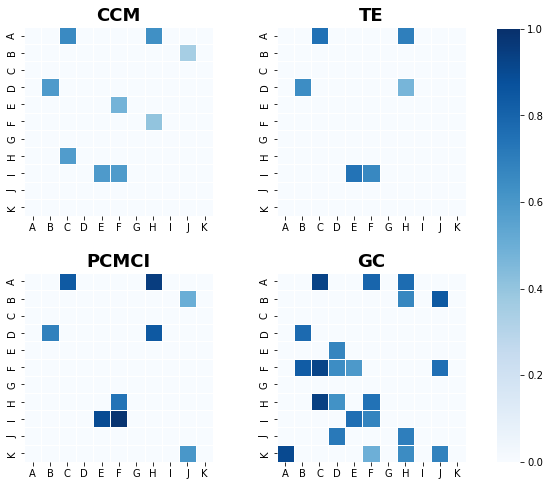

In [35]:
f, axes = plt.subplots(2, 2, figsize=(8,8))

f_1 = sns.heatmap(m_01, 
                  ax=axes[0][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_1.set_title('CCM', fontsize=18, fontweight='bold')

f_2 = sns.heatmap(m_02, 
                  ax=axes[0][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_2.set_title('TE', fontsize=18, fontweight='bold')

f_3 = sns.heatmap(m_03, 
                  ax=axes[1][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_3.set_title('PCMCI', fontsize=18, fontweight='bold')

cbar_ax = f.add_axes([.95, .125, .04, 0.752])
f_4 = sns.heatmap(m_04, 
                  ax=axes[1][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar_ax=cbar_ax, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_4.set_title('GC', fontsize=18, fontweight='bold')

plt.subplots_adjust(wspace=0.3, hspace=0.3)

In [36]:
score = ce.evaluation()
print('Normalized_score:')
print(score)

Normalized_score:
0.9045454545454545


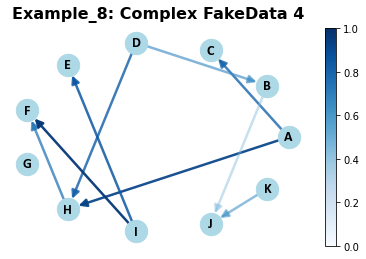

In [37]:
Graphic = causality_plotting(strength=strength_ensemble, 
                             feature_names=feature_names, 
                             title='Example_8: Complex FakeData 4', 
                             name_size='short',
                             node_color="lightblue", 
                             lay_out="circular_layout",
                             title_size=16,
                             seed=0)
plt.savefig('C:/Users/zhipe/OneDrive/Desktop/Master thesis/codes/examples/results/Example_8.jpg', 
            bbox_inches = 'tight',
            pad_inches=0.2,
            dpi=300)

Text(0.5, 1.0, 'True Result')

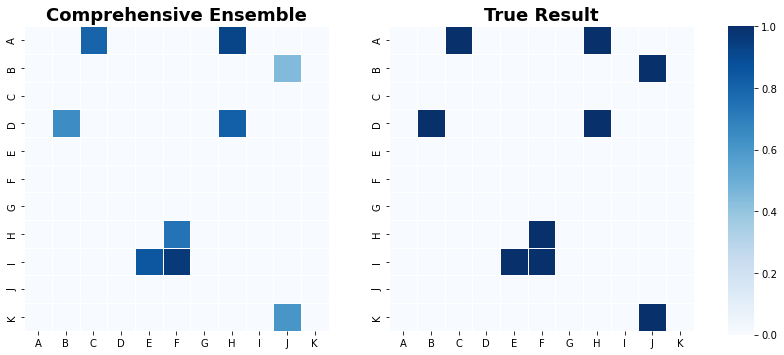

In [38]:
f_1, axes_1 = plt.subplots(1, 2, figsize=(12,12))
cbar_ax_1 = f_1.add_axes([.94, .322, .03, 0.357])
fig_0 = sns.heatmap(strength_ensemble, 
                    ax=axes_1[0], 
                    vmin=0, 
                    vmax=1, 
                    cmap='Blues', 
                    cbar=False, 
                    linewidths=.5, 
                    xticklabels=feature_names, 
                    yticklabels=feature_names, 
                    square=True)
fig_0.set_title('Comprehensive Ensemble', fontsize=18, fontweight='bold')
fig_1 = sns.heatmap(result, 
                    ax=axes_1[1], 
                    vmin=0, 
                    vmax=1, 
                    cmap='Blues', 
                    cbar_ax=cbar_ax_1, 
                    linewidths=.5, 
                    xticklabels=feature_names, 
                    yticklabels=feature_names, 
                    square=True)
fig_1.set_title('True Result', fontsize=18, fontweight='bold')